## Model Fitting

In [46]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import pyodbc
import missingno as mn
from scipy.stats import skew
from scipy.stats import kurtosis
import statsmodels.api as sm
import pylab as py
import import_ipynb
import Template as t
import Assignment_7_template as t2
import Template_2 as t3

In [47]:
df=t2.load_data('csv')

Enter path of filemodel_data.csv


In [48]:
df

,channel,lat,lng,shipped_quantity,unit_price,total_amount_expected,days_taken,delivery_time_hours,return,Category,Sub Category,order_day,r_day
0,CUSTOMER_APP,0.000000,0.00000,100,117000.0,11700000.0,10.0,7.916667,0,Oil aur Ghee,Oil,Wednesday,Saturday
1,CUSTOMER_APP,0.000000,0.00000,10,24000.0,240000.0,9.0,2.533333,0,Oil aur Ghee,Ghee,Thursday,Saturday
2,CUSTOMER_APP,0.000000,0.00000,50,64000.0,3200000.0,9.0,2.233333,0,Oil aur Ghee,Ghee,Thursday,Saturday
3,CUSTOMER_APP,0.000000,0.00000,100,128000.0,12800000.0,9.0,2.233333,0,Oil aur Ghee,Oil,Thursday,Saturday
4,CUSTOMER_APP,0.000000,0.00000,25,58000.0,1450000.0,9.0,2.233333,0,Oil aur Ghee,Oil,Thursday,Saturday
...,...,...,...,...,...,...,...,...,...,...,...,...,...
454799,CUSTOMER_APP,24.915066,67.02645,36,9180.0,330480.0,1.0,2.933333,0,Beverages,Sharbat,Saturday,Sunday
454800,CUSTOMER_APP,24.915066,67.02645,3,1260.0,3780.0,1.0,2.933333,0,Dairy,Tea Whiteners,Saturday,Sunday
454801,CUSTOMER_APP,24.915066,67.02645,5,1075.0,5375.0,1.0,2.933333,0,Dairy,Powder Milk,Saturday,Sunday
454802,CUSTOMER_APP,24.915066,67.02645,40,8480.0,339200.0,1.0,2.933333,0,Dairy,Liquid Milk,Saturday,Sunday


Label encoding the column channel

In [49]:
t2.encode(df,'channel')

Enter encode typelabel


,channel,lat,lng,shipped_quantity,unit_price,total_amount_expected,days_taken,delivery_time_hours,return,Category,Sub Category,order_day,r_day
0,2,0.000000,0.00000,100,117000.0,11700000.0,10.0,7.916667,0,Oil aur Ghee,Oil,Wednesday,Saturday
1,2,0.000000,0.00000,10,24000.0,240000.0,9.0,2.533333,0,Oil aur Ghee,Ghee,Thursday,Saturday
2,2,0.000000,0.00000,50,64000.0,3200000.0,9.0,2.233333,0,Oil aur Ghee,Ghee,Thursday,Saturday
3,2,0.000000,0.00000,100,128000.0,12800000.0,9.0,2.233333,0,Oil aur Ghee,Oil,Thursday,Saturday
4,2,0.000000,0.00000,25,58000.0,1450000.0,9.0,2.233333,0,Oil aur Ghee,Oil,Thursday,Saturday
...,...,...,...,...,...,...,...,...,...,...,...,...,...
454799,2,24.915066,67.02645,36,9180.0,330480.0,1.0,2.933333,0,Beverages,Sharbat,Saturday,Sunday
454800,2,24.915066,67.02645,3,1260.0,3780.0,1.0,2.933333,0,Dairy,Tea Whiteners,Saturday,Sunday
454801,2,24.915066,67.02645,5,1075.0,5375.0,1.0,2.933333,0,Dairy,Powder Milk,Saturday,Sunday
454802,2,24.915066,67.02645,40,8480.0,339200.0,1.0,2.933333,0,Dairy,Liquid Milk,Saturday,Sunday


In [50]:
df

,channel,lat,lng,shipped_quantity,unit_price,total_amount_expected,days_taken,delivery_time_hours,return,Category,Sub Category,order_day,r_day
0,2,0.000000,0.00000,100,117000.0,11700000.0,10.0,7.916667,0,Oil aur Ghee,Oil,Wednesday,Saturday
1,2,0.000000,0.00000,10,24000.0,240000.0,9.0,2.533333,0,Oil aur Ghee,Ghee,Thursday,Saturday
2,2,0.000000,0.00000,50,64000.0,3200000.0,9.0,2.233333,0,Oil aur Ghee,Ghee,Thursday,Saturday
3,2,0.000000,0.00000,100,128000.0,12800000.0,9.0,2.233333,0,Oil aur Ghee,Oil,Thursday,Saturday
4,2,0.000000,0.00000,25,58000.0,1450000.0,9.0,2.233333,0,Oil aur Ghee,Oil,Thursday,Saturday
...,...,...,...,...,...,...,...,...,...,...,...,...,...
454799,2,24.915066,67.02645,36,9180.0,330480.0,1.0,2.933333,0,Beverages,Sharbat,Saturday,Sunday
454800,2,24.915066,67.02645,3,1260.0,3780.0,1.0,2.933333,0,Dairy,Tea Whiteners,Saturday,Sunday
454801,2,24.915066,67.02645,5,1075.0,5375.0,1.0,2.933333,0,Dairy,Powder Milk,Saturday,Sunday
454802,2,24.915066,67.02645,40,8480.0,339200.0,1.0,2.933333,0,Dairy,Liquid Milk,Saturday,Sunday


Similarly Category and Sub Category have been label encoded

In [51]:
t2.encode(df,'Category')

Enter encode typelabel


,channel,lat,lng,shipped_quantity,unit_price,total_amount_expected,days_taken,delivery_time_hours,return,Category,Sub Category,order_day,r_day
0,2,0.000000,0.00000,100,117000.0,11700000.0,10.0,7.916667,0,18,Oil,Wednesday,Saturday
1,2,0.000000,0.00000,10,24000.0,240000.0,9.0,2.533333,0,18,Ghee,Thursday,Saturday
2,2,0.000000,0.00000,50,64000.0,3200000.0,9.0,2.233333,0,18,Ghee,Thursday,Saturday
3,2,0.000000,0.00000,100,128000.0,12800000.0,9.0,2.233333,0,18,Oil,Thursday,Saturday
4,2,0.000000,0.00000,25,58000.0,1450000.0,9.0,2.233333,0,18,Oil,Thursday,Saturday
...,...,...,...,...,...,...,...,...,...,...,...,...,...
454799,2,24.915066,67.02645,36,9180.0,330480.0,1.0,2.933333,0,3,Sharbat,Saturday,Sunday
454800,2,24.915066,67.02645,3,1260.0,3780.0,1.0,2.933333,0,12,Tea Whiteners,Saturday,Sunday
454801,2,24.915066,67.02645,5,1075.0,5375.0,1.0,2.933333,0,12,Powder Milk,Saturday,Sunday
454802,2,24.915066,67.02645,40,8480.0,339200.0,1.0,2.933333,0,12,Liquid Milk,Saturday,Sunday


In [52]:
t2.encode(df,'Sub Category')

Enter encode typelabel


,channel,lat,lng,shipped_quantity,unit_price,total_amount_expected,days_taken,delivery_time_hours,return,Category,Sub Category,order_day,r_day
0,2,0.000000,0.00000,100,117000.0,11700000.0,10.0,7.916667,0,18,35,Wednesday,Saturday
1,2,0.000000,0.00000,10,24000.0,240000.0,9.0,2.533333,0,18,22,Thursday,Saturday
2,2,0.000000,0.00000,50,64000.0,3200000.0,9.0,2.233333,0,18,22,Thursday,Saturday
3,2,0.000000,0.00000,100,128000.0,12800000.0,9.0,2.233333,0,18,35,Thursday,Saturday
4,2,0.000000,0.00000,25,58000.0,1450000.0,9.0,2.233333,0,18,35,Thursday,Saturday
...,...,...,...,...,...,...,...,...,...,...,...,...,...
454799,2,24.915066,67.02645,36,9180.0,330480.0,1.0,2.933333,0,3,42,Saturday,Sunday
454800,2,24.915066,67.02645,3,1260.0,3780.0,1.0,2.933333,0,12,49,Saturday,Sunday
454801,2,24.915066,67.02645,5,1075.0,5375.0,1.0,2.933333,0,12,37,Saturday,Sunday
454802,2,24.915066,67.02645,40,8480.0,339200.0,1.0,2.933333,0,12,28,Saturday,Sunday


Order day and r_day have been encoded using ordinal encoding

In [53]:
t2.encode(df,'order_day')

Enter encode typeordinal
order_day
enter a number of unique values present in the column: 7
Unique value for the columnMonday
Enter ordinal number for the value1
Unique value for the columnTuesday
Enter ordinal number for the value2
Unique value for the columnWednesday
Enter ordinal number for the value3
Unique value for the columnThursday
Enter ordinal number for the value4
Unique value for the columnFriday
Enter ordinal number for the value5
Unique value for the columnSaturday
Enter ordinal number for the value6
Unique value for the columnSunday
Enter ordinal number for the value7


,channel,lat,lng,shipped_quantity,unit_price,total_amount_expected,days_taken,delivery_time_hours,return,Category,Sub Category,order_day,r_day
0,2,0.000000,0.00000,100,117000.0,11700000.0,10.0,7.916667,0,18,35,3,Saturday
1,2,0.000000,0.00000,10,24000.0,240000.0,9.0,2.533333,0,18,22,4,Saturday
2,2,0.000000,0.00000,50,64000.0,3200000.0,9.0,2.233333,0,18,22,4,Saturday
3,2,0.000000,0.00000,100,128000.0,12800000.0,9.0,2.233333,0,18,35,4,Saturday
4,2,0.000000,0.00000,25,58000.0,1450000.0,9.0,2.233333,0,18,35,4,Saturday
...,...,...,...,...,...,...,...,...,...,...,...,...,...
454799,2,24.915066,67.02645,36,9180.0,330480.0,1.0,2.933333,0,3,42,6,Sunday
454800,2,24.915066,67.02645,3,1260.0,3780.0,1.0,2.933333,0,12,49,6,Sunday
454801,2,24.915066,67.02645,5,1075.0,5375.0,1.0,2.933333,0,12,37,6,Sunday
454802,2,24.915066,67.02645,40,8480.0,339200.0,1.0,2.933333,0,12,28,6,Sunday


In [54]:
t2.encode(df,'r_day')

Enter encode typeordinal
r_day
enter a number of unique values present in the column: 7
Unique value for the columnMonday
Enter ordinal number for the value1
Unique value for the columnTuesday
Enter ordinal number for the value2
Unique value for the columnWednesday
Enter ordinal number for the value3
Unique value for the columnThursday
Enter ordinal number for the value4
Unique value for the columnFriday
Enter ordinal number for the value5
Unique value for the columnSaturday
Enter ordinal number for the value6
Unique value for the columnSunday
Enter ordinal number for the value7


,channel,lat,lng,shipped_quantity,unit_price,total_amount_expected,days_taken,delivery_time_hours,return,Category,Sub Category,order_day,r_day
0,2,0.000000,0.00000,100,117000.0,11700000.0,10.0,7.916667,0,18,35,3,6
1,2,0.000000,0.00000,10,24000.0,240000.0,9.0,2.533333,0,18,22,4,6
2,2,0.000000,0.00000,50,64000.0,3200000.0,9.0,2.233333,0,18,22,4,6
3,2,0.000000,0.00000,100,128000.0,12800000.0,9.0,2.233333,0,18,35,4,6
4,2,0.000000,0.00000,25,58000.0,1450000.0,9.0,2.233333,0,18,35,4,6
...,...,...,...,...,...,...,...,...,...,...,...,...,...
454799,2,24.915066,67.02645,36,9180.0,330480.0,1.0,2.933333,0,3,42,6,7
454800,2,24.915066,67.02645,3,1260.0,3780.0,1.0,2.933333,0,12,49,6,7
454801,2,24.915066,67.02645,5,1075.0,5375.0,1.0,2.933333,0,12,37,6,7
454802,2,24.915066,67.02645,40,8480.0,339200.0,1.0,2.933333,0,12,28,6,7


In [55]:
df.to_csv('encoded_data.csv',index=False)

In [8]:
df=pd.read_csv('encoded_data.csv')

In [3]:
x=df.drop(['return'],axis=1)
y=df['return']

In [8]:
from sklearn import tree
clf = tree.DecisionTreeClassifier(max_depth=3)
clf = clf.fit(x,y)



In [5]:
fn=list(x.columns)
cn=['0','1']

In [19]:
conda install python-graphviz

Solving environment: ...working... done

Note: you may need to restart the kernel to use updated packages.


In [13]:
from sklearn.tree import export_graphviz
export_graphviz(clf, 'tree.dot', feature_names = fn,filled=True, rounded=True,special_characters=True)  

In [14]:
! dot -Tpng tree.dot -o tree.png

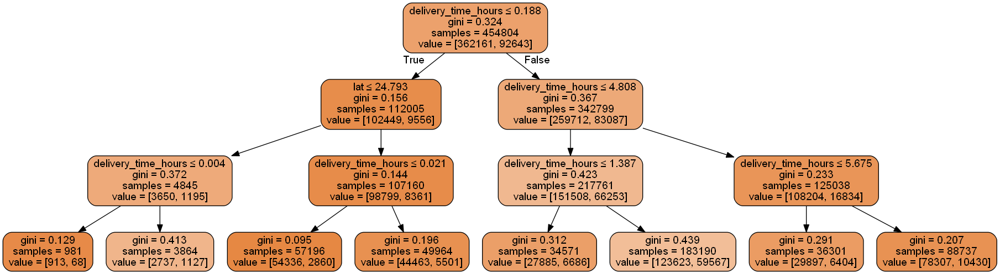

Until a depth of 3 the decision tree has not yet adequately separated the two classes in the target variable and increasing the depth will cause the tree to become incomprehensible. However it can be concluded that delivery time in hours is the best feature 

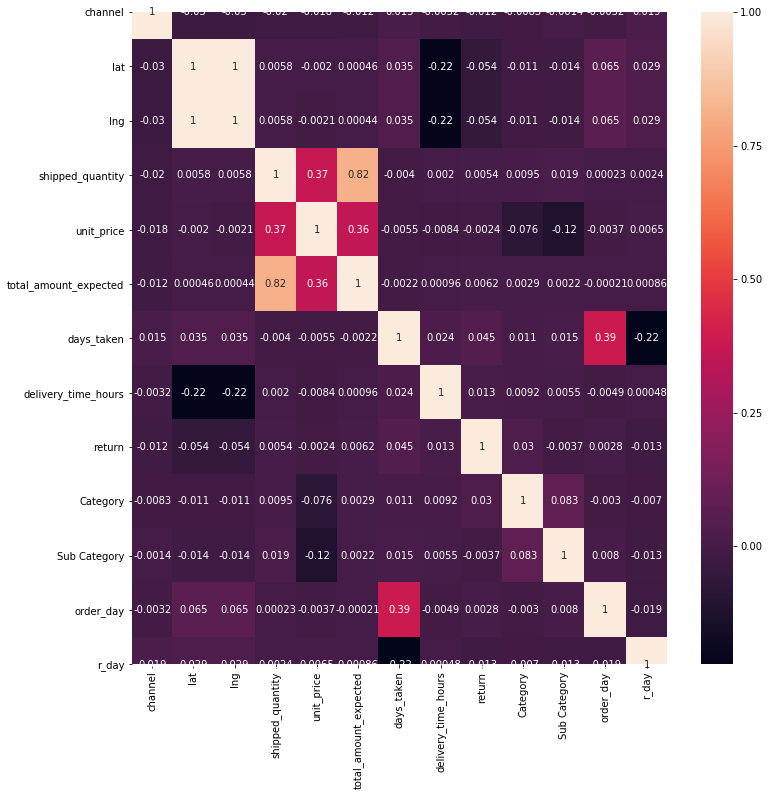

In [3]:
t.corr_heatmap(df)

Total amount expected and shipped quantity are highly correlated

In [3]:
df.dtypes

channel                    int64
lat                      float64
lng                      float64
shipped_quantity           int64
unit_price               float64
total_amount_expected    float64
days_taken               float64
delivery_time_hours      float64
return                     int64
Category                   int64
Sub Category               int64
order_day                  int64
r_day                      int64
dtype: object

Running models without outliers handling

E:\ProgramData\Anaconda3\lib\site-packages\sklearn\utils\deprecation.py:143: FutureWarning: The sklearn.metrics.classification module is  deprecated in version 0.22 and will be removed in version 0.24. The corresponding classes / functions should instead be imported from sklearn.metrics. Anything that cannot be imported from sklearn.metrics is now part of the private API.
  warnings.warn(message, FutureWarning)


---------Logistic Regression------------
Accuracy  (%): 
 79.57806092721056
AUC  (%): 
 50.02558125837513
Precision: 
 32.78688524590164
Recall (%): 
 0.10778765831312315
f1 score (%): 
 0.21486892995272885
logistic loss :
 7.053488232268284
              precision    recall  f1-score   support

           0       0.80      1.00      0.89     72406
           1       0.33      0.00      0.00     18555

    accuracy                           0.80     90961
   macro avg       0.56      0.50      0.44     90961
weighted avg       0.70      0.80      0.71     90961



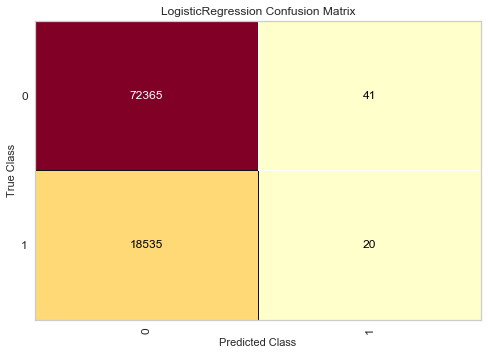

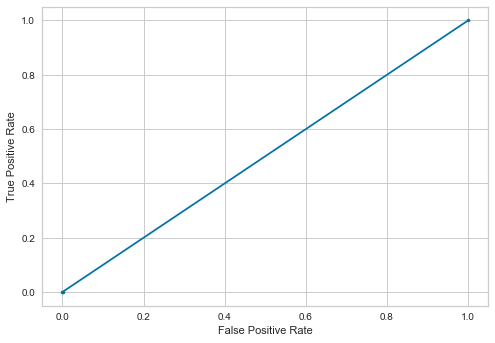

---------Nearest Neighbors------------
Accuracy  (%): 
 80.02770418091269
AUC  (%): 
 62.5372844984649
Precision: 
 51.63630229419704
Recall (%): 
 32.993802209646994
f1 score (%): 
 40.261747394035055
logistic loss :
 6.8982369989117
              precision    recall  f1-score   support

           0       0.84      0.92      0.88     72406
           1       0.52      0.33      0.40     18555

    accuracy                           0.80     90961
   macro avg       0.68      0.63      0.64     90961
weighted avg       0.78      0.80      0.78     90961



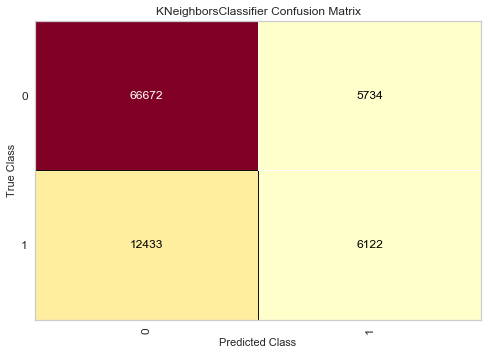

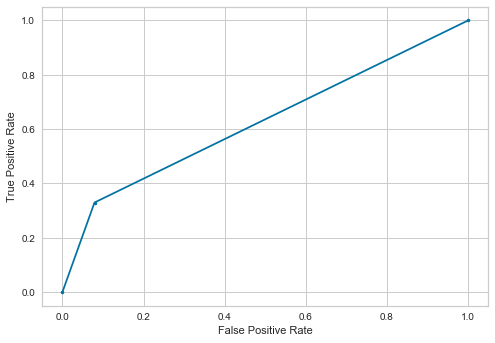

---------Decision Tree------------
Accuracy  (%): 
 86.19958003979727
AUC  (%): 
 79.10024726360196
Precision: 
 65.87662681197757
Recall (%): 
 67.10859606575048
f1 score (%): 
 66.48690498438208
logistic loss :
 4.766552890675549
              precision    recall  f1-score   support

           0       0.92      0.91      0.91     72406
           1       0.66      0.67      0.66     18555

    accuracy                           0.86     90961
   macro avg       0.79      0.79      0.79     90961
weighted avg       0.86      0.86      0.86     90961



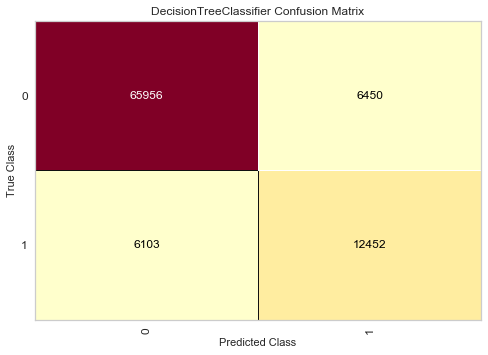

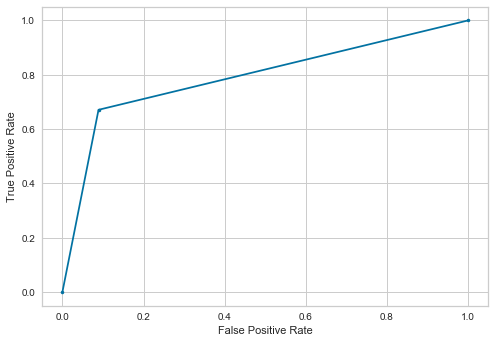

---------Naive Bayes------------
Accuracy  (%): 
 79.15810072448632
AUC  (%): 
 50.35100840433648
Precision: 
 30.455868089233757
Recall (%): 
 1.6922662355160334
f1 score (%): 
 3.2063718982947
logistic loss :
 7.198543290048198
              precision    recall  f1-score   support

           0       0.80      0.99      0.88     72406
           1       0.30      0.02      0.03     18555

    accuracy                           0.79     90961
   macro avg       0.55      0.50      0.46     90961
weighted avg       0.70      0.79      0.71     90961



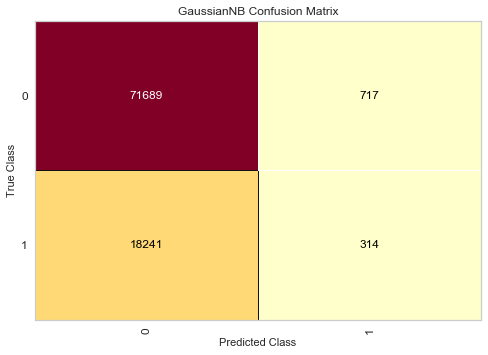

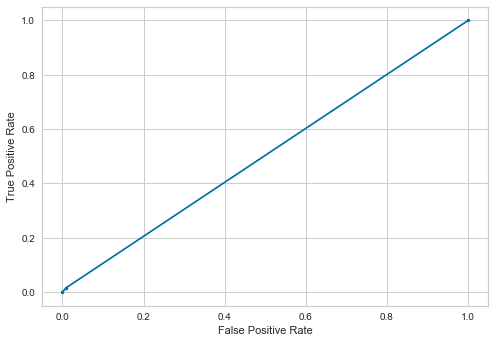

---------Random Forest------------
Accuracy  (%): 
 87.36271588922725
AUC  (%): 
 72.990716634224
Precision: 
 82.0384824832093
Recall (%): 
 48.71463217461601
f1 score (%): 
 61.13008487471681
logistic loss :
 4.3647806979124315
              precision    recall  f1-score   support

           0       0.88      0.97      0.92     72406
           1       0.82      0.49      0.61     18555

    accuracy                           0.87     90961
   macro avg       0.85      0.73      0.77     90961
weighted avg       0.87      0.87      0.86     90961



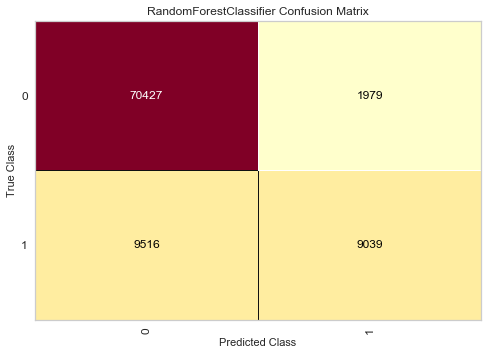

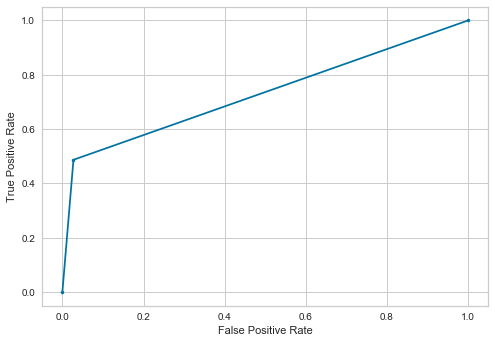

---------xgboost------------
Accuracy  (%): 
 82.92125196512791
AUC  (%): 
 60.380601926769515
Precision: 
 78.7181437809053
Recall (%): 
 22.306655887900835
f1 score (%): 
 34.762524671397976
logistic loss :
 5.898800431442727
              precision    recall  f1-score   support

           0       0.83      0.98      0.90     72406
           1       0.79      0.22      0.35     18555

    accuracy                           0.83     90961
   macro avg       0.81      0.60      0.62     90961
weighted avg       0.82      0.83      0.79     90961



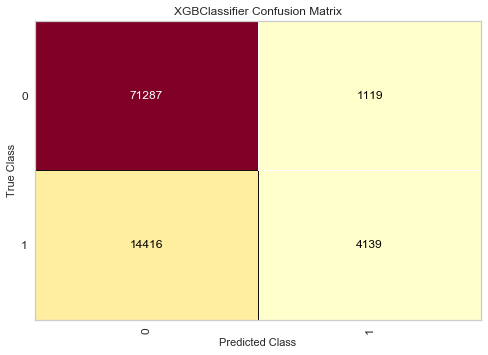

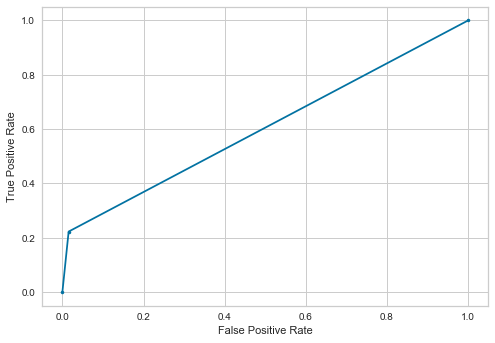

---------Ada Boost------------
Accuracy  (%): 
 79.59565088334561
AUC  (%): 
 50.66793446603862
Precision: 
 49.629629629629626
Recall (%): 
 1.8054432767448128
f1 score (%): 
 3.4841393655746224
logistic loss :
 7.047415505025985
              precision    recall  f1-score   support

           0       0.80      1.00      0.89     72406
           1       0.50      0.02      0.03     18555

    accuracy                           0.80     90961
   macro avg       0.65      0.51      0.46     90961
weighted avg       0.74      0.80      0.71     90961



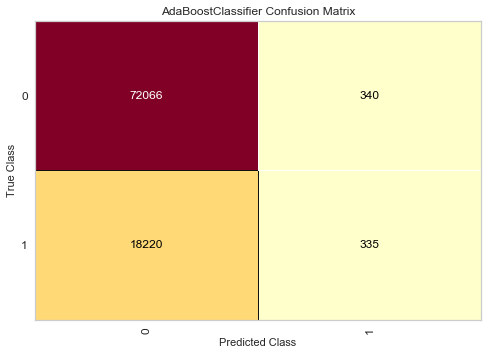

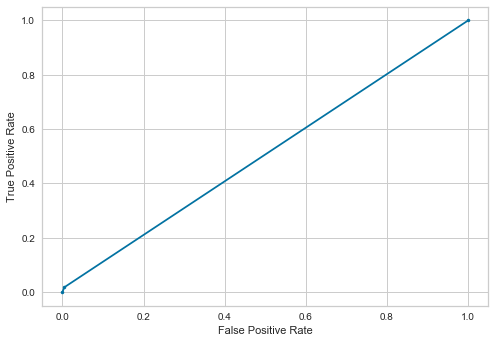

---------SVM------------
Accuracy  (%): 
 79.58245841624432
AUC  (%): 
 50.02834346040259
Precision: 
 35.08771929824561
Recall (%): 
 0.10778765831312315
f1 score (%): 
 0.2149151085321298
logistic loss :
 7.051969358201714
              precision    recall  f1-score   support

           0       0.80      1.00      0.89     72406
           1       0.35      0.00      0.00     18555

    accuracy                           0.80     90961
   macro avg       0.57      0.50      0.44     90961
weighted avg       0.71      0.80      0.71     90961



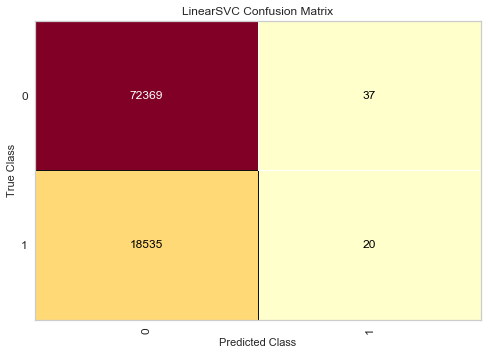

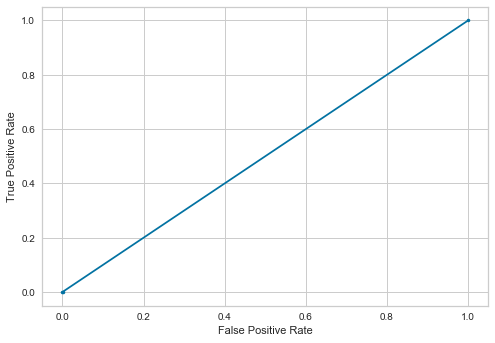

---------MLP Classifier------------
Accuracy  (%): 
 79.67040819691957
AUC  (%): 
 50.857185908023816
Precision: 
 54.20560747663551
Recall (%): 
 2.1880894637564
f1 score (%): 
 4.20638209697472
logistic loss :
 7.021595270023492
              precision    recall  f1-score   support

           0       0.80      1.00      0.89     72406
           1       0.54      0.02      0.04     18555

    accuracy                           0.80     90961
   macro avg       0.67      0.51      0.46     90961
weighted avg       0.75      0.80      0.71     90961



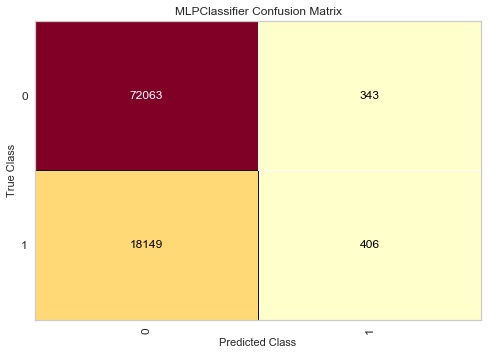

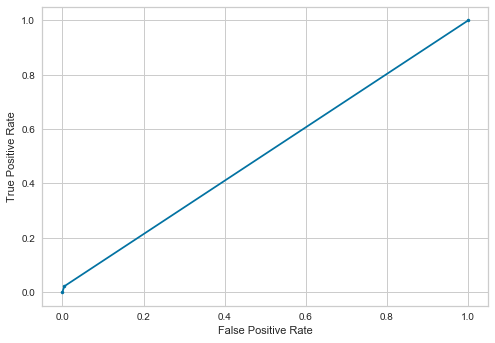

---------light Gradient Boosting------------
Accuracy  (%): 
 80.99515176834028
AUC  (%): 
 54.77768047423057
Precision: 
 74.14318354912415
Recall (%): 
 10.493128536782539
f1 score (%): 
 18.38440111420613
logistic loss :
 6.564048003710118
              precision    recall  f1-score   support

           0       0.81      0.99      0.89     72406
           1       0.74      0.10      0.18     18555

    accuracy                           0.81     90961
   macro avg       0.78      0.55      0.54     90961
weighted avg       0.80      0.81      0.75     90961



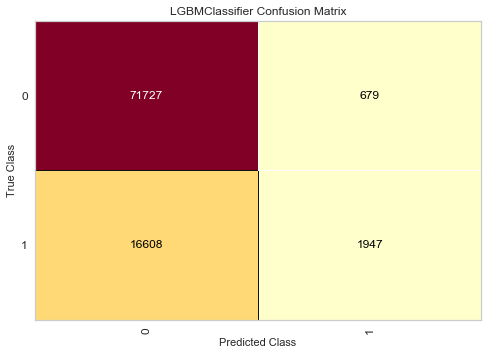

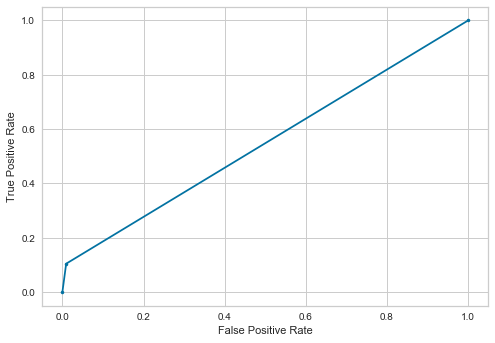

---------Gradient Boosting Classifier------------
Accuracy  (%): 
 79.85730148085443
AUC  (%): 
 51.17499358928712
Precision: 
 64.95507060333762
Recall (%): 
 2.7270277553220157
f1 score (%): 
 5.234302265439124
logistic loss :
 6.957044001249458
              precision    recall  f1-score   support

           0       0.80      1.00      0.89     72406
           1       0.65      0.03      0.05     18555

    accuracy                           0.80     90961
   macro avg       0.72      0.51      0.47     90961
weighted avg       0.77      0.80      0.72     90961



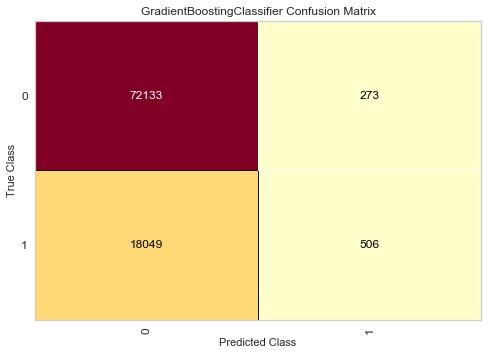

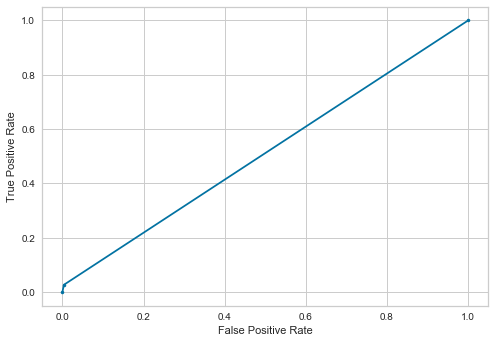

,classifier,Precision,Recall,AUC,Accuracy
0,Logistic Regression,32.786885,0.107788,50.025581,79.578061
1,Nearest Neighbors,51.636302,32.993802,62.537284,80.027704
2,Decision Tree,65.876627,67.108596,79.100247,86.199580
3,Naive Bayes,30.455868,1.692266,50.351008,79.158101
4,Random Forest,82.038482,48.714632,72.990717,87.362716
5,xgboost,78.718144,22.306656,60.380602,82.921252
6,Ada Boost,49.629630,1.805443,50.667934,79.595651
7,SVM,35.087719,0.107788,50.028343,79.582458
8,MLP Classifier,54.205607,2.188089,50.857186,79.670408
9,light Gradient Boosting,74.143184,10.493129,54.777680,80.995152


,classifier,Precision,Recall,AUC,Accuracy
0,Logistic Regression,32.786885,0.107788,50.025581,79.578061
1,Nearest Neighbors,51.636302,32.993802,62.537284,80.027704
2,Decision Tree,65.876627,67.108596,79.100247,86.199580
3,Naive Bayes,30.455868,1.692266,50.351008,79.158101
4,Random Forest,82.038482,48.714632,72.990717,87.362716
5,xgboost,78.718144,22.306656,60.380602,82.921252
6,Ada Boost,49.629630,1.805443,50.667934,79.595651
7,SVM,35.087719,0.107788,50.028343,79.582458
8,MLP Classifier,54.205607,2.188089,50.857186,79.670408
9,light Gradient Boosting,74.143184,10.493129,54.777680,80.995152


In [3]:
t3.fit_model(df,'return',classification=True)

In [9]:
df2=t3.deep_copy(df)

Removing shipped quantity as it is highly correlated with total amount expected

In [10]:
t.remove_cols(df2,'shipped_quantity')

---------Logistic Regression------------
Accuracy  (%): 
 79.57806092721056
AUC  (%): 
 50.02558125837513
Precision: 
 32.78688524590164
Recall (%): 
 0.10778765831312315
f1 score (%): 
 0.21486892995272885
logistic loss :
 7.053488232268284
              precision    recall  f1-score   support

           0       0.80      1.00      0.89     72406
           1       0.33      0.00      0.00     18555

    accuracy                           0.80     90961
   macro avg       0.56      0.50      0.44     90961
weighted avg       0.70      0.80      0.71     90961



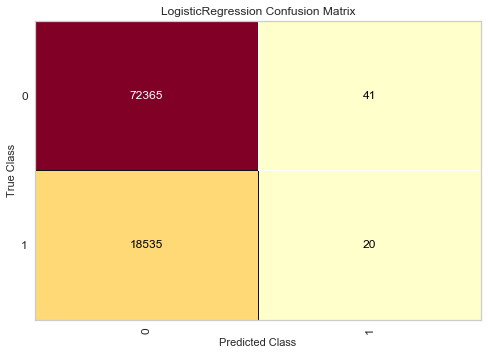

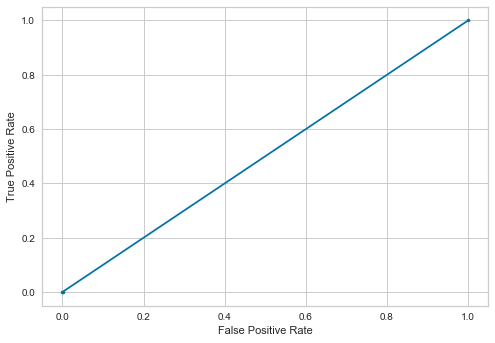

---------Nearest Neighbors------------
Accuracy  (%): 
 80.35091962489419
AUC  (%): 
 63.299461672801904
Precision: 
 52.81353135313531
Recall (%): 
 34.49744004311506
f1 score (%): 
 41.734311328443354
logistic loss :
 6.78660220758283
              precision    recall  f1-score   support

           0       0.85      0.92      0.88     72406
           1       0.53      0.34      0.42     18555

    accuracy                           0.80     90961
   macro avg       0.69      0.63      0.65     90961
weighted avg       0.78      0.80      0.79     90961



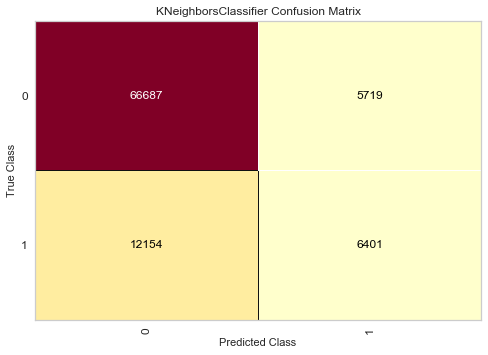

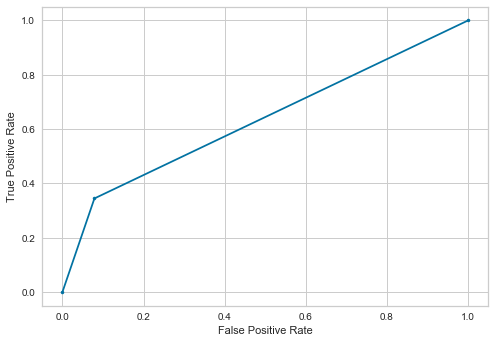

---------Decision Tree------------
Accuracy  (%): 
 86.60085091412803
AUC  (%): 
 79.58678268987015
Precision: 
 66.95967183421236
Recall (%): 
 67.73915386688223
f1 score (%): 
 67.34715747736162
logistic loss :
 4.627956660595569
              precision    recall  f1-score   support

           0       0.92      0.91      0.92     72406
           1       0.67      0.68      0.67     18555

    accuracy                           0.87     90961
   macro avg       0.79      0.80      0.79     90961
weighted avg       0.87      0.87      0.87     90961



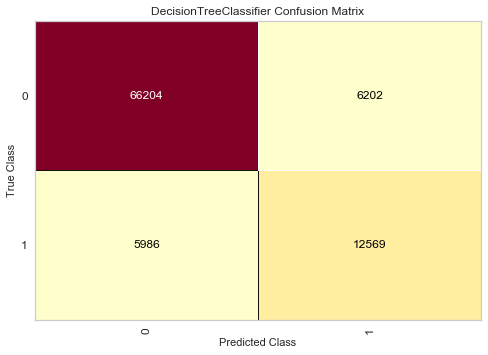

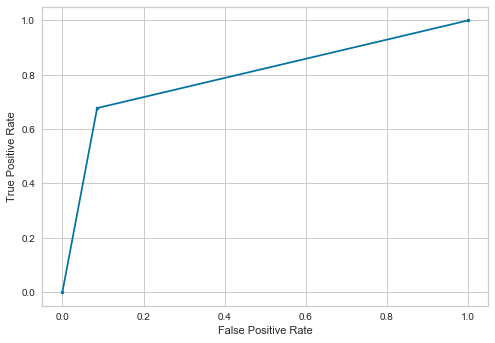

---------Naive Bayes------------
Accuracy  (%): 
 79.25374611097064
AUC  (%): 
 50.37701590226726
Precision: 
 32.637362637362635
Recall (%): 
 1.6006467259498787
f1 score (%): 
 3.051631132802466
logistic loss :
 7.165507629660891
              precision    recall  f1-score   support

           0       0.80      0.99      0.88     72406
           1       0.33      0.02      0.03     18555

    accuracy                           0.79     90961
   macro avg       0.56      0.50      0.46     90961
weighted avg       0.70      0.79      0.71     90961



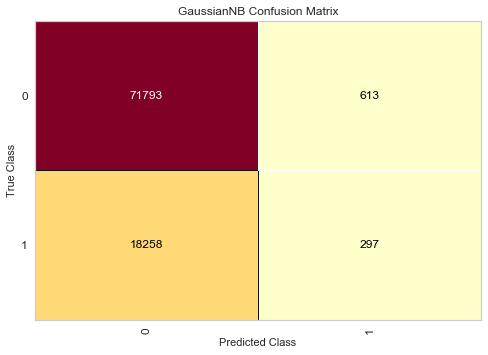

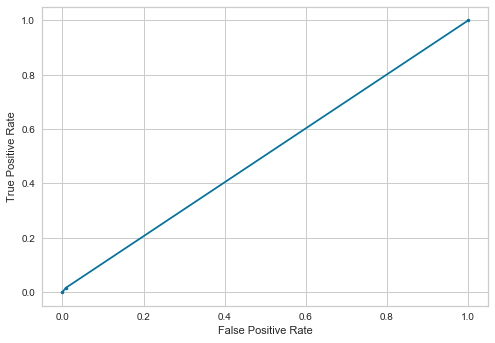

---------Random Forest------------
Accuracy  (%): 
 88.30817603148601
AUC  (%): 
 75.0997206290559
Precision: 
 83.9331619537275
Recall (%): 
 52.78900565885206
f1 score (%): 
 64.81389578163773
logistic loss :
 4.038229419257228
              precision    recall  f1-score   support

           0       0.89      0.97      0.93     72406
           1       0.84      0.53      0.65     18555

    accuracy                           0.88     90961
   macro avg       0.86      0.75      0.79     90961
weighted avg       0.88      0.88      0.87     90961



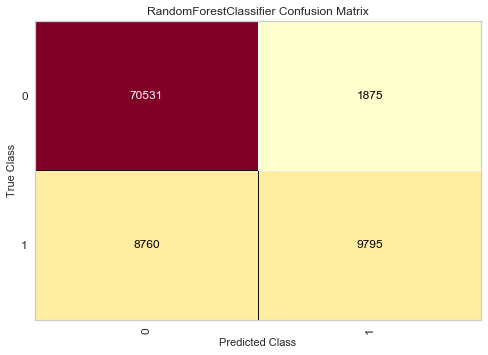

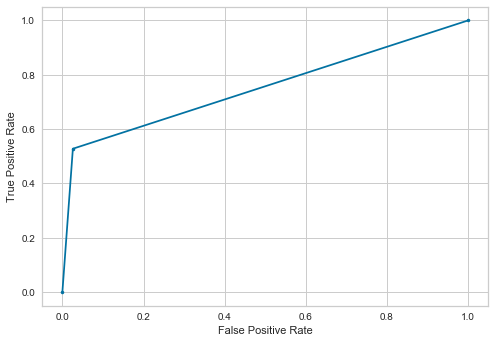

---------xgboost------------
Accuracy  (%): 
 82.6980793966645
AUC  (%): 
 59.73938493613511
Precision: 
 78.39145333602097
Recall (%): 
 20.959310158986796
f1 score (%): 
 33.075352951182175
logistic loss :
 5.975881092683123
              precision    recall  f1-score   support

           0       0.83      0.99      0.90     72406
           1       0.78      0.21      0.33     18555

    accuracy                           0.83     90961
   macro avg       0.81      0.60      0.62     90961
weighted avg       0.82      0.83      0.78     90961



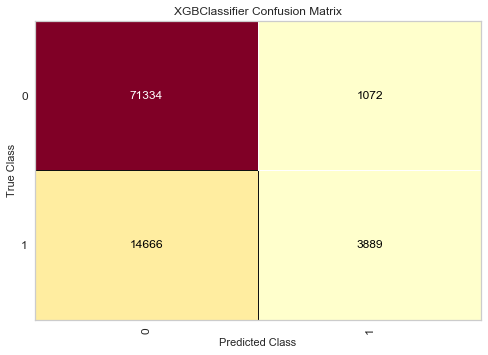

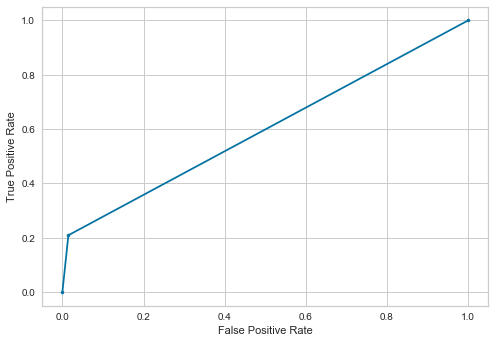

---------Ada Boost------------
Accuracy  (%): 
 79.60114774463781
AUC  (%): 
 50.70345347378837
Precision: 
 50.0
Recall (%): 
 1.8916734033953113
f1 score (%): 
 3.6454276367035363
logistic loss :
 7.045517053091609
              precision    recall  f1-score   support

           0       0.80      1.00      0.89     72406
           1       0.50      0.02      0.04     18555

    accuracy                           0.80     90961
   macro avg       0.65      0.51      0.46     90961
weighted avg       0.74      0.80      0.71     90961



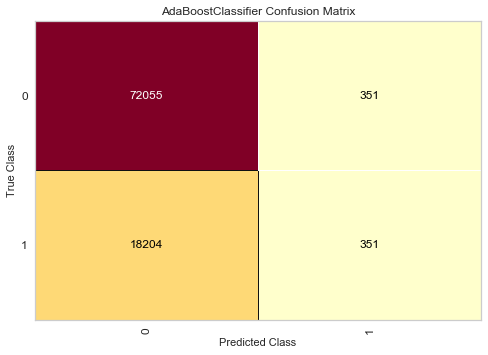

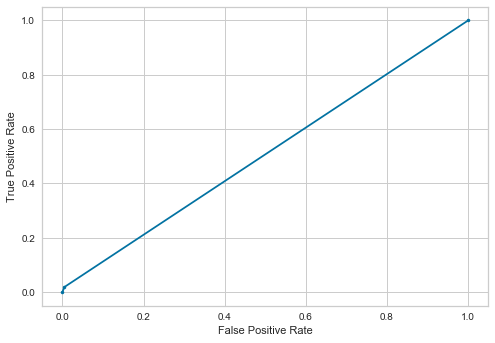

---------SVM------------
Accuracy  (%): 
 79.579160299469
AUC  (%): 
 50.026271808881994
Precision: 
 33.33333333333333
Recall (%): 
 0.10778765831312315
f1 score (%): 
 0.21488047273704003
logistic loss :
 7.053108513751643
              precision    recall  f1-score   support

           0       0.80      1.00      0.89     72406
           1       0.33      0.00      0.00     18555

    accuracy                           0.80     90961
   macro avg       0.56      0.50      0.44     90961
weighted avg       0.70      0.80      0.71     90961



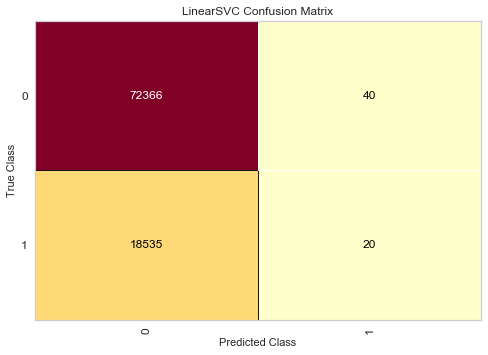

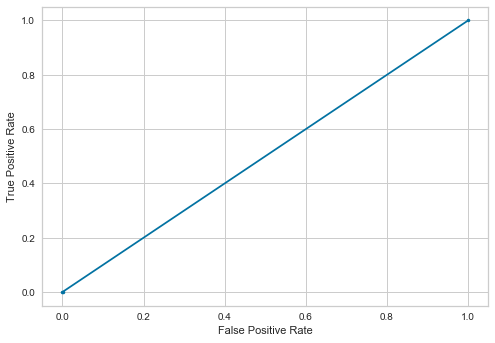

---------MLP Classifier------------
Accuracy  (%): 
 79.65171886852606
AUC  (%): 
 50.436601795410475
Precision: 
 56.424581005586596
Recall (%): 
 1.0886553489625437
f1 score (%): 
 2.1360968645904936
logistic loss :
 7.028048691533745
              precision    recall  f1-score   support

           0       0.80      1.00      0.89     72406
           1       0.56      0.01      0.02     18555

    accuracy                           0.80     90961
   macro avg       0.68      0.50      0.45     90961
weighted avg       0.75      0.80      0.71     90961



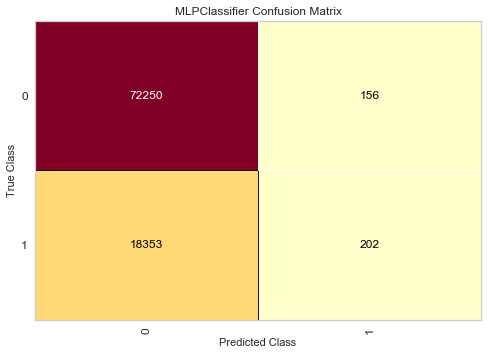

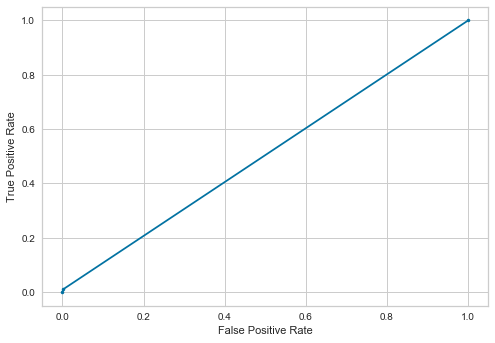

---------light Gradient Boosting------------
Accuracy  (%): 
 81.01933795802597
AUC  (%): 
 54.87704650532207
Precision: 
 73.99553571428571
Recall (%): 
 10.719482619240097
f1 score (%): 
 18.726168620251375
logistic loss :
 6.555694565547175
              precision    recall  f1-score   support

           0       0.81      0.99      0.89     72406
           1       0.74      0.11      0.19     18555

    accuracy                           0.81     90961
   macro avg       0.78      0.55      0.54     90961
weighted avg       0.80      0.81      0.75     90961



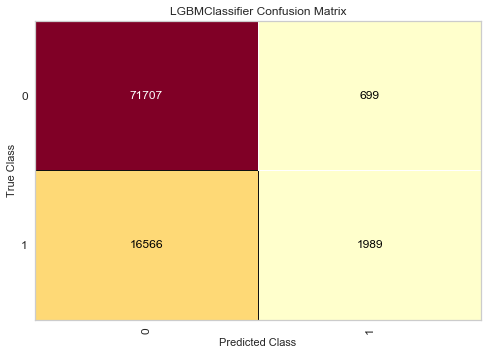

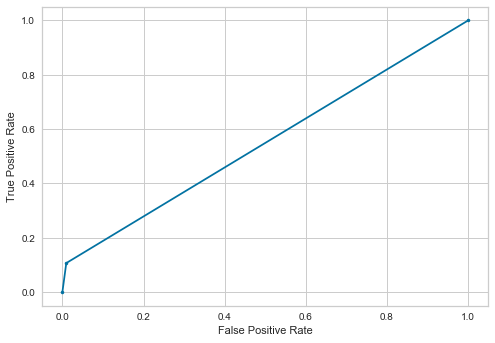

---------Gradient Boosting Classifier------------
Accuracy  (%): 
 79.86389771440507
AUC  (%): 
 51.11500438189744
Precision: 
 66.85472496473906
Recall (%): 
 2.5545675020210186
f1 score (%): 
 4.9210963455149495
logistic loss :
 6.9547654088519275
              precision    recall  f1-score   support

           0       0.80      1.00      0.89     72406
           1       0.67      0.03      0.05     18555

    accuracy                           0.80     90961
   macro avg       0.73      0.51      0.47     90961
weighted avg       0.77      0.80      0.72     90961



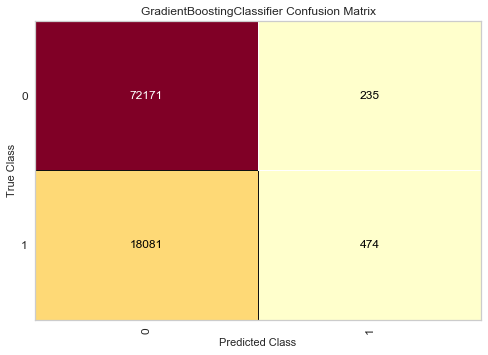

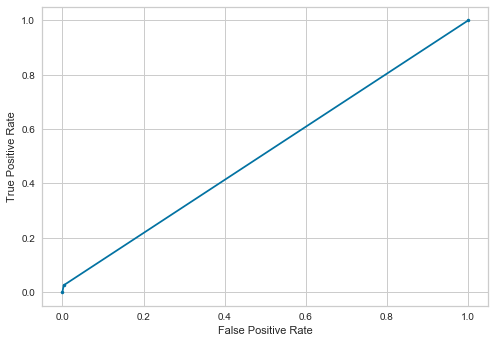

,classifier,Precision,Recall,AUC,Accuracy
0,Logistic Regression,32.786885,0.107788,50.025581,79.578061
1,Nearest Neighbors,52.813531,34.497440,63.299462,80.350920
2,Decision Tree,66.959672,67.739154,79.586783,86.600851
3,Naive Bayes,32.637363,1.600647,50.377016,79.253746
4,Random Forest,83.933162,52.789006,75.099721,88.308176
5,xgboost,78.391453,20.959310,59.739385,82.698079
6,Ada Boost,50.000000,1.891673,50.703453,79.601148
7,SVM,33.333333,0.107788,50.026272,79.579160
8,MLP Classifier,56.424581,1.088655,50.436602,79.651719
9,light Gradient Boosting,73.995536,10.719483,54.877047,81.019338


,classifier,Precision,Recall,AUC,Accuracy
0,Logistic Regression,32.786885,0.107788,50.025581,79.578061
1,Nearest Neighbors,52.813531,34.497440,63.299462,80.350920
2,Decision Tree,66.959672,67.739154,79.586783,86.600851
3,Naive Bayes,32.637363,1.600647,50.377016,79.253746
4,Random Forest,83.933162,52.789006,75.099721,88.308176
5,xgboost,78.391453,20.959310,59.739385,82.698079
6,Ada Boost,50.000000,1.891673,50.703453,79.601148
7,SVM,33.333333,0.107788,50.026272,79.579160
8,MLP Classifier,56.424581,1.088655,50.436602,79.651719
9,light Gradient Boosting,73.995536,10.719483,54.877047,81.019338


In [6]:
t3.fit_model(df2,'return',classification=True)

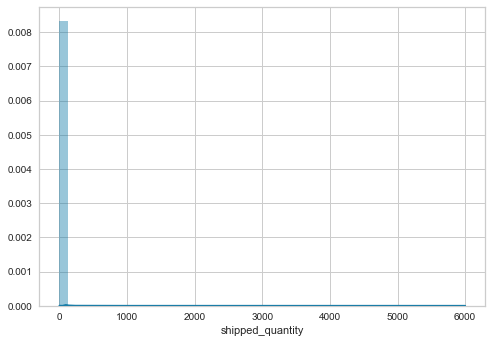

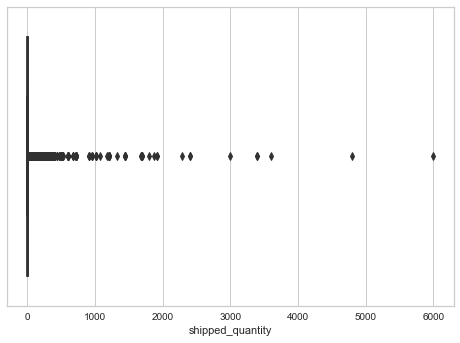

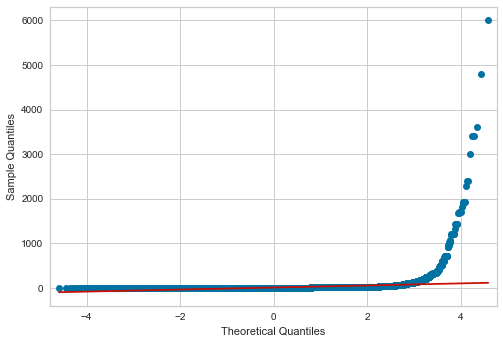

count    454804.000000
mean          4.099049
std          23.036212
min           1.000000
25%           1.000000
50%           2.000000
75%           4.000000
max        6000.000000
Name: shipped_quantity, dtype: float64

Skew is 112.935705281037
Kurtosis is 20146.191649938704
Cannot be considered normally distributed on the basis of skewness and kurtosis


Shapiro Wilk Test for Normality
stat=0.057,p=0.000

Not Normally distributed according to shapiro test


Anderson Test for Normality
stat=128743.252
Probably Not Normally distributed 0.576 critical value at 15.0 level of significance
Probably Not Normally distributed 0.656 critical value at 10.0 level of significance
Probably Not Normally distributed 0.787 critical value at 5.0 level of significance
Probably Not Normally distributed 0.918 critical value at 2.5 level of significance
Probably Not Normally distributed 1.092 critical value at 1.0 level of significance


Chi square Normality test
stat=58879256.792,p=0.000

Not Normally distributed according to chisquare test


Lilliefors Test for Normality
stat=0.446,p=0.000

Not Normally distributed according to lilliefors test


Kolmogorov-Smirnov test
stat=0.841,p=0.000

Not normally distributed accord

In [30]:
t2.numerical_analysis(df2,'shipped_quantity')

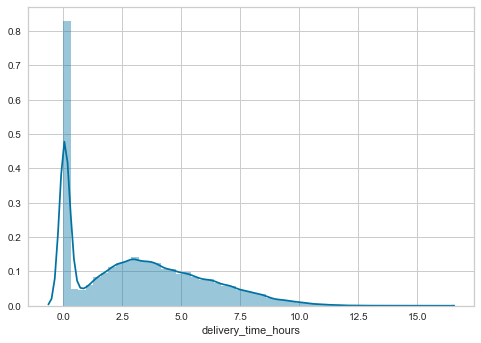

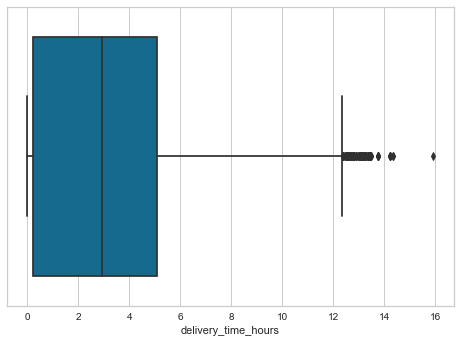

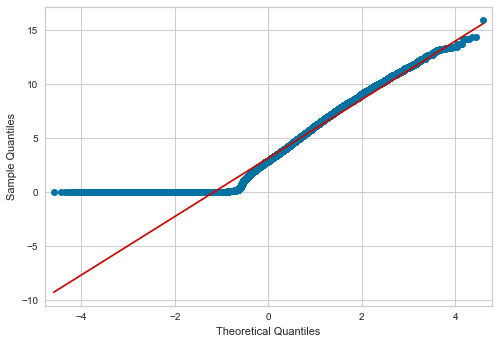

count    454804.000000
mean          3.182537
std           2.711310
min           0.000000
25%           0.200000
50%           2.933333
75%           5.068750
max          15.933333
Name: delivery_time_hours, dtype: float64

Skew is 0.5493304601156268
Kurtosis is -0.48931631506934226
Can be considered normally distributed on the basis of skewness and kurtosis


Shapiro Wilk Test for Normality
stat=0.926,p=0.000

Not Normally distributed according to shapiro test


Anderson Test for Normality
stat=9084.282
Probably Not Normally distributed 0.576 critical value at 15.0 level of significance
Probably Not Normally distributed 0.656 critical value at 10.0 level of significance
Probably Not Normally distributed 0.787 critical value at 5.0 level of significance
Probably Not Normally distributed 0.918 critical value at 2.5 level of significance
Probably Not Normally distributed 1.092 critical value at 1.0 level of significance


Chi square Normality test
stat=1050529.223,p=0.000

Not Normally distributed according to chisquare test


Lilliefors Test for Normality
stat=0.120,p=0.000

Not Normally distributed according to lilliefors test


Kolmogorov-Smirnov test
stat=0.606,p=0.000

Not normally distributed accordin

In [15]:
t2.numerical_analysis(df2,'delivery_time_hours')

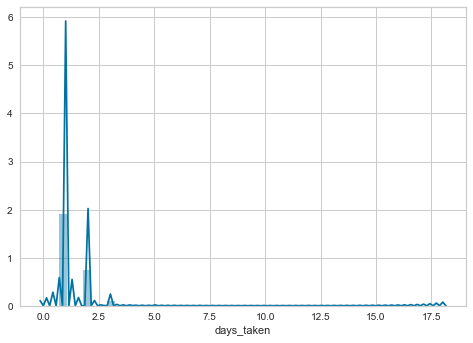

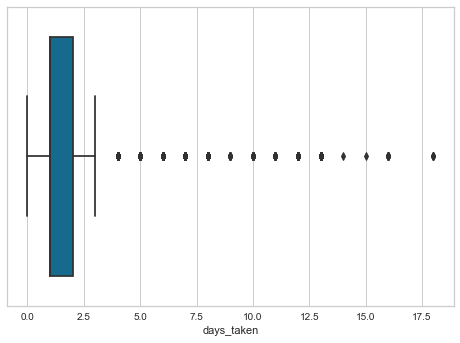

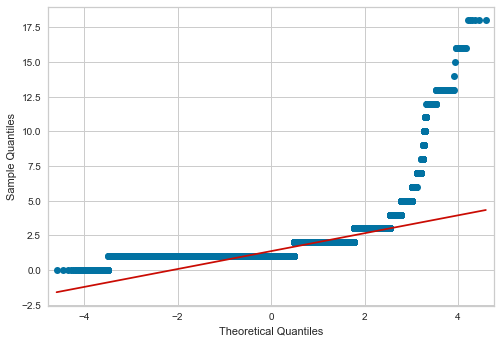

count    454804.00000
mean          1.36123
std           0.64568
min           0.00000
25%           1.00000
50%           1.00000
75%           2.00000
max          18.00000
Name: days_taken, dtype: float64

Skew is 4.4473839257156245
Kurtosis is 57.29931748530626
Cannot be considered normally distributed on the basis of skewness and kurtosis


Shapiro Wilk Test for Normality
stat=0.552,p=0.000

Not Normally distributed according to shapiro test


Anderson Test for Normality
stat=72611.479
Probably Not Normally distributed 0.576 critical value at 15.0 level of significance
Probably Not Normally distributed 0.656 critical value at 10.0 level of significance
Probably Not Normally distributed 0.787 critical value at 5.0 level of significance
Probably Not Normally distributed 0.918 critical value at 2.5 level of significance
Probably Not Normally distributed 1.092 critical value at 1.0 level of significance


Chi square Normality test
stat=139292.246,p=1.000

Normally distributed according to chisquare test


Lilliefors Test for Normality
stat=0.403,p=0.000

Not Normally distributed according to lilliefors test


Kolmogorov-Smirnov test
stat=0.841,p=0.000

Not normally distributed according to

In [16]:
t.numerical_analysis(df2,'days_taken')

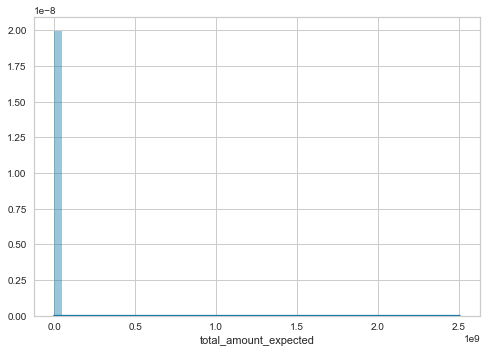

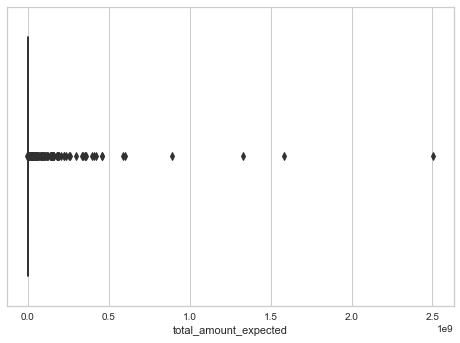

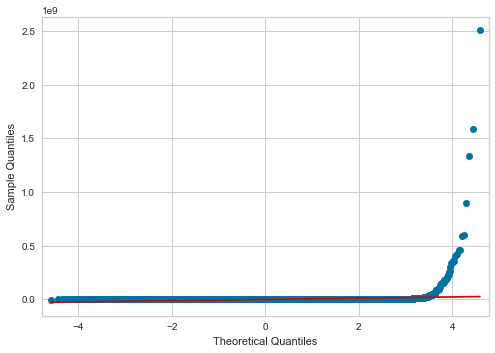

count    4.548040e+05
mean     6.894447e+04
std      5.719602e+06
min     -1.000000e+06
25%      4.380000e+02
50%      1.136000e+03
75%      3.880000e+03
max      2.505060e+09
Name: total_amount_expected, dtype: float64

Skew is 282.275508669736
Kurtosis is 102723.98951730256
Cannot be considered normally distributed on the basis of skewness and kurtosis


Shapiro Wilk Test for Normality
stat=0.002,p=0.000

Not Normally distributed according to shapiro test


Anderson Test for Normality
stat=173504.652
Probably Not Normally distributed 0.576 critical value at 15.0 level of significance
Probably Not Normally distributed 0.656 critical value at 10.0 level of significance
Probably Not Normally distributed 0.787 critical value at 5.0 level of significance
Probably Not Normally distributed 0.918 critical value at 2.5 level of significance
Probably Not Normally distributed 1.092 critical value at 1.0 level of significance


Chi square Normality test
stat=215802000085857.125,p=0.000

Not Normally distributed according to chisquare test


Lilliefors Test for Normality
stat=0.495,p=0.000

Not Normally distributed according to lilliefors test


Kolmogorov-Smirnov test
stat=0.998,p=0.000

Not normally distributed

In [17]:
t2.numerical_analysis(df2,'total_amount_expected')

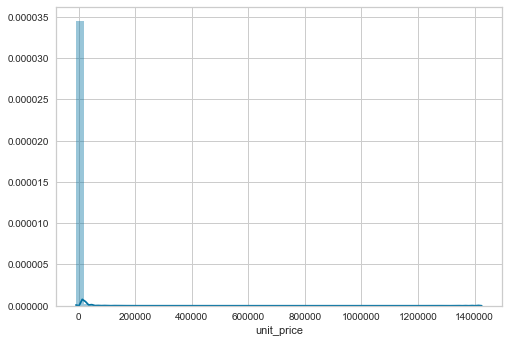

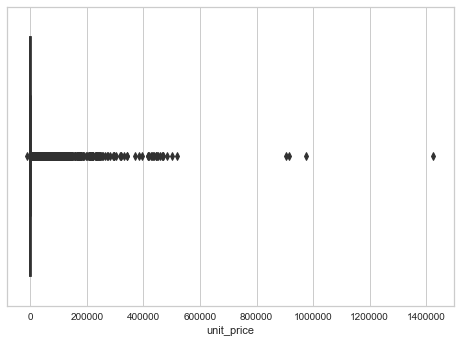

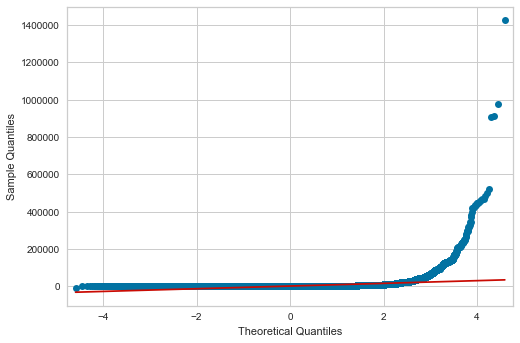

count    4.548040e+05
mean     1.753900e+03
std      7.205905e+03
min     -1.000000e+04
25%      2.540000e+02
50%      5.660000e+02
75%      1.380000e+03
max      1.425000e+06
Name: unit_price, dtype: float64

Skew is 51.87770317525267
Kurtosis is 6116.106176743661
Cannot be considered normally distributed on the basis of skewness and kurtosis


Shapiro Wilk Test for Normality
stat=0.146,p=0.000

Not Normally distributed according to shapiro test


Anderson Test for Normality
stat=108975.383
Probably Not Normally distributed 0.576 critical value at 15.0 level of significance
Probably Not Normally distributed 0.656 critical value at 10.0 level of significance
Probably Not Normally distributed 0.787 critical value at 5.0 level of significance
Probably Not Normally distributed 0.918 critical value at 2.5 level of significance
Probably Not Normally distributed 1.092 critical value at 1.0 level of significance


Chi square Normality test
stat=13464662709.033,p=0.000

Not Normally distributed according to chisquare test


Lilliefors Test for Normality
stat=0.403,p=0.000

Not Normally distributed according to lilliefors test


Kolmogorov-Smirnov test
stat=0.998,p=0.000

Not normally distributed acc

In [18]:
t2.numerical_analysis(df2,'unit_price')

Since the above columns are left skewed therefore transforming the data using logarithmic transformation would be suitable

In [13]:
c=['delivery_time_hours','days_taken','total_amount_expected','unit_price']
d=t.deep_copy(df2)
for i in c:
    d[i]=np.log(d[i])


E:\ProgramData\Anaconda3\lib\site-packages\pandas\core\series.py:853: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)
E:\ProgramData\Anaconda3\lib\site-packages\pandas\core\series.py:853: RuntimeWarning: invalid value encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


In [14]:
d

,channel,lat,lng,unit_price,total_amount_expected,days_taken,delivery_time_hours,return,Category,Sub Category,order_day,r_day
0,2,0.000000,0.00000,11.669929,16.275099,2.302585,2.068970,0,18,35,3,6
1,2,0.000000,0.00000,10.085809,12.388394,2.197225,0.929536,0,18,22,4,6
2,2,0.000000,0.00000,11.066638,14.978661,2.197225,0.803495,0,18,22,4,6
3,2,0.000000,0.00000,11.759786,16.364956,2.197225,0.803495,0,18,35,4,6
4,2,0.000000,0.00000,10.968198,14.187074,2.197225,0.803495,0,18,35,4,6
...,...,...,...,...,...,...,...,...,...,...,...,...
454799,2,24.915066,67.02645,9.124782,12.708301,0.000000,1.076139,0,3,42,6,7
454800,2,24.915066,67.02645,7.138867,8.237479,0.000000,1.076139,0,12,49,6,7
454801,2,24.915066,67.02645,6.980076,8.589514,0.000000,1.076139,0,12,37,6,7
454802,2,24.915066,67.02645,9.045466,12.734345,0.000000,1.076139,0,12,28,6,7


In [15]:
d[['delivery_time_hours','days_taken','total_amount_expected','unit_price']].describe()

,delivery_time_hours,days_taken,total_amount_expected,unit_price
count,4.548040e+05,4.548040e+05,4.540840e+05,4.540840e+05
mean,-inf,-inf,-inf,-inf
std,NaN,NaN,NaN,NaN
min,-inf,-inf,-inf,-inf
25%,-1.609438e+00,0.000000e+00,6.086775e+00,5.541264e+00
50%,1.076139e+00,0.000000e+00,7.035269e+00,6.340359e+00
75%,1.623094e+00,6.931472e-01,8.265650e+00,7.229839e+00
max,2.768413e+00,2.890372e+00,2.164158e+01,1.416968e+01


Logarithmic transformation is not working in this case. 

Transforming data using yeo-johnson transformation

In [11]:
c=['delivery_time_hours','days_taken','total_amount_expected','unit_price']
d=t.deep_copy(df2)
from scipy.stats import yeojohnson
for i in c:
    d[i],liam = yeojohnson(d[i])

In [7]:
d[['delivery_time_hours','days_taken','total_amount_expected','unit_price']].describe()

,delivery_time_hours,days_taken,total_amount_expected,unit_price
count,454804.000000,454804.000000,4.548040e+05,454804.000000
mean,1.548629,0.322651,1.728505e+03,221.422289
std,1.100450,0.018472,5.901797e+04,399.663234
min,0.000000,-0.000000,-2.409927e+07,-111334.230491
25%,0.187670,0.310902,1.288372e+02,70.832505
50%,1.713216,0.310902,2.653619e+02,126.073431
75%,2.429319,0.347783,6.714656e+02,238.606728
max,4.570483,0.365851,1.610506e+07,33282.865781


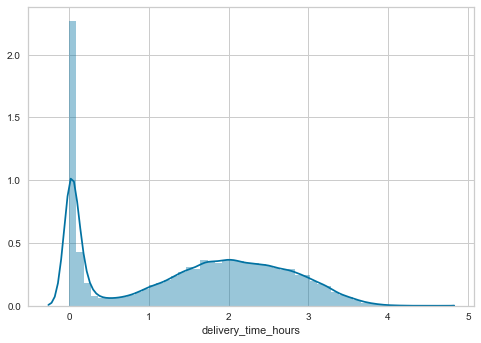

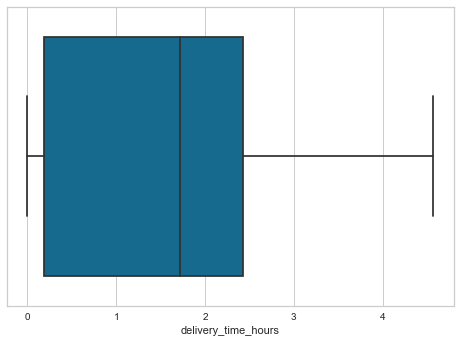

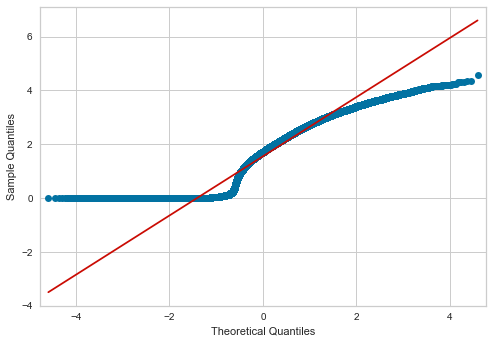

count    454804.000000
mean          1.548629
std           1.100450
min           0.000000
25%           0.187670
50%           1.713216
75%           2.429319
max           4.570483
Name: delivery_time_hours, dtype: float64

Skew is -0.10629066669668963
Kurtosis is -1.2230201553616353
Can be considered normally distributed on the basis of skewness and kurtosis


Shapiro Wilk Test for Normality
stat=0.920,p=0.000

Not Normally distributed according to shapiro test


Anderson Test for Normality
stat=11795.803
Probably Not Normally distributed 0.576 critical value at 15.0 level of significance
Probably Not Normally distributed 0.656 critical value at 10.0 level of significance
Probably Not Normally distributed 0.787 critical value at 5.0 level of significance
Probably Not Normally distributed 0.918 critical value at 2.5 level of significance
Probably Not Normally distributed 1.092 critical value at 1.0 level of significance


Chi square Normality test
stat=355644.897,p=1.000

Normally distributed according to chisquare test


Lilliefors Test for Normality
stat=0.142,p=0.000

Not Normally distributed according to lilliefors test


Kolmogorov-Smirnov test
stat=0.530,p=0.000

Not normally distributed according t

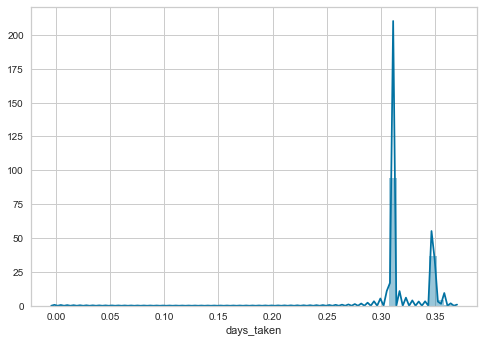

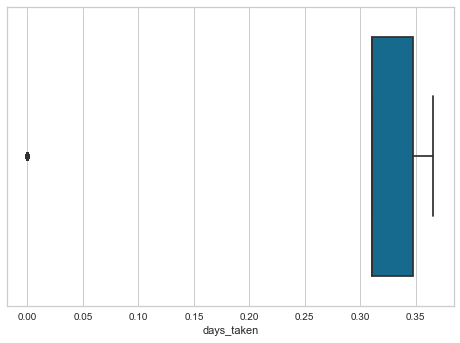

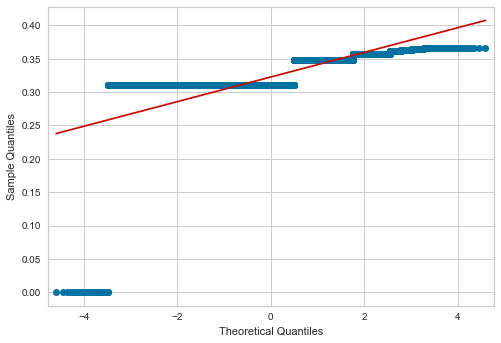

count    454804.000000
mean          0.322651
std           0.018472
min          -0.000000
25%           0.310902
50%           0.310902
75%           0.347783
max           0.365851
Name: days_taken, dtype: float64

Skew is -0.5140697319769756
Kurtosis is 21.30932969765884
Cannot be considered normally distributed on the basis of skewness and kurtosis


Shapiro Wilk Test for Normality
stat=0.585,p=0.000

Not Normally distributed according to shapiro test


Anderson Test for Normality
stat=87060.536
Probably Not Normally distributed 0.576 critical value at 15.0 level of significance
Probably Not Normally distributed 0.656 critical value at 10.0 level of significance
Probably Not Normally distributed 0.787 critical value at 5.0 level of significance
Probably Not Normally distributed 0.918 critical value at 2.5 level of significance
Probably Not Normally distributed 1.092 critical value at 1.0 level of significance


Chi square Normality test
stat=480.975,p=1.000

Normally distributed according to chisquare test


Lilliefors Test for Normality
stat=0.428,p=0.000

Not Normally distributed according to lilliefors test


Kolmogorov-Smirnov test
stat=0.622,p=0.000

Not normally distributed according to K

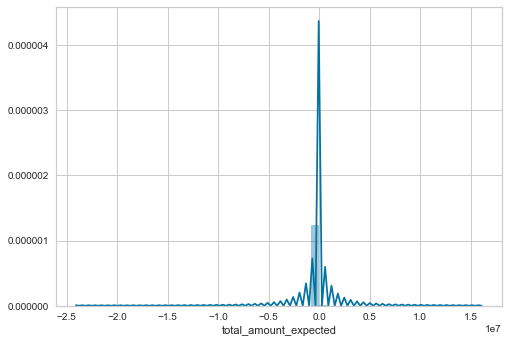

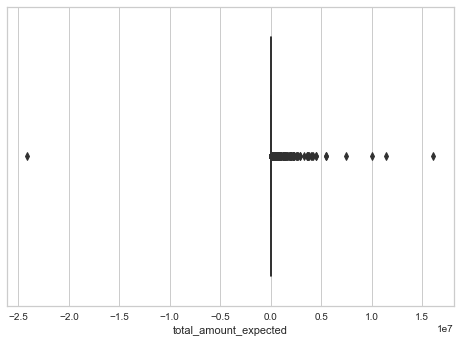

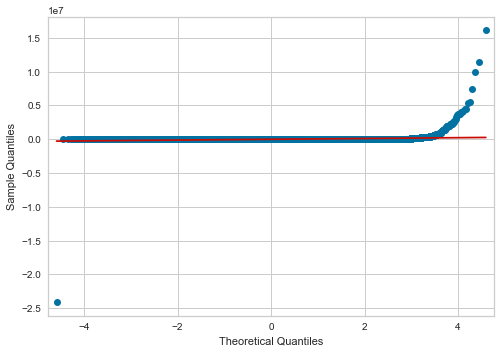

count    4.548040e+05
mean     1.728505e+03
std      5.901797e+04
min     -2.409927e+07
25%      1.288372e+02
50%      2.653619e+02
75%      6.714656e+02
max      1.610506e+07
Name: total_amount_expected, dtype: float64

Skew is -59.62203506065527
Kurtosis is 79694.57419484072
Cannot be considered normally distributed on the basis of skewness and kurtosis


Shapiro Wilk Test for Normality
stat=0.007,p=0.000

Not Normally distributed according to shapiro test


Anderson Test for Normality
stat=166453.667
Probably Not Normally distributed 0.576 critical value at 15.0 level of significance
Probably Not Normally distributed 0.656 critical value at 10.0 level of significance
Probably Not Normally distributed 0.787 critical value at 5.0 level of significance
Probably Not Normally distributed 0.918 critical value at 2.5 level of significance
Probably Not Normally distributed 1.092 critical value at 1.0 level of significance


Chi square Normality test
stat=916476640309.130,p=0.000

Not Normally distributed according to chisquare test


Lilliefors Test for Normality
stat=0.487,p=0.000

Not Normally distributed according to lilliefors test


Kolmogorov-Smirnov test
stat=0.998,p=0.000

Not normally distributed a

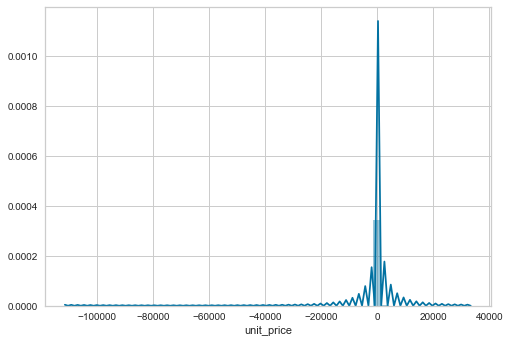

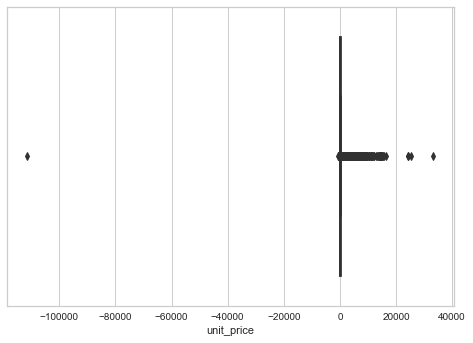

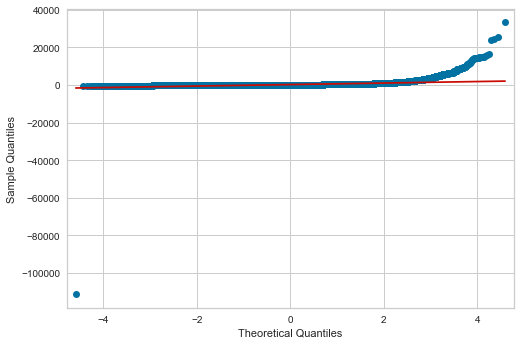

count    454804.000000
mean        221.422289
std         399.663234
min     -111334.230491
25%          70.832505
50%         126.073431
75%         238.606728
max       33282.865781
Name: unit_price, dtype: float64

Skew is -37.53283968567813
Kurtosis is 13693.15597915131
Cannot be considered normally distributed on the basis of skewness and kurtosis


Shapiro Wilk Test for Normality
stat=0.355,p=0.000

Not Normally distributed according to shapiro test


Anderson Test for Normality
stat=63967.257
Probably Not Normally distributed 0.576 critical value at 15.0 level of significance
Probably Not Normally distributed 0.656 critical value at 10.0 level of significance
Probably Not Normally distributed 0.787 critical value at 5.0 level of significance
Probably Not Normally distributed 0.918 critical value at 2.5 level of significance
Probably Not Normally distributed 1.092 critical value at 1.0 level of significance


Chi square Normality test
stat=328088026.709,p=0.000

Not Normally distributed according to chisquare test


Lilliefors Test for Normality
stat=0.301,p=0.000

Not Normally distributed according to lilliefors test


Kolmogorov-Smirnov test
stat=0.998,p=0.000

Not normally distributed accor

In [25]:
for i in c:
    t.numerical_analysis(d,i)

Yeo-johnson has only improved delivery time hours. Other columns have not improved 

In [12]:
df2['delivery_time_hours']=d['delivery_time_hours']

In [9]:
df2

,channel,lat,lng,unit_price,total_amount_expected,days_taken,delivery_time_hours,return,Category,Sub Category,order_day,r_day
0,2,0.000000,0.00000,117000.0,11700000.0,10.0,3.152177,0,18,35,3,6
1,2,0.000000,0.00000,24000.0,240000.0,9.0,1.550735,0,18,22,4,6
2,2,0.000000,0.00000,64000.0,3200000.0,9.0,1.420405,0,18,22,4,6
3,2,0.000000,0.00000,128000.0,12800000.0,9.0,1.420405,0,18,35,4,6
4,2,0.000000,0.00000,58000.0,1450000.0,9.0,1.420405,0,18,35,4,6
...,...,...,...,...,...,...,...,...,...,...,...,...
454799,2,24.915066,67.02645,9180.0,330480.0,1.0,1.713216,0,3,42,6,7
454800,2,24.915066,67.02645,1260.0,3780.0,1.0,1.713216,0,12,49,6,7
454801,2,24.915066,67.02645,1075.0,5375.0,1.0,1.713216,0,12,37,6,7
454802,2,24.915066,67.02645,8480.0,339200.0,1.0,1.713216,0,12,28,6,7


---------Logistic Regression------------
Accuracy  (%): 
 79.58135904398588
AUC  (%): 
 50.033665332748626
Precision: 
 35.9375
Recall (%): 
 0.12395580706009161
f1 score (%): 
 0.24705945539502655
logistic loss :
 7.052349103090013
              precision    recall  f1-score   support

           0       0.80      1.00      0.89     72406
           1       0.36      0.00      0.00     18555

    accuracy                           0.80     90961
   macro avg       0.58      0.50      0.44     90961
weighted avg       0.71      0.80      0.71     90961



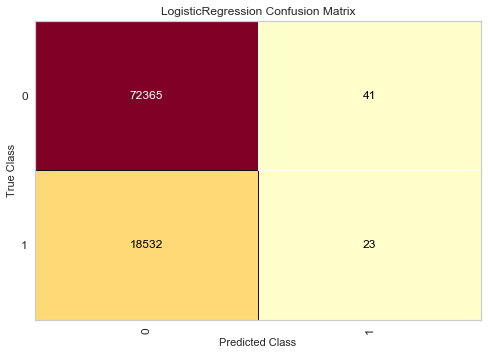

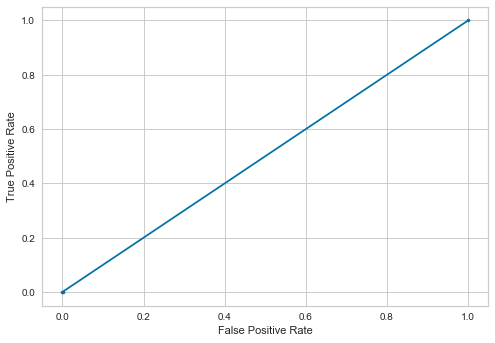

---------Nearest Neighbors------------
Accuracy  (%): 
 80.2640692164774
AUC  (%): 
 63.29701584748471
Precision: 
 52.46102358991103
Recall (%): 
 34.63756399892212
f1 score (%): 
 41.725637862754006
logistic loss :
 6.816600198951968
              precision    recall  f1-score   support

           0       0.85      0.92      0.88     72406
           1       0.52      0.35      0.42     18555

    accuracy                           0.80     90961
   macro avg       0.69      0.63      0.65     90961
weighted avg       0.78      0.80      0.79     90961



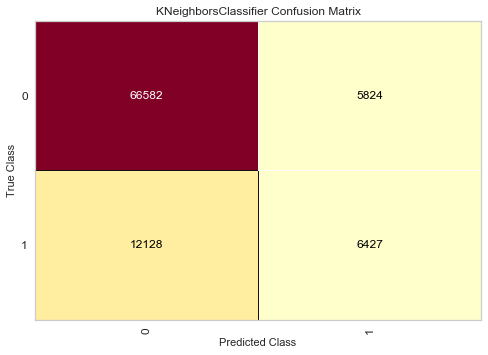

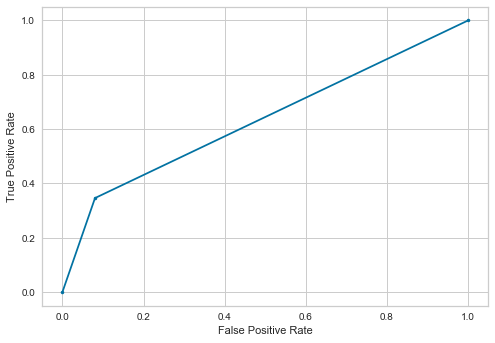

---------Decision Tree------------
Accuracy  (%): 
 86.62063961477996
AUC  (%): 
 79.61724986755239
Precision: 
 67.00761813435618
Recall (%): 
 67.78765831312315
f1 score (%): 
 67.39538123559984
logistic loss :
 4.62112180641097
              precision    recall  f1-score   support

           0       0.92      0.91      0.92     72406
           1       0.67      0.68      0.67     18555

    accuracy                           0.87     90961
   macro avg       0.79      0.80      0.79     90961
weighted avg       0.87      0.87      0.87     90961



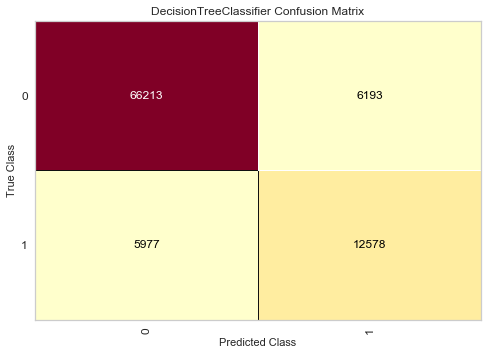

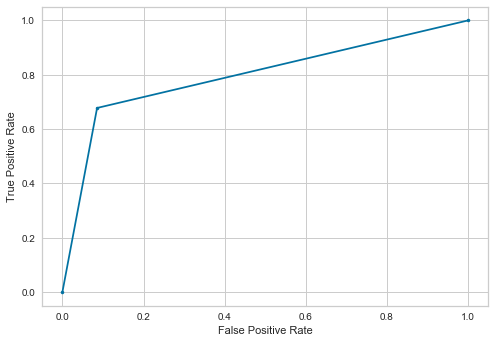

---------Naive Bayes------------
Accuracy  (%): 
 79.25704422774595
AUC  (%): 
 50.37908755378786
Precision: 
 32.74531422271224
Recall (%): 
 1.6006467259498787
f1 score (%): 
 3.0521015311889834
logistic loss :
 7.164368474110963
              precision    recall  f1-score   support

           0       0.80      0.99      0.88     72406
           1       0.33      0.02      0.03     18555

    accuracy                           0.79     90961
   macro avg       0.56      0.50      0.46     90961
weighted avg       0.70      0.79      0.71     90961



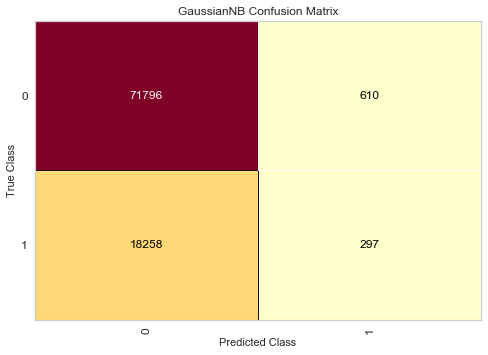

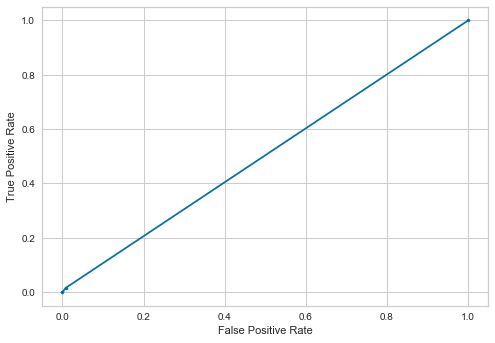

---------Random Forest------------
Accuracy  (%): 
 88.15756203207968
AUC  (%): 
 74.75058930884309
Precision: 
 83.68389162987968
Recall (%): 
 52.10455402856373
f1 score (%): 
 64.22213365218546
logistic loss :
 4.09024973963714
              precision    recall  f1-score   support

           0       0.89      0.97      0.93     72406
           1       0.84      0.52      0.64     18555

    accuracy                           0.88     90961
   macro avg       0.86      0.75      0.79     90961
weighted avg       0.88      0.88      0.87     90961



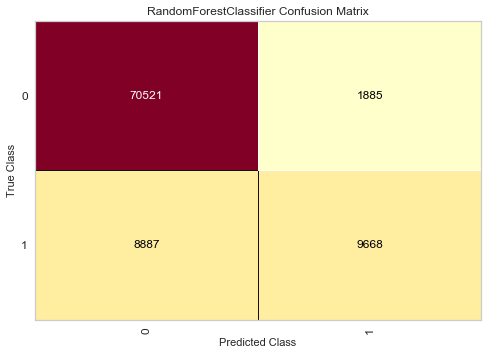

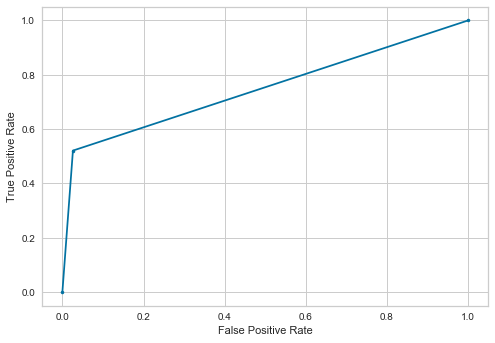

---------xgboost------------
Accuracy  (%): 
 82.6980793966645
AUC  (%): 
 59.73938493613511
Precision: 
 78.39145333602097
Recall (%): 
 20.959310158986796
f1 score (%): 
 33.075352951182175
logistic loss :
 5.975881092683123
              precision    recall  f1-score   support

           0       0.83      0.99      0.90     72406
           1       0.78      0.21      0.33     18555

    accuracy                           0.83     90961
   macro avg       0.81      0.60      0.62     90961
weighted avg       0.82      0.83      0.78     90961



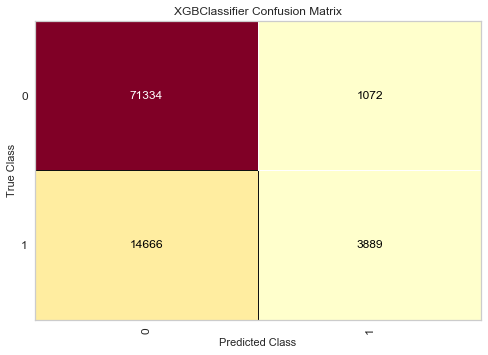

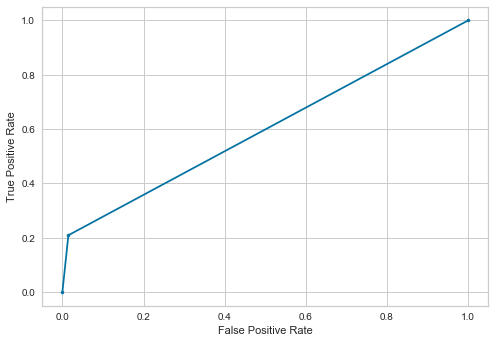

---------Ada Boost------------
Accuracy  (%): 
 79.60114774463781
AUC  (%): 
 50.70345347378837
Precision: 
 50.0
Recall (%): 
 1.8916734033953113
f1 score (%): 
 3.6454276367035363
logistic loss :
 7.045517053091609
              precision    recall  f1-score   support

           0       0.80      1.00      0.89     72406
           1       0.50      0.02      0.04     18555

    accuracy                           0.80     90961
   macro avg       0.65      0.51      0.46     90961
weighted avg       0.74      0.80      0.71     90961



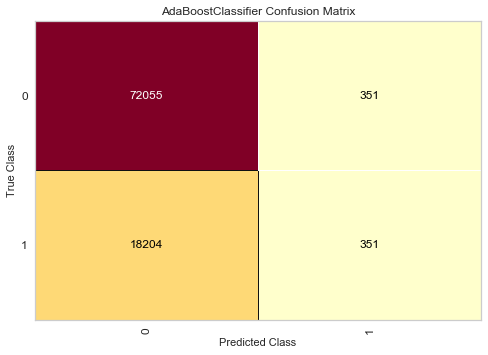

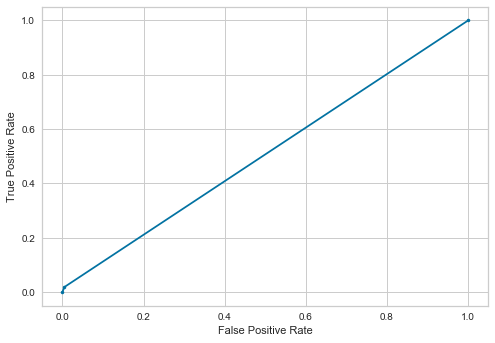

---------SVM------------
Accuracy  (%): 
 79.58025967172745
AUC  (%): 
 50.022954077486936
Precision: 
 32.72727272727273
Recall (%): 
 0.09700889248181083
f1 score (%): 
 0.1934443847393874
logistic loss :
 7.052728777653895
              precision    recall  f1-score   support

           0       0.80      1.00      0.89     72406
           1       0.33      0.00      0.00     18555

    accuracy                           0.80     90961
   macro avg       0.56      0.50      0.44     90961
weighted avg       0.70      0.80      0.71     90961



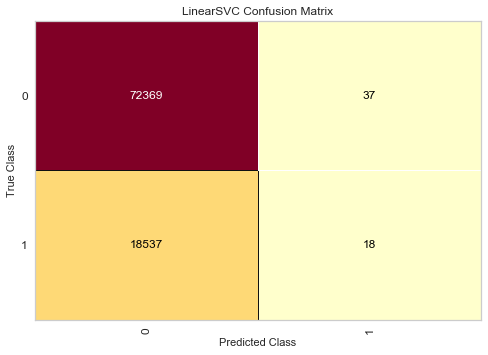

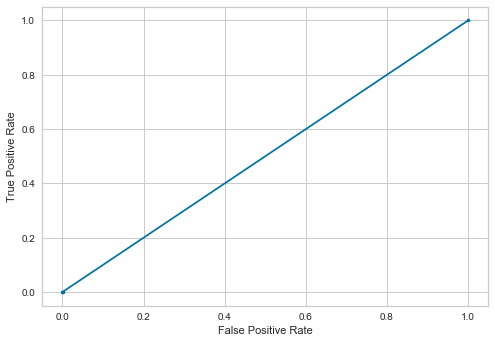

---------MLP Classifier------------
Accuracy  (%): 
 79.60994272270534
AUC  (%): 
 50.13779770681853
Precision: 
 53.2258064516129
Recall (%): 
 0.35569927243330635
f1 score (%): 
 0.7066759462497992
logistic loss :
 7.0424767996510536
              precision    recall  f1-score   support

           0       0.80      1.00      0.89     72406
           1       0.53      0.00      0.01     18555

    accuracy                           0.80     90961
   macro avg       0.66      0.50      0.45     90961
weighted avg       0.74      0.80      0.71     90961



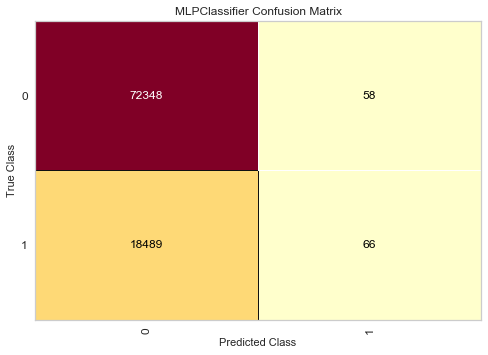

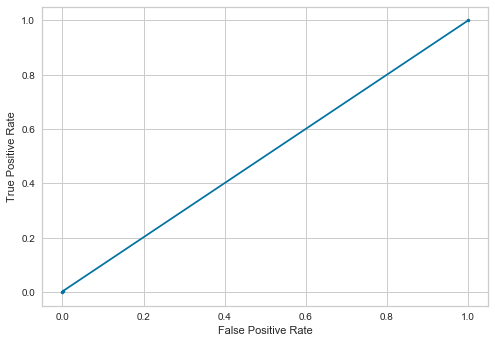

---------light Gradient Boosting------------
Accuracy  (%): 
 81.09959213289211
AUC  (%): 
 55.02165131701845
Precision: 
 75.15688445921003
Recall (%): 
 10.972783616275937
f1 score (%): 
 19.149736644093302
logistic loss :
 6.527975526988214
              precision    recall  f1-score   support

           0       0.81      0.99      0.89     72406
           1       0.75      0.11      0.19     18555

    accuracy                           0.81     90961
   macro avg       0.78      0.55      0.54     90961
weighted avg       0.80      0.81      0.75     90961



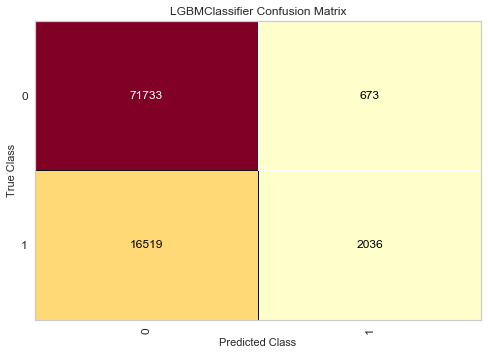

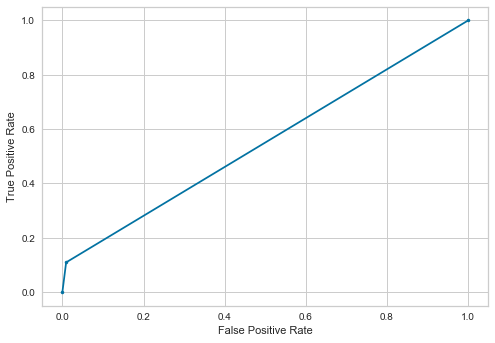

---------Gradient Boosting Classifier------------
Accuracy  (%): 
 79.86389771440507
AUC  (%): 
 51.11500438189744
Precision: 
 66.85472496473906
Recall (%): 
 2.5545675020210186
f1 score (%): 
 4.9210963455149495
logistic loss :
 6.9547654088519275
              precision    recall  f1-score   support

           0       0.80      1.00      0.89     72406
           1       0.67      0.03      0.05     18555

    accuracy                           0.80     90961
   macro avg       0.73      0.51      0.47     90961
weighted avg       0.77      0.80      0.72     90961



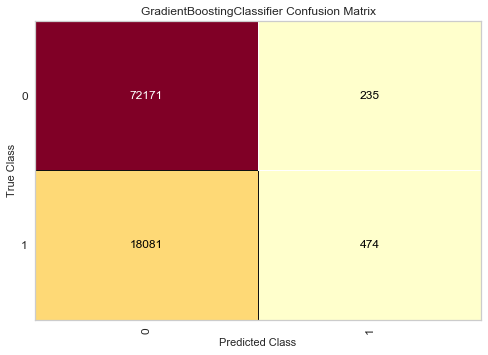

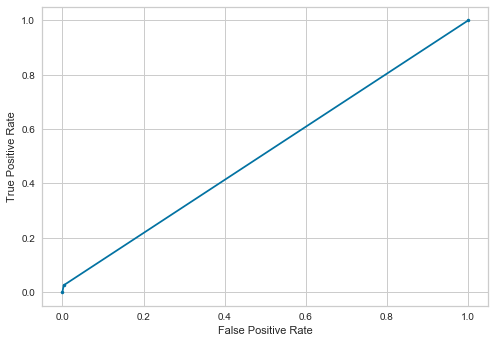

,classifier,Precision,Recall,AUC,Accuracy
0,Logistic Regression,35.937500,0.123956,50.033665,79.581359
1,Nearest Neighbors,52.461024,34.637564,63.297016,80.264069
2,Decision Tree,67.007618,67.787658,79.617250,86.620640
3,Naive Bayes,32.745314,1.600647,50.379088,79.257044
4,Random Forest,83.683892,52.104554,74.750589,88.157562
5,xgboost,78.391453,20.959310,59.739385,82.698079
6,Ada Boost,50.000000,1.891673,50.703453,79.601148
7,SVM,32.727273,0.097009,50.022954,79.580260
8,MLP Classifier,53.225806,0.355699,50.137798,79.609943
9,light Gradient Boosting,75.156884,10.972784,55.021651,81.099592


,classifier,Precision,Recall,AUC,Accuracy
0,Logistic Regression,35.937500,0.123956,50.033665,79.581359
1,Nearest Neighbors,52.461024,34.637564,63.297016,80.264069
2,Decision Tree,67.007618,67.787658,79.617250,86.620640
3,Naive Bayes,32.745314,1.600647,50.379088,79.257044
4,Random Forest,83.683892,52.104554,74.750589,88.157562
5,xgboost,78.391453,20.959310,59.739385,82.698079
6,Ada Boost,50.000000,1.891673,50.703453,79.601148
7,SVM,32.727273,0.097009,50.022954,79.580260
8,MLP Classifier,53.225806,0.355699,50.137798,79.609943
9,light Gradient Boosting,75.156884,10.972784,55.021651,81.099592


In [11]:
t3.fit_model(df2,'return',classification=True)

There has been no significant improvement in results

E:\ProgramData\Anaconda3\lib\site-packages\sklearn\utils\deprecation.py:143: FutureWarning: The sklearn.metrics.classification module is  deprecated in version 0.22 and will be removed in version 0.24. The corresponding classes / functions should instead be imported from sklearn.metrics. Anything that cannot be imported from sklearn.metrics is now part of the private API.
  warnings.warn(message, FutureWarning)


delivery_time_hours      27.691192
lng                      12.145138
lat                      12.144659
total_amount_expected    11.740065
unit_price               11.617487
Sub Category              5.837263
r_day                     5.054625
order_day                 4.706227
Category                  4.683722
channel                   2.429521
days_taken                1.950102
dtype: float64
Selected Features =['delivery_time_hours', 'lng', 'lat', 'total_amount_expected', 'unit_price', 'Sub Category', 'r_day']
---------Logistic Regression------------
Accuracy  (%): 
 79.60114774463781
AUC  (%): 
 50.00200414095096
Precision: 
 50.0
Recall (%): 
 0.0053893829156561575
f1 score (%): 
 0.01077760413859999
logistic loss :
 7.045513976398293
              precision    recall  f1-score   support

           0       0.80      1.00      0.89     72406
           1       0.50      0.00      0.00     18555

    accuracy                           0.80     90961
   macro avg       0.65      0

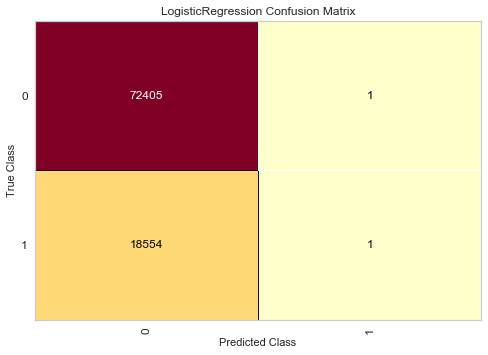

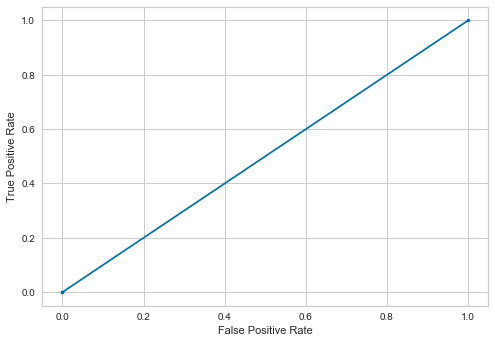

---------Nearest Neighbors------------
Accuracy  (%): 
 79.10533085608118
AUC  (%): 
 61.019974658154794
Precision: 
 48.0823199251637
Recall (%): 
 30.471571005119912
f1 score (%): 
 37.30289635152075
logistic loss :
 7.216816720396475
              precision    recall  f1-score   support

           0       0.84      0.92      0.87     72406
           1       0.48      0.30      0.37     18555

    accuracy                           0.79     90961
   macro avg       0.66      0.61      0.62     90961
weighted avg       0.76      0.79      0.77     90961



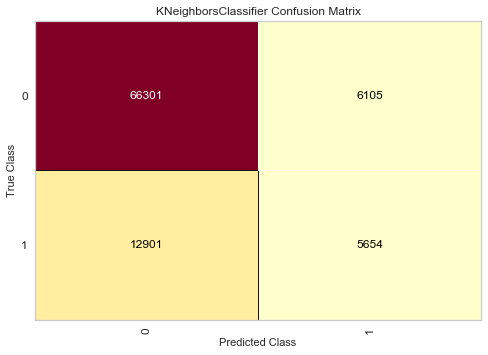

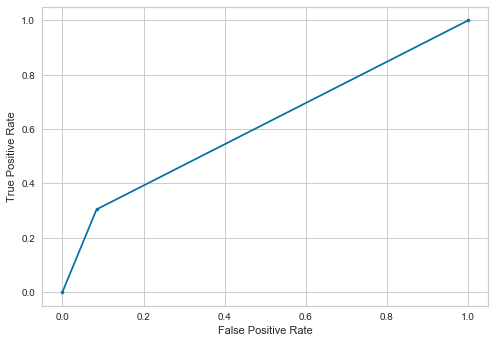

---------Decision Tree------------
Accuracy  (%): 
 84.52633546245094
AUC  (%): 
 76.75255019688115
Precision: 
 61.7093570308416
Recall (%): 
 63.62166531932094
f1 score (%): 
 62.6509221175534
logistic loss :
 5.3444787855184535
              precision    recall  f1-score   support

           0       0.91      0.90      0.90     72406
           1       0.62      0.64      0.63     18555

    accuracy                           0.85     90961
   macro avg       0.76      0.77      0.76     90961
weighted avg       0.85      0.85      0.85     90961



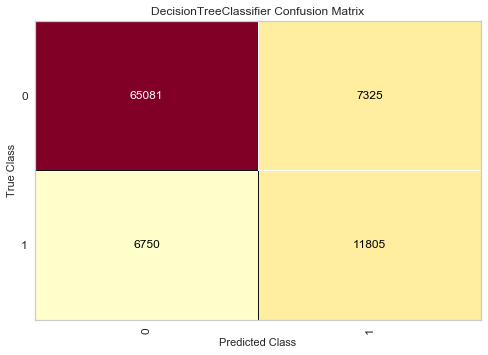

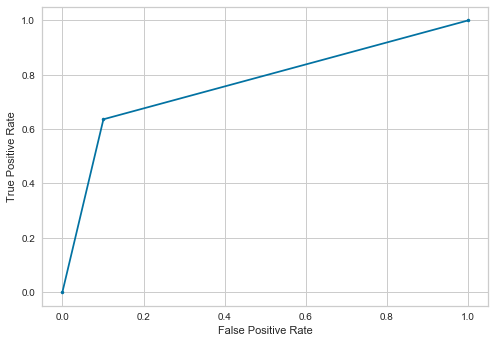

---------Naive Bayes------------
Accuracy  (%): 
 79.30871472389266
AUC  (%): 
 50.01271937836863
Precision: 
 21.21212121212121
Recall (%): 
 0.5281595257343034
f1 score (%): 
 1.030656780775096
logistic loss :
 7.1465199545088405
              precision    recall  f1-score   support

           0       0.80      0.99      0.88     72406
           1       0.21      0.01      0.01     18555

    accuracy                           0.79     90961
   macro avg       0.50      0.50      0.45     90961
weighted avg       0.68      0.79      0.71     90961



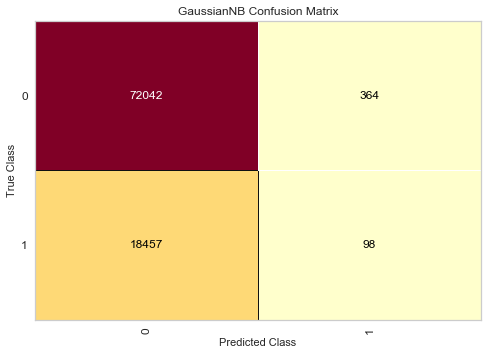

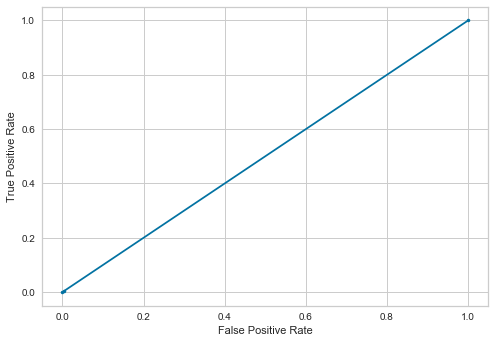

---------Random Forest------------
Accuracy  (%): 
 86.33700157210234
AUC  (%): 
 71.39847434151385
Precision: 
 77.83734666060882
Recall (%): 
 46.165454055510644
f1 score (%): 
 57.95669824086605
logistic loss :
 4.719053916008863
              precision    recall  f1-score   support

           0       0.88      0.97      0.92     72406
           1       0.78      0.46      0.58     18555

    accuracy                           0.86     90961
   macro avg       0.83      0.71      0.75     90961
weighted avg       0.86      0.86      0.85     90961



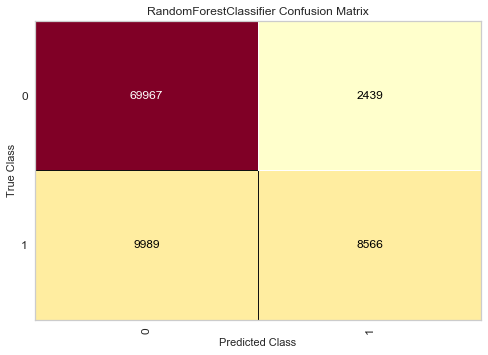

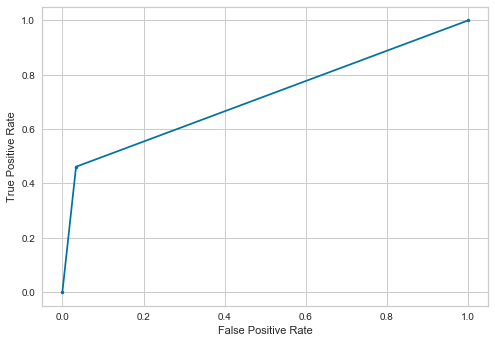

---------xgboost------------
Accuracy  (%): 
 82.2682248436143
AUC  (%): 
 58.132617673658274
Precision: 
 80.18914883026382
Recall (%): 
 17.364591754244138
f1 score (%): 
 28.547379612811763
logistic loss :
 6.124345169392034
              precision    recall  f1-score   support

           0       0.82      0.99      0.90     72406
           1       0.80      0.17      0.29     18555

    accuracy                           0.82     90961
   macro avg       0.81      0.58      0.59     90961
weighted avg       0.82      0.82      0.77     90961



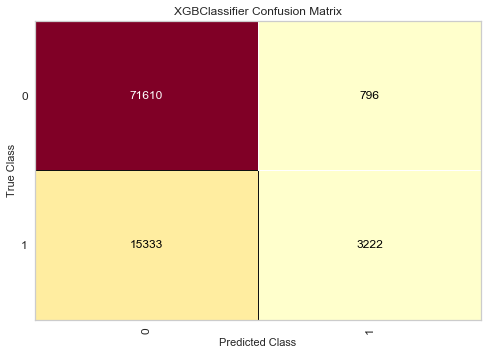

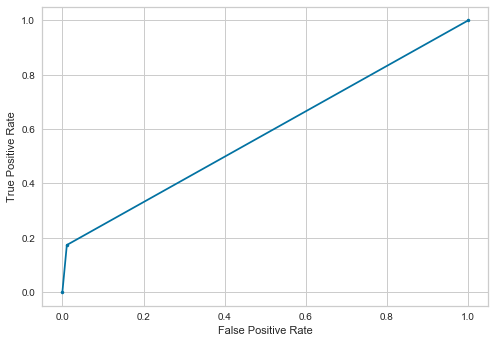

---------Ada Boost------------
Accuracy  (%): 
 79.59675025560405
AUC  (%): 
 50.005254361776394
Precision: 
 33.33333333333333
Recall (%): 
 0.02155753166262463
f1 score (%): 
 0.04308719771637851
logistic loss :
 7.047032876836521
              precision    recall  f1-score   support

           0       0.80      1.00      0.89     72406
           1       0.33      0.00      0.00     18555

    accuracy                           0.80     90961
   macro avg       0.56      0.50      0.44     90961
weighted avg       0.70      0.80      0.71     90961



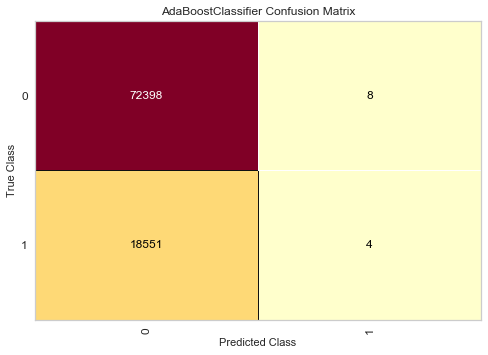

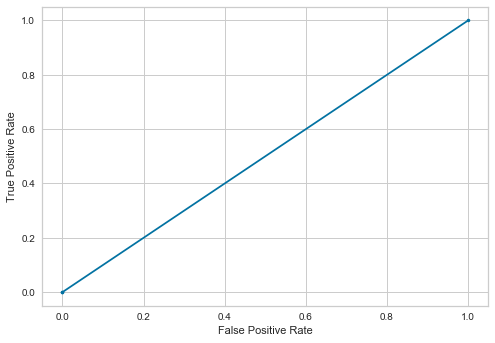

---------SVM------------
Accuracy  (%): 
 79.60114774463781
AUC  (%): 
 50.00200414095096
Precision: 
 50.0
Recall (%): 
 0.0053893829156561575
f1 score (%): 
 0.01077760413859999
logistic loss :
 7.045513976398293
              precision    recall  f1-score   support

           0       0.80      1.00      0.89     72406
           1       0.50      0.00      0.00     18555

    accuracy                           0.80     90961
   macro avg       0.65      0.50      0.44     90961
weighted avg       0.74      0.80      0.71     90961



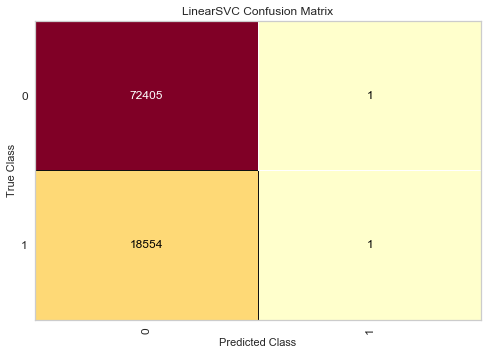

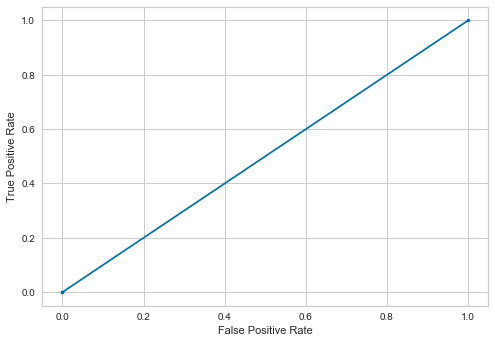

---------MLP Classifier------------
Accuracy  (%): 
 79.60114774463781
AUC  (%): 
 50.004008281901925
Precision: 
 50.0
Recall (%): 
 0.010778765831312315
f1 score (%): 
 0.021552885392531924
logistic loss :
 7.045513985188846
              precision    recall  f1-score   support

           0       0.80      1.00      0.89     72406
           1       0.50      0.00      0.00     18555

    accuracy                           0.80     90961
   macro avg       0.65      0.50      0.44     90961
weighted avg       0.74      0.80      0.71     90961



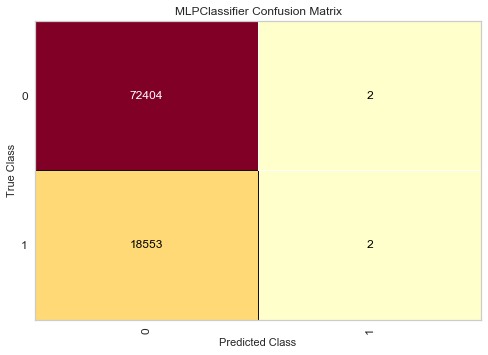

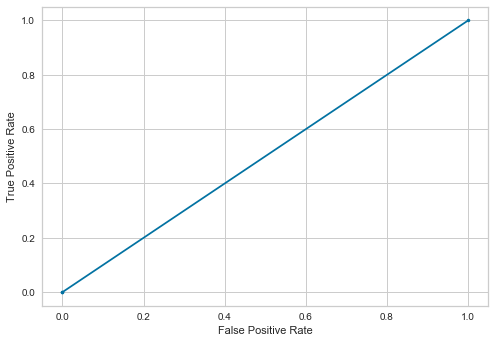

---------light Gradient Boosting------------
Accuracy  (%): 
 80.76538296632623
AUC  (%): 
 53.5972145466476
Precision: 
 79.40033314825097
Recall (%): 
 7.706817569388305
f1 score (%): 
 14.0499115739831
logistic loss :
 6.6434046289729
              precision    recall  f1-score   support

           0       0.81      0.99      0.89     72406
           1       0.79      0.08      0.14     18555

    accuracy                           0.81     90961
   macro avg       0.80      0.54      0.52     90961
weighted avg       0.81      0.81      0.74     90961



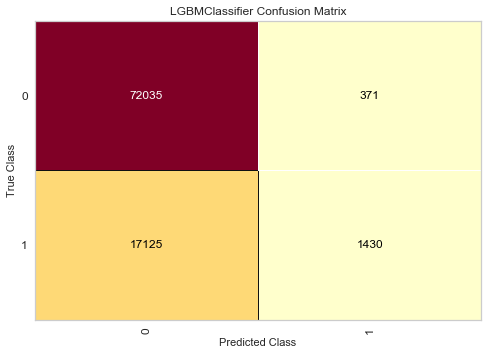

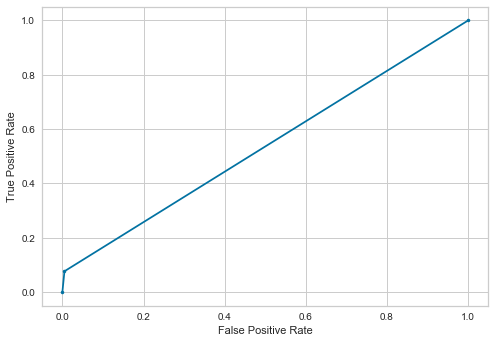

---------Gradient Boosting Classifier------------
Accuracy  (%): 
 79.87159332021416
AUC  (%): 
 50.823225374702844
Precision: 
 80.29556650246306
Recall (%): 
 1.7569388305039073
f1 score (%): 
 3.4386372026791836
logistic loss :
 6.952106078233682
              precision    recall  f1-score   support

           0       0.80      1.00      0.89     72406
           1       0.80      0.02      0.03     18555

    accuracy                           0.80     90961
   macro avg       0.80      0.51      0.46     90961
weighted avg       0.80      0.80      0.71     90961



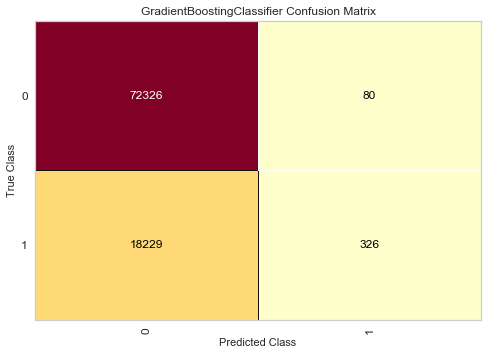

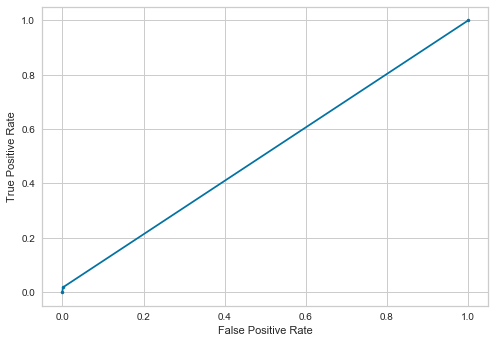

,classifier,Precision,Recall,AUC,Accuracy
0,Logistic Regression,50.000000,0.005389,50.002004,79.601148
1,Nearest Neighbors,48.082320,30.471571,61.019975,79.105331
2,Decision Tree,61.709357,63.621665,76.752550,84.526335
3,Naive Bayes,21.212121,0.528160,50.012719,79.308715
4,Random Forest,77.837347,46.165454,71.398474,86.337002
5,xgboost,80.189149,17.364592,58.132618,82.268225
6,Ada Boost,33.333333,0.021558,50.005254,79.596750
7,SVM,50.000000,0.005389,50.002004,79.601148
8,MLP Classifier,50.000000,0.010779,50.004008,79.601148
9,light Gradient Boosting,79.400333,7.706818,53.597215,80.765383


,classifier,Precision,Recall,AUC,Accuracy
0,Logistic Regression,50.000000,0.005389,50.002004,79.601148
1,Nearest Neighbors,48.082320,30.471571,61.019975,79.105331
2,Decision Tree,61.709357,63.621665,76.752550,84.526335
3,Naive Bayes,21.212121,0.528160,50.012719,79.308715
4,Random Forest,77.837347,46.165454,71.398474,86.337002
5,xgboost,80.189149,17.364592,58.132618,82.268225
6,Ada Boost,33.333333,0.021558,50.005254,79.596750
7,SVM,50.000000,0.005389,50.002004,79.601148
8,MLP Classifier,50.000000,0.010779,50.004008,79.601148
9,light Gradient Boosting,79.400333,7.706818,53.597215,80.765383


In [9]:
t3.fit_model_RFS(df2,'return')

Features selected via Random forest feature selection have decreased f1 score

---------Logistic Regression------------
Accuracy  (%): 
 79.50440298589506
AUC  (%): 
 50.141649791443335
Precision: 
 34.82758620689655
Recall (%): 
 0.5443276744812718
f1 score (%): 
 1.0719023613690635
logistic loss :
 7.078930084918089
              precision    recall  f1-score   support

           0       0.80      1.00      0.89     72406
           1       0.35      0.01      0.01     18555

    accuracy                           0.80     90961
   macro avg       0.57      0.50      0.45     90961
weighted avg       0.71      0.80      0.71     90961



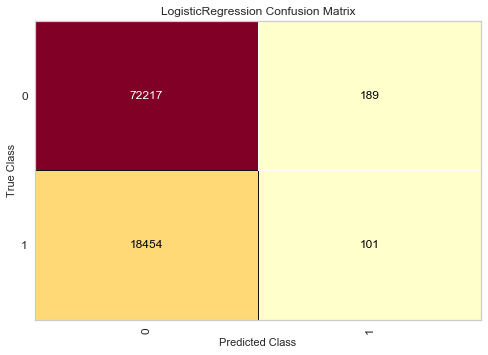

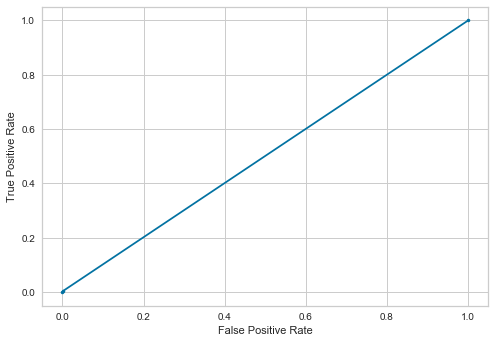

---------Nearest Neighbors------------
Accuracy  (%): 
 75.03875287211002
AUC  (%): 
 65.78074280428322
Precision: 
 40.88232709376922
Recall (%): 
 50.14281864726489
f1 score (%): 
 45.041512356885235
logistic loss :
 8.621427598973987
              precision    recall  f1-score   support

           0       0.86      0.81      0.84     72406
           1       0.41      0.50      0.45     18555

    accuracy                           0.75     90961
   macro avg       0.64      0.66      0.64     90961
weighted avg       0.77      0.75      0.76     90961



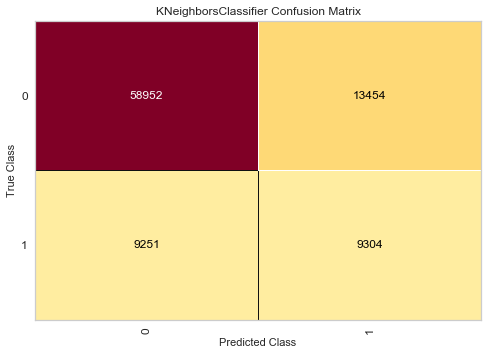

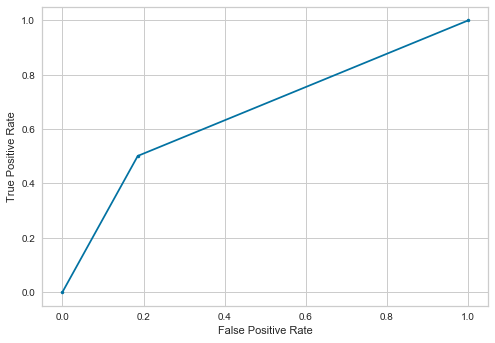

---------Decision Tree------------
Accuracy  (%): 
 82.1648838513209
AUC  (%): 
 78.45583182016989
Precision: 
 54.767356284242375
Recall (%): 
 72.19078415521423
f1 score (%): 
 62.283495687350346
logistic loss :
 6.160128136245274
              precision    recall  f1-score   support

           0       0.92      0.85      0.88     72406
           1       0.55      0.72      0.62     18555

    accuracy                           0.82     90961
   macro avg       0.74      0.78      0.75     90961
weighted avg       0.85      0.82      0.83     90961



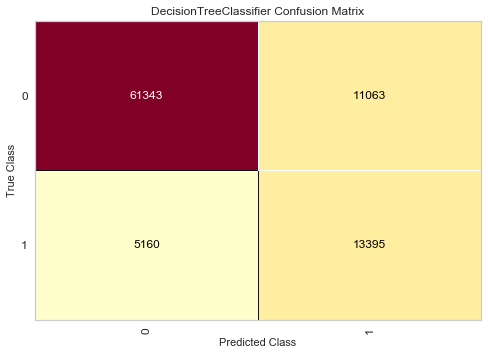

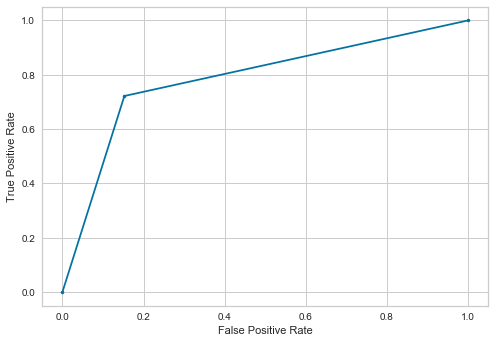

---------Naive Bayes------------
Accuracy  (%): 
 79.24055364386935
AUC  (%): 
 50.414824538057054
Precision: 
 33.057851239669425
Recall (%): 
 1.7246025330099704
f1 score (%): 
 3.278184705219484
logistic loss :
 7.170064454043307
              precision    recall  f1-score   support

           0       0.80      0.99      0.88     72406
           1       0.33      0.02      0.03     18555

    accuracy                           0.79     90961
   macro avg       0.56      0.50      0.46     90961
weighted avg       0.70      0.79      0.71     90961



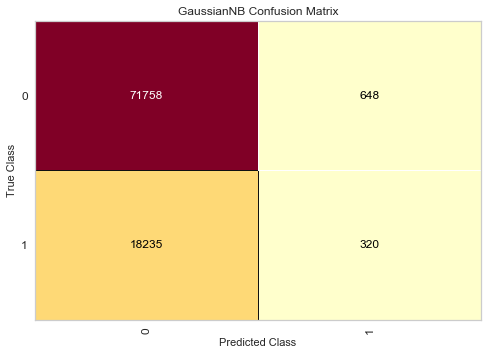

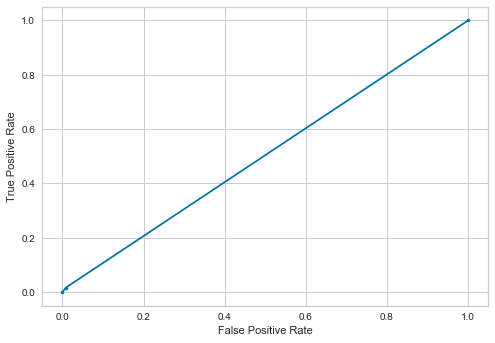

---------Random Forest------------
Accuracy  (%): 
 86.59865216961116
AUC  (%): 
 78.4831240658262
Precision: 
 68.00769535449555
Recall (%): 
 64.77499326327136
f1 score (%): 
 66.35199293364249
logistic loss :
 4.628711262825075
              precision    recall  f1-score   support

           0       0.91      0.92      0.92     72406
           1       0.68      0.65      0.66     18555

    accuracy                           0.87     90961
   macro avg       0.80      0.78      0.79     90961
weighted avg       0.86      0.87      0.86     90961



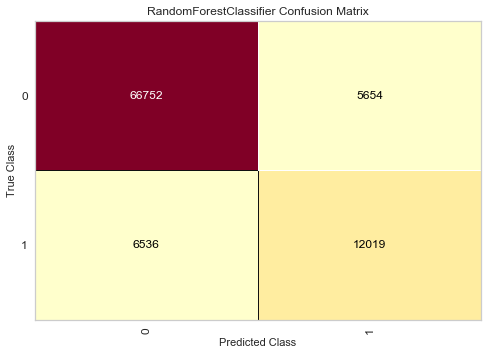

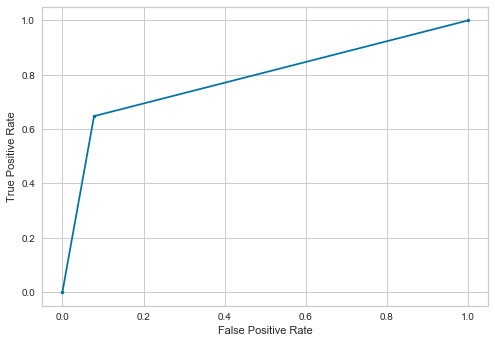

---------xgboost------------
Accuracy  (%): 
 81.66247072921362
AUC  (%): 
 69.41622467898668
Precision: 
 55.7838238015917
Recall (%): 
 48.73080032336298
f1 score (%): 
 52.01933034173282
logistic loss :
 6.333621233076729
              precision    recall  f1-score   support

           0       0.87      0.90      0.89     72406
           1       0.56      0.49      0.52     18555

    accuracy                           0.82     90961
   macro avg       0.72      0.69      0.70     90961
weighted avg       0.81      0.82      0.81     90961



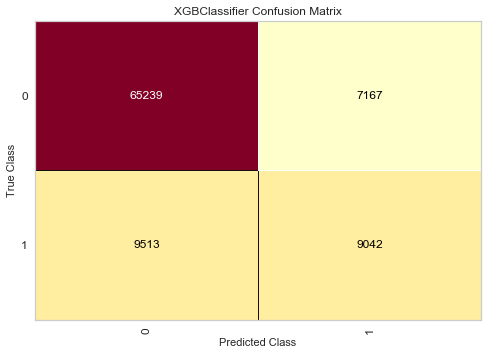

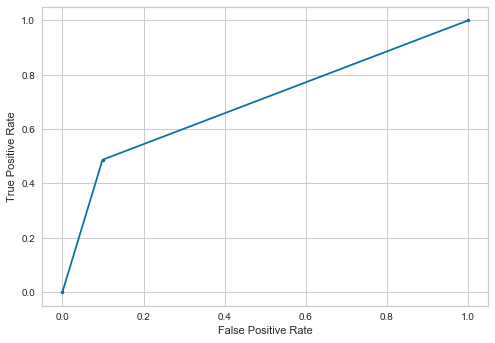

---------Ada Boost------------
Accuracy  (%): 
 76.19529248798936
AUC  (%): 
 59.819383584137334
Precision: 
 39.695316657796695
Recall (%): 
 32.15844785772029
f1 score (%): 
 35.531604489832375
logistic loss :
 8.221934385392702
              precision    recall  f1-score   support

           0       0.83      0.87      0.85     72406
           1       0.40      0.32      0.36     18555

    accuracy                           0.76     90961
   macro avg       0.62      0.60      0.60     90961
weighted avg       0.75      0.76      0.75     90961



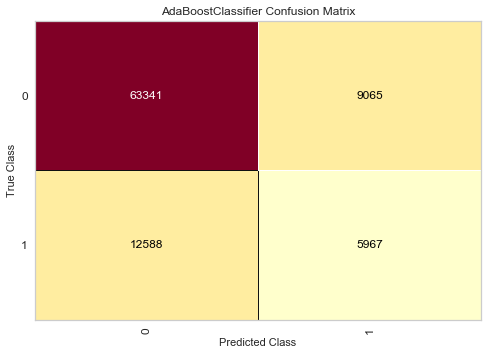

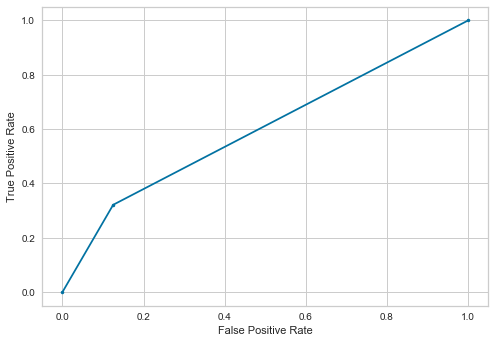

---------SVM------------
Accuracy  (%): 
 79.5329866646145
AUC  (%): 
 50.13956269511215
Precision: 
 37.295081967213115
Recall (%): 
 0.49043384532471035
f1 score (%): 
 0.9681366030107984
logistic loss :
 7.0690573155798555
              precision    recall  f1-score   support

           0       0.80      1.00      0.89     72406
           1       0.37      0.00      0.01     18555

    accuracy                           0.80     90961
   macro avg       0.58      0.50      0.45     90961
weighted avg       0.71      0.80      0.71     90961



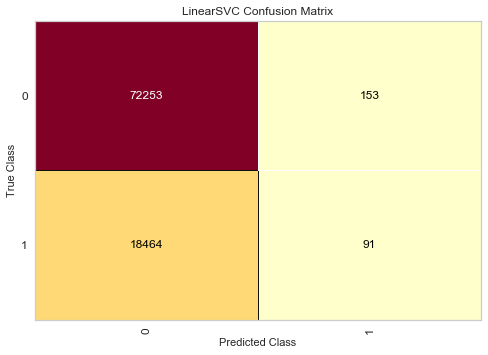

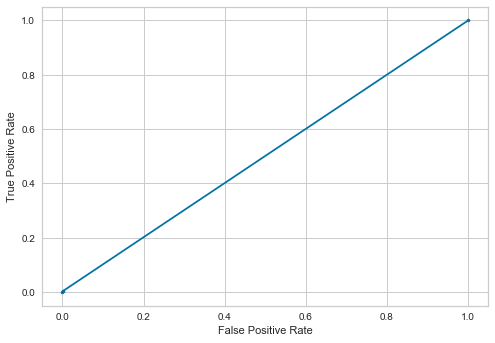

---------MLP Classifier------------
Accuracy  (%): 
 75.9138531898286
AUC  (%): 
 58.13749280020616
Precision: 
 37.83548527491658
Recall (%): 
 28.111021288062517
f1 score (%): 
 32.25626913206147
logistic loss :
 8.319135723948447
              precision    recall  f1-score   support

           0       0.83      0.88      0.85     72406
           1       0.38      0.28      0.32     18555

    accuracy                           0.76     90961
   macro avg       0.60      0.58      0.59     90961
weighted avg       0.74      0.76      0.75     90961



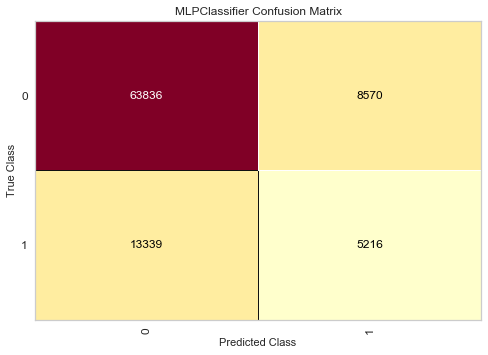

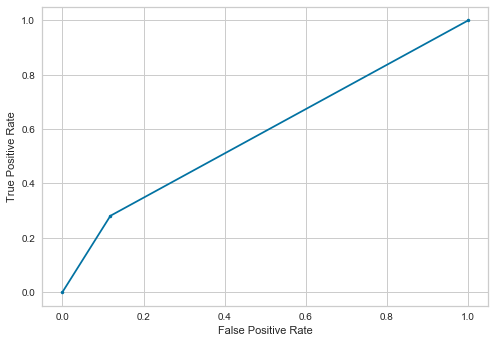

---------light Gradient Boosting------------
Accuracy  (%): 
 79.5329866646145
AUC  (%): 
 64.20462388897755
Precision: 
 49.78291316526611
Recall (%): 
 38.31312314739962
f1 score (%): 
 43.30135526115426
logistic loss :
 7.0691190076760835
              precision    recall  f1-score   support

           0       0.85      0.90      0.88     72406
           1       0.50      0.38      0.43     18555

    accuracy                           0.80     90961
   macro avg       0.67      0.64      0.65     90961
weighted avg       0.78      0.80      0.78     90961



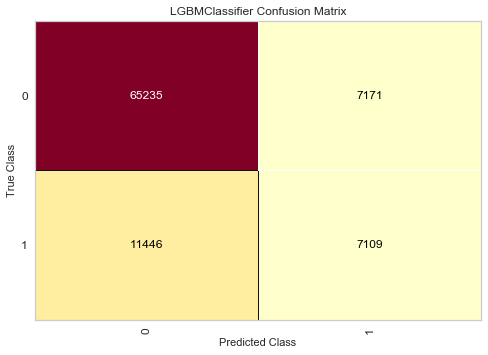

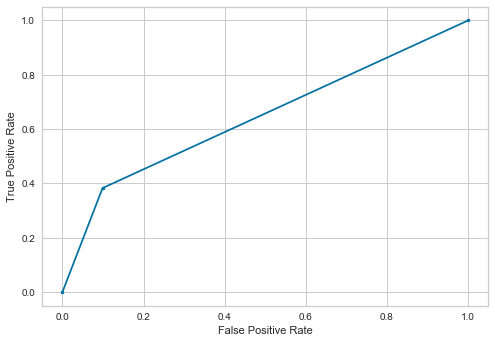

---------Gradient Boosting Classifier------------
Accuracy  (%): 
 77.78498477369422
AUC  (%): 
 60.254756009841905
Precision: 
 43.65786240786241
Recall (%): 
 30.644031258420913
f1 score (%): 
 36.011273314544475
logistic loss :
 7.672858940182089
              precision    recall  f1-score   support

           0       0.83      0.90      0.87     72406
           1       0.44      0.31      0.36     18555

    accuracy                           0.78     90961
   macro avg       0.64      0.60      0.61     90961
weighted avg       0.75      0.78      0.76     90961



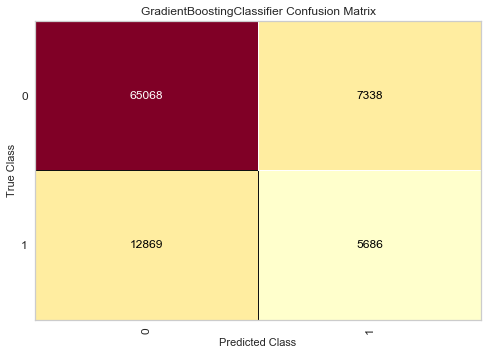

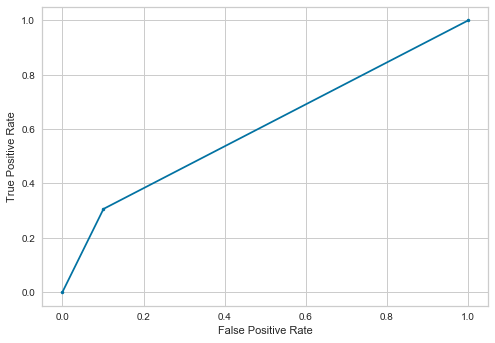

,classifier,Precision,Recall,AUC,Accuracy
0,Logistic Regression,34.827586,0.544328,50.141650,79.504403
1,Nearest Neighbors,40.882327,50.142819,65.780743,75.038753
2,Decision Tree,54.767356,72.190784,78.455832,82.164884
3,Naive Bayes,33.057851,1.724603,50.414825,79.240554
4,Random Forest,68.007695,64.774993,78.483124,86.598652
5,xgboost,55.783824,48.730800,69.416225,81.662471
6,Ada Boost,39.695317,32.158448,59.819384,76.195292
7,SVM,37.295082,0.490434,50.139563,79.532987
8,MLP Classifier,37.835485,28.111021,58.137493,75.913853
9,light Gradient Boosting,49.782913,38.313123,64.204624,79.532987


,classifier,Precision,Recall,AUC,Accuracy
0,Logistic Regression,34.827586,0.544328,50.141650,79.504403
1,Nearest Neighbors,40.882327,50.142819,65.780743,75.038753
2,Decision Tree,54.767356,72.190784,78.455832,82.164884
3,Naive Bayes,33.057851,1.724603,50.414825,79.240554
4,Random Forest,68.007695,64.774993,78.483124,86.598652
5,xgboost,55.783824,48.730800,69.416225,81.662471
6,Ada Boost,39.695317,32.158448,59.819384,76.195292
7,SVM,37.295082,0.490434,50.139563,79.532987
8,MLP Classifier,37.835485,28.111021,58.137493,75.913853
9,light Gradient Boosting,49.782913,38.313123,64.204624,79.532987


In [10]:
t3.fit_model_us(df2,'return')

Undersampling has slightly improved results particulary the recall score of decision tree

---------Logistic Regression------------
Accuracy  (%): 
 79.49670738008598
AUC  (%): 
 50.14884078360106
Precision: 
 34.627831715210355
Recall (%): 
 0.5766639719752088
f1 score (%): 
 1.1344359626802374
logistic loss :
 7.081588167277903
              precision    recall  f1-score   support

           0       0.80      1.00      0.89     72406
           1       0.35      0.01      0.01     18555

    accuracy                           0.79     90961
   macro avg       0.57      0.50      0.45     90961
weighted avg       0.70      0.79      0.71     90961



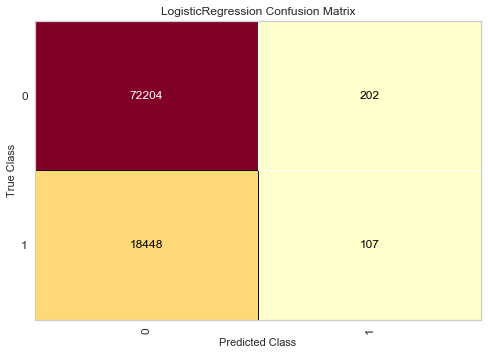

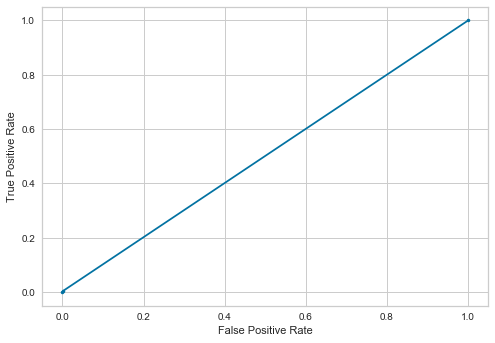

---------Nearest Neighbors------------
Accuracy  (%): 
 76.109541451831
AUC  (%): 
 67.6798732599588
Precision: 
 43.098052851182196
Recall (%): 
 53.44112099164645
f1 score (%): 
 47.71551620431634
logistic loss :
 8.251587143581977
              precision    recall  f1-score   support

           0       0.87      0.82      0.85     72406
           1       0.43      0.53      0.48     18555

    accuracy                           0.76     90961
   macro avg       0.65      0.68      0.66     90961
weighted avg       0.78      0.76      0.77     90961



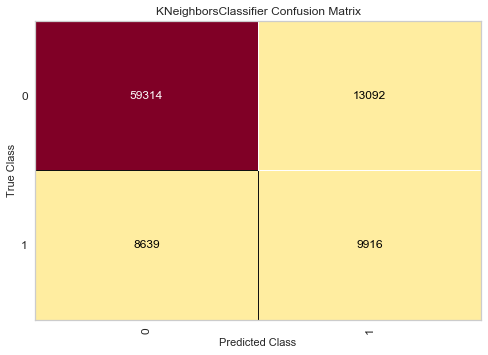

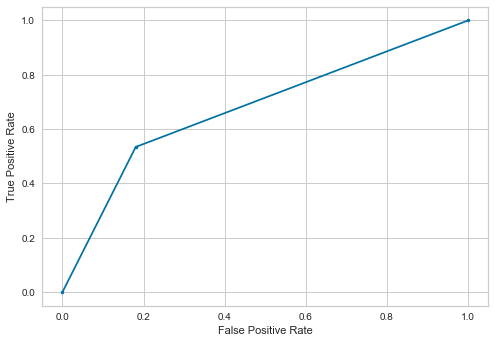

---------Decision Tree------------
Accuracy  (%): 
 86.0775497191104
AUC  (%): 
 79.01157131163427
Precision: 
 65.50181569391084
Recall (%): 
 67.07625976825653
f1 score (%): 
 66.27968899776333
logistic loss :
 4.808701593279579
              precision    recall  f1-score   support

           0       0.92      0.91      0.91     72406
           1       0.66      0.67      0.66     18555

    accuracy                           0.86     90961
   macro avg       0.79      0.79      0.79     90961
weighted avg       0.86      0.86      0.86     90961



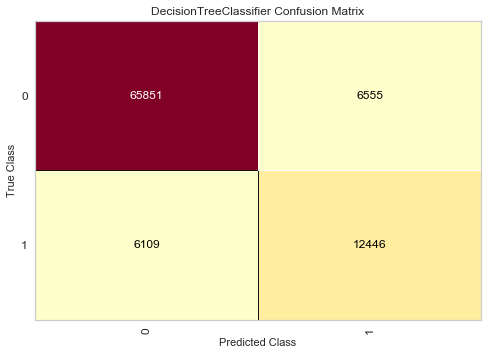

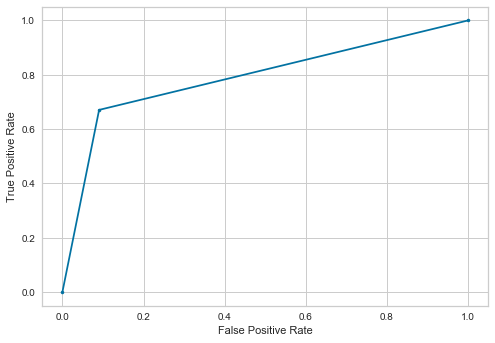

---------Naive Bayes------------
Accuracy  (%): 
 79.21856619870054
AUC  (%): 
 50.38097211841015
Precision: 
 32.02479338842975
Recall (%): 
 1.6707087038534087
f1 score (%): 
 3.175741433181376
logistic loss :
 7.177658736470638
              precision    recall  f1-score   support

           0       0.80      0.99      0.88     72406
           1       0.32      0.02      0.03     18555

    accuracy                           0.79     90961
   macro avg       0.56      0.50      0.46     90961
weighted avg       0.70      0.79      0.71     90961



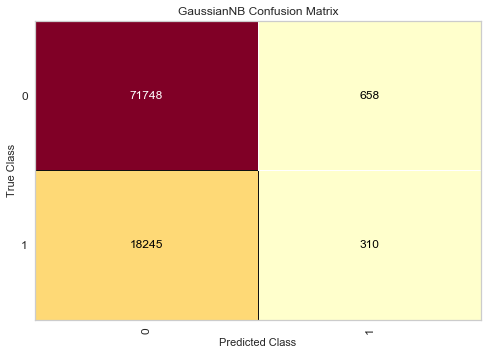

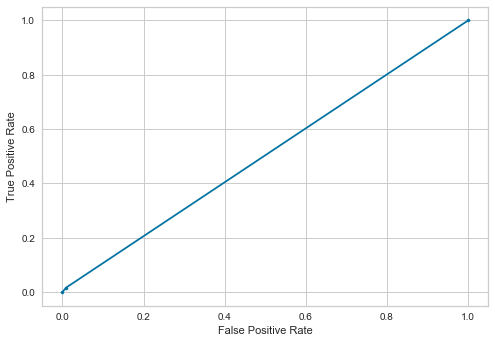

---------Random Forest------------
Accuracy  (%): 
 88.18284759402381
AUC  (%): 
 76.67040587391676
Precision: 
 79.06180193596425
Recall (%): 
 57.22446779843708
f1 score (%): 
 66.39362201031734
logistic loss :
 4.081524564779066
              precision    recall  f1-score   support

           0       0.90      0.96      0.93     72406
           1       0.79      0.57      0.66     18555

    accuracy                           0.88     90961
   macro avg       0.84      0.77      0.80     90961
weighted avg       0.88      0.88      0.87     90961



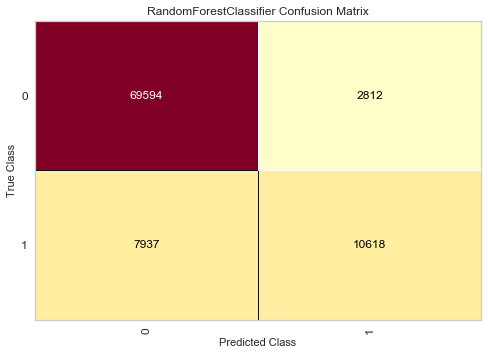

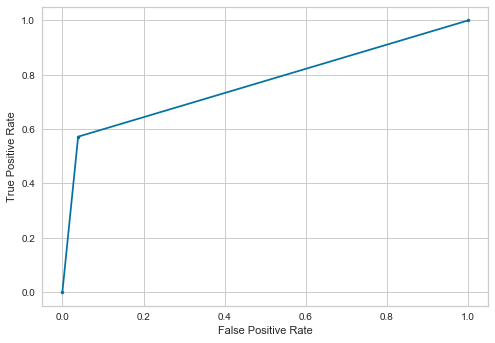

---------xgboost------------
Accuracy  (%): 
 81.58771341563967
AUC  (%): 
 68.7299462811624
Precision: 
 55.77722360764755
Recall (%): 
 47.01158717326866
f1 score (%): 
 51.02064689711645
logistic loss :
 6.359439288022244
              precision    recall  f1-score   support

           0       0.87      0.90      0.89     72406
           1       0.56      0.47      0.51     18555

    accuracy                           0.82     90961
   macro avg       0.71      0.69      0.70     90961
weighted avg       0.81      0.82      0.81     90961



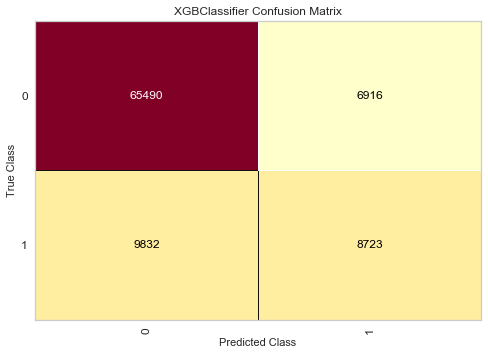

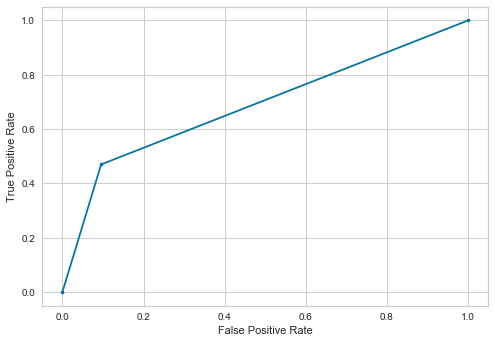

---------Ada Boost------------
Accuracy  (%): 
 76.20848495509064
AUC  (%): 
 59.7775666664456
Precision: 
 39.69271877087508
Recall (%): 
 32.02371328482889
f1 score (%): 
 35.44817300521999
logistic loss :
 8.217377543429182
              precision    recall  f1-score   support

           0       0.83      0.88      0.85     72406
           1       0.40      0.32      0.35     18555

    accuracy                           0.76     90961
   macro avg       0.62      0.60      0.60     90961
weighted avg       0.74      0.76      0.75     90961



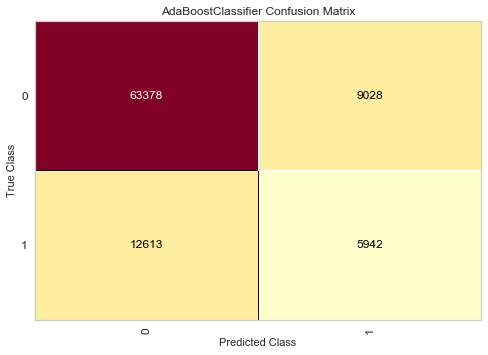

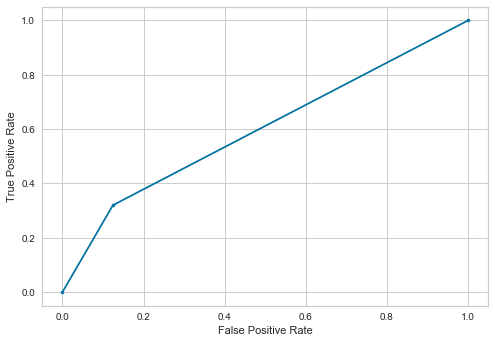

---------SVM------------
Accuracy  (%): 
 79.5164960807379
AUC  (%): 
 50.13321271941113
Precision: 
 35.361216730038024
Recall (%): 
 0.5012126111560227
f1 score (%): 
 0.9884153470081838
logistic loss :
 7.0747531109106
              precision    recall  f1-score   support

           0       0.80      1.00      0.89     72406
           1       0.35      0.01      0.01     18555

    accuracy                           0.80     90961
   macro avg       0.58      0.50      0.45     90961
weighted avg       0.71      0.80      0.71     90961



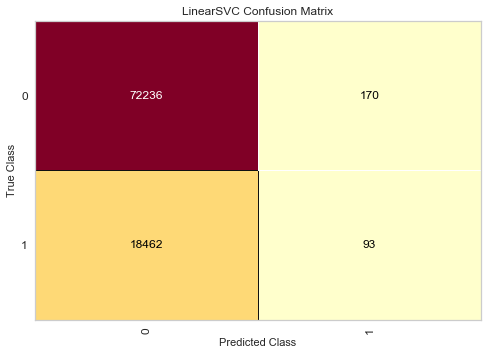

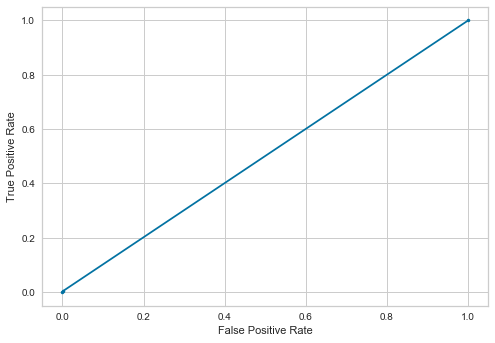

---------MLP Classifier------------
Accuracy  (%): 
 76.69220874880443
AUC  (%): 
 57.41790556563463
Precision: 
 38.8561320754717
Recall (%): 
 24.861223389921854
f1 score (%): 
 30.32175370559043
logistic loss :
 8.050289713462332
              precision    recall  f1-score   support

           0       0.82      0.90      0.86     72406
           1       0.39      0.25      0.30     18555

    accuracy                           0.77     90961
   macro avg       0.61      0.57      0.58     90961
weighted avg       0.73      0.77      0.75     90961



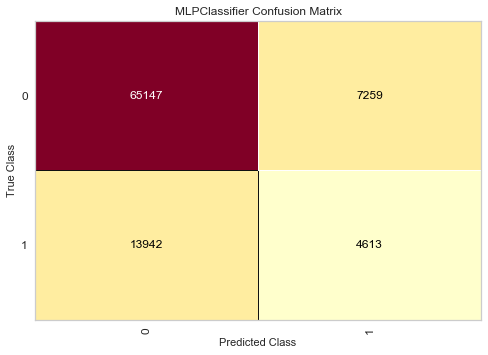

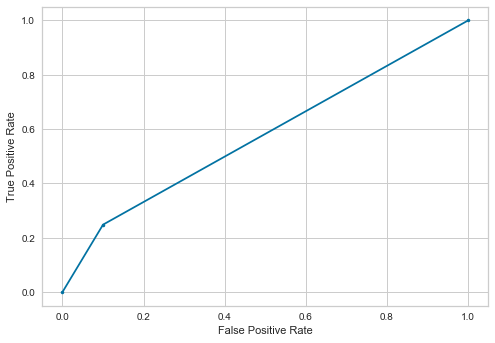

---------light Gradient Boosting------------
Accuracy  (%): 
 79.53518540913139
AUC  (%): 
 64.11782278814886
Precision: 
 49.78858350951374
Recall (%): 
 38.07599029911075
f1 score (%): 
 43.151626202473665
logistic loss :
 7.068359183858496
              precision    recall  f1-score   support

           0       0.85      0.90      0.88     72406
           1       0.50      0.38      0.43     18555

    accuracy                           0.80     90961
   macro avg       0.67      0.64      0.65     90961
weighted avg       0.78      0.80      0.78     90961



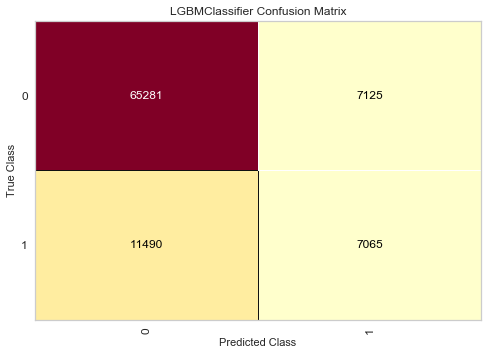

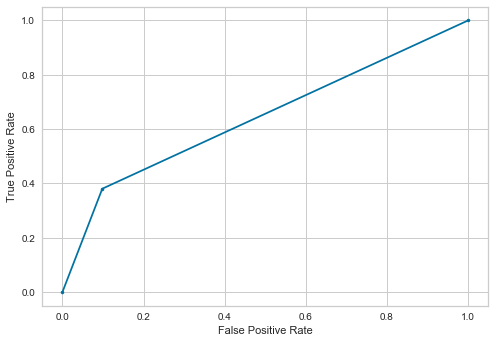

---------Gradient Boosting Classifier------------
Accuracy  (%): 
 77.92130693374084
AUC  (%): 
 59.97162233771567
Precision: 
 43.903606766677306
Recall (%): 
 29.65238480194018
f1 score (%): 
 35.3974330105832
logistic loss :
 7.6257722266567605
              precision    recall  f1-score   support

           0       0.83      0.90      0.87     72406
           1       0.44      0.30      0.35     18555

    accuracy                           0.78     90961
   macro avg       0.64      0.60      0.61     90961
weighted avg       0.75      0.78      0.76     90961



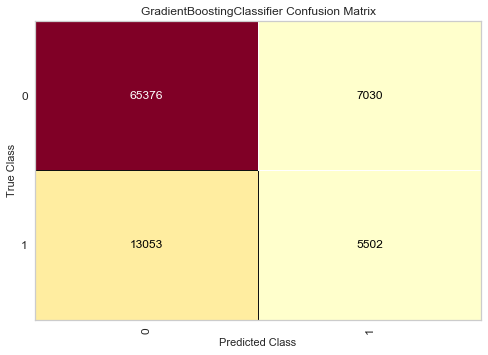

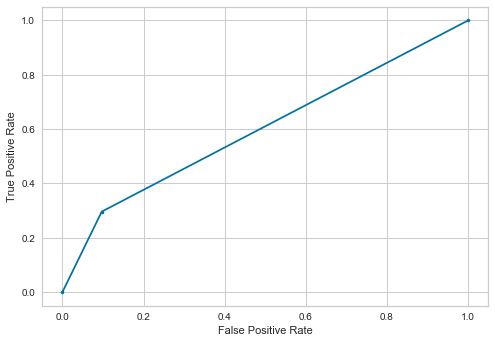

,classifier,Precision,Recall,AUC,Accuracy
0,Logistic Regression,34.627832,0.576664,50.148841,79.496707
1,Nearest Neighbors,43.098053,53.441121,67.679873,76.109541
2,Decision Tree,65.501816,67.076260,79.011571,86.077550
3,Naive Bayes,32.024793,1.670709,50.380972,79.218566
4,Random Forest,79.061802,57.224468,76.670406,88.182848
5,xgboost,55.777224,47.011587,68.729946,81.587713
6,Ada Boost,39.692719,32.023713,59.777567,76.208485
7,SVM,35.361217,0.501213,50.133213,79.516496
8,MLP Classifier,38.856132,24.861223,57.417906,76.692209
9,light Gradient Boosting,49.788584,38.075990,64.117823,79.535185


,classifier,Precision,Recall,AUC,Accuracy
0,Logistic Regression,34.627832,0.576664,50.148841,79.496707
1,Nearest Neighbors,43.098053,53.441121,67.679873,76.109541
2,Decision Tree,65.501816,67.076260,79.011571,86.077550
3,Naive Bayes,32.024793,1.670709,50.380972,79.218566
4,Random Forest,79.061802,57.224468,76.670406,88.182848
5,xgboost,55.777224,47.011587,68.729946,81.587713
6,Ada Boost,39.692719,32.023713,59.777567,76.208485
7,SVM,35.361217,0.501213,50.133213,79.516496
8,MLP Classifier,38.856132,24.861223,57.417906,76.692209
9,light Gradient Boosting,49.788584,38.075990,64.117823,79.535185


In [11]:
t3.fit_model_os(df2,'return')

No major effect of oversampling

E:\ProgramData\Anaconda3\lib\site-packages\sklearn\utils\deprecation.py:143: FutureWarning: The sklearn.metrics.classification module is  deprecated in version 0.22 and will be removed in version 0.24. The corresponding classes / functions should instead be imported from sklearn.metrics. Anything that cannot be imported from sklearn.metrics is now part of the private API.
  warnings.warn(message, FutureWarning)


_____Cross Validation_____
---------Logistic Regression------------
Mean accuracy  (%): 
 79.73189895300258
Mean AUC  (%): 
 56.716568760130556
Mean Precision: 
 26.507187257187258
Mean Recall (%): 
 0.06879204267781747
Mean f1 score (%): 
 0.13716604163309462
---------Nearest Neighbors------------
Mean accuracy  (%): 
 78.40238654090366
Mean AUC  (%): 
 67.78249806479077
Mean Precision: 
 43.990678181066905
Mean Recall (%): 
 24.47949496202537
Mean f1 score (%): 
 31.451860167097102
---------Decision Tree------------
Mean accuracy  (%): 
 80.59381246562998
Mean AUC  (%): 
 70.88604584972325
Mean Precision: 
 51.956723315160346
Mean Recall (%): 
 54.2706076490562
Mean f1 score (%): 
 53.099618885399394
---------Naive Bayes------------
Mean accuracy  (%): 
 79.40281839873347
Mean AUC  (%): 
 63.59598801435351
Mean Precision: 
 33.897113459049166
Mean Recall (%): 
 1.966021766400267
Mean f1 score (%): 
 3.6170184753738477
---------Random Forest------------
Mean accuracy  (%): 
 84.292848

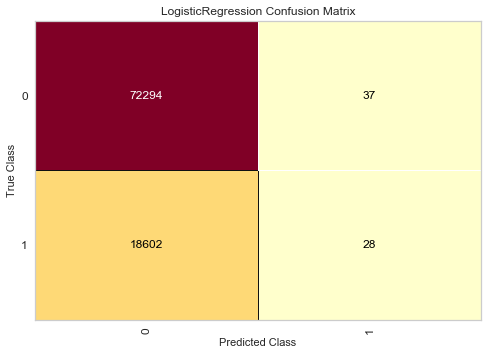

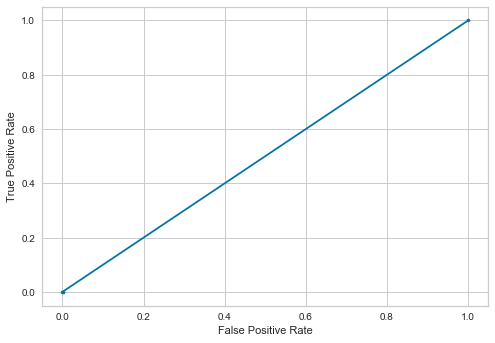

---------Nearest Neighbors------------
Accuracy  (%): 
 79.10203273930586
AUC  (%): 
 60.9323060229471
Precision: 
 48.368489022815325
Recall (%): 
 30.155662909286097
f1 score (%): 
 37.149942139196554
logistic loss :
 7.217954900195093
              precision    recall  f1-score   support

           0       0.84      0.92      0.87     72331
           1       0.48      0.30      0.37     18630

    accuracy                           0.79     90961
   macro avg       0.66      0.61      0.62     90961
weighted avg       0.76      0.79      0.77     90961



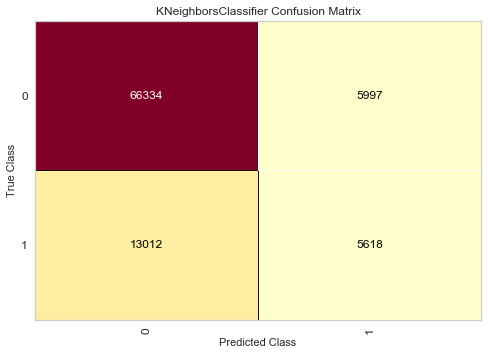

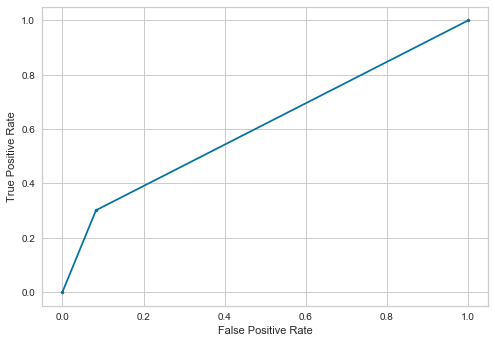

---------Decision Tree------------
Accuracy  (%): 
 83.95246314354503
AUC  (%): 
 76.19467673857227
Precision: 
 60.36174913930425
Recall (%): 
 63.05421363392378
f1 score (%): 
 61.6786117455567
logistic loss :
 5.542690682062507
              precision    recall  f1-score   support

           0       0.90      0.89      0.90     72331
           1       0.60      0.63      0.62     18630

    accuracy                           0.84     90961
   macro avg       0.75      0.76      0.76     90961
weighted avg       0.84      0.84      0.84     90961



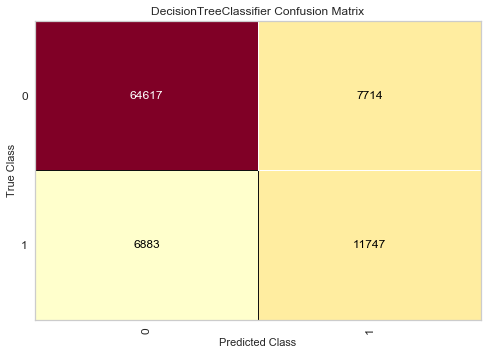

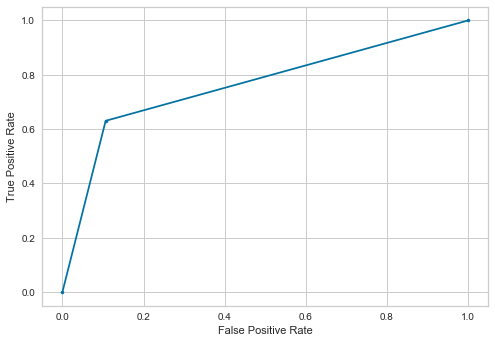

---------Naive Bayes------------
Accuracy  (%): 
 79.17019381932916
AUC  (%): 
 50.394582138579494
Precision: 
 33.01178992497321
Recall (%): 
 1.6532474503488996
f1 score (%): 
 3.1488013085927515
logistic loss :
 7.194365674330389
              precision    recall  f1-score   support

           0       0.80      0.99      0.88     72331
           1       0.33      0.02      0.03     18630

    accuracy                           0.79     90961
   macro avg       0.56      0.50      0.46     90961
weighted avg       0.70      0.79      0.71     90961



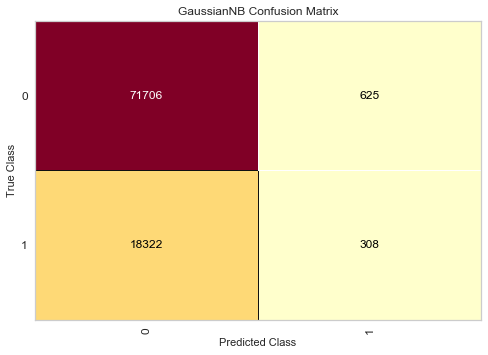

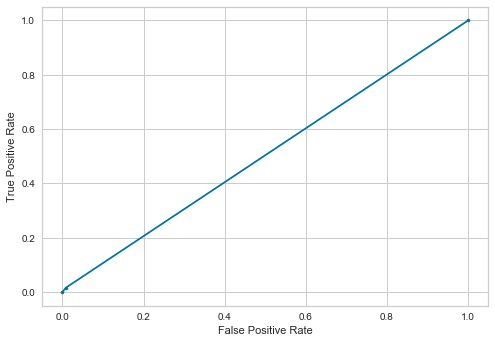

---------Random Forest------------
Accuracy  (%): 
 86.39087081276591
AUC  (%): 
 70.51477817657513
Precision: 
 81.24562631210637
Recall (%): 
 43.6231884057971
f1 score (%): 
 56.76666783082457
logistic loss :
 4.700443190349473
              precision    recall  f1-score   support

           0       0.87      0.97      0.92     72331
           1       0.81      0.44      0.57     18630

    accuracy                           0.86     90961
   macro avg       0.84      0.71      0.74     90961
weighted avg       0.86      0.86      0.85     90961



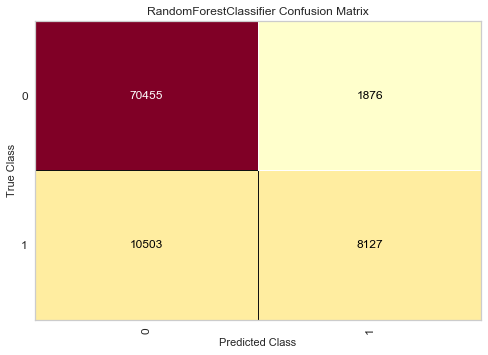

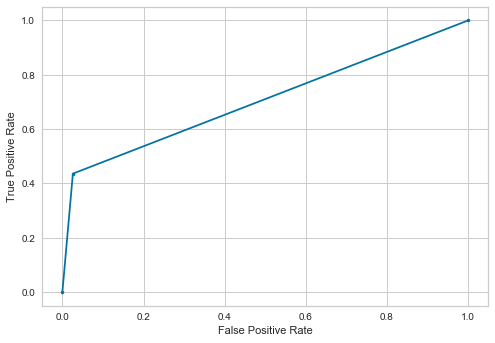

---------xgboost------------
Accuracy  (%): 
 82.62332208309056
AUC  (%): 
 59.92244360487656
Precision: 
 77.27975270479135
Recall (%): 
 21.470746108427267
f1 score (%): 
 33.604973536083335
logistic loss :
 6.0017022682747125
              precision    recall  f1-score   support

           0       0.83      0.98      0.90     72331
           1       0.77      0.21      0.34     18630

    accuracy                           0.83     90961
   macro avg       0.80      0.60      0.62     90961
weighted avg       0.82      0.83      0.78     90961



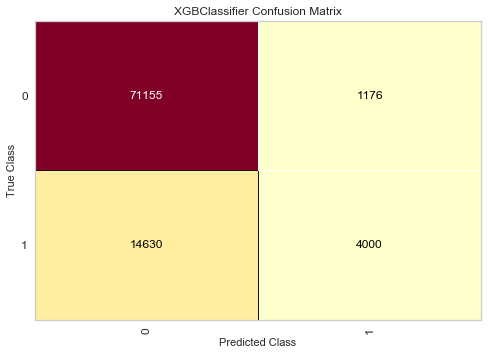

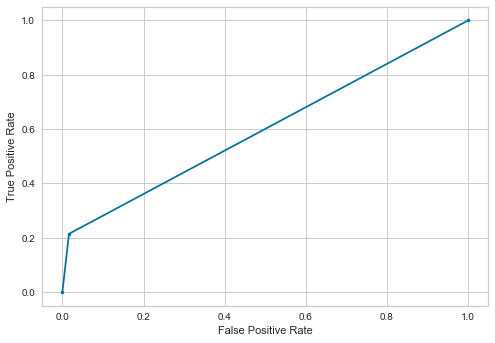

---------Ada Boost------------
Accuracy  (%): 
 79.5329866646145
AUC  (%): 
 50.692440281676674
Precision: 
 50.965824665676074
Recall (%): 
 1.8411164787976382
f1 score (%): 
 3.5538517328912613
logistic loss :
 7.069058871507614
              precision    recall  f1-score   support

           0       0.80      1.00      0.89     72331
           1       0.51      0.02      0.04     18630

    accuracy                           0.80     90961
   macro avg       0.65      0.51      0.46     90961
weighted avg       0.74      0.80      0.71     90961



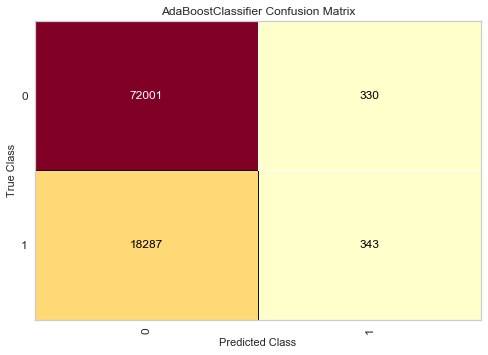

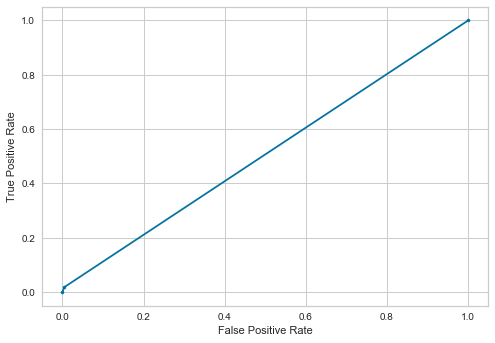

---------SVM------------
Accuracy  (%): 
 79.50989984718726
AUC  (%): 
 50.04428428581662
Precision: 
 43.103448275862064
Recall (%): 
 0.13419216317767044
f1 score (%): 
 0.26755136986301375
logistic loss :
 7.077030164961471
              precision    recall  f1-score   support

           0       0.80      1.00      0.89     72331
           1       0.43      0.00      0.00     18630

    accuracy                           0.80     90961
   macro avg       0.61      0.50      0.44     90961
weighted avg       0.72      0.80      0.70     90961



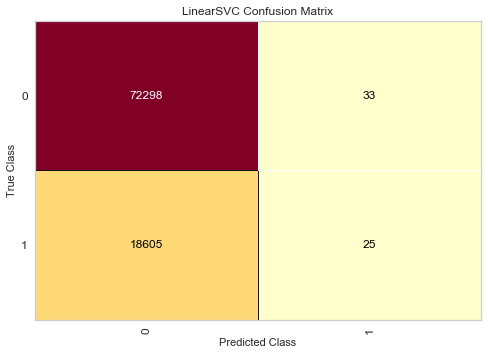

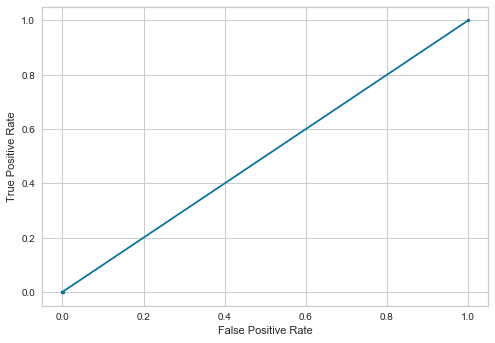

---------MLP Classifier------------
Accuracy  (%): 
 79.51319796396258
AUC  (%): 
 50.04038035525726
Precision: 
 44.89795918367347
Recall (%): 
 0.11808910359634997
f1 score (%): 
 0.23555864874993301
logistic loss :
 7.075890983039887
              precision    recall  f1-score   support

           0       0.80      1.00      0.89     72331
           1       0.45      0.00      0.00     18630

    accuracy                           0.80     90961
   macro avg       0.62      0.50      0.44     90961
weighted avg       0.72      0.80      0.70     90961



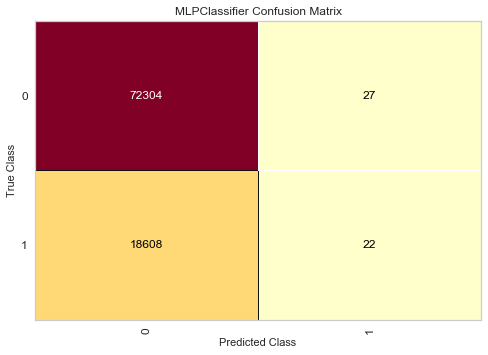

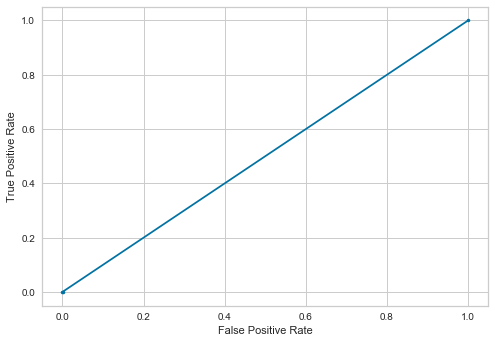

---------light Gradient Boosting------------
Accuracy  (%): 
 80.95007750574422
AUC  (%): 
 54.699872847772426
Precision: 
 75.91560509554141
Recall (%): 
 10.236178207192701
f1 score (%): 
 18.03992053731908
logistic loss :
 6.579615451978954
              precision    recall  f1-score   support

           0       0.81      0.99      0.89     72331
           1       0.76      0.10      0.18     18630

    accuracy                           0.81     90961
   macro avg       0.79      0.55      0.54     90961
weighted avg       0.80      0.81      0.75     90961



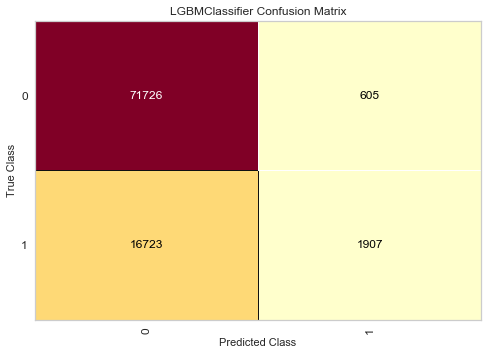

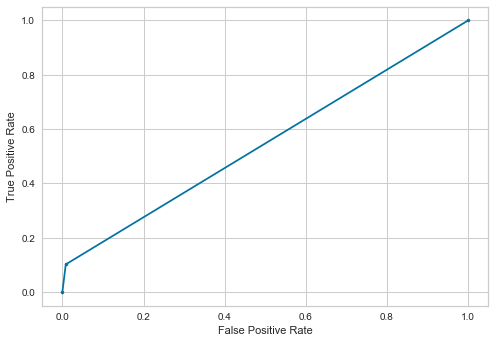

---------Gradient Boosting Classifier------------
Accuracy  (%): 
 79.80123349567397
AUC  (%): 
 51.02450060853347
Precision: 
 71.66947723440134
Recall (%): 
 2.281266774020397
f1 score (%): 
 4.42178640170629
logistic loss :
 6.9764082742720746
              precision    recall  f1-score   support

           0       0.80      1.00      0.89     72331
           1       0.72      0.02      0.04     18630

    accuracy                           0.80     90961
   macro avg       0.76      0.51      0.47     90961
weighted avg       0.78      0.80      0.71     90961



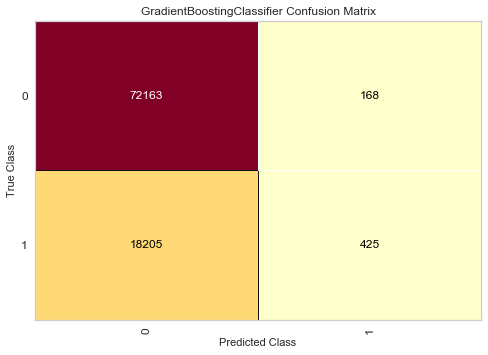

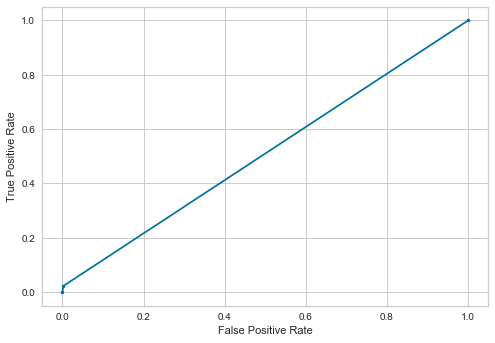

,classifier,Precision,Recall,AUC,Accuracy
0,Logistic Regression,43.076923,0.150295,50.049571,79.508800
1,Nearest Neighbors,48.368489,30.155663,60.932306,79.102033
2,Decision Tree,60.361749,63.054214,76.194677,83.952463
3,Naive Bayes,33.011790,1.653247,50.394582,79.170194
4,Random Forest,81.245626,43.623188,70.514778,86.390871
5,xgboost,77.279753,21.470746,59.922444,82.623322
6,Ada Boost,50.965825,1.841116,50.692440,79.532987
7,SVM,43.103448,0.134192,50.044284,79.509900
8,MLP Classifier,44.897959,0.118089,50.040380,79.513198
9,light Gradient Boosting,75.915605,10.236178,54.699873,80.950078


,classifier,Precision,Recall,AUC,Accuracy
0,Logistic Regression,43.076923,0.150295,50.049571,79.508800
1,Nearest Neighbors,48.368489,30.155663,60.932306,79.102033
2,Decision Tree,60.361749,63.054214,76.194677,83.952463
3,Naive Bayes,33.011790,1.653247,50.394582,79.170194
4,Random Forest,81.245626,43.623188,70.514778,86.390871
5,xgboost,77.279753,21.470746,59.922444,82.623322
6,Ada Boost,50.965825,1.841116,50.692440,79.532987
7,SVM,43.103448,0.134192,50.044284,79.509900
8,MLP Classifier,44.897959,0.118089,50.040380,79.513198
9,light Gradient Boosting,75.915605,10.236178,54.699873,80.950078


In [9]:
t3.fit_model_CV(df2,'return')

delivery_time_hours      27.816084
lng                      12.137519
lat                      12.063031
total_amount_expected    11.686641
unit_price               11.554651
Sub Category              5.700235
r_day                     5.169542
order_day                 4.953740
Category                  4.478182
channel                   2.409607
days_taken                2.030767
dtype: float64
Selected Features =['delivery_time_hours', 'lng', 'lat', 'total_amount_expected', 'unit_price', 'Sub Category', 'r_day']
_____Cross Validation_____
---------Logistic Regression------------
Mean accuracy  (%): 
 79.75755087838486
Mean AUC  (%): 
 55.80317154747638
Mean Precision: 
 10.0
Mean Recall (%): 
 0.0036205648081100647
Mean f1 score (%): 
 0.007238508867173362
---------Nearest Neighbors------------
Mean accuracy  (%): 
 77.63209392284722
Mean AUC  (%): 
 65.92717114241051
Mean Precision: 
 40.342763961937706
Mean Recall (%): 
 21.941408220059003
Mean f1 score (%): 
 28.420723749170413
-

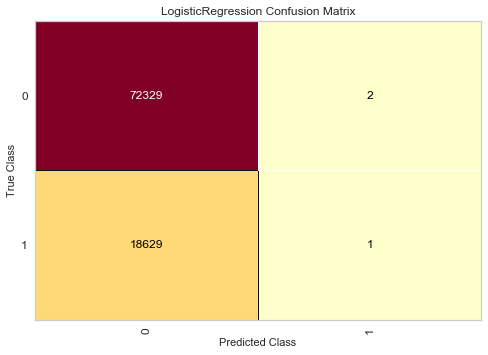

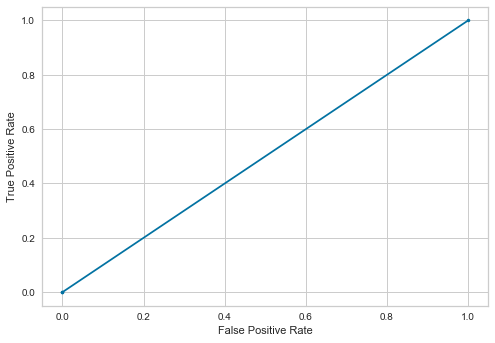

---------Nearest Neighbors------------
Accuracy  (%): 
 78.16316883059773
AUC  (%): 
 58.97904191912276
Precision: 
 44.44644626610215
Recall (%): 
 26.484165324745035
f1 score (%): 
 33.190945477784126
logistic loss :
 7.542228500670209
              precision    recall  f1-score   support

           0       0.83      0.91      0.87     72331
           1       0.44      0.26      0.33     18630

    accuracy                           0.78     90961
   macro avg       0.64      0.59      0.60     90961
weighted avg       0.75      0.78      0.76     90961



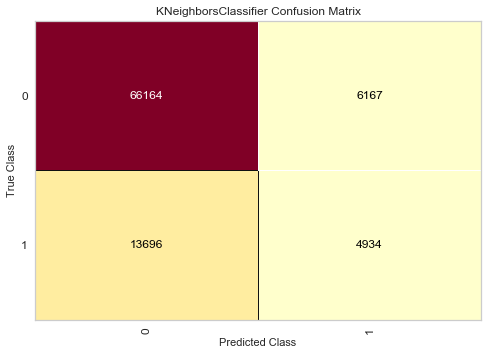

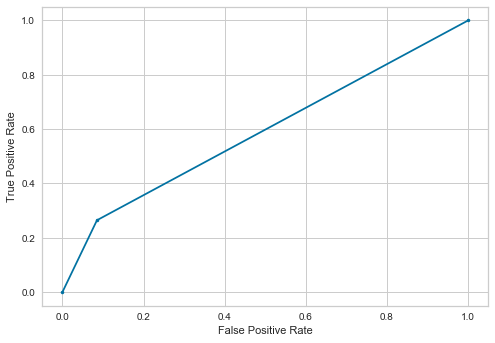

---------Decision Tree------------
Accuracy  (%): 
 82.75304800958652
AUC  (%): 
 73.97994620558602
Precision: 
 57.70721995179713
Recall (%): 
 59.119699409554485
f1 score (%): 
 58.404920988439926
logistic loss :
 5.95695714024489
              precision    recall  f1-score   support

           0       0.89      0.89      0.89     72331
           1       0.58      0.59      0.58     18630

    accuracy                           0.83     90961
   macro avg       0.74      0.74      0.74     90961
weighted avg       0.83      0.83      0.83     90961



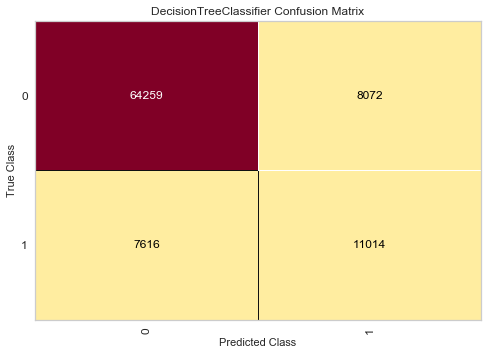

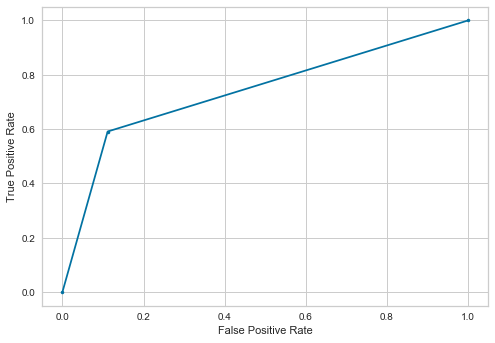

---------Naive Bayes------------
Accuracy  (%): 
 79.1877837754642
AUC  (%): 
 49.993179021121016
Precision: 
 20.07952286282306
Recall (%): 
 0.5421363392377885
f1 score (%): 
 1.0557675220822662
logistic loss :
 7.188288358419773
              precision    recall  f1-score   support

           0       0.80      0.99      0.88     72331
           1       0.20      0.01      0.01     18630

    accuracy                           0.79     90961
   macro avg       0.50      0.50      0.45     90961
weighted avg       0.67      0.79      0.70     90961



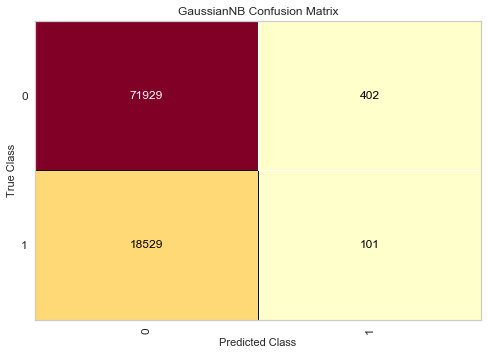

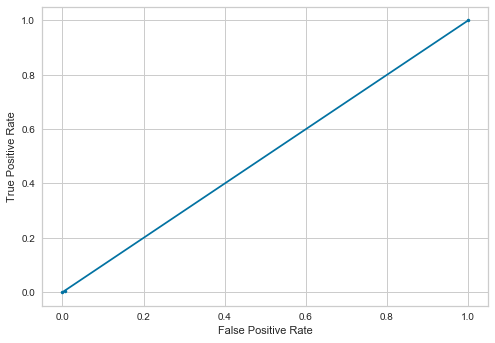

---------Random Forest------------
Accuracy  (%): 
 84.81766911093766
AUC  (%): 
 67.83985585055606
Precision: 
 74.7382467665777
Recall (%): 
 39.08212560386474
f1 score (%): 
 51.325250246722135
logistic loss :
 5.243812950857976
              precision    recall  f1-score   support

           0       0.86      0.97      0.91     72331
           1       0.75      0.39      0.51     18630

    accuracy                           0.85     90961
   macro avg       0.80      0.68      0.71     90961
weighted avg       0.84      0.85      0.83     90961



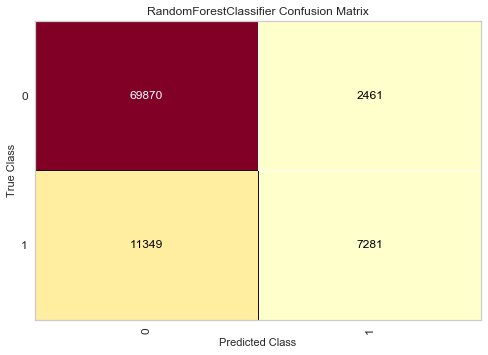

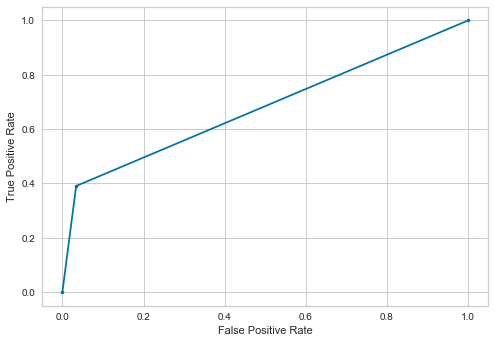

---------xgboost------------
Accuracy  (%): 
 81.95050626092501
AUC  (%): 
 57.58252967383135
Precision: 
 78.62318840579711
Recall (%): 
 16.30703166935051
f1 score (%): 
 27.011647550457894
logistic loss :
 6.2340815439487365
              precision    recall  f1-score   support

           0       0.82      0.99      0.90     72331
           1       0.79      0.16      0.27     18630

    accuracy                           0.82     90961
   macro avg       0.80      0.58      0.58     90961
weighted avg       0.81      0.82      0.77     90961



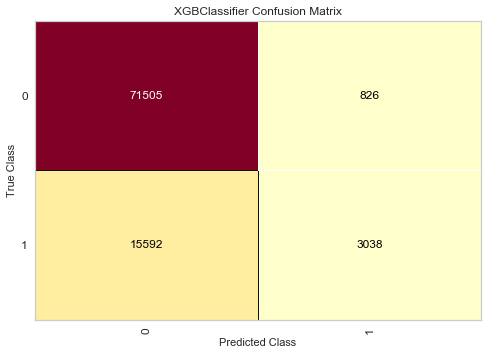

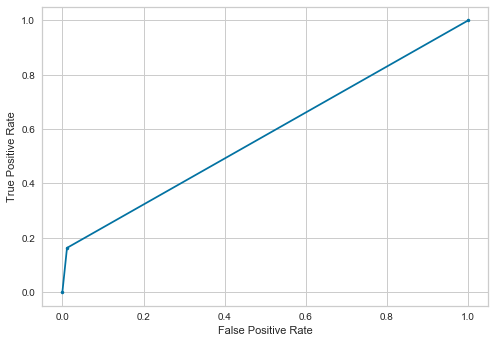

---------Ada Boost------------
Accuracy  (%): 
 79.5164960807379
AUC  (%): 
 50.026513541072916
Precision: 
 46.666666666666664
Recall (%): 
 0.07514761137949544
f1 score (%): 
 0.15005359056806003
logistic loss :
 7.07475175716554
              precision    recall  f1-score   support

           0       0.80      1.00      0.89     72331
           1       0.47      0.00      0.00     18630

    accuracy                           0.80     90961
   macro avg       0.63      0.50      0.44     90961
weighted avg       0.73      0.80      0.70     90961



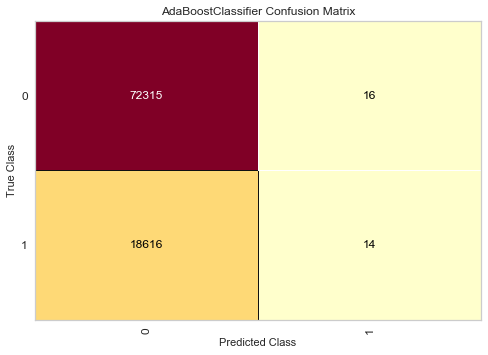

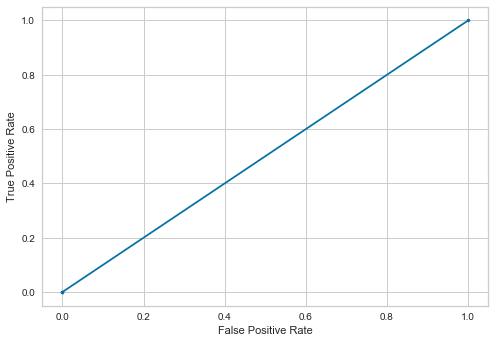

---------SVM------------
Accuracy  (%): 
 79.51759545299633
AUC  (%): 
 50.00130131018644
Precision: 
 33.33333333333333
Recall (%): 
 0.0053676865271068165
f1 score (%): 
 0.010733644609026996
logistic loss :
 7.074371924371718
              precision    recall  f1-score   support

           0       0.80      1.00      0.89     72331
           1       0.33      0.00      0.00     18630

    accuracy                           0.80     90961
   macro avg       0.56      0.50      0.44     90961
weighted avg       0.70      0.80      0.70     90961



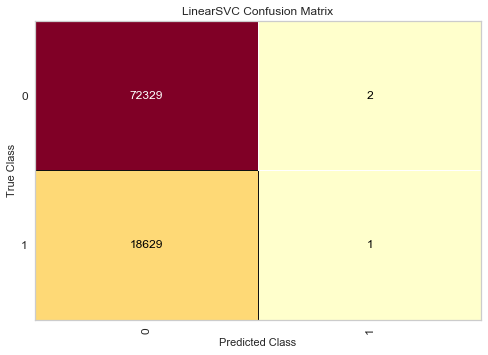

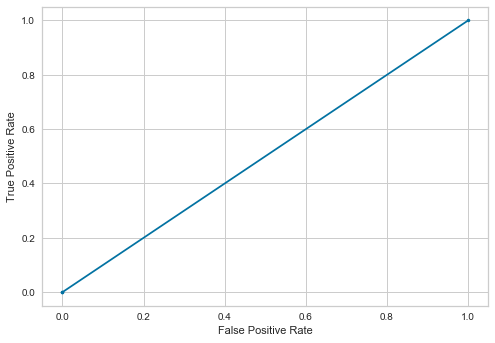

---------MLP Classifier------------
Accuracy  (%): 
 79.51209859170415
AUC  (%): 
 50.0058152843937
Precision: 
 31.25
Recall (%): 
 0.026838432635534086
f1 score (%): 
 0.05363080553469913
logistic loss :
 7.076270552117141
              precision    recall  f1-score   support

           0       0.80      1.00      0.89     72331
           1       0.31      0.00      0.00     18630

    accuracy                           0.80     90961
   macro avg       0.55      0.50      0.44     90961
weighted avg       0.70      0.80      0.70     90961



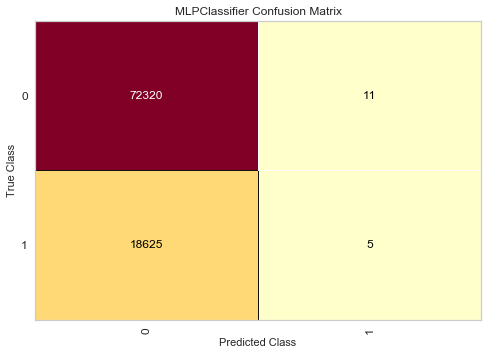

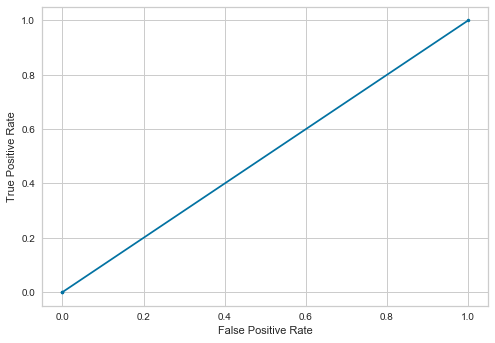

---------light Gradient Boosting------------
Accuracy  (%): 
 80.6609426017744
AUC  (%): 
 53.481929851132506
Precision: 
 79.94236311239193
Recall (%): 
 7.444981213097155
f1 score (%): 
 13.62140928062853
logistic loss :
 6.679476850768787
              precision    recall  f1-score   support

           0       0.81      1.00      0.89     72331
           1       0.80      0.07      0.14     18630

    accuracy                           0.81     90961
   macro avg       0.80      0.53      0.51     90961
weighted avg       0.81      0.81      0.74     90961



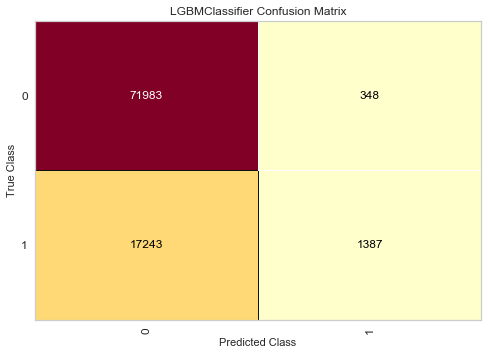

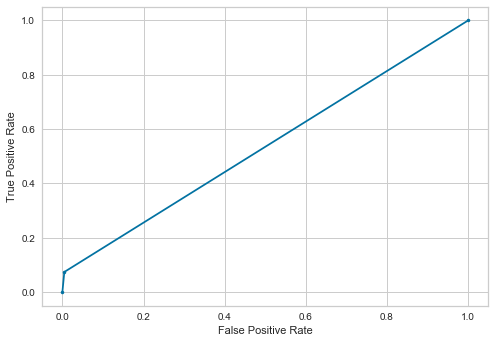

---------Gradient Boosting Classifier------------
Accuracy  (%): 
 79.73197304339223
AUC  (%): 
 50.648190503529456
Precision: 
 80.12422360248446
Recall (%): 
 1.3848631239935587
f1 score (%): 
 2.7226677923174334
logistic loss :
 7.00032907279833
              precision    recall  f1-score   support

           0       0.80      1.00      0.89     72331
           1       0.80      0.01      0.03     18630

    accuracy                           0.80     90961
   macro avg       0.80      0.51      0.46     90961
weighted avg       0.80      0.80      0.71     90961



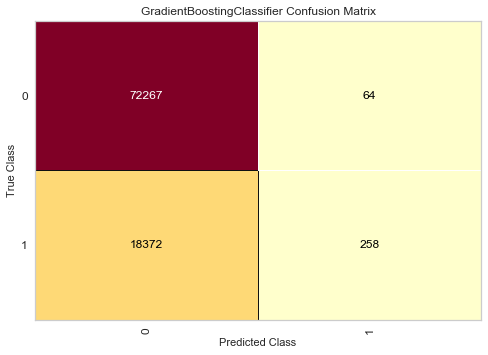

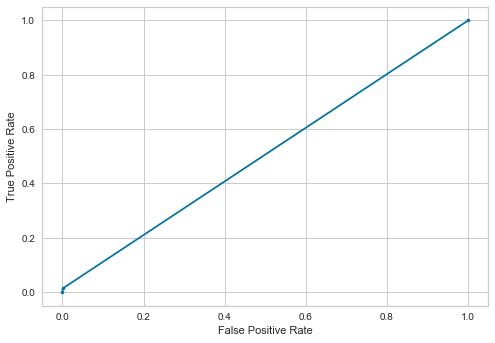

,classifier,Precision,Recall,AUC,Accuracy
0,Logistic Regression,33.333333,0.005368,50.001301,79.517595
1,Nearest Neighbors,44.446446,26.484165,58.979042,78.163169
2,Decision Tree,57.707220,59.119699,73.979946,82.753048
3,Naive Bayes,20.079523,0.542136,49.993179,79.187784
4,Random Forest,74.738247,39.082126,67.839856,84.817669
5,xgboost,78.623188,16.307032,57.582530,81.950506
6,Ada Boost,46.666667,0.075148,50.026514,79.516496
7,SVM,33.333333,0.005368,50.001301,79.517595
8,MLP Classifier,31.250000,0.026838,50.005815,79.512099
9,light Gradient Boosting,79.942363,7.444981,53.481930,80.660943


,classifier,Precision,Recall,AUC,Accuracy
0,Logistic Regression,33.333333,0.005368,50.001301,79.517595
1,Nearest Neighbors,44.446446,26.484165,58.979042,78.163169
2,Decision Tree,57.707220,59.119699,73.979946,82.753048
3,Naive Bayes,20.079523,0.542136,49.993179,79.187784
4,Random Forest,74.738247,39.082126,67.839856,84.817669
5,xgboost,78.623188,16.307032,57.582530,81.950506
6,Ada Boost,46.666667,0.075148,50.026514,79.516496
7,SVM,33.333333,0.005368,50.001301,79.517595
8,MLP Classifier,31.250000,0.026838,50.005815,79.512099
9,light Gradient Boosting,79.942363,7.444981,53.481930,80.660943


In [10]:
t3.fit_model_CV_FS(df2,'return')

E:\ProgramData\Anaconda3\lib\site-packages\sklearn\utils\deprecation.py:143: FutureWarning: The sklearn.metrics.classification module is  deprecated in version 0.22 and will be removed in version 0.24. The corresponding classes / functions should instead be imported from sklearn.metrics. Anything that cannot be imported from sklearn.metrics is now part of the private API.
  warnings.warn(message, FutureWarning)


_____Cross Validation_____
---------Logistic Regression------------
Mean accuracy  (%): 
 66.6176754149695
Mean AUC  (%): 
 56.67045787317869
Mean Precision: 
 52.116959530003
Mean Recall (%): 
 0.5298607992815446
Mean f1 score (%): 
 1.0488905536683506
---------Nearest Neighbors------------
Mean accuracy  (%): 
 67.57600017419645
Mean AUC  (%): 
 67.04860882003666
Mean Precision: 
 51.80605954227169
Mean Recall (%): 
 41.95330040413111
Mean f1 score (%): 
 46.359488511399356
---------Decision Tree------------
Mean accuracy  (%): 
 70.8124050906033
Mean AUC  (%): 
 67.74378870277702
Mean Precision: 
 56.09951018728295
Mean Recall (%): 
 58.89986528962729
Mean f1 score (%): 
 57.35486778535963
---------Naive Bayes------------
Mean accuracy  (%): 
 66.52919176176763
Mean AUC  (%): 
 63.33991238623561
Mean Precision: 
 47.70780476892428
Mean Recall (%): 
 2.123933542882802
Mean f1 score (%): 
 4.064486523645569
---------Random Forest------------
Mean accuracy  (%): 
 76.04644040443449
Mea

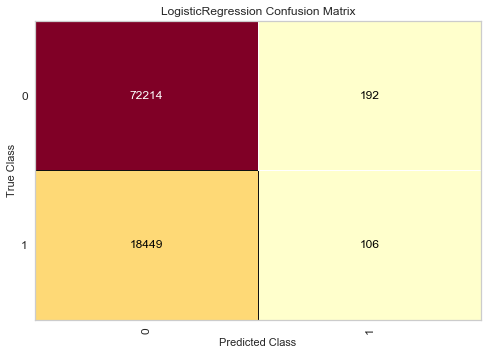

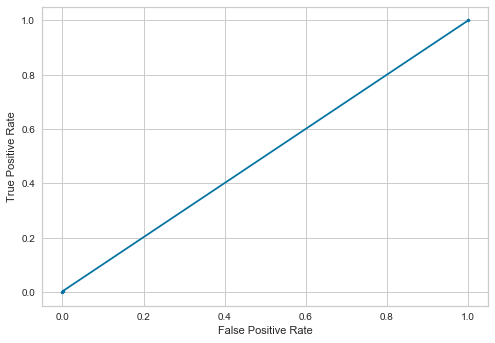

---------Nearest Neighbors------------
Accuracy  (%): 
 73.35561394443772
AUC  (%): 
 62.55302532838031
Precision: 
 37.16042128101975
Recall (%): 
 44.30611694960927
f1 score (%): 
 40.41988298343085
logistic loss :
 9.202767127785863
              precision    recall  f1-score   support

           0       0.85      0.81      0.83     72406
           1       0.37      0.44      0.40     18555

    accuracy                           0.73     90961
   macro avg       0.61      0.63      0.62     90961
weighted avg       0.75      0.73      0.74     90961



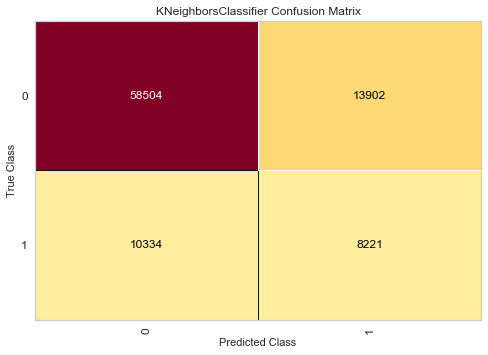

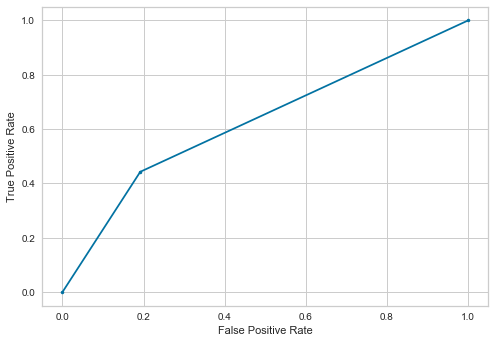

---------Decision Tree------------
Accuracy  (%): 
 76.95715746308858
AUC  (%): 
 72.34683048258974
Precision: 
 45.43868300269317
Recall (%): 
 64.55941794664511
f1 score (%): 
 53.33719221692863
logistic loss :
 7.958842302159868
              precision    recall  f1-score   support

           0       0.90      0.80      0.85     72406
           1       0.45      0.65      0.53     18555

    accuracy                           0.77     90961
   macro avg       0.68      0.72      0.69     90961
weighted avg       0.81      0.77      0.78     90961



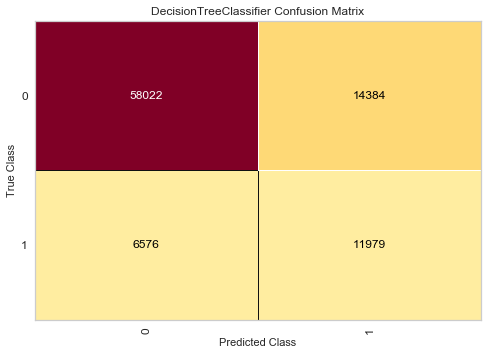

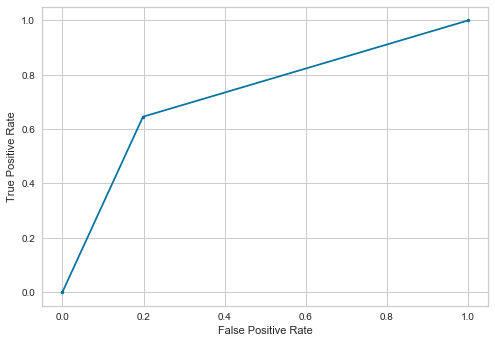

---------Naive Bayes------------
Accuracy  (%): 
 78.88325765987622
AUC  (%): 
 50.288598529923476
Precision: 
 26.52767792954709
Recall (%): 
 1.988682295877122
f1 score (%): 
 3.699989972926903
logistic loss :
 7.293473402689262
              precision    recall  f1-score   support

           0       0.80      0.99      0.88     72406
           1       0.27      0.02      0.04     18555

    accuracy                           0.79     90961
   macro avg       0.53      0.50      0.46     90961
weighted avg       0.69      0.79      0.71     90961



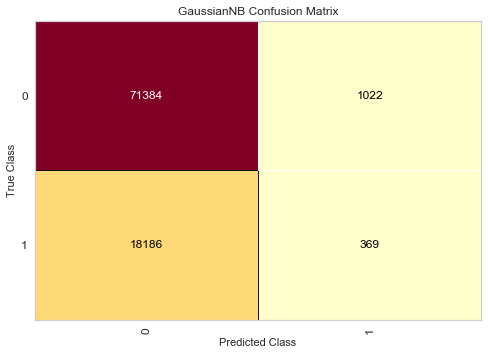

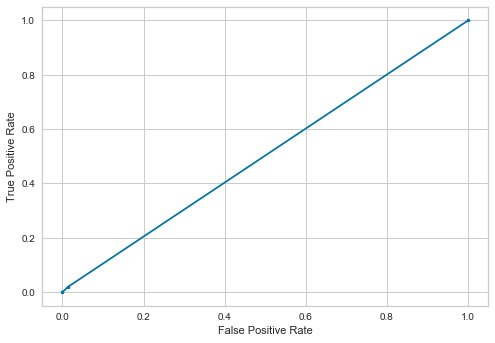

---------Random Forest------------
Accuracy  (%): 
 83.63254581633886
AUC  (%): 
 73.3993642901078
Precision: 
 60.68660022148394
Recall (%): 
 56.11425491781191
f1 score (%): 
 58.31093189964158
logistic loss :
 5.653177694309615
              precision    recall  f1-score   support

           0       0.89      0.91      0.90     72406
           1       0.61      0.56      0.58     18555

    accuracy                           0.84     90961
   macro avg       0.75      0.73      0.74     90961
weighted avg       0.83      0.84      0.83     90961



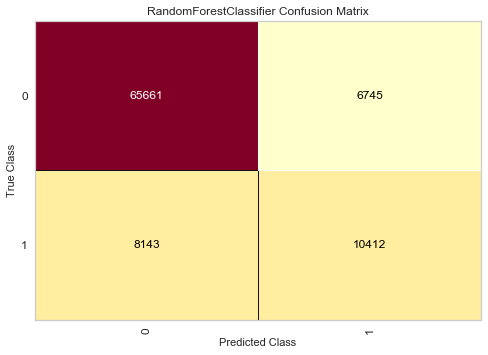

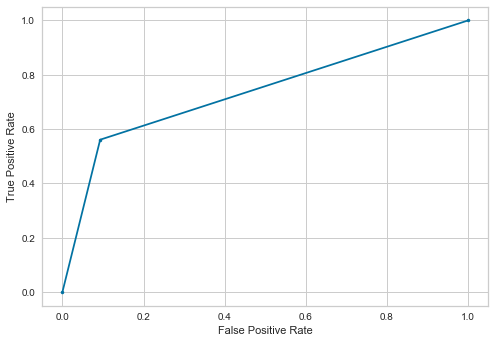

---------xgboost------------
Accuracy  (%): 
 80.95557436703642
AUC  (%): 
 67.91802256286601
Precision: 
 53.89873417721519
Recall (%): 
 45.89598490972784
f1 score (%): 
 49.576480861592195
logistic loss :
 6.577775615447493
              precision    recall  f1-score   support

           0       0.87      0.90      0.88     72406
           1       0.54      0.46      0.50     18555

    accuracy                           0.81     90961
   macro avg       0.70      0.68      0.69     90961
weighted avg       0.80      0.81      0.80     90961



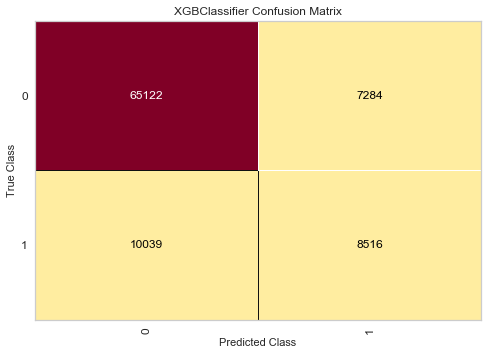

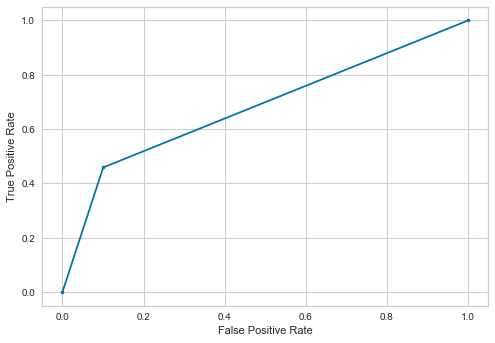

---------Ada Boost------------
Accuracy  (%): 
 76.64273699717461
AUC  (%): 
 58.95206487552862
Precision: 
 40.01780547518362
Recall (%): 
 29.070331447049313
f1 score (%): 
 33.67671848660798
logistic loss :
 8.067383912132623
              precision    recall  f1-score   support

           0       0.83      0.89      0.86     72406
           1       0.40      0.29      0.34     18555

    accuracy                           0.77     90961
   macro avg       0.62      0.59      0.60     90961
weighted avg       0.74      0.77      0.75     90961



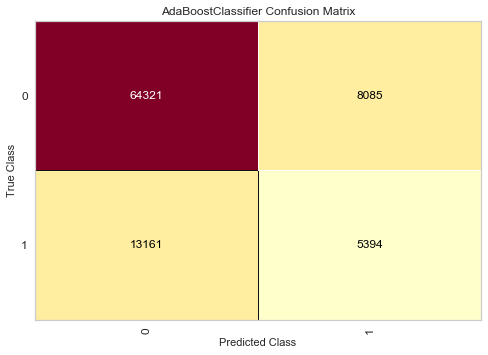

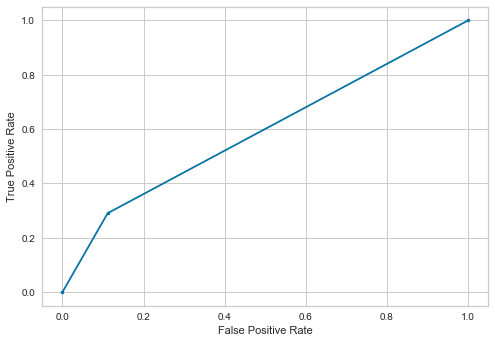

---------SVM------------
Accuracy  (%): 
 79.51979419751322
AUC  (%): 
 50.133280229980755
Precision: 
 35.65891472868217
Recall (%): 
 0.49582322824036645
f1 score (%): 
 0.978047095093818
logistic loss :
 7.073613946570119
              precision    recall  f1-score   support

           0       0.80      1.00      0.89     72406
           1       0.36      0.00      0.01     18555

    accuracy                           0.80     90961
   macro avg       0.58      0.50      0.45     90961
weighted avg       0.71      0.80      0.71     90961



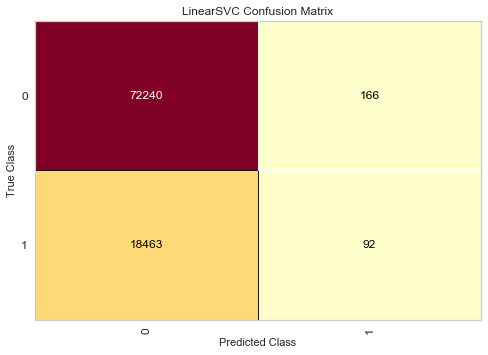

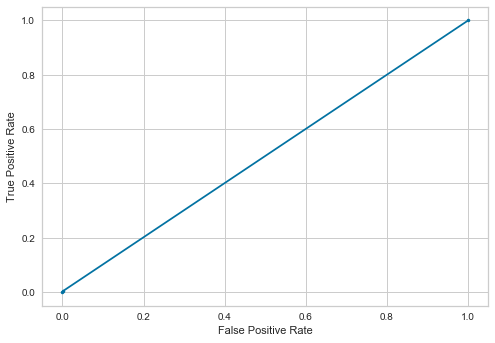

---------MLP Classifier------------
Accuracy  (%): 
 75.79622035817547
AUC  (%): 
 58.63678820794741
Precision: 
 38.03664016591773
Recall (%): 
 29.65238480194018
f1 score (%): 
 33.32525741974561
logistic loss :
 8.35976811932719
              precision    recall  f1-score   support

           0       0.83      0.88      0.85     72406
           1       0.38      0.30      0.33     18555

    accuracy                           0.76     90961
   macro avg       0.60      0.59      0.59     90961
weighted avg       0.74      0.76      0.75     90961



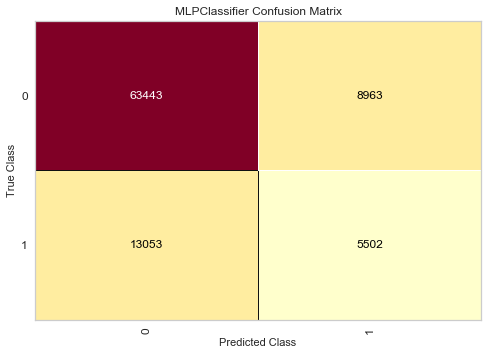

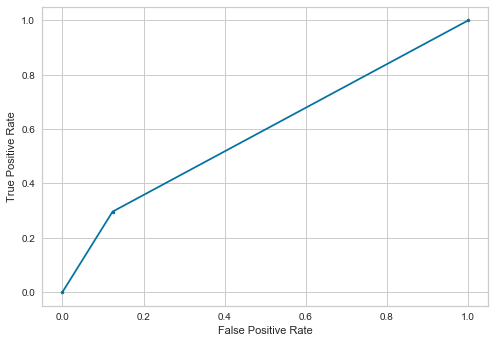

---------light Gradient Boosting------------
Accuracy  (%): 
 79.40655885489386
AUC  (%): 
 63.786510759975265
Precision: 
 49.37042043110194
Recall (%): 
 37.40231743465373
f1 score (%): 
 42.56102048325769
logistic loss :
 7.112785151486656
              precision    recall  f1-score   support

           0       0.85      0.90      0.87     72406
           1       0.49      0.37      0.43     18555

    accuracy                           0.79     90961
   macro avg       0.67      0.64      0.65     90961
weighted avg       0.78      0.79      0.78     90961



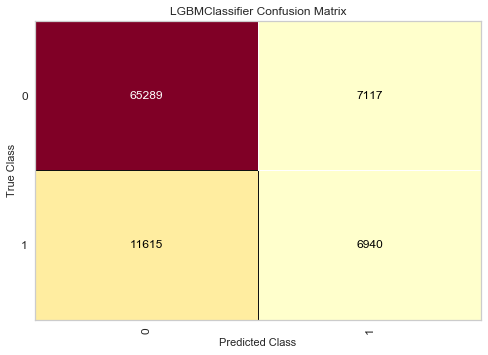

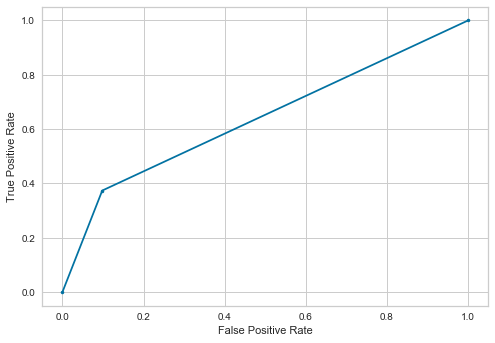

---------Gradient Boosting Classifier------------
Accuracy  (%): 
 77.74430800013192
AUC  (%): 
 59.73217868524885
Precision: 
 43.27894946279348
Recall (%): 
 29.307464295338182
f1 score (%): 
 34.948586118251924
logistic loss :
 7.686906345240892
              precision    recall  f1-score   support

           0       0.83      0.90      0.87     72406
           1       0.43      0.29      0.35     18555

    accuracy                           0.78     90961
   macro avg       0.63      0.60      0.61     90961
weighted avg       0.75      0.78      0.76     90961



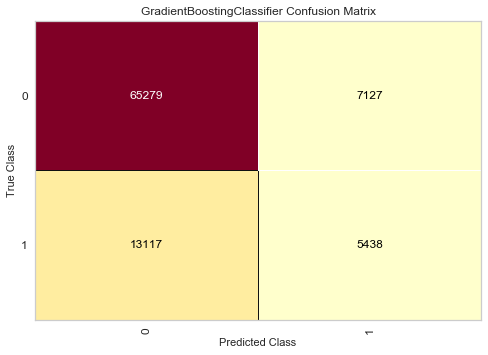

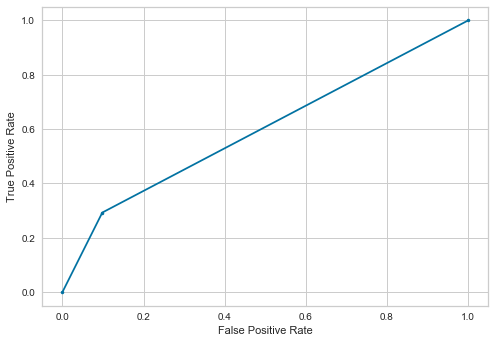

,classifier,Precision,Recall,AUC,Accuracy
0,Logistic Regression,35.570470,0.571275,50.153052,79.506602
1,Nearest Neighbors,37.160421,44.306117,62.553025,73.355614
2,Decision Tree,45.438683,64.559418,72.346830,76.957157
3,Naive Bayes,26.527678,1.988682,50.288599,78.883258
4,Random Forest,60.686600,56.114255,73.399364,83.632546
5,xgboost,53.898734,45.895985,67.918023,80.955574
6,Ada Boost,40.017805,29.070331,58.952065,76.642737
7,SVM,35.658915,0.495823,50.133280,79.519794
8,MLP Classifier,38.036640,29.652385,58.636788,75.796220
9,light Gradient Boosting,49.370420,37.402317,63.786511,79.406559


,classifier,Precision,Recall,AUC,Accuracy
0,Logistic Regression,35.570470,0.571275,50.153052,79.506602
1,Nearest Neighbors,37.160421,44.306117,62.553025,73.355614
2,Decision Tree,45.438683,64.559418,72.346830,76.957157
3,Naive Bayes,26.527678,1.988682,50.288599,78.883258
4,Random Forest,60.686600,56.114255,73.399364,83.632546
5,xgboost,53.898734,45.895985,67.918023,80.955574
6,Ada Boost,40.017805,29.070331,58.952065,76.642737
7,SVM,35.658915,0.495823,50.133280,79.519794
8,MLP Classifier,38.036640,29.652385,58.636788,75.796220
9,light Gradient Boosting,49.370420,37.402317,63.786511,79.406559


In [10]:
t3.fit_model_CV_US(df2,'return')

E:\ProgramData\Anaconda3\lib\site-packages\sklearn\utils\deprecation.py:143: FutureWarning: The sklearn.metrics.classification module is  deprecated in version 0.22 and will be removed in version 0.24. The corresponding classes / functions should instead be imported from sklearn.metrics. Anything that cannot be imported from sklearn.metrics is now part of the private API.
  warnings.warn(message, FutureWarning)


_____Cross Validation_____
---------Logistic Regression------------
Mean accuracy  (%): 
 66.77710564249291
Mean AUC  (%): 
 56.591894526685074
Mean Precision: 
 53.47205055222535
Mean Recall (%): 
 0.542115692608377
Mean f1 score (%): 
 1.0730917578041466
---------Nearest Neighbors------------
Mean accuracy  (%): 
 70.37403565672646
Mean AUC  (%): 
 72.93699379603747
Mean Precision: 
 56.102341064168435
Mean Recall (%): 
 50.10264910003198
Mean f1 score (%): 
 52.93054554900647
---------Decision Tree------------
Mean accuracy  (%): 
 79.25132110718242
Mean AUC  (%): 
 77.9325867620964
Mean Precision: 
 67.27867149702091
Mean Recall (%): 
 73.51036279220284
Mean f1 score (%): 
 70.18790254055214
---------Naive Bayes------------
Mean accuracy  (%): 
 66.8484298364538
Mean AUC  (%): 
 63.655112295825035
Mean Precision: 
 55.30783381439306
Mean Recall (%): 
 1.5640532279037187
Mean f1 score (%): 
 3.041204491732674
---------Random Forest------------
Mean accuracy  (%): 
 83.87977811994534

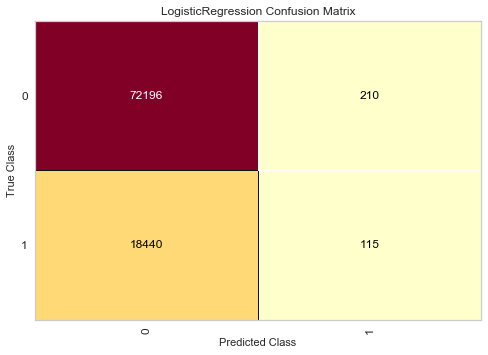

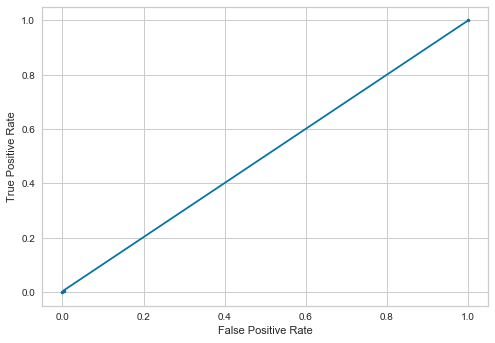

---------Nearest Neighbors------------
Accuracy  (%): 
 74.06031156209805
AUC  (%): 
 64.6811507430409
Precision: 
 39.12104990502504
Recall (%): 
 48.8385879816761
f1 score (%): 
 43.44303554735253
logistic loss :
 8.959374951472368
              precision    recall  f1-score   support

           0       0.86      0.81      0.83     72406
           1       0.39      0.49      0.43     18555

    accuracy                           0.74     90961
   macro avg       0.63      0.65      0.63     90961
weighted avg       0.76      0.74      0.75     90961



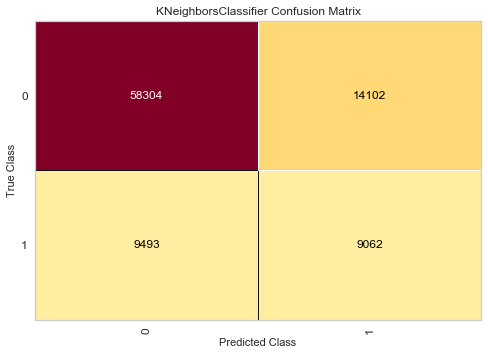

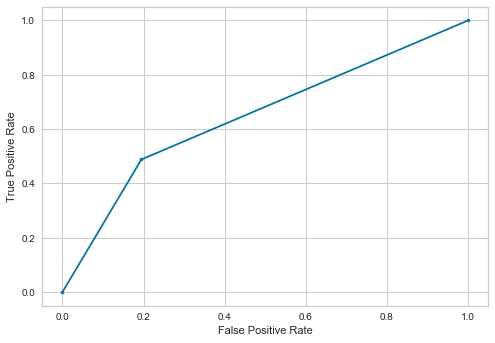

---------Decision Tree------------
Accuracy  (%): 
 82.4913974120777
AUC  (%): 
 76.14773256819964
Precision: 
 56.070752320694595
Recall (%): 
 65.4324979789814
f1 score (%): 
 60.390966971746906
logistic loss :
 6.047340713449759
              precision    recall  f1-score   support

           0       0.91      0.87      0.89     72406
           1       0.56      0.65      0.60     18555

    accuracy                           0.82     90961
   macro avg       0.73      0.76      0.75     90961
weighted avg       0.84      0.82      0.83     90961



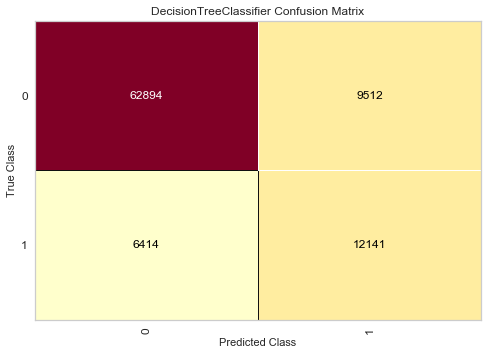

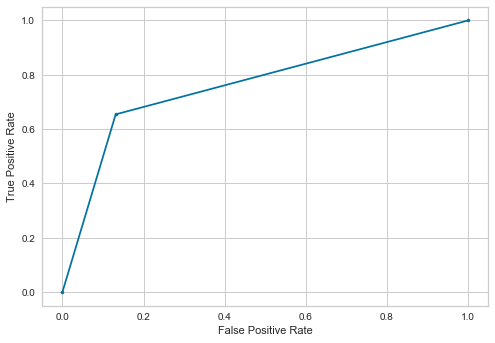

---------Naive Bayes------------
Accuracy  (%): 
 79.17349193610448
AUC  (%): 
 50.49495355514716
Precision: 
 33.10165073848827
Recall (%): 
 2.053354890864996
f1 score (%): 
 3.866842586014412
logistic loss :
 7.193227819782205
              precision    recall  f1-score   support

           0       0.80      0.99      0.88     72406
           1       0.33      0.02      0.04     18555

    accuracy                           0.79     90961
   macro avg       0.56      0.50      0.46     90961
weighted avg       0.70      0.79      0.71     90961



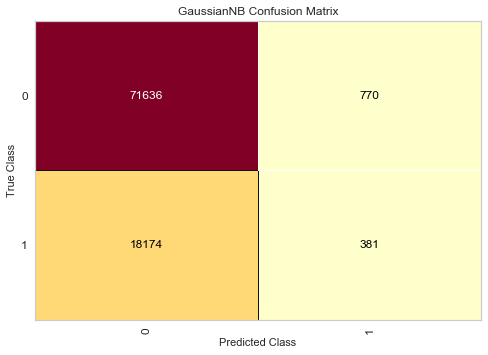

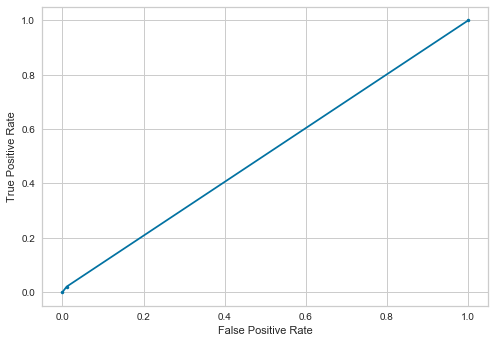

---------Random Forest------------
Accuracy  (%): 
 86.55577665153199
AUC  (%): 
 75.21148839644778
Precision: 
 71.85297775321266
Recall (%): 
 56.04958232282403
f1 score (%): 
 62.97496139755972
logistic loss :
 4.643506053069925
              precision    recall  f1-score   support

           0       0.89      0.94      0.92     72406
           1       0.72      0.56      0.63     18555

    accuracy                           0.87     90961
   macro avg       0.81      0.75      0.77     90961
weighted avg       0.86      0.87      0.86     90961



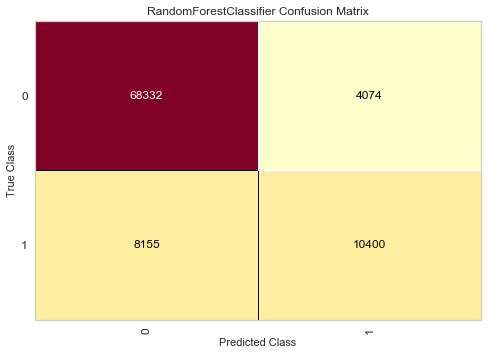

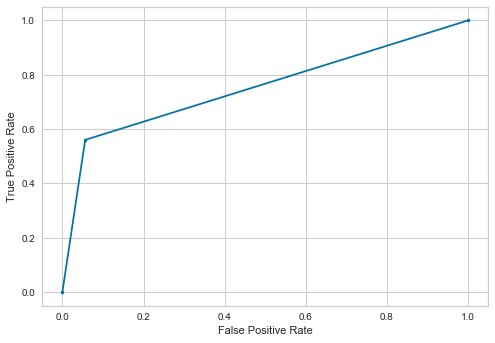

---------xgboost------------
Accuracy  (%): 
 81.20842998647773
AUC  (%): 
 68.38749102684417
Precision: 
 54.60327455919396
Recall (%): 
 46.73133926165454
f1 score (%): 
 50.361550747785685
logistic loss :
 6.490441719155272
              precision    recall  f1-score   support

           0       0.87      0.90      0.88     72406
           1       0.55      0.47      0.50     18555

    accuracy                           0.81     90961
   macro avg       0.71      0.68      0.69     90961
weighted avg       0.80      0.81      0.81     90961



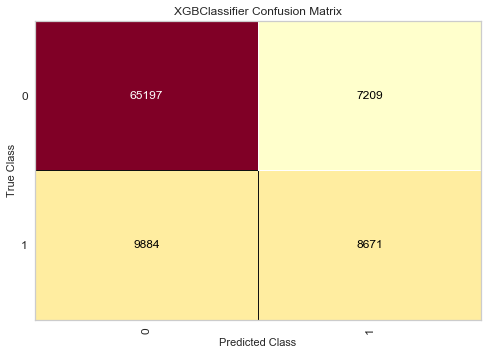

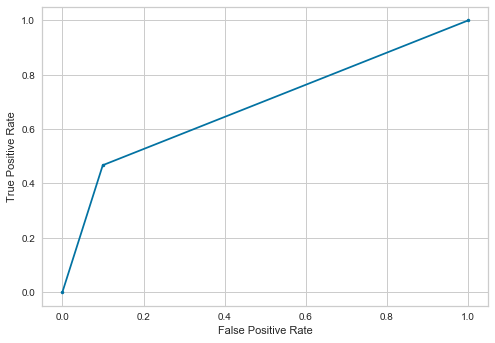

---------Ada Boost------------
Accuracy  (%): 
 76.34810523191258
AUC  (%): 
 59.52255847820249
Precision: 
 39.79725536169919
Recall (%): 
 31.102128806251685
f1 score (%): 
 34.91650532429816
logistic loss :
 8.169151788631106
              precision    recall  f1-score   support

           0       0.83      0.88      0.86     72406
           1       0.40      0.31      0.35     18555

    accuracy                           0.76     90961
   macro avg       0.62      0.60      0.60     90961
weighted avg       0.74      0.76      0.75     90961



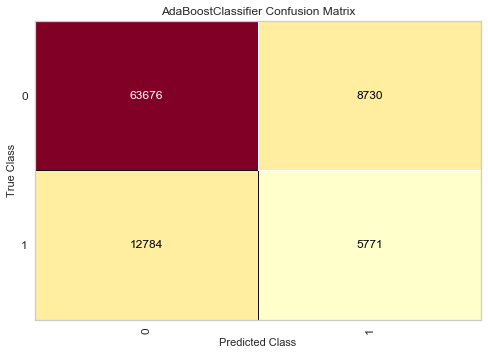

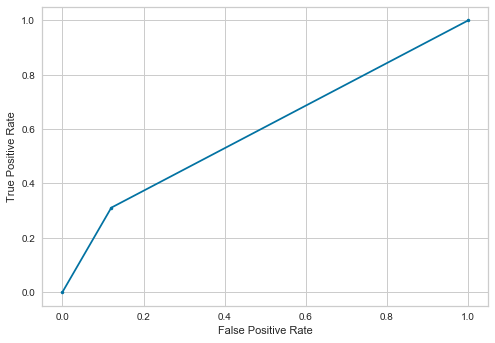

---------SVM------------
Accuracy  (%): 
 79.50550235815349
AUC  (%): 
 50.13031549624441
Precision: 
 34.29602888086642
Recall (%): 
 0.511991376987335
f1 score (%): 
 1.0089209855564993
logistic loss :
 7.078550313658133
              precision    recall  f1-score   support

           0       0.80      1.00      0.89     72406
           1       0.34      0.01      0.01     18555

    accuracy                           0.80     90961
   macro avg       0.57      0.50      0.45     90961
weighted avg       0.70      0.80      0.71     90961



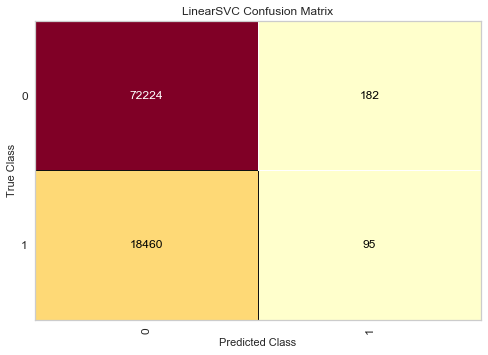

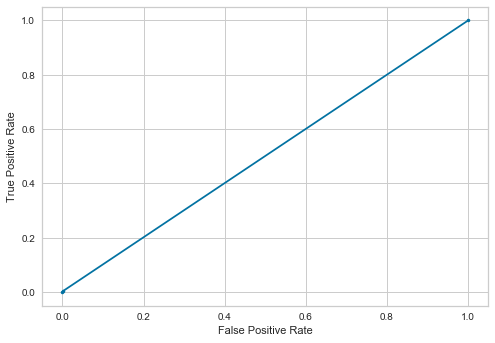

---------MLP Classifier------------
Accuracy  (%): 
 75.7258605336353
AUC  (%): 
 57.963292716905414
Precision: 
 37.32105603913388
Recall (%): 
 27.960118566424146
f1 score (%): 
 31.969435543505053
logistic loss :
 8.384067344158893
              precision    recall  f1-score   support

           0       0.83      0.88      0.85     72406
           1       0.37      0.28      0.32     18555

    accuracy                           0.76     90961
   macro avg       0.60      0.58      0.59     90961
weighted avg       0.73      0.76      0.74     90961



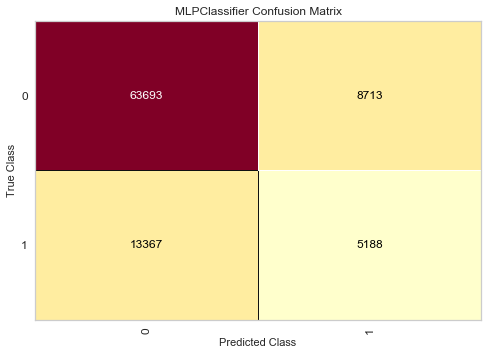

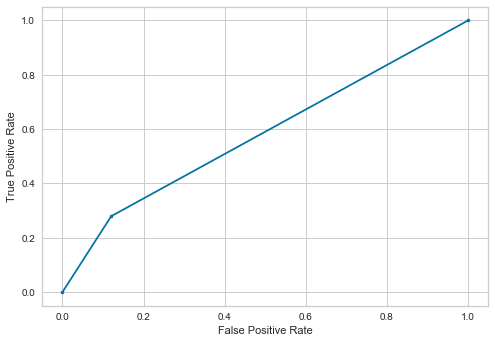

---------light Gradient Boosting------------
Accuracy  (%): 
 79.40655885489386
AUC  (%): 
 64.30558326627494
Precision: 
 49.39279588336192
Recall (%): 
 38.79816760980867
f1 score (%): 
 43.459100513130096
logistic loss :
 7.112787428239707
              precision    recall  f1-score   support

           0       0.85      0.90      0.87     72406
           1       0.49      0.39      0.43     18555

    accuracy                           0.79     90961
   macro avg       0.67      0.64      0.65     90961
weighted avg       0.78      0.79      0.78     90961



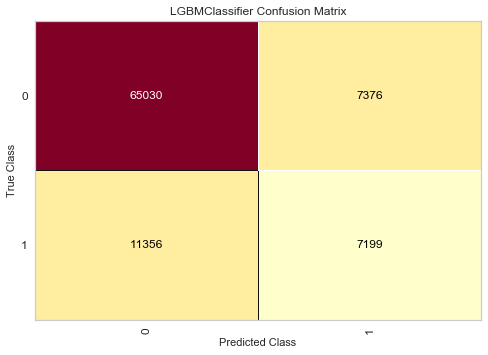

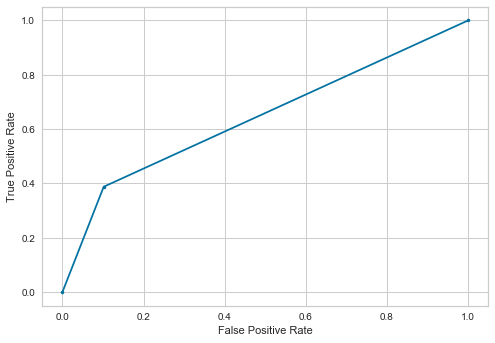

---------Gradient Boosting Classifier------------
Accuracy  (%): 
 77.67724629236706
AUC  (%): 
 60.116937126885475
Precision: 
 43.29604658289917
Recall (%): 
 30.45540285637294
f1 score (%): 
 35.757901730629285
logistic loss :
 7.710071047143746
              precision    recall  f1-score   support

           0       0.83      0.90      0.86     72406
           1       0.43      0.30      0.36     18555

    accuracy                           0.78     90961
   macro avg       0.63      0.60      0.61     90961
weighted avg       0.75      0.78      0.76     90961



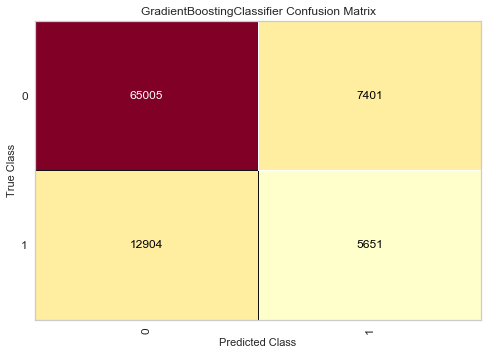

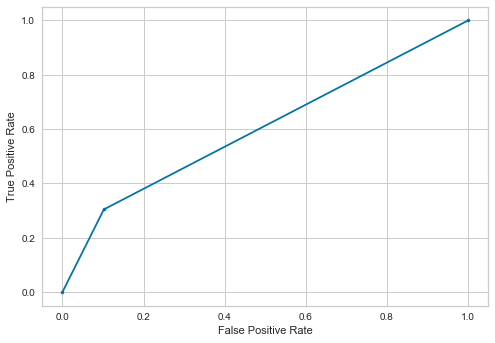

,classifier,Precision,Recall,AUC,Accuracy
0,Logistic Regression,35.384615,0.619779,50.164874,79.496707
1,Nearest Neighbors,39.121050,48.838588,64.681151,74.060312
2,Decision Tree,56.070752,65.432498,76.147733,82.491397
3,Naive Bayes,33.101651,2.053355,50.494954,79.173492
4,Random Forest,71.852978,56.049582,75.211488,86.555777
5,xgboost,54.603275,46.731339,68.387491,81.208430
6,Ada Boost,39.797255,31.102129,59.522558,76.348105
7,SVM,34.296029,0.511991,50.130315,79.505502
8,MLP Classifier,37.321056,27.960119,57.963293,75.725861
9,light Gradient Boosting,49.392796,38.798168,64.305583,79.406559


,classifier,Precision,Recall,AUC,Accuracy
0,Logistic Regression,35.384615,0.619779,50.164874,79.496707
1,Nearest Neighbors,39.121050,48.838588,64.681151,74.060312
2,Decision Tree,56.070752,65.432498,76.147733,82.491397
3,Naive Bayes,33.101651,2.053355,50.494954,79.173492
4,Random Forest,71.852978,56.049582,75.211488,86.555777
5,xgboost,54.603275,46.731339,68.387491,81.208430
6,Ada Boost,39.797255,31.102129,59.522558,76.348105
7,SVM,34.296029,0.511991,50.130315,79.505502
8,MLP Classifier,37.321056,27.960119,57.963293,75.725861
9,light Gradient Boosting,49.392796,38.798168,64.305583,79.406559


In [13]:
t3.fit_model_CV_OS(df2,'return')

delivery_time_hours      27.603374
lng                      12.346898
lat                      12.240485
total_amount_expected    11.639972
unit_price               11.557748
Sub Category              5.651859
r_day                     5.108904
order_day                 4.792215
Category                  4.495879
channel                   2.560914
days_taken                2.001752
dtype: float64
Selected Features =['delivery_time_hours', 'lng', 'lat', 'total_amount_expected', 'unit_price', 'Sub Category', 'r_day']
_____Cross Validation_____
---------Logistic Regression------------
Mean accuracy  (%): 
 66.75716505127261
Mean AUC  (%): 
 55.402963171098605
Mean Precision: 
 55.00000000000001
Mean Recall (%): 
 0.023068050749711647
Mean f1 score (%): 
 0.04611376385372525
---------Nearest Neighbors------------
Mean accuracy  (%): 
 69.35554429140628
Mean AUC  (%): 
 71.32267875418042
Mean Precision: 
 54.371405489040924
Mean Recall (%): 
 48.665505812520735
Mean f1 score (%): 
 51.35858

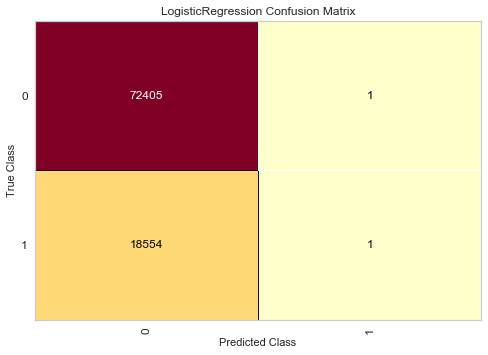

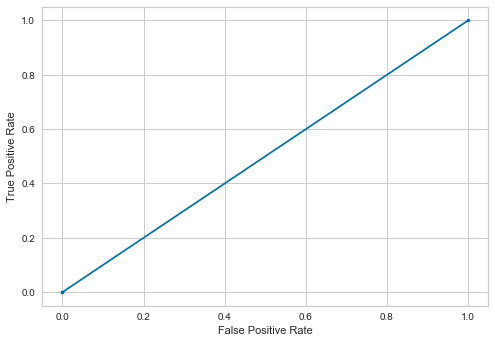

---------Nearest Neighbors------------
Accuracy  (%): 
 72.90267257396027
AUC  (%): 
 62.98600097999743
Precision: 
 36.897337748914026
Recall (%): 
 46.23551603341418
f1 score (%): 
 41.041955700138736
logistic loss :
 9.359214303660407
              precision    recall  f1-score   support

           0       0.85      0.80      0.82     72406
           1       0.37      0.46      0.41     18555

    accuracy                           0.73     90961
   macro avg       0.61      0.63      0.62     90961
weighted avg       0.75      0.73      0.74     90961



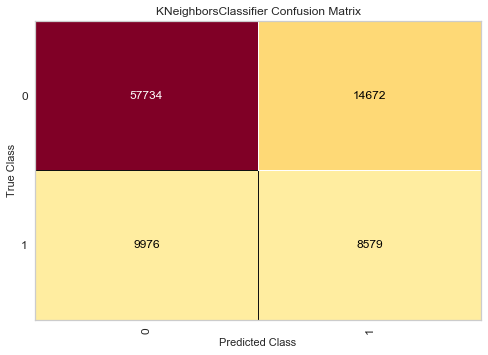

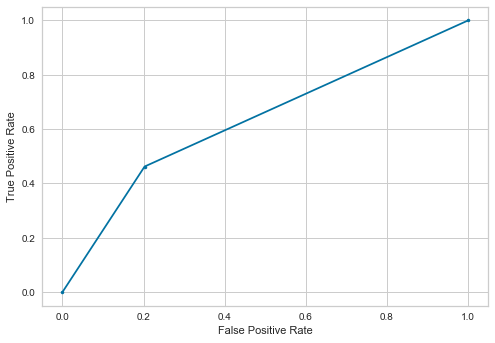

---------Decision Tree------------
Accuracy  (%): 
 81.06771033739734
AUC  (%): 
 74.33356896531821
Precision: 
 53.02768951429868
Recall (%): 
 62.95877122069523
f1 score (%): 
 57.56806701983491
logistic loss :
 6.539072157638599
              precision    recall  f1-score   support

           0       0.90      0.86      0.88     72406
           1       0.53      0.63      0.58     18555

    accuracy                           0.81     90961
   macro avg       0.72      0.74      0.73     90961
weighted avg       0.82      0.81      0.82     90961



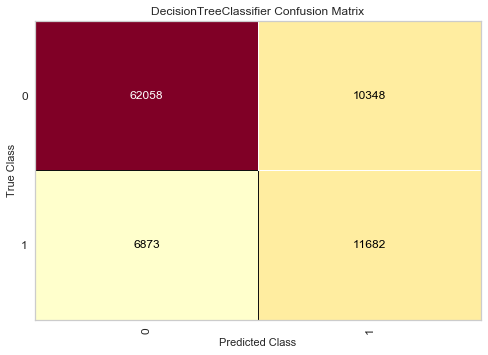

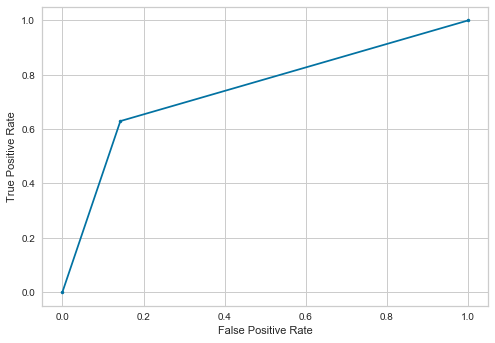

---------Naive Bayes------------
Accuracy  (%): 
 75.60712832972372
AUC  (%): 
 54.000679817293914
Precision: 
 32.066344160331724
Recall (%): 
 17.5047157100512
f1 score (%): 
 22.646771719425463
logistic loss :
 8.425059890284796
              precision    recall  f1-score   support

           0       0.81      0.90      0.86     72406
           1       0.32      0.18      0.23     18555

    accuracy                           0.76     90961
   macro avg       0.57      0.54      0.54     90961
weighted avg       0.71      0.76      0.73     90961



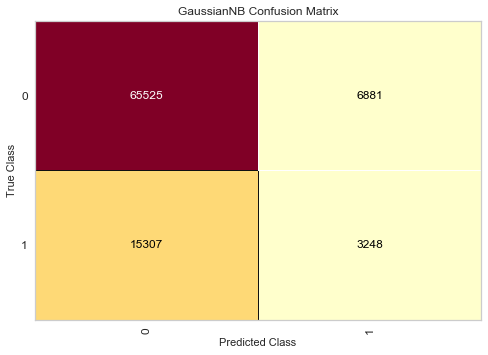

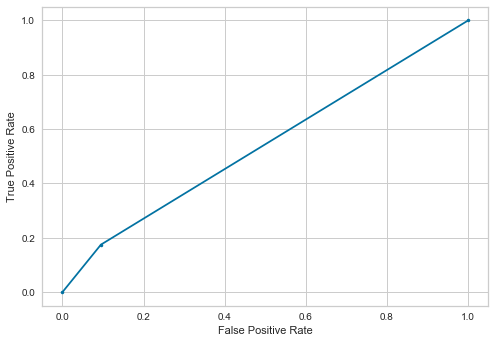

---------Random Forest------------
Accuracy  (%): 
 84.38561581337056
AUC  (%): 
 72.11275563236329
Precision: 
 64.78662680076107
Recall (%): 
 51.38237671786581
f1 score (%): 
 57.311171891437
logistic loss :
 5.393062792304392
              precision    recall  f1-score   support

           0       0.88      0.93      0.90     72406
           1       0.65      0.51      0.57     18555

    accuracy                           0.84     90961
   macro avg       0.76      0.72      0.74     90961
weighted avg       0.83      0.84      0.84     90961



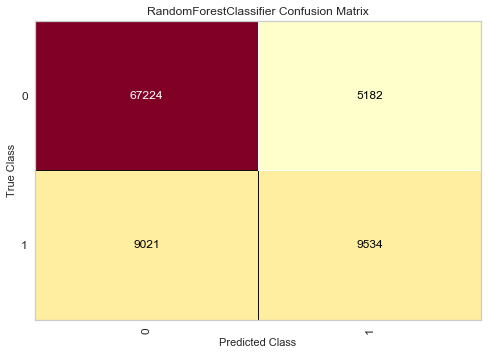

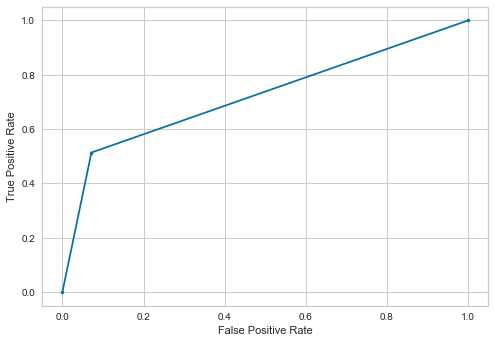

---------xgboost------------
Accuracy  (%): 
 80.67083695210036
AUC  (%): 
 67.61691738357942
Precision: 
 53.05264478885612
Recall (%): 
 45.56723255187281
f1 score (%): 
 49.02586106923344
logistic loss :
 6.676122175034273
              precision    recall  f1-score   support

           0       0.87      0.90      0.88     72406
           1       0.53      0.46      0.49     18555

    accuracy                           0.81     90961
   macro avg       0.70      0.68      0.69     90961
weighted avg       0.80      0.81      0.80     90961



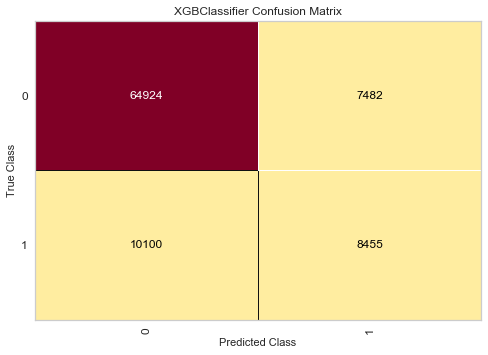

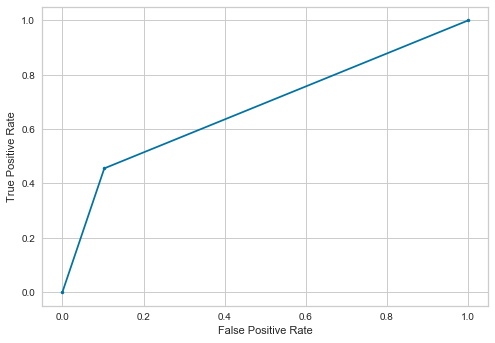

---------Ada Boost------------
Accuracy  (%): 
 75.46420993612647
AUC  (%): 
 59.80508678818674
Precision: 
 38.34334923486773
Recall (%): 
 33.35489086499596
f1 score (%): 
 35.675582199677194
logistic loss :
 8.474449150462748
              precision    recall  f1-score   support

           0       0.83      0.86      0.85     72406
           1       0.38      0.33      0.36     18555

    accuracy                           0.75     90961
   macro avg       0.61      0.60      0.60     90961
weighted avg       0.74      0.75      0.75     90961



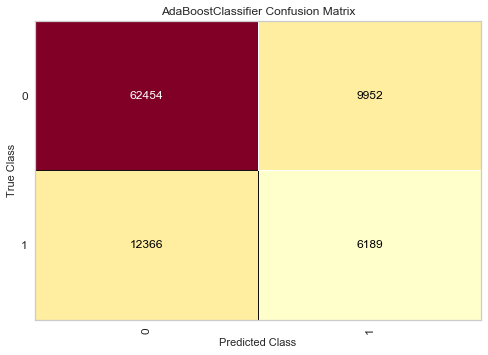

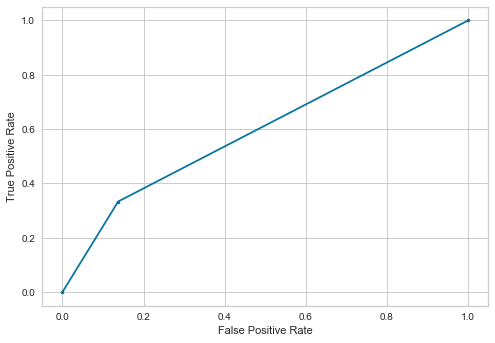

---------SVM------------
Accuracy  (%): 
 79.60004837237938
AUC  (%): 
 50.001313590444106
Precision: 
 33.33333333333333
Recall (%): 
 0.0053893829156561575
f1 score (%): 
 0.010777023386140748
logistic loss :
 7.045893694914936
              precision    recall  f1-score   support

           0       0.80      1.00      0.89     72406
           1       0.33      0.00      0.00     18555

    accuracy                           0.80     90961
   macro avg       0.56      0.50      0.44     90961
weighted avg       0.70      0.80      0.71     90961



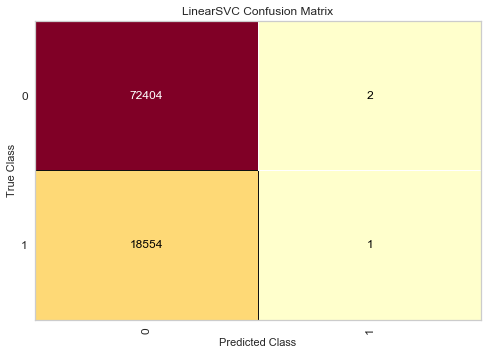

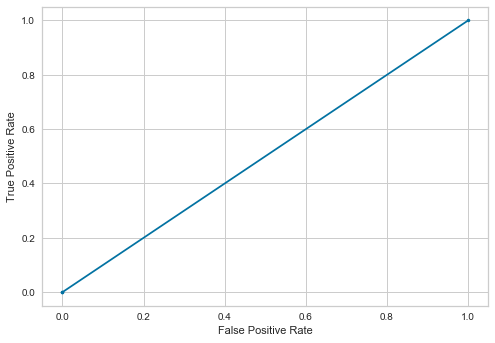

---------MLP Classifier------------
Accuracy  (%): 
 75.3696639219006
AUC  (%): 
 57.82172413167097
Precision: 
 36.54854267141959
Recall (%): 
 28.181083265966045
f1 score (%): 
 31.823991236078147
logistic loss :
 8.507096503963789
              precision    recall  f1-score   support

           0       0.83      0.87      0.85     72406
           1       0.37      0.28      0.32     18555

    accuracy                           0.75     90961
   macro avg       0.60      0.58      0.58     90961
weighted avg       0.73      0.75      0.74     90961



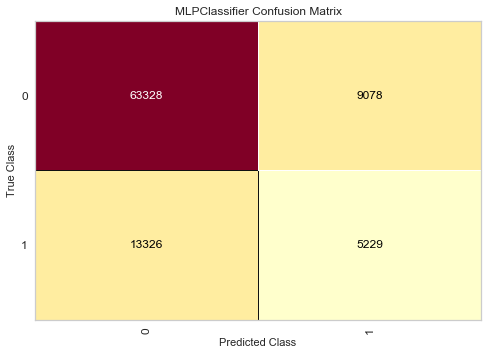

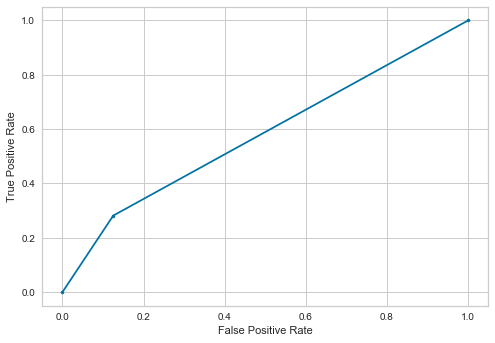

---------light Gradient Boosting------------
Accuracy  (%): 
 78.82499093017887
AUC  (%): 
 63.75389693970419
Precision: 
 47.6337310631452
Recall (%): 
 38.29695499865265
f1 score (%): 
 42.45810055865922
logistic loss :
 7.3136577060223535
              precision    recall  f1-score   support

           0       0.85      0.89      0.87     72406
           1       0.48      0.38      0.42     18555

    accuracy                           0.79     90961
   macro avg       0.66      0.64      0.65     90961
weighted avg       0.77      0.79      0.78     90961



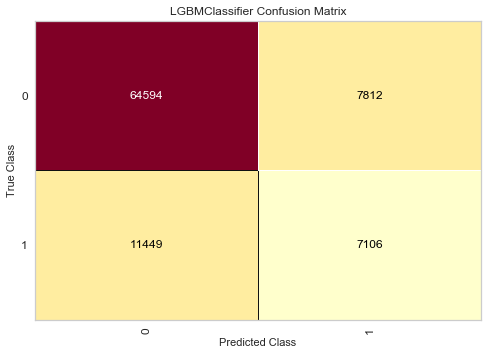

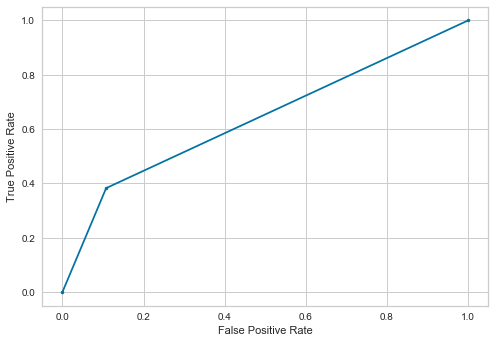

---------Gradient Boosting Classifier------------
Accuracy  (%): 
 76.62514704103957
AUC  (%): 
 60.56437023769966
Precision: 
 41.04531921931856
Recall (%): 
 33.4357316087308
f1 score (%): 
 36.851796851796855
logistic loss :
 8.07346652874629
              precision    recall  f1-score   support

           0       0.84      0.88      0.86     72406
           1       0.41      0.33      0.37     18555

    accuracy                           0.77     90961
   macro avg       0.62      0.61      0.61     90961
weighted avg       0.75      0.77      0.76     90961



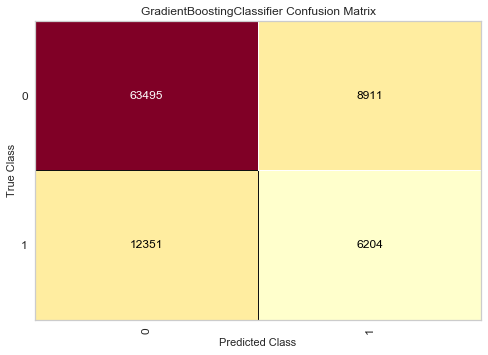

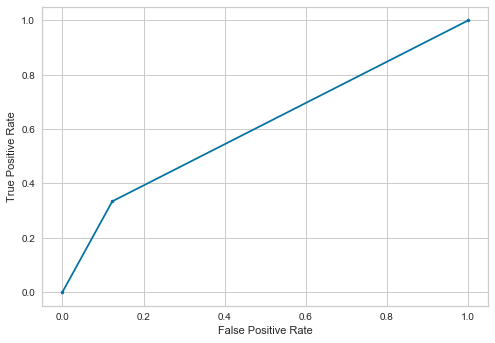

,classifier,Precision,Recall,AUC,Accuracy
0,Logistic Regression,50.000000,0.005389,50.002004,79.601148
1,Nearest Neighbors,36.897338,46.235516,62.986001,72.902673
2,Decision Tree,53.027690,62.958771,74.333569,81.067710
3,Naive Bayes,32.066344,17.504716,54.000680,75.607128
4,Random Forest,64.786627,51.382377,72.112756,84.385616
5,xgboost,53.052645,45.567233,67.616917,80.670837
6,Ada Boost,38.343349,33.354891,59.805087,75.464210
7,SVM,33.333333,0.005389,50.001314,79.600048
8,MLP Classifier,36.548543,28.181083,57.821724,75.369664
9,light Gradient Boosting,47.633731,38.296955,63.753897,78.824991


,classifier,Precision,Recall,AUC,Accuracy
0,Logistic Regression,50.000000,0.005389,50.002004,79.601148
1,Nearest Neighbors,36.897338,46.235516,62.986001,72.902673
2,Decision Tree,53.027690,62.958771,74.333569,81.067710
3,Naive Bayes,32.066344,17.504716,54.000680,75.607128
4,Random Forest,64.786627,51.382377,72.112756,84.385616
5,xgboost,53.052645,45.567233,67.616917,80.670837
6,Ada Boost,38.343349,33.354891,59.805087,75.464210
7,SVM,33.333333,0.005389,50.001314,79.600048
8,MLP Classifier,36.548543,28.181083,57.821724,75.369664
9,light Gradient Boosting,47.633731,38.296955,63.753897,78.824991


In [12]:
t3.fit_model_CV_FS_OS(df2,'return')

delivery_time_hours      27.939879
lng                      12.215342
lat                      12.137357
total_amount_expected    11.547483
unit_price               11.535292
Sub Category              5.816539
r_day                     4.976416
order_day                 4.701143
Category                  4.628155
channel                   2.516757
days_taken                1.985636
dtype: float64
Selected Features =['delivery_time_hours', 'lng', 'lat', 'total_amount_expected', 'unit_price', 'Sub Category']
_____Cross Validation_____
---------Logistic Regression------------
Mean accuracy  (%): 
 66.59967878930588
Mean AUC  (%): 
 55.307995571385796
Mean Precision: 
 15.0
Mean Recall (%): 
 0.008980691513246519
Mean f1 score (%): 
 0.017949294150149047
---------Nearest Neighbors------------
Mean accuracy  (%): 
 66.49470473386947
Mean AUC  (%): 
 65.868470964775
Mean Precision: 
 49.80771405130285
Mean Recall (%): 
 41.414458913336325
Mean f1 score (%): 
 45.22206643281422
---------Decis

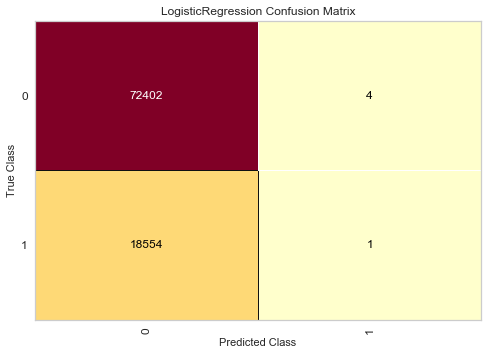

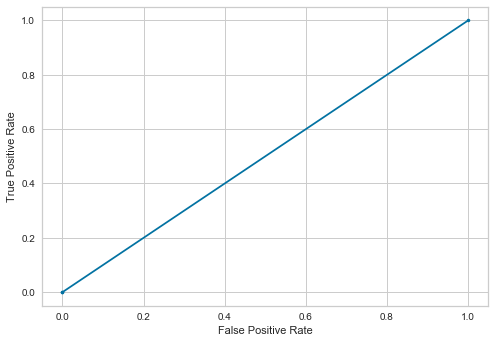

---------Nearest Neighbors------------
Accuracy  (%): 
 72.28702410923363
AUC  (%): 
 61.599226361622506
Precision: 
 35.41840178845395
Recall (%): 
 43.54621395850175
f1 score (%): 
 39.06401082962676
logistic loss :
 9.571852286494735
              precision    recall  f1-score   support

           0       0.85      0.80      0.82     72406
           1       0.35      0.44      0.39     18555

    accuracy                           0.72     90961
   macro avg       0.60      0.62      0.61     90961
weighted avg       0.75      0.72      0.73     90961



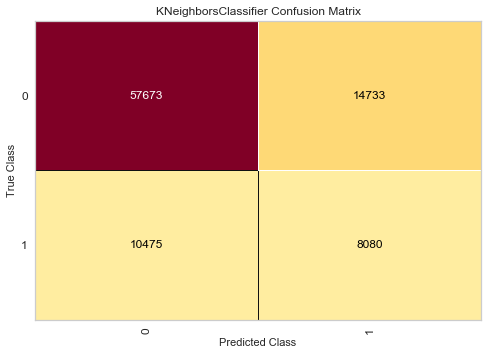

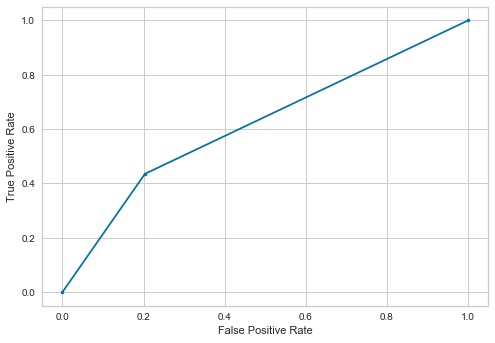

---------Decision Tree------------
Accuracy  (%): 
 75.49829047613812
AUC  (%): 
 70.32819243695091
Precision: 
 42.98232418202332
Recall (%): 
 61.59525734303423
f1 score (%): 
 50.632406689555886
logistic loss :
 8.462723938941014
              precision    recall  f1-score   support

           0       0.89      0.79      0.84     72406
           1       0.43      0.62      0.51     18555

    accuracy                           0.75     90961
   macro avg       0.66      0.70      0.67     90961
weighted avg       0.80      0.75      0.77     90961



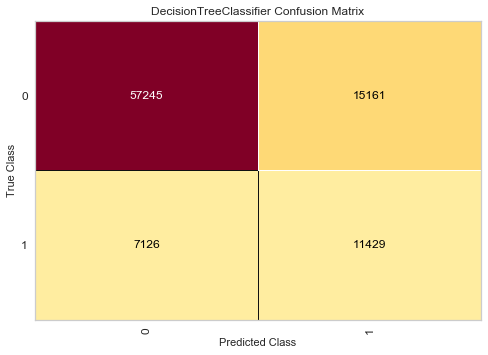

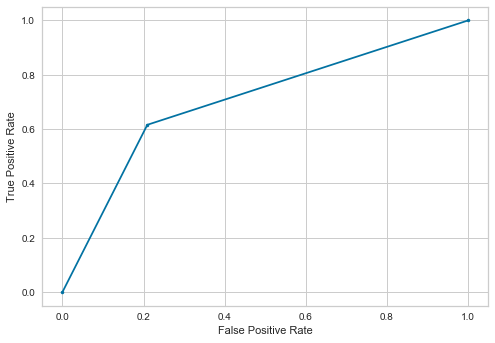

---------Naive Bayes------------
Accuracy  (%): 
 79.27243543936412
AUC  (%): 
 50.0019560573479
Precision: 
 20.51282051282051
Recall (%): 
 0.5604958232282403
f1 score (%): 
 1.0911761619976916
logistic loss :
 7.159050718301365
              precision    recall  f1-score   support

           0       0.80      0.99      0.88     72406
           1       0.21      0.01      0.01     18555

    accuracy                           0.79     90961
   macro avg       0.50      0.50      0.45     90961
weighted avg       0.68      0.79      0.71     90961



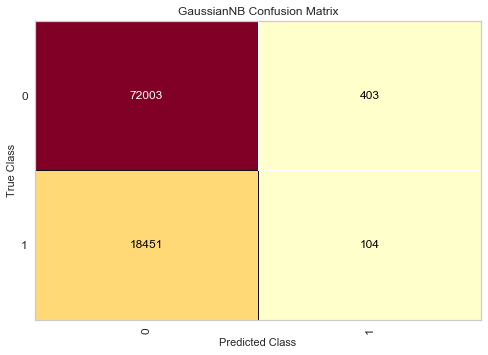

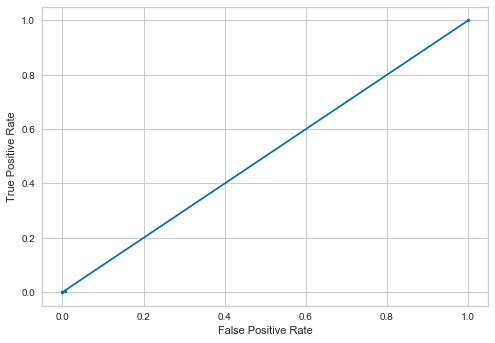

---------Random Forest------------
Accuracy  (%): 
 80.38719890942272
AUC  (%): 
 70.35478043646113
Precision: 
 51.87123789583878
Recall (%): 
 53.40878469415252
f1 score (%): 
 52.62878385554966
logistic loss :
 6.7741023425817355
              precision    recall  f1-score   support

           0       0.88      0.87      0.88     72406
           1       0.52      0.53      0.53     18555

    accuracy                           0.80     90961
   macro avg       0.70      0.70      0.70     90961
weighted avg       0.81      0.80      0.80     90961



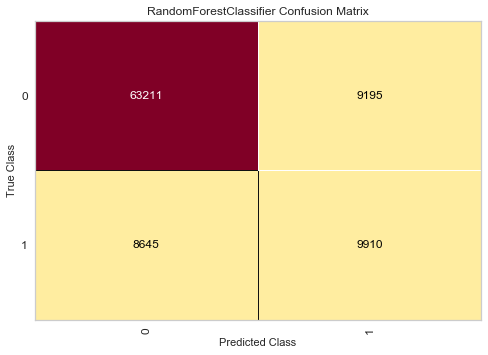

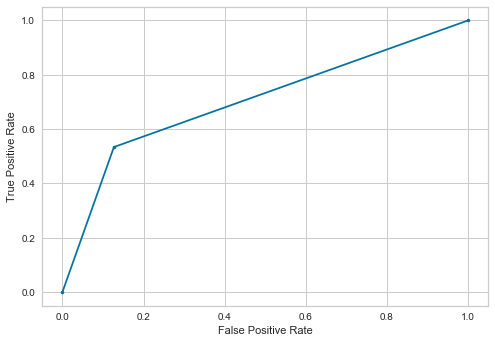

---------xgboost------------
Accuracy  (%): 
 79.53188729235606
AUC  (%): 
 66.11989208759228
Precision: 
 49.805471500030876
Recall (%): 
 43.46537321476691
f1 score (%): 
 46.41993783814896
logistic loss :
 7.06950712996075
              precision    recall  f1-score   support

           0       0.86      0.89      0.87     72406
           1       0.50      0.43      0.46     18555

    accuracy                           0.80     90961
   macro avg       0.68      0.66      0.67     90961
weighted avg       0.79      0.80      0.79     90961



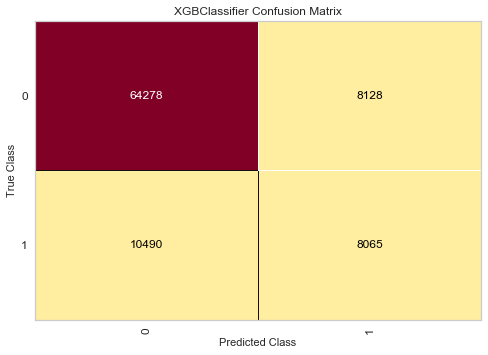

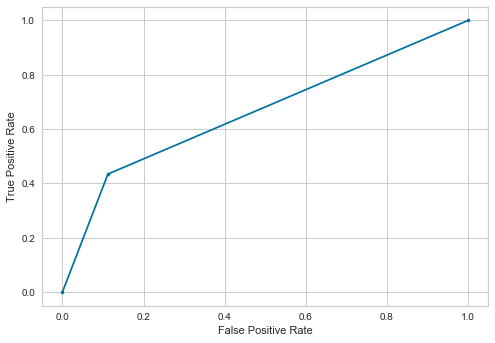

---------Ada Boost------------
Accuracy  (%): 
 75.55765657809391
AUC  (%): 
 58.99799469045374
Precision: 
 37.89494470774092
Recall (%): 
 31.026677445432497
f1 score (%): 
 34.11858831896169
logistic loss :
 8.442169279029509
              precision    recall  f1-score   support

           0       0.83      0.87      0.85     72406
           1       0.38      0.31      0.34     18555

    accuracy                           0.76     90961
   macro avg       0.61      0.59      0.60     90961
weighted avg       0.74      0.76      0.75     90961



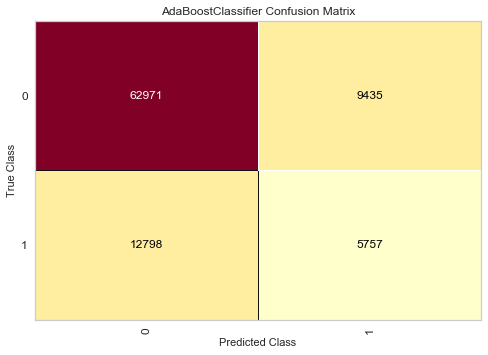

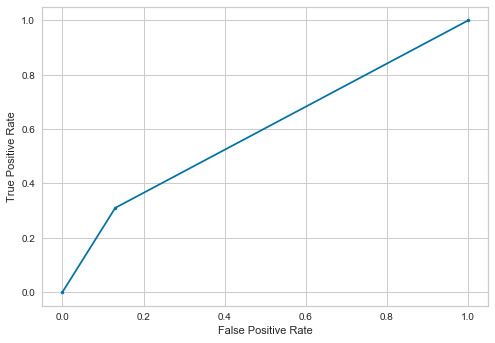

---------SVM------------
Accuracy  (%): 
 79.59784962786249
AUC  (%): 
 49.99993248943037
Precision: 
 20.0
Recall (%): 
 0.0053893829156561575
f1 score (%): 
 0.010775862068965518
logistic loss :
 7.046653131948222
              precision    recall  f1-score   support

           0       0.80      1.00      0.89     72406
           1       0.20      0.00      0.00     18555

    accuracy                           0.80     90961
   macro avg       0.50      0.50      0.44     90961
weighted avg       0.67      0.80      0.71     90961



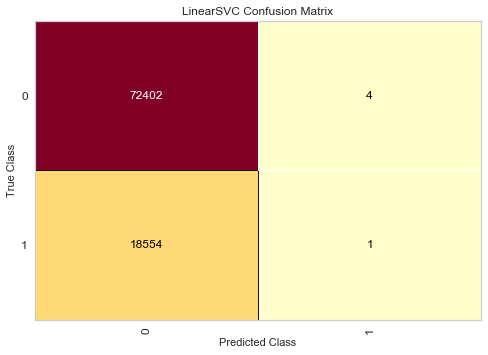

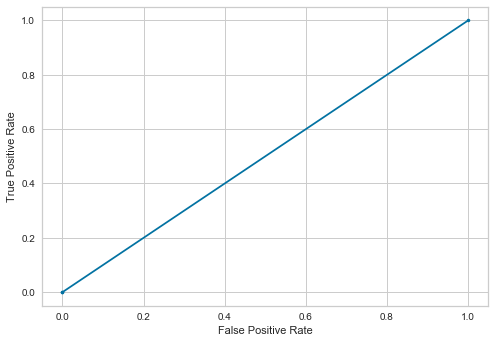

---------MLP Classifier------------
Accuracy  (%): 
 75.76543793493914
AUC  (%): 
 56.853808756906886
Precision: 
 36.299379564910076
Recall (%): 
 24.90972783616276
f1 score (%): 
 29.54487343390437
logistic loss :
 8.370392502107139
              precision    recall  f1-score   support

           0       0.82      0.89      0.85     72406
           1       0.36      0.25      0.30     18555

    accuracy                           0.76     90961
   macro avg       0.59      0.57      0.57     90961
weighted avg       0.73      0.76      0.74     90961



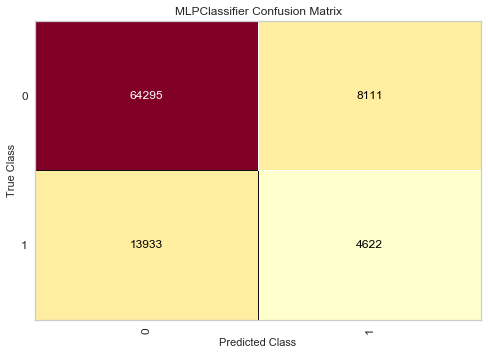

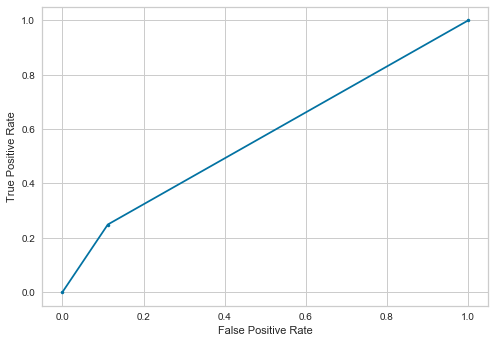

---------light Gradient Boosting------------
Accuracy  (%): 
 78.67877441980629
AUC  (%): 
 62.92653399328748
Precision: 
 47.06991688202836
Recall (%): 
 36.319051468606844
f1 score (%): 
 41.00146020929667
logistic loss :
 7.364157042603135
              precision    recall  f1-score   support

           0       0.85      0.90      0.87     72406
           1       0.47      0.36      0.41     18555

    accuracy                           0.79     90961
   macro avg       0.66      0.63      0.64     90961
weighted avg       0.77      0.79      0.78     90961



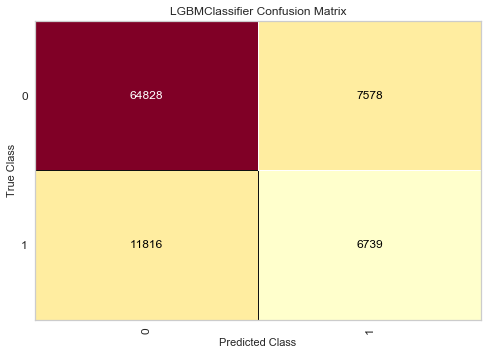

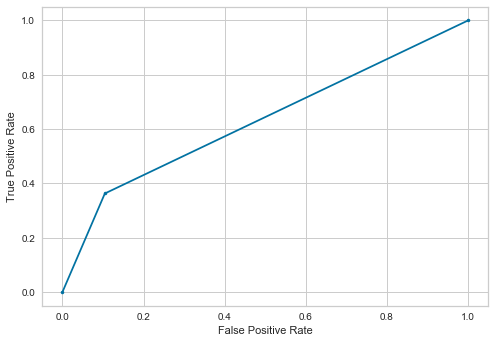

---------Gradient Boosting Classifier------------
Accuracy  (%): 
 76.69330812106287
AUC  (%): 
 59.7013126592895
Precision: 
 40.65304968549014
Recall (%): 
 30.99973053085422
f1 score (%): 
 35.1761252446184
logistic loss :
 8.04992000738479
              precision    recall  f1-score   support

           0       0.83      0.88      0.86     72406
           1       0.41      0.31      0.35     18555

    accuracy                           0.77     90961
   macro avg       0.62      0.60      0.60     90961
weighted avg       0.75      0.77      0.75     90961



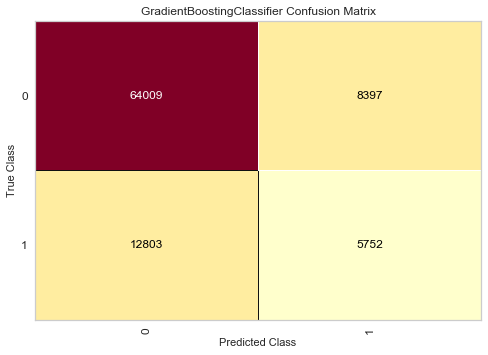

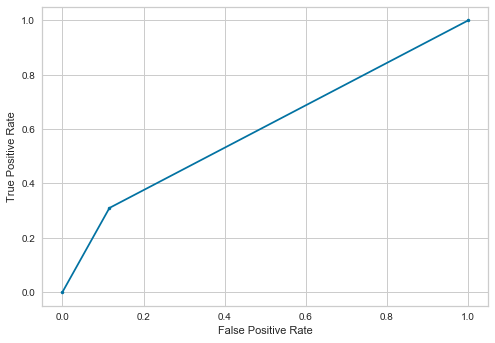

,classifier,Precision,Recall,AUC,Accuracy
0,Logistic Regression,20.000000,0.005389,49.999932,79.597850
1,Nearest Neighbors,35.418402,43.546214,61.599226,72.287024
2,Decision Tree,42.982324,61.595257,70.328192,75.498290
3,Naive Bayes,20.512821,0.560496,50.001956,79.272435
4,Random Forest,51.871238,53.408785,70.354780,80.387199
5,xgboost,49.805472,43.465373,66.119892,79.531887
6,Ada Boost,37.894945,31.026677,58.997995,75.557657
7,SVM,20.000000,0.005389,49.999932,79.597850
8,MLP Classifier,36.299380,24.909728,56.853809,75.765438
9,light Gradient Boosting,47.069917,36.319051,62.926534,78.678774


,classifier,Precision,Recall,AUC,Accuracy
0,Logistic Regression,20.000000,0.005389,49.999932,79.597850
1,Nearest Neighbors,35.418402,43.546214,61.599226,72.287024
2,Decision Tree,42.982324,61.595257,70.328192,75.498290
3,Naive Bayes,20.512821,0.560496,50.001956,79.272435
4,Random Forest,51.871238,53.408785,70.354780,80.387199
5,xgboost,49.805472,43.465373,66.119892,79.531887
6,Ada Boost,37.894945,31.026677,58.997995,75.557657
7,SVM,20.000000,0.005389,49.999932,79.597850
8,MLP Classifier,36.299380,24.909728,56.853809,75.765438
9,light Gradient Boosting,47.069917,36.319051,62.926534,78.678774


In [13]:
t3.fit_model_CV_FS_US(df2,'return')

Using min max scaling

---------Logistic Regression------------
Accuracy  (%): 
 79.58025967172745
AUC  (%): 
 50.02896650033982
Precision: 
 34.42622950819672
Recall (%): 
 0.11317704122877931
f1 score (%): 
 0.22561237645036528
logistic loss :
 7.052728804025552
              precision    recall  f1-score   support

           0       0.80      1.00      0.89     72406
           1       0.34      0.00      0.00     18555

    accuracy                           0.80     90961
   macro avg       0.57      0.50      0.44     90961
weighted avg       0.70      0.80      0.71     90961



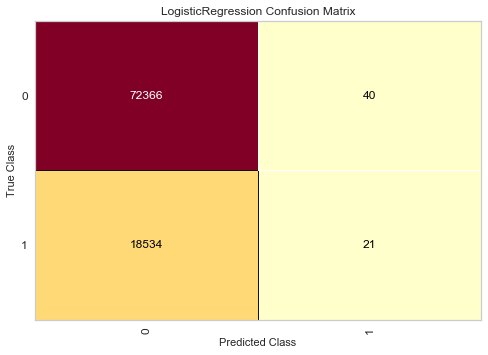

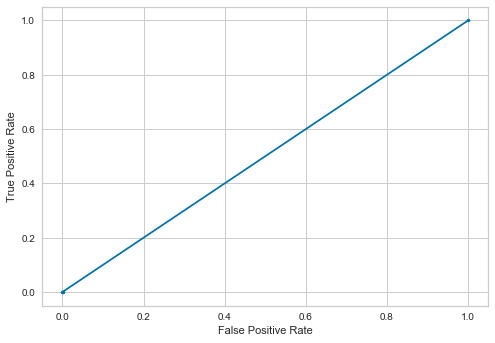

---------Nearest Neighbors------------
Accuracy  (%): 
 81.0962940161168
AUC  (%): 
 65.14449974976802
Precision: 
 55.305867665418226
Recall (%): 
 38.19994610617085
f1 score (%): 
 45.188231168913966
logistic loss :
 6.529159092408498
              precision    recall  f1-score   support

           0       0.85      0.92      0.89     72406
           1       0.55      0.38      0.45     18555

    accuracy                           0.81     90961
   macro avg       0.70      0.65      0.67     90961
weighted avg       0.79      0.81      0.80     90961



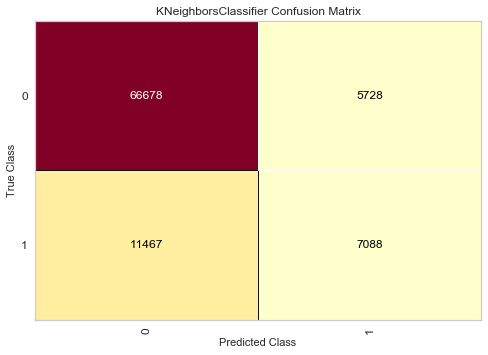

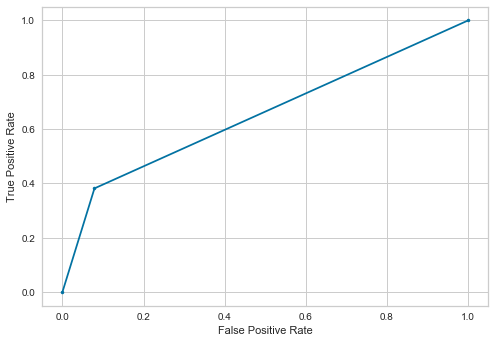

---------Decision Tree------------
Accuracy  (%): 
 87.0186123723354
AUC  (%): 
 80.43840932206191
Precision: 
 67.77490911006903
Recall (%): 
 69.32363244408515
f1 score (%): 
 68.54052325891192
logistic loss :
 4.483666208693709
              precision    recall  f1-score   support

           0       0.92      0.92      0.92     72406
           1       0.68      0.69      0.69     18555

    accuracy                           0.87     90961
   macro avg       0.80      0.80      0.80     90961
weighted avg       0.87      0.87      0.87     90961



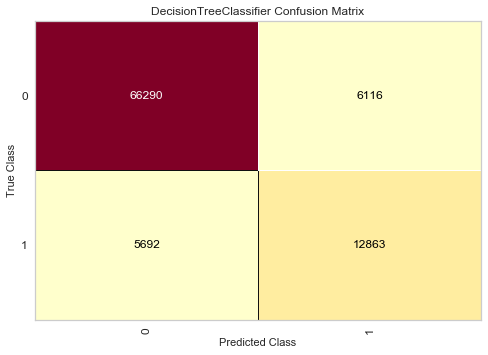

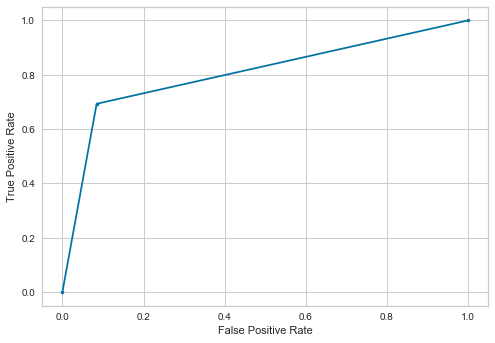

---------Naive Bayes------------
Accuracy  (%): 
 79.25704422774595
AUC  (%): 
 50.37908755378786
Precision: 
 32.74531422271224
Recall (%): 
 1.6006467259498787
f1 score (%): 
 3.0521015311889834
logistic loss :
 7.164368474110963
              precision    recall  f1-score   support

           0       0.80      0.99      0.88     72406
           1       0.33      0.02      0.03     18555

    accuracy                           0.79     90961
   macro avg       0.56      0.50      0.46     90961
weighted avg       0.70      0.79      0.71     90961



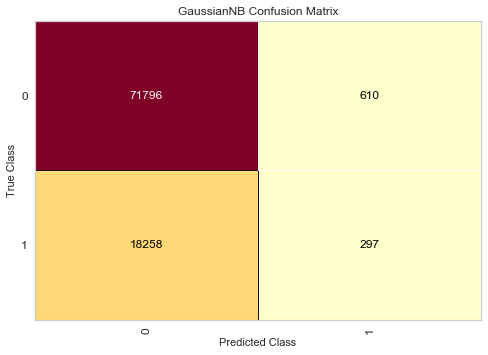

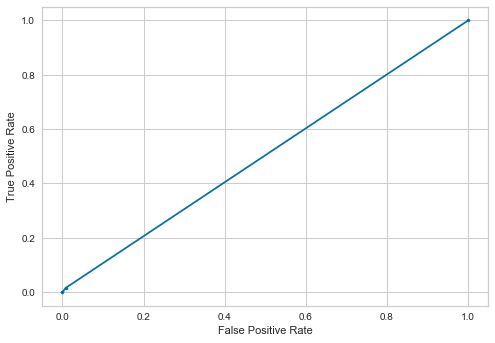

---------Random Forest------------
Accuracy  (%): 
 89.04915293367488
AUC  (%): 
 76.99210002776866
Precision: 
 84.59742351046698
Recall (%): 
 56.626246294799245
f1 score (%): 
 67.84180790960451
logistic loss :
 3.782305397913274
              precision    recall  f1-score   support

           0       0.90      0.97      0.93     72406
           1       0.85      0.57      0.68     18555

    accuracy                           0.89     90961
   macro avg       0.87      0.77      0.81     90961
weighted avg       0.89      0.89      0.88     90961



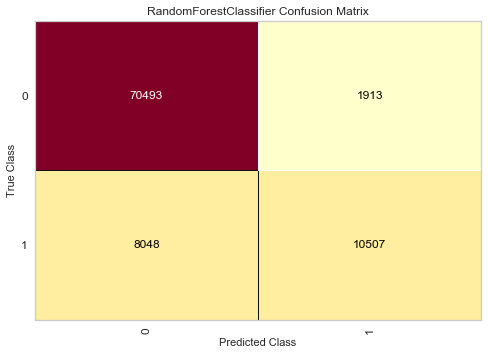

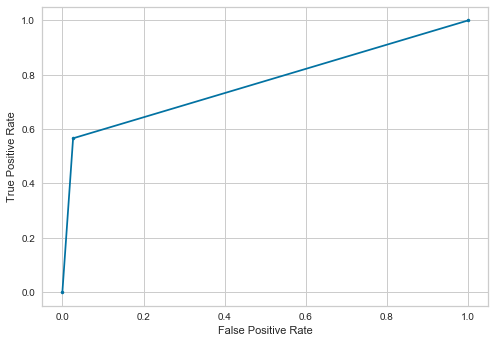

---------xgboost------------
Accuracy  (%): 
 82.6980793966645
AUC  (%): 
 59.73938493613511
Precision: 
 78.39145333602097
Recall (%): 
 20.959310158986796
f1 score (%): 
 33.075352951182175
logistic loss :
 5.975881092683123
              precision    recall  f1-score   support

           0       0.83      0.99      0.90     72406
           1       0.78      0.21      0.33     18555

    accuracy                           0.83     90961
   macro avg       0.81      0.60      0.62     90961
weighted avg       0.82      0.83      0.78     90961



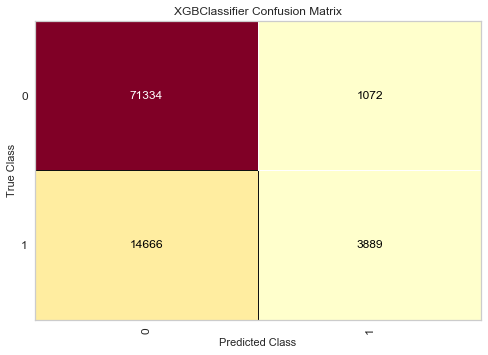

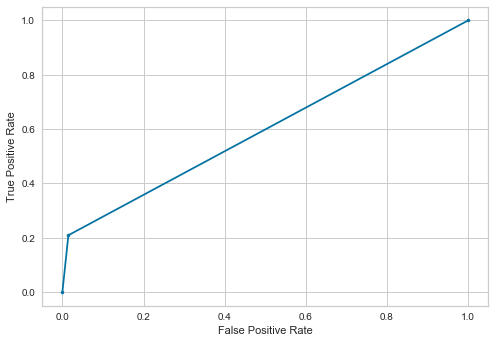

---------Ada Boost------------
Accuracy  (%): 
 79.60334648915469
AUC  (%): 
 50.714855279556915
Precision: 
 50.140845070422536
Recall (%): 
 1.918620317973592
f1 score (%): 
 3.6958214378406433
logistic loss :
 7.044757660011084
              precision    recall  f1-score   support

           0       0.80      1.00      0.89     72406
           1       0.50      0.02      0.04     18555

    accuracy                           0.80     90961
   macro avg       0.65      0.51      0.46     90961
weighted avg       0.74      0.80      0.71     90961



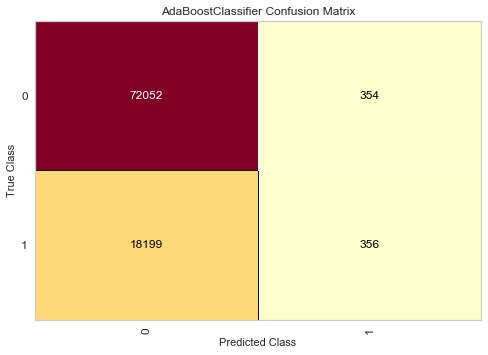

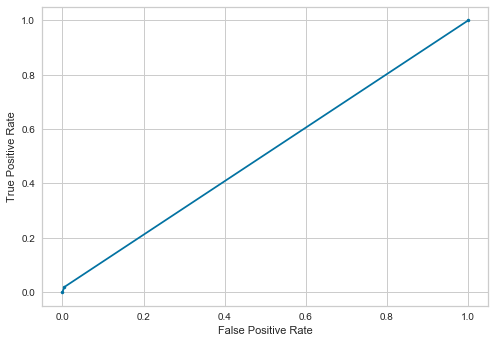

---------SVM------------
Accuracy  (%): 
 79.579160299469
AUC  (%): 
 50.02025938602911
Precision: 
 31.48148148148148
Recall (%): 
 0.09161950956615468
f1 score (%): 
 0.18270729217045517
logistic loss :
 7.053108487379985
              precision    recall  f1-score   support

           0       0.80      1.00      0.89     72406
           1       0.31      0.00      0.00     18555

    accuracy                           0.80     90961
   macro avg       0.56      0.50      0.44     90961
weighted avg       0.70      0.80      0.71     90961



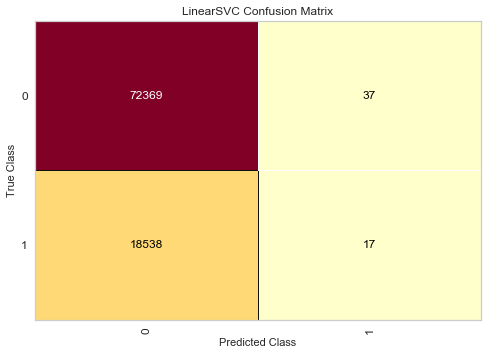

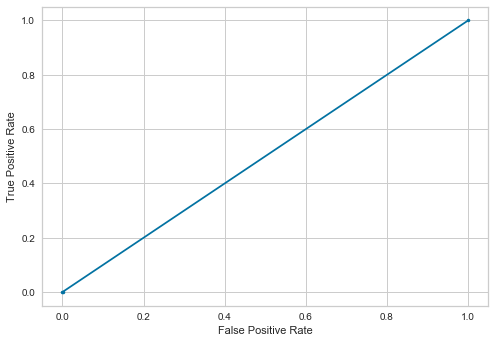

---------MLP Classifier------------
Accuracy  (%): 
 79.62753267884038
AUC  (%): 
 50.28111981769199
Precision: 
 55.00000000000001
Recall (%): 
 0.7113985448666127
f1 score (%): 
 1.40462889066241
logistic loss :
 7.036401883561223
              precision    recall  f1-score   support

           0       0.80      1.00      0.89     72406
           1       0.55      0.01      0.01     18555

    accuracy                           0.80     90961
   macro avg       0.67      0.50      0.45     90961
weighted avg       0.75      0.80      0.71     90961



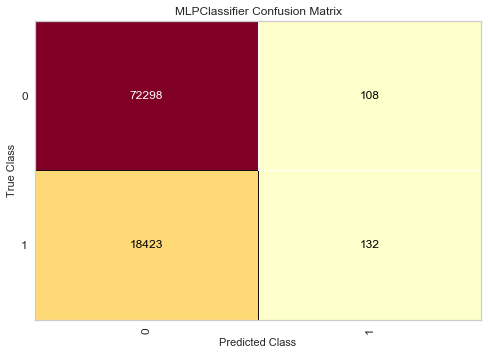

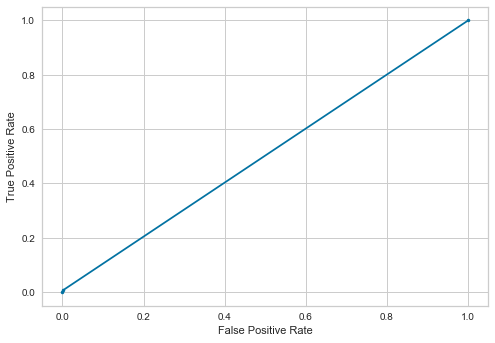

---------light Gradient Boosting------------
Accuracy  (%): 
 81.03253042512725
AUC  (%): 
 54.851262715238036
Precision: 
 74.64042392127176
Recall (%): 
 10.627863109673942
f1 score (%): 
 18.60640656696702
logistic loss :
 6.551137793908072
              precision    recall  f1-score   support

           0       0.81      0.99      0.89     72406
           1       0.75      0.11      0.19     18555

    accuracy                           0.81     90961
   macro avg       0.78      0.55      0.54     90961
weighted avg       0.80      0.81      0.75     90961



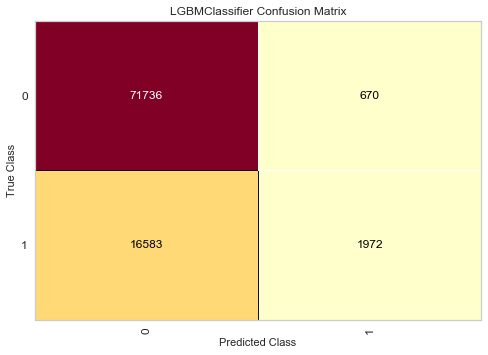

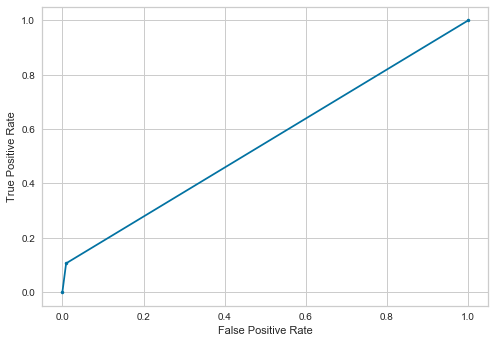

---------Gradient Boosting Classifier------------
Accuracy  (%): 
 79.88698453183233
AUC  (%): 
 51.07739827781654
Precision: 
 70.44025157232704
Recall (%): 
 2.4144435462139584
f1 score (%): 
 4.668855192538169
logistic loss :
 6.946791091448069
              precision    recall  f1-score   support

           0       0.80      1.00      0.89     72406
           1       0.70      0.02      0.05     18555

    accuracy                           0.80     90961
   macro avg       0.75      0.51      0.47     90961
weighted avg       0.78      0.80      0.72     90961



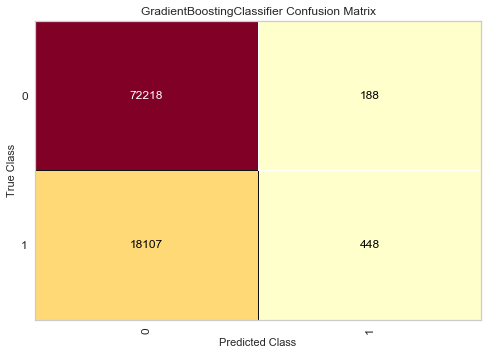

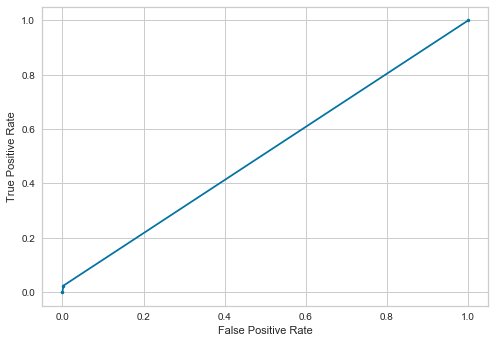

,classifier,Precision,Recall,AUC,Accuracy
0,Logistic Regression,34.426230,0.113177,50.028967,79.580260
1,Nearest Neighbors,55.305868,38.199946,65.144500,81.096294
2,Decision Tree,67.774909,69.323632,80.438409,87.018612
3,Naive Bayes,32.745314,1.600647,50.379088,79.257044
4,Random Forest,84.597424,56.626246,76.992100,89.049153
5,xgboost,78.391453,20.959310,59.739385,82.698079
6,Ada Boost,50.140845,1.918620,50.714855,79.603346
7,SVM,31.481481,0.091620,50.020259,79.579160
8,MLP Classifier,55.000000,0.711399,50.281120,79.627533
9,light Gradient Boosting,74.640424,10.627863,54.851263,81.032530


,classifier,Precision,Recall,AUC,Accuracy
0,Logistic Regression,34.426230,0.113177,50.028967,79.580260
1,Nearest Neighbors,55.305868,38.199946,65.144500,81.096294
2,Decision Tree,67.774909,69.323632,80.438409,87.018612
3,Naive Bayes,32.745314,1.600647,50.379088,79.257044
4,Random Forest,84.597424,56.626246,76.992100,89.049153
5,xgboost,78.391453,20.959310,59.739385,82.698079
6,Ada Boost,50.140845,1.918620,50.714855,79.603346
7,SVM,31.481481,0.091620,50.020259,79.579160
8,MLP Classifier,55.000000,0.711399,50.281120,79.627533
9,light Gradient Boosting,74.640424,10.627863,54.851263,81.032530


In [14]:
t3.fit_model(df2,'return',classification=True,min_max=True)

delivery_time_hours      28.395461
unit_price               13.955807
lat                      12.933912
lng                      12.906224
total_amount_expected     6.580371
Sub Category              6.206529
r_day                     4.946730
Category                  4.909062
order_day                 4.681671
channel                   2.508101
days_taken                1.976133
dtype: float64
Selected Features =['delivery_time_hours', 'unit_price', 'lat', 'lng', 'total_amount_expected', 'Sub Category']
---------Logistic Regression------------
Accuracy  (%): 
 79.60114774463781
AUC  (%): 
 50.0
Precision: 
 0.0
Recall (%): 
 0.0
f1 score (%): 
 0.0
logistic loss :
 7.045513967607741
              precision    recall  f1-score   support

           0       0.80      1.00      0.89     72406
           1       0.00      0.00      0.00     18555

    accuracy                           0.80     90961
   macro avg       0.40      0.50      0.44     90961
weighted avg       0.63      0.80

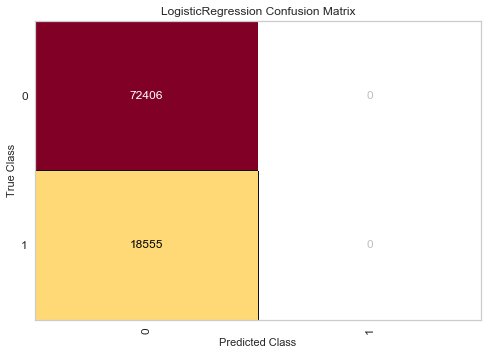

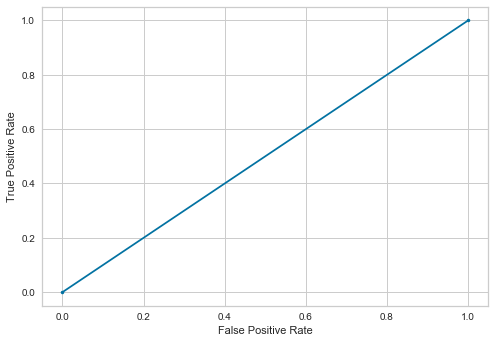

---------Nearest Neighbors------------
Accuracy  (%): 
 81.31396972328801
AUC  (%): 
 66.57790794540081
Precision: 
 55.59948246118459
Recall (%): 
 41.68687685260038
f1 score (%): 
 47.64838143345551
logistic loss :
 6.453980513600589
              precision    recall  f1-score   support

           0       0.86      0.91      0.89     72406
           1       0.56      0.42      0.48     18555

    accuracy                           0.81     90961
   macro avg       0.71      0.67      0.68     90961
weighted avg       0.80      0.81      0.80     90961



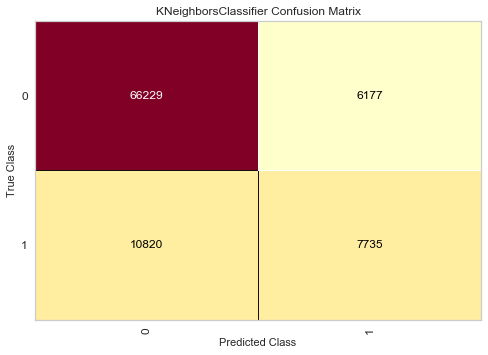

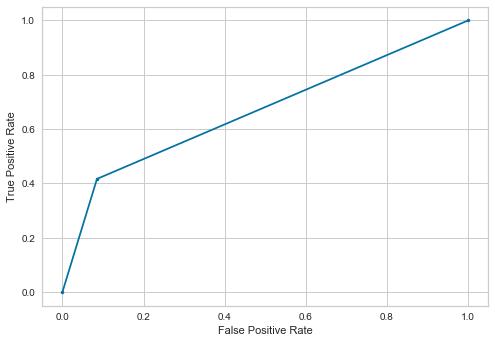

---------Decision Tree------------
Accuracy  (%): 
 83.76227174283484
AUC  (%): 
 75.05009161452257
Precision: 
 60.171996775060464
Recall (%): 
 60.33414174077068
f1 score (%): 
 60.2529601722282
logistic loss :
 5.608377792348243
              precision    recall  f1-score   support

           0       0.90      0.90      0.90     72406
           1       0.60      0.60      0.60     18555

    accuracy                           0.84     90961
   macro avg       0.75      0.75      0.75     90961
weighted avg       0.84      0.84      0.84     90961



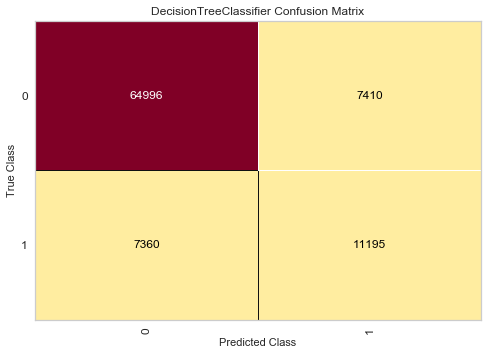

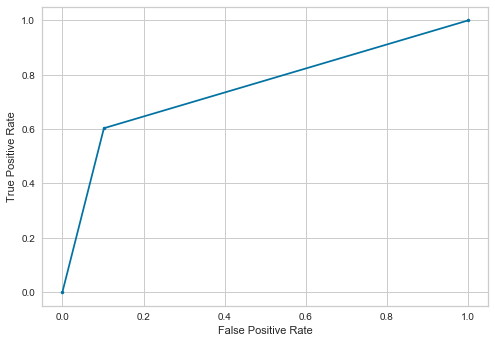

---------Naive Bayes------------
Accuracy  (%): 
 79.3098140961511
AUC  (%): 
 50.0134099288755
Precision: 
 21.25813449023861
Recall (%): 
 0.5281595257343034
f1 score (%): 
 1.030710980227177
logistic loss :
 7.146140235992197
              precision    recall  f1-score   support

           0       0.80      0.99      0.88     72406
           1       0.21      0.01      0.01     18555

    accuracy                           0.79     90961
   macro avg       0.50      0.50      0.45     90961
weighted avg       0.68      0.79      0.71     90961



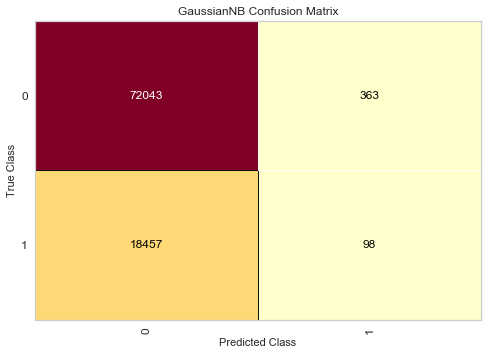

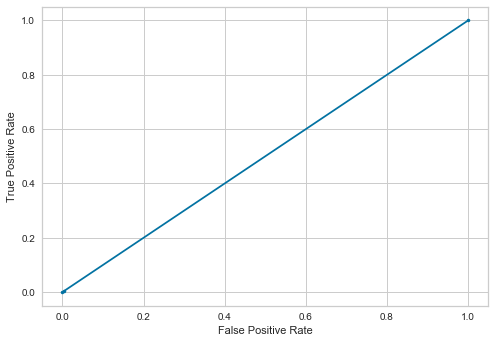

---------Random Forest------------
Accuracy  (%): 
 86.45463440375546
AUC  (%): 
 72.90933230758951
Precision: 
 75.2757054816737
Recall (%): 
 50.029641606036115
f1 score (%): 
 60.109431152264705
logistic loss :
 4.678430337554108
              precision    recall  f1-score   support

           0       0.88      0.96      0.92     72406
           1       0.75      0.50      0.60     18555

    accuracy                           0.86     90961
   macro avg       0.82      0.73      0.76     90961
weighted avg       0.86      0.86      0.85     90961



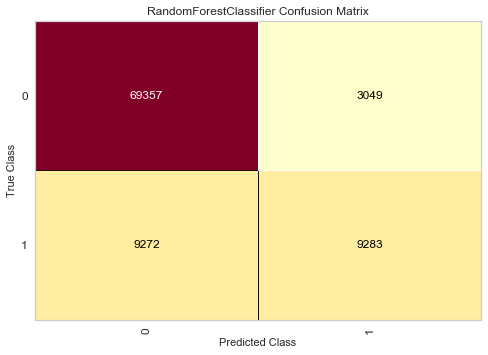

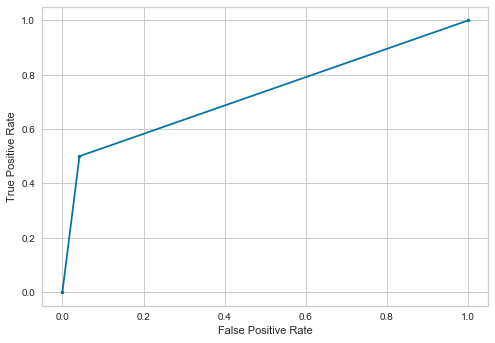

---------xgboost------------
Accuracy  (%): 
 82.37816206945834
AUC  (%): 
 58.46020690701903
Precision: 
 80.24425287356321
Recall (%): 
 18.059822150363782
f1 score (%): 
 29.483964629800713
logistic loss :
 6.08637445170901
              precision    recall  f1-score   support

           0       0.82      0.99      0.90     72406
           1       0.80      0.18      0.29     18555

    accuracy                           0.82     90961
   macro avg       0.81      0.58      0.60     90961
weighted avg       0.82      0.82      0.78     90961



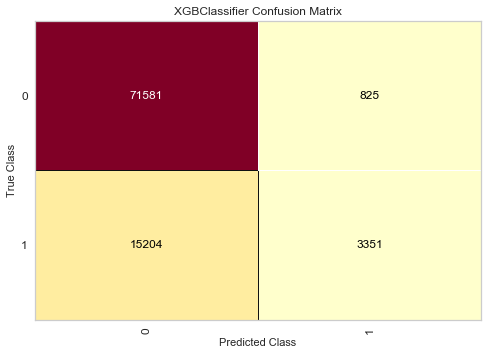

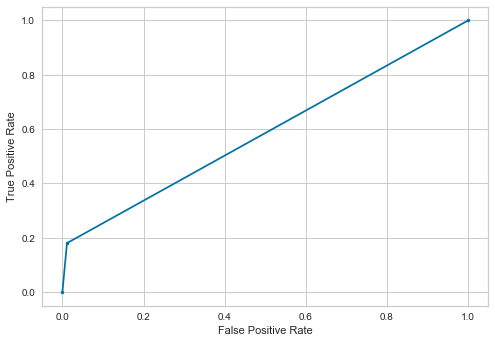

---------Ada Boost------------
Accuracy  (%): 
 79.60004837237938
AUC  (%): 
 50.01333843614988
Precision: 
 46.666666666666664
Recall (%): 
 0.0377256804095931
f1 score (%): 
 0.07539041464728057
logistic loss :
 7.04589374765825
              precision    recall  f1-score   support

           0       0.80      1.00      0.89     72406
           1       0.47      0.00      0.00     18555

    accuracy                           0.80     90961
   macro avg       0.63      0.50      0.44     90961
weighted avg       0.73      0.80      0.71     90961



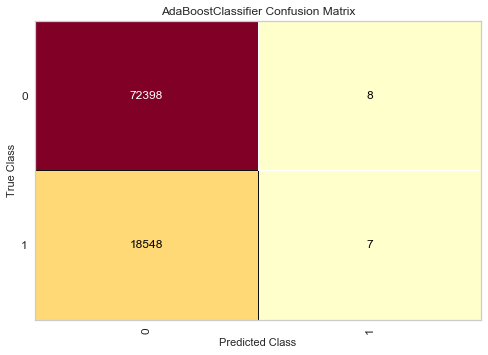

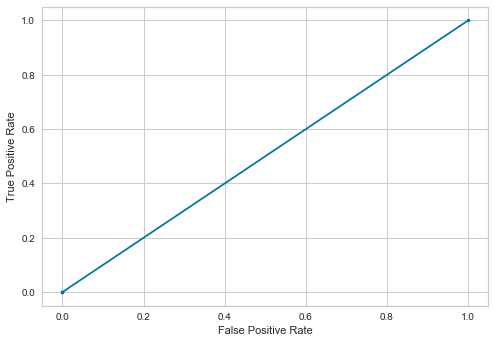

---------SVM------------
Accuracy  (%): 
 79.60004837237938
AUC  (%): 
 49.99930944949313
Precision: 
 0.0
Recall (%): 
 0.0
f1 score (%): 
 0.0
logistic loss :
 7.045893686124383
              precision    recall  f1-score   support

           0       0.80      1.00      0.89     72406
           1       0.00      0.00      0.00     18555

    accuracy                           0.80     90961
   macro avg       0.40      0.50      0.44     90961
weighted avg       0.63      0.80      0.71     90961



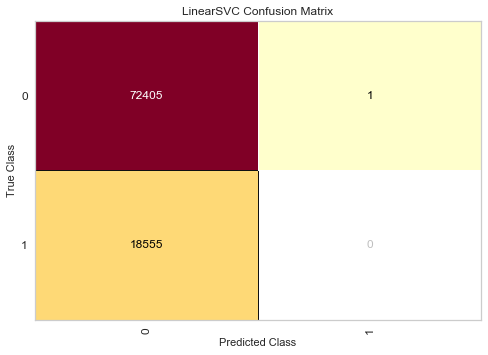

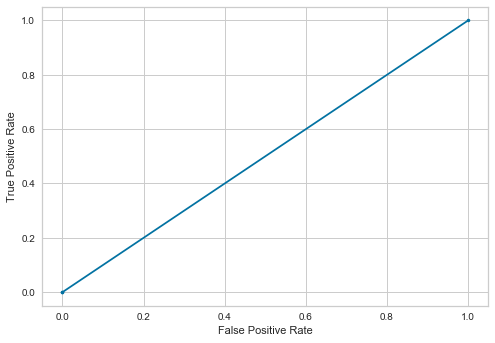

---------MLP Classifier------------
Accuracy  (%): 
 79.60004837237938
AUC  (%): 
 49.99930944949313
Precision: 
 0.0
Recall (%): 
 0.0
f1 score (%): 
 0.0
logistic loss :
 7.045893686124383
              precision    recall  f1-score   support

           0       0.80      1.00      0.89     72406
           1       0.00      0.00      0.00     18555

    accuracy                           0.80     90961
   macro avg       0.40      0.50      0.44     90961
weighted avg       0.63      0.80      0.71     90961



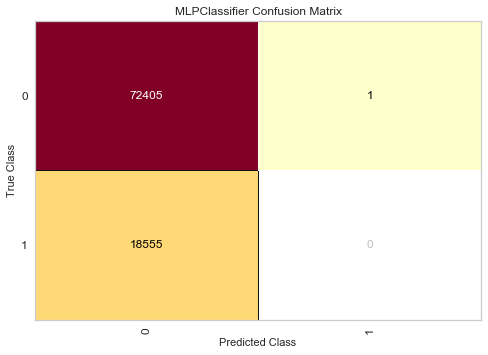

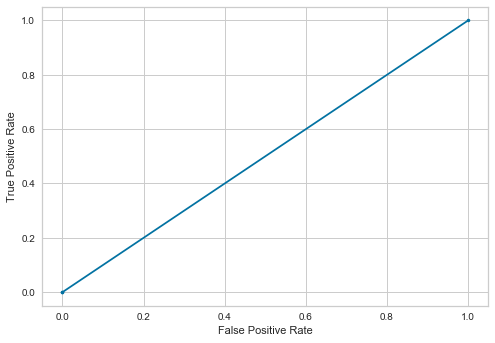

---------light Gradient Boosting------------
Accuracy  (%): 
 80.75878673277559
AUC  (%): 
 53.5870588207535
Precision: 
 79.23375902276513
Recall (%): 
 7.6906494206413365
f1 score (%): 
 14.020436235016701
logistic loss :
 6.6456829137010995
              precision    recall  f1-score   support

           0       0.81      0.99      0.89     72406
           1       0.79      0.08      0.14     18555

    accuracy                           0.81     90961
   macro avg       0.80      0.54      0.52     90961
weighted avg       0.80      0.81      0.74     90961



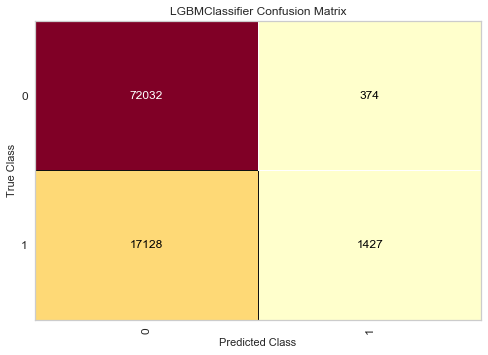

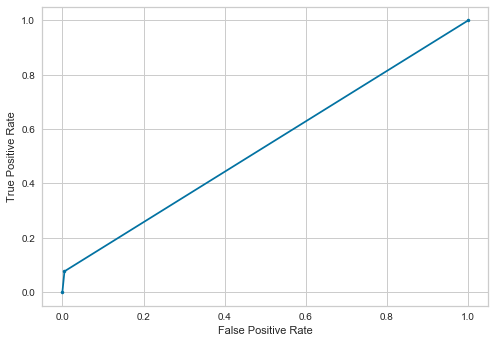

---------Gradient Boosting Classifier------------
Accuracy  (%): 
 79.7990347511571
AUC  (%): 
 50.61531362422171
Precision: 
 79.03225806451613
Recall (%): 
 1.3203988143357586
f1 score (%): 
 2.5974025974025974
logistic loss :
 6.9771667882973665
              precision    recall  f1-score   support

           0       0.80      1.00      0.89     72406
           1       0.79      0.01      0.03     18555

    accuracy                           0.80     90961
   macro avg       0.79      0.51      0.46     90961
weighted avg       0.80      0.80      0.71     90961



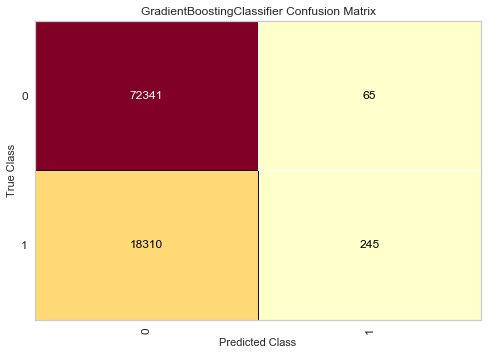

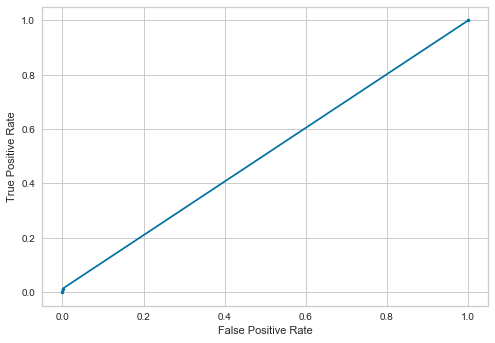

,classifier,Precision,Recall,AUC,Accuracy
0,Logistic Regression,0.000000,0.000000,50.000000,79.601148
1,Nearest Neighbors,55.599482,41.686877,66.577908,81.313970
2,Decision Tree,60.171997,60.334142,75.050092,83.762272
3,Naive Bayes,21.258134,0.528160,50.013410,79.309814
4,Random Forest,75.275705,50.029642,72.909332,86.454634
5,xgboost,80.244253,18.059822,58.460207,82.378162
6,Ada Boost,46.666667,0.037726,50.013338,79.600048
7,SVM,0.000000,0.000000,49.999309,79.600048
8,MLP Classifier,0.000000,0.000000,49.999309,79.600048
9,light Gradient Boosting,79.233759,7.690649,53.587059,80.758787


,classifier,Precision,Recall,AUC,Accuracy
0,Logistic Regression,0.000000,0.000000,50.000000,79.601148
1,Nearest Neighbors,55.599482,41.686877,66.577908,81.313970
2,Decision Tree,60.171997,60.334142,75.050092,83.762272
3,Naive Bayes,21.258134,0.528160,50.013410,79.309814
4,Random Forest,75.275705,50.029642,72.909332,86.454634
5,xgboost,80.244253,18.059822,58.460207,82.378162
6,Ada Boost,46.666667,0.037726,50.013338,79.600048
7,SVM,0.000000,0.000000,49.999309,79.600048
8,MLP Classifier,0.000000,0.000000,49.999309,79.600048
9,light Gradient Boosting,79.233759,7.690649,53.587059,80.758787


In [15]:
t3.fit_model_RFS(df2,'return',min_max=True)

---------Logistic Regression------------
Accuracy  (%): 
 79.49560800782753
AUC  (%): 
 50.150154374045165
Precision: 
 34.61538461538461
Recall (%): 
 0.582053354890865
f1 score (%): 
 1.1448560979487994
logistic loss :
 7.0819678945850955
              precision    recall  f1-score   support

           0       0.80      1.00      0.89     72406
           1       0.35      0.01      0.01     18555

    accuracy                           0.79     90961
   macro avg       0.57      0.50      0.45     90961
weighted avg       0.70      0.79      0.71     90961



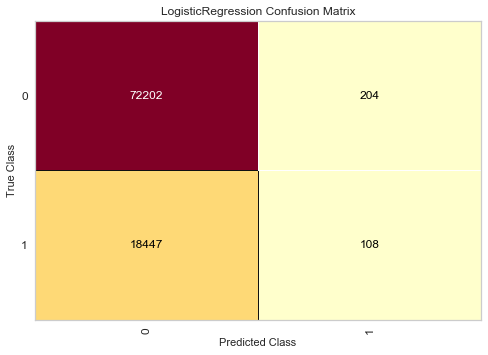

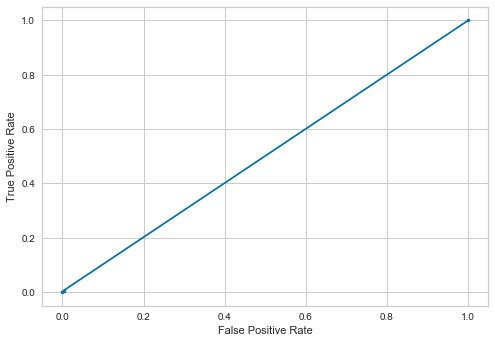

---------Nearest Neighbors------------
Accuracy  (%): 
 76.08205714537
AUC  (%): 
 67.34795936798585
Precision: 
 42.95523570579691
Recall (%): 
 52.59498787388844
f1 score (%): 
 47.28885012356447
logistic loss :
 8.261078726381328
              precision    recall  f1-score   support

           0       0.87      0.82      0.85     72406
           1       0.43      0.53      0.47     18555

    accuracy                           0.76     90961
   macro avg       0.65      0.67      0.66     90961
weighted avg       0.78      0.76      0.77     90961



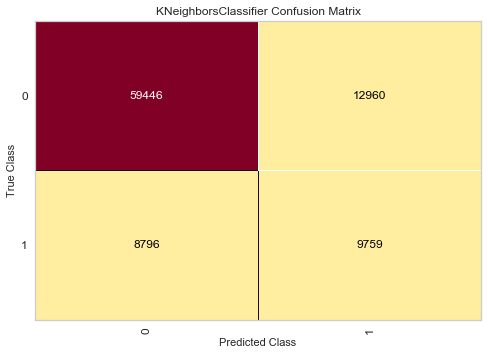

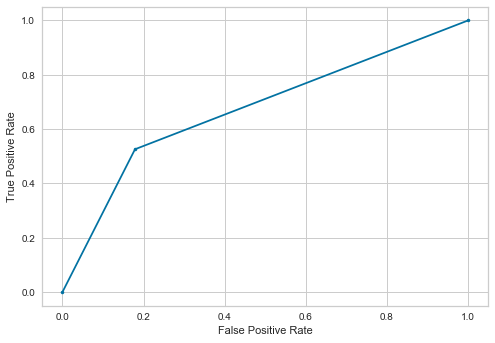

---------Decision Tree------------
Accuracy  (%): 
 82.7035762579567
AUC  (%): 
 79.2331084367944
Precision: 
 55.78136523805621
Recall (%): 
 73.37105901374292
f1 score (%): 
 63.37841297921371
logistic loss :
 5.974067988221287
              precision    recall  f1-score   support

           0       0.93      0.85      0.89     72406
           1       0.56      0.73      0.63     18555

    accuracy                           0.83     90961
   macro avg       0.74      0.79      0.76     90961
weighted avg       0.85      0.83      0.84     90961



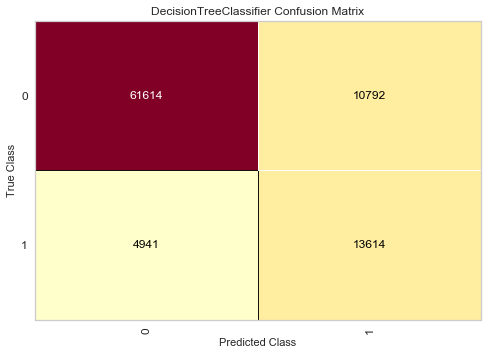

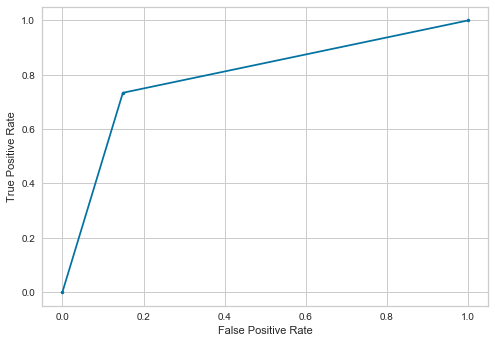

---------Naive Bayes------------
Accuracy  (%): 
 79.09103901672145
AUC  (%): 
 50.39706702526018
Precision: 
 30.338983050847457
Recall (%): 
 1.9293990838049044
f1 score (%): 
 3.6280719533823156
logistic loss :
 7.22170650634771
              precision    recall  f1-score   support

           0       0.80      0.99      0.88     72406
           1       0.30      0.02      0.04     18555

    accuracy                           0.79     90961
   macro avg       0.55      0.50      0.46     90961
weighted avg       0.70      0.79      0.71     90961



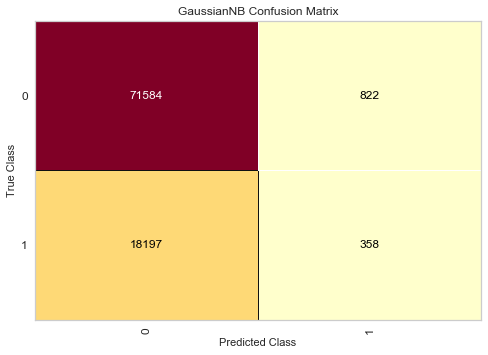

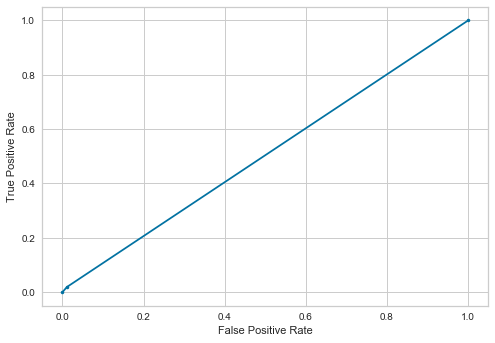

---------Random Forest------------
Accuracy  (%): 
 87.31434350985587
AUC  (%): 
 79.84455657848335
Precision: 
 69.56279277269685
Recall (%): 
 67.22716248989491
f1 score (%): 
 68.3750376846548
logistic loss :
 4.381518508191954
              precision    recall  f1-score   support

           0       0.92      0.92      0.92     72406
           1       0.70      0.67      0.68     18555

    accuracy                           0.87     90961
   macro avg       0.81      0.80      0.80     90961
weighted avg       0.87      0.87      0.87     90961



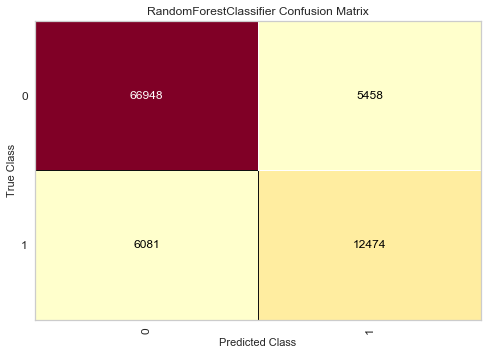

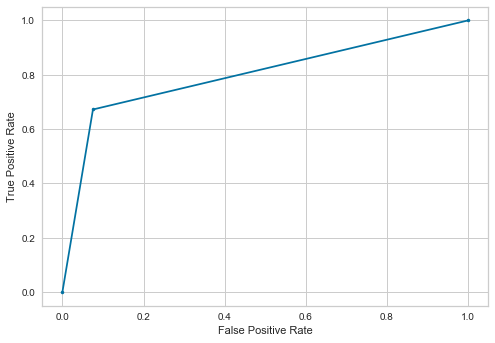

---------xgboost------------
Accuracy  (%): 
 81.33155967942305
AUC  (%): 
 68.72136272533635
Precision: 
 54.91138292561158
Recall (%): 
 47.42118027485853
f1 score (%): 
 50.89215998149166
logistic loss :
 6.44791437048198
              precision    recall  f1-score   support

           0       0.87      0.90      0.88     72406
           1       0.55      0.47      0.51     18555

    accuracy                           0.81     90961
   macro avg       0.71      0.69      0.70     90961
weighted avg       0.80      0.81      0.81     90961



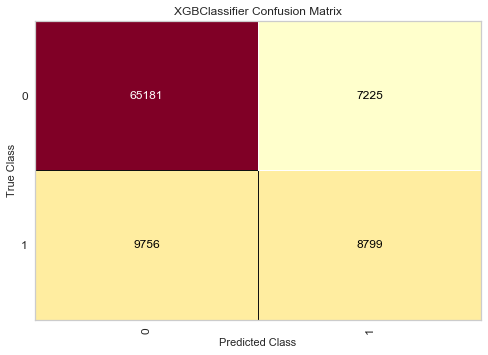

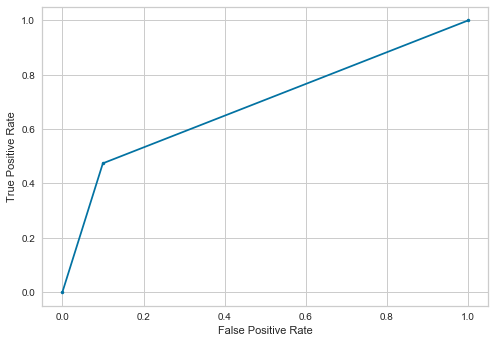

---------Ada Boost------------
Accuracy  (%): 
 76.15681445894394
AUC  (%): 
 59.86736339063179
Precision: 
 39.652553008785254
Recall (%): 
 32.35246564268392
f1 score (%): 
 35.63245681723749
logistic loss :
 8.235224849935083
              precision    recall  f1-score   support

           0       0.83      0.87      0.85     72406
           1       0.40      0.32      0.36     18555

    accuracy                           0.76     90961
   macro avg       0.62      0.60      0.61     90961
weighted avg       0.75      0.76      0.75     90961



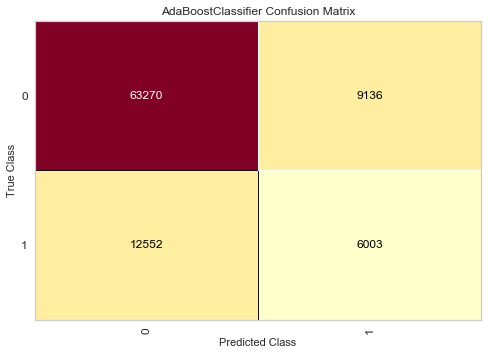

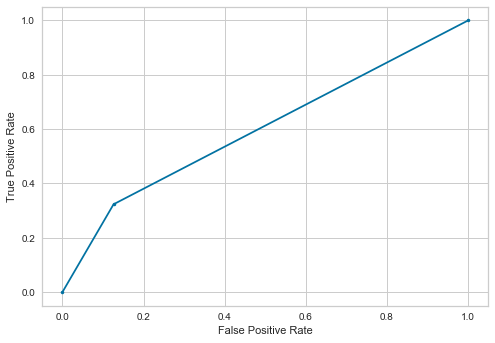

---------SVM------------
Accuracy  (%): 
 79.51869482525478
AUC  (%): 
 50.13659796137582
Precision: 
 35.741444866920155
Recall (%): 
 0.5066019940716788
f1 score (%): 
 0.9990434690190243
logistic loss :
 7.073993682667867
              precision    recall  f1-score   support

           0       0.80      1.00      0.89     72406
           1       0.36      0.01      0.01     18555

    accuracy                           0.80     90961
   macro avg       0.58      0.50      0.45     90961
weighted avg       0.71      0.80      0.71     90961



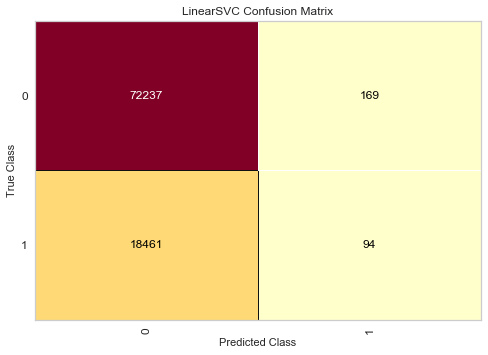

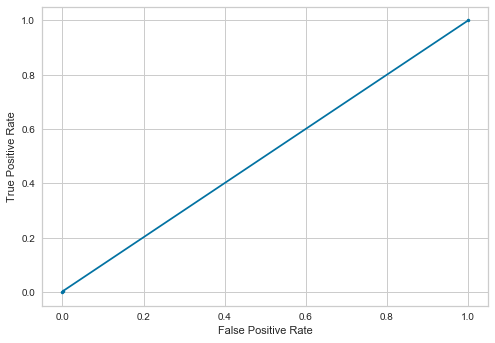

---------MLP Classifier------------
Accuracy  (%): 
 75.7885247523664
AUC  (%): 
 56.33721296554557
Precision: 
 35.76588409128222
Recall (%): 
 23.481541363513877
f1 score (%): 
 28.350196831180664
logistic loss :
 8.362416083761275
              precision    recall  f1-score   support

           0       0.82      0.89      0.85     72406
           1       0.36      0.23      0.28     18555

    accuracy                           0.76     90961
   macro avg       0.59      0.56      0.57     90961
weighted avg       0.73      0.76      0.74     90961



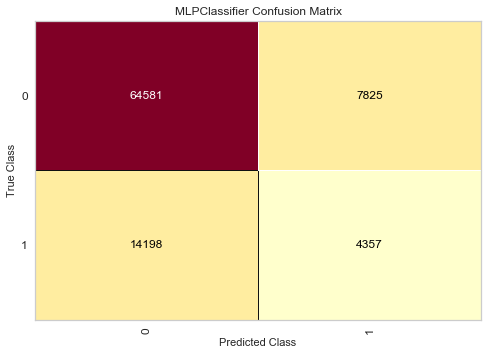

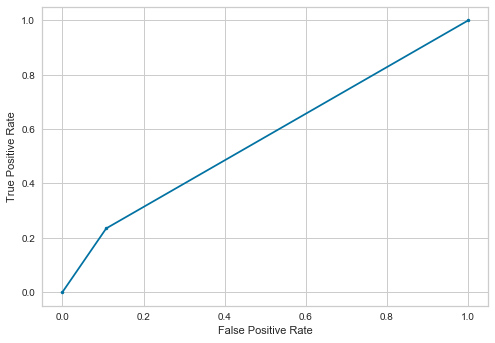

---------light Gradient Boosting------------
Accuracy  (%): 
 79.41205571618606
AUC  (%): 
 64.17075029319275
Precision: 
 49.404101995565405
Recall (%): 
 38.4263001886284
f1 score (%): 
 43.22915087761846
logistic loss :
 7.110888229108384
              precision    recall  f1-score   support

           0       0.85      0.90      0.87     72406
           1       0.49      0.38      0.43     18555

    accuracy                           0.79     90961
   macro avg       0.67      0.64      0.65     90961
weighted avg       0.78      0.79      0.78     90961



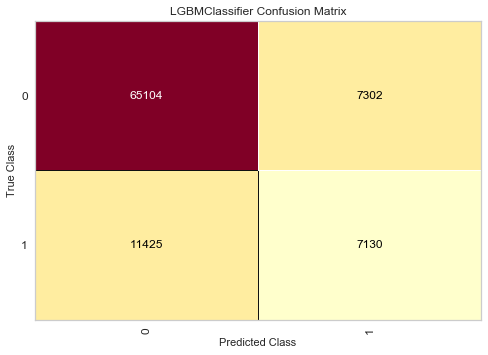

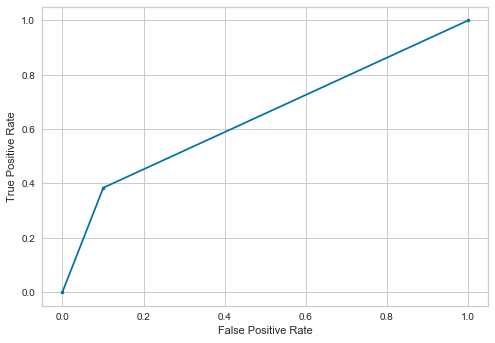

---------Gradient Boosting Classifier------------
Accuracy  (%): 
 77.87513329888634
AUC  (%): 
 60.122991902014135
Precision: 
 43.845068213893676
Recall (%): 
 30.13742926434923
f1 score (%): 
 35.7213580759526
logistic loss :
 7.641721195505464
              precision    recall  f1-score   support

           0       0.83      0.90      0.87     72406
           1       0.44      0.30      0.36     18555

    accuracy                           0.78     90961
   macro avg       0.64      0.60      0.61     90961
weighted avg       0.75      0.78      0.76     90961



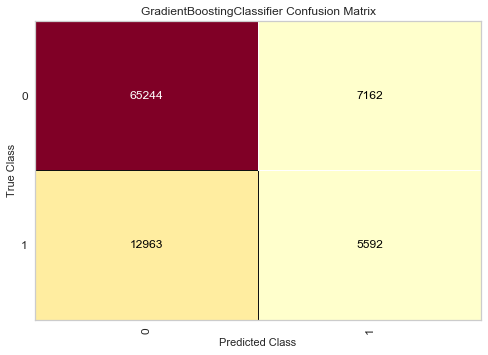

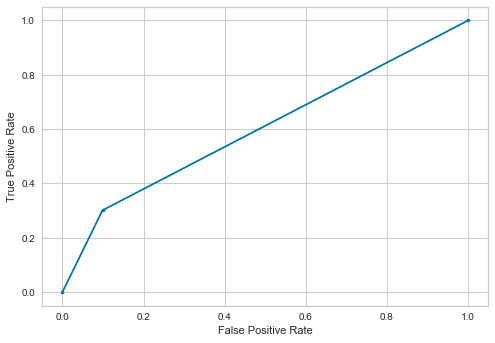

,classifier,Precision,Recall,AUC,Accuracy
0,Logistic Regression,34.615385,0.582053,50.150154,79.495608
1,Nearest Neighbors,42.955236,52.594988,67.347959,76.082057
2,Decision Tree,55.781365,73.371059,79.233108,82.703576
3,Naive Bayes,30.338983,1.929399,50.397067,79.091039
4,Random Forest,69.562793,67.227162,79.844557,87.314344
5,xgboost,54.911383,47.421180,68.721363,81.331560
6,Ada Boost,39.652553,32.352466,59.867363,76.156814
7,SVM,35.741445,0.506602,50.136598,79.518695
8,MLP Classifier,35.765884,23.481541,56.337213,75.788525
9,light Gradient Boosting,49.404102,38.426300,64.170750,79.412056


,classifier,Precision,Recall,AUC,Accuracy
0,Logistic Regression,34.615385,0.582053,50.150154,79.495608
1,Nearest Neighbors,42.955236,52.594988,67.347959,76.082057
2,Decision Tree,55.781365,73.371059,79.233108,82.703576
3,Naive Bayes,30.338983,1.929399,50.397067,79.091039
4,Random Forest,69.562793,67.227162,79.844557,87.314344
5,xgboost,54.911383,47.421180,68.721363,81.331560
6,Ada Boost,39.652553,32.352466,59.867363,76.156814
7,SVM,35.741445,0.506602,50.136598,79.518695
8,MLP Classifier,35.765884,23.481541,56.337213,75.788525
9,light Gradient Boosting,49.404102,38.426300,64.170750,79.412056


In [16]:
t3.fit_model_us(df2,'return',min_max=True)

---------Logistic Regression------------
Accuracy  (%): 
 79.50220424137817
AUC  (%): 
 50.14026869042959
Precision: 
 34.58904109589041
Recall (%): 
 0.5443276744812718
f1 score (%): 
 1.071788613572452
logistic loss :
 7.079689521951375
              precision    recall  f1-score   support

           0       0.80      1.00      0.89     72406
           1       0.35      0.01      0.01     18555

    accuracy                           0.80     90961
   macro avg       0.57      0.50      0.45     90961
weighted avg       0.70      0.80      0.71     90961



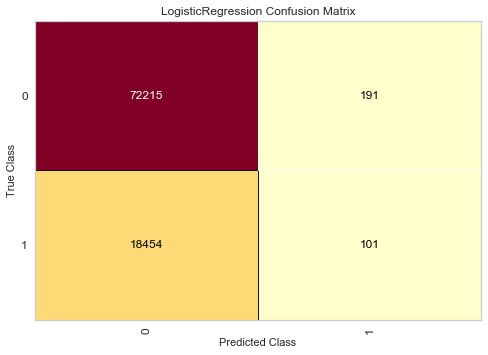

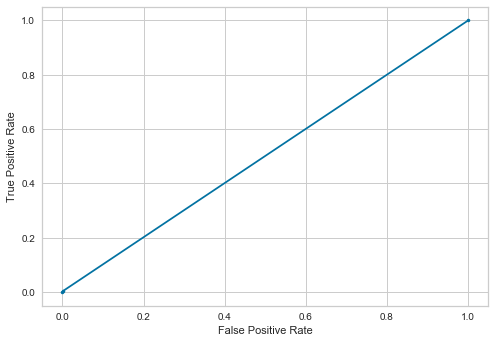

---------Nearest Neighbors------------
Accuracy  (%): 
 77.71132683237872
AUC  (%): 
 69.84640295906792
Precision: 
 46.21515698621692
Recall (%): 
 56.561573699811376
f1 score (%): 
 50.86758433501358
logistic loss :
 7.698342354563292
              precision    recall  f1-score   support

           0       0.88      0.83      0.86     72406
           1       0.46      0.57      0.51     18555

    accuracy                           0.78     90961
   macro avg       0.67      0.70      0.68     90961
weighted avg       0.80      0.78      0.79     90961



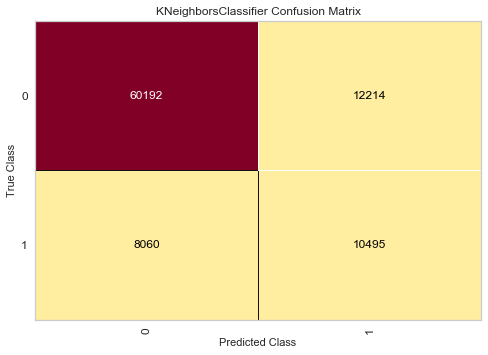

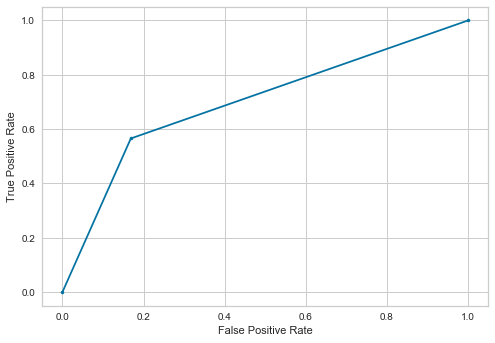

---------Decision Tree------------
Accuracy  (%): 
 86.96914062070557
AUC  (%): 
 80.27906952839135
Precision: 
 67.73391193903471
Recall (%): 
 68.97871193748315
f1 score (%): 
 68.35064484259433
logistic loss :
 4.500752979347284
              precision    recall  f1-score   support

           0       0.92      0.92      0.92     72406
           1       0.68      0.69      0.68     18555

    accuracy                           0.87     90961
   macro avg       0.80      0.80      0.80     90961
weighted avg       0.87      0.87      0.87     90961



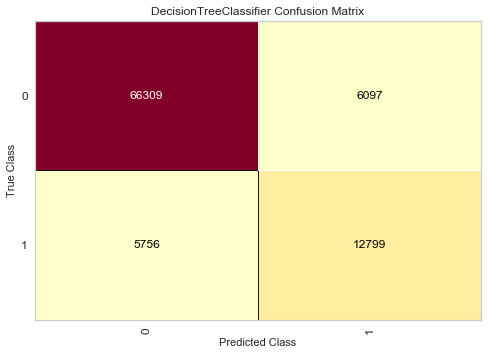

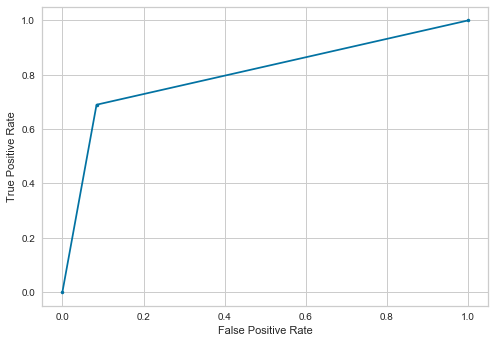

---------Naive Bayes------------
Accuracy  (%): 
 79.20537373159927
AUC  (%): 
 50.380702076131634
Precision: 
 31.781376518218625
Recall (%): 
 1.6922662355160334
f1 score (%): 
 3.2134268024356545
logistic loss :
 7.182215393832561
              precision    recall  f1-score   support

           0       0.80      0.99      0.88     72406
           1       0.32      0.02      0.03     18555

    accuracy                           0.79     90961
   macro avg       0.56      0.50      0.46     90961
weighted avg       0.70      0.79      0.71     90961



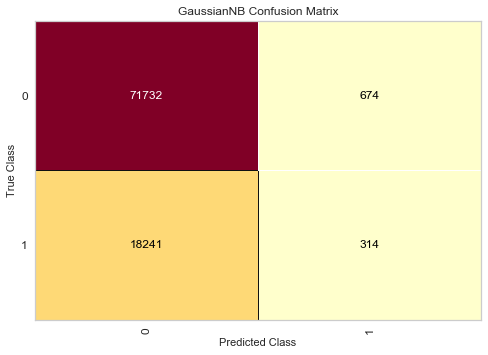

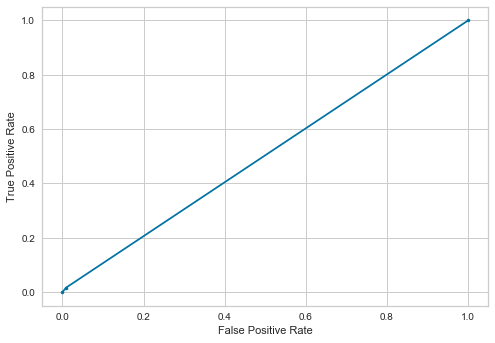

---------Random Forest------------
Accuracy  (%): 
 89.02936423302295
AUC  (%): 
 78.89162058586476
Precision: 
 79.88986477066778
Recall (%): 
 61.76771759633522
f1 score (%): 
 69.66961490532204
logistic loss :
 3.7891487173997622
              precision    recall  f1-score   support

           0       0.91      0.96      0.93     72406
           1       0.80      0.62      0.70     18555

    accuracy                           0.89     90961
   macro avg       0.85      0.79      0.81     90961
weighted avg       0.89      0.89      0.88     90961



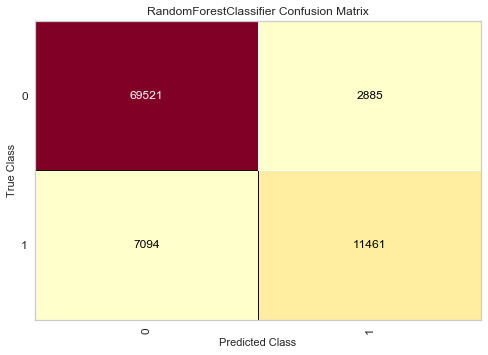

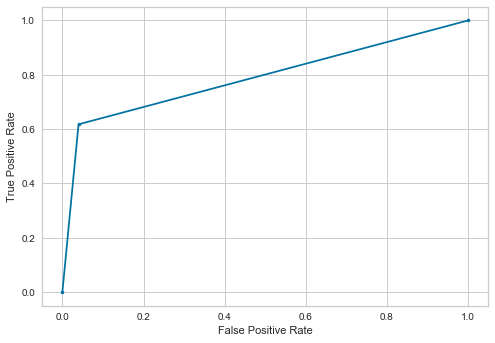

---------xgboost------------
Accuracy  (%): 
 81.6591726124383
AUC  (%): 
 68.64456290229592
Precision: 
 56.060606060606055
Recall (%): 
 46.66127728375101
f1 score (%): 
 50.93090973263919
logistic loss :
 6.334757013054565
              precision    recall  f1-score   support

           0       0.87      0.91      0.89     72406
           1       0.56      0.47      0.51     18555

    accuracy                           0.82     90961
   macro avg       0.71      0.69      0.70     90961
weighted avg       0.81      0.82      0.81     90961



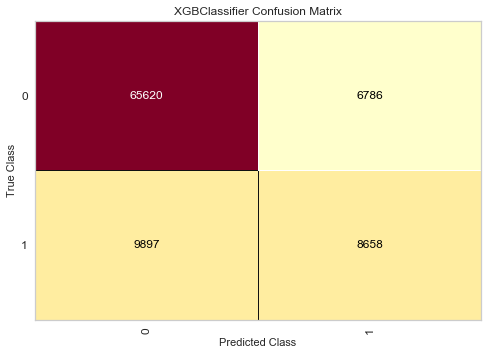

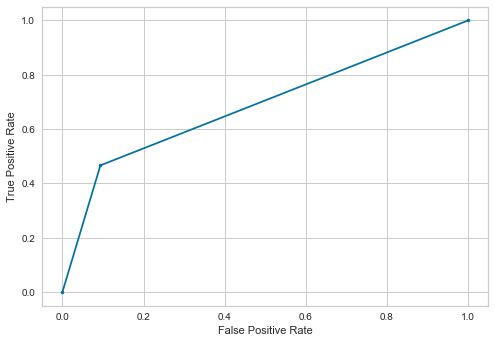

---------Ada Boost------------
Accuracy  (%): 
 76.28654038543992
AUC  (%): 
 59.90676139047151
Precision: 
 39.93591027438414
Recall (%): 
 32.23928860145514
f1 score (%): 
 35.67722311683665
logistic loss :
 8.19041788036964
              precision    recall  f1-score   support

           0       0.83      0.88      0.85     72406
           1       0.40      0.32      0.36     18555

    accuracy                           0.76     90961
   macro avg       0.62      0.60      0.61     90961
weighted avg       0.75      0.76      0.75     90961



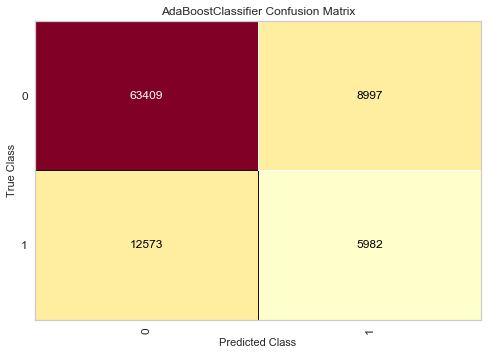

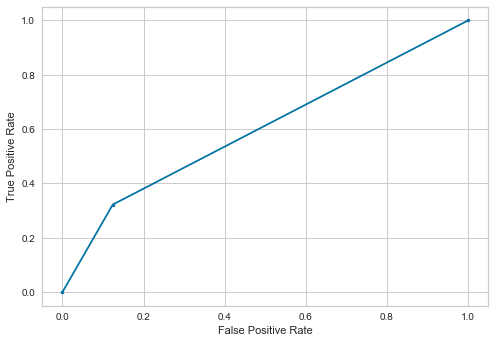

---------SVM------------
Accuracy  (%): 
 79.52858917558075
AUC  (%): 
 50.13880463403567
Precision: 
 36.8
Recall (%): 
 0.49582322824036645
f1 score (%): 
 0.978463174687583
logistic loss :
 7.070576198436977
              precision    recall  f1-score   support

           0       0.80      1.00      0.89     72406
           1       0.37      0.00      0.01     18555

    accuracy                           0.80     90961
   macro avg       0.58      0.50      0.45     90961
weighted avg       0.71      0.80      0.71     90961



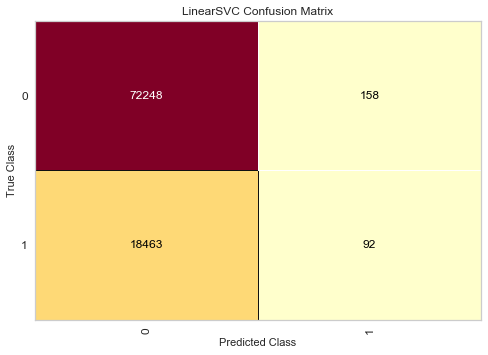

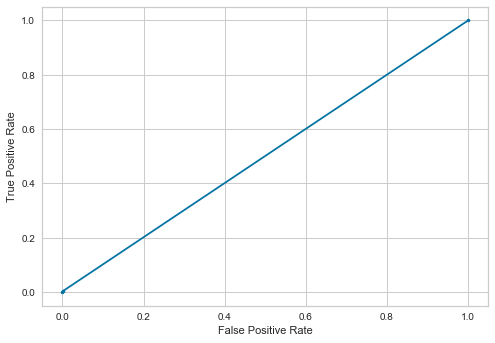

---------MLP Classifier------------
Accuracy  (%): 
 78.72714679917767
AUC  (%): 
 50.94409735551125
Precision: 
 32.60393873085339
Recall (%): 
 4.015090272163837
f1 score (%): 
 7.149712092130518
logistic loss :
 7.347396737300208
              precision    recall  f1-score   support

           0       0.80      0.98      0.88     72406
           1       0.33      0.04      0.07     18555

    accuracy                           0.79     90961
   macro avg       0.56      0.51      0.48     90961
weighted avg       0.70      0.79      0.71     90961



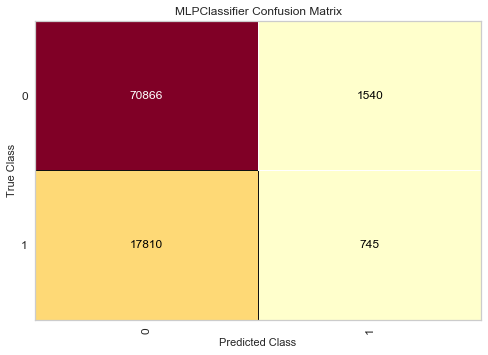

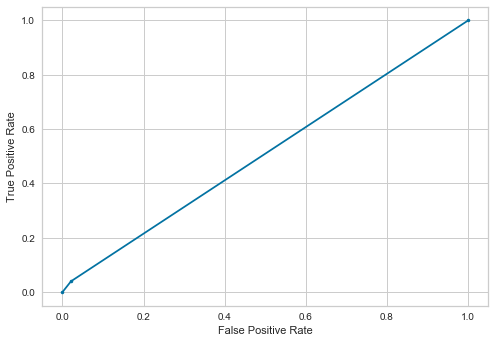

---------light Gradient Boosting------------
Accuracy  (%): 
 79.47801805169247
AUC  (%): 
 64.24825786072194
Precision: 
 49.61132704053304
Recall (%): 
 38.52330908111021
f1 score (%): 
 43.36983891029335
logistic loss :
 7.08810527633976
              precision    recall  f1-score   support

           0       0.85      0.90      0.87     72406
           1       0.50      0.39      0.43     18555

    accuracy                           0.79     90961
   macro avg       0.67      0.64      0.65     90961
weighted avg       0.78      0.79      0.78     90961



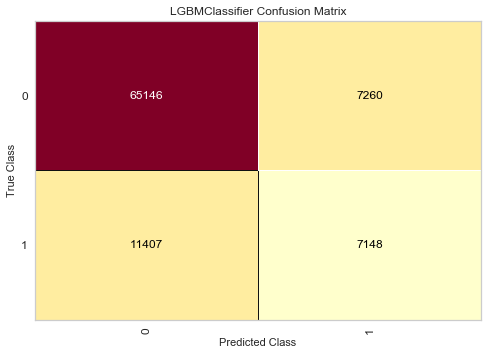

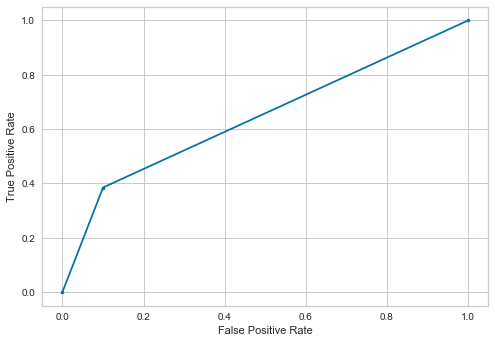

---------Gradient Boosting Classifier------------
Accuracy  (%): 
 77.78498477369422
AUC  (%): 
 60.11847442517634
Precision: 
 43.590937306021104
Recall (%): 
 30.277553220156296
f1 score (%): 
 35.7345037051172
logistic loss :
 7.67285834242453
              precision    recall  f1-score   support

           0       0.83      0.90      0.87     72406
           1       0.44      0.30      0.36     18555

    accuracy                           0.78     90961
   macro avg       0.64      0.60      0.61     90961
weighted avg       0.75      0.78      0.76     90961



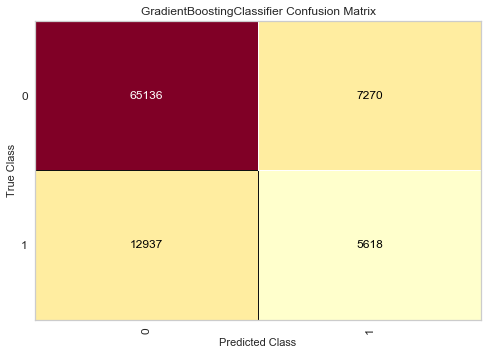

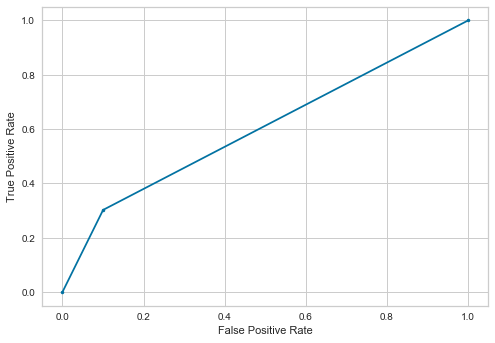

,classifier,Precision,Recall,AUC,Accuracy
0,Logistic Regression,34.589041,0.544328,50.140269,79.502204
1,Nearest Neighbors,46.215157,56.561574,69.846403,77.711327
2,Decision Tree,67.733912,68.978712,80.279070,86.969141
3,Naive Bayes,31.781377,1.692266,50.380702,79.205374
4,Random Forest,79.889865,61.767718,78.891621,89.029364
5,xgboost,56.060606,46.661277,68.644563,81.659173
6,Ada Boost,39.935910,32.239289,59.906761,76.286540
7,SVM,36.800000,0.495823,50.138805,79.528589
8,MLP Classifier,32.603939,4.015090,50.944097,78.727147
9,light Gradient Boosting,49.611327,38.523309,64.248258,79.478018


,classifier,Precision,Recall,AUC,Accuracy
0,Logistic Regression,34.589041,0.544328,50.140269,79.502204
1,Nearest Neighbors,46.215157,56.561574,69.846403,77.711327
2,Decision Tree,67.733912,68.978712,80.279070,86.969141
3,Naive Bayes,31.781377,1.692266,50.380702,79.205374
4,Random Forest,79.889865,61.767718,78.891621,89.029364
5,xgboost,56.060606,46.661277,68.644563,81.659173
6,Ada Boost,39.935910,32.239289,59.906761,76.286540
7,SVM,36.800000,0.495823,50.138805,79.528589
8,MLP Classifier,32.603939,4.015090,50.944097,78.727147
9,light Gradient Boosting,49.611327,38.523309,64.248258,79.478018


In [17]:
t3.fit_model_os(df2,'return',min_max=True)

_____Cross Validation_____
---------Logistic Regression------------
Mean accuracy  (%): 
 79.73189895300258
Mean AUC  (%): 
 56.720601438204724
Mean Precision: 
 18.701631701631698
Mean Recall (%): 
 0.05068921863726714
Mean f1 score (%): 
 0.10104669279427592
---------Nearest Neighbors------------
Mean accuracy  (%): 
 78.41558119415996
Mean AUC  (%): 
 68.43780784115205
Mean Precision: 
 44.09274191635997
Mean Recall (%): 
 24.751060926460703
Mean f1 score (%): 
 31.701943537618092
---------Decision Tree------------
Mean accuracy  (%): 
 81.16695623701003
Mean AUC  (%): 
 71.82265569117929
Mean Precision: 
 53.33005142400937
Mean Recall (%): 
 56.012143906763825
Mean f1 score (%): 
 54.63041026827955
---------Naive Bayes------------
Mean accuracy  (%): 
 79.40281839873347
Mean AUC  (%): 
 63.595995667162164
Mean Precision: 
 33.897113459049166
Mean Recall (%): 
 1.966021766400267
Mean f1 score (%): 
 3.6170184753738477
---------Random Forest------------
Mean accuracy  (%): 
 85.08000

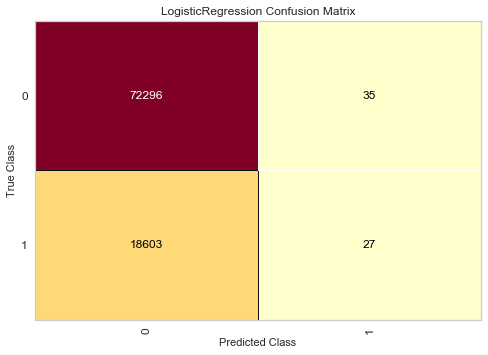

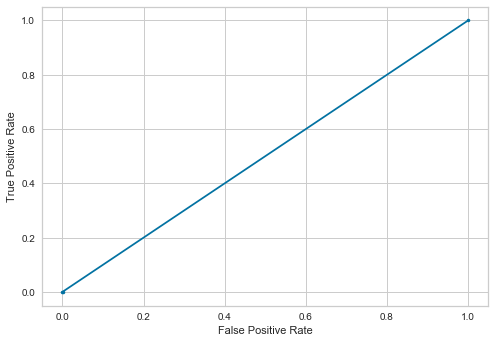

---------Nearest Neighbors------------
Accuracy  (%): 
 79.37137894262376
AUC  (%): 
 61.852867750217875
Precision: 
 49.44737710326625
Recall (%): 
 32.17928073000537
f1 score (%): 
 38.9867984652403
logistic loss :
 7.12492717765585
              precision    recall  f1-score   support

           0       0.84      0.92      0.88     72331
           1       0.49      0.32      0.39     18630

    accuracy                           0.79     90961
   macro avg       0.67      0.62      0.63     90961
weighted avg       0.77      0.79      0.78     90961



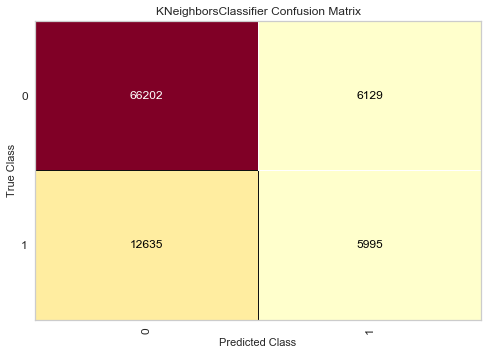

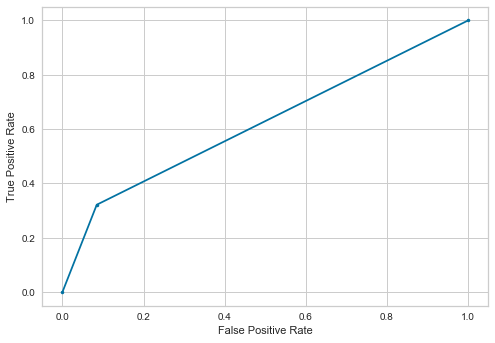

---------Decision Tree------------
Accuracy  (%): 
 84.89792328580381
AUC  (%): 
 77.38893155595237
Precision: 
 62.74019684424309
Recall (%): 
 64.66988727858293
f1 score (%): 
 63.690428990563795
logistic loss :
 5.216135403705996
              precision    recall  f1-score   support

           0       0.91      0.90      0.90     72331
           1       0.63      0.65      0.64     18630

    accuracy                           0.85     90961
   macro avg       0.77      0.77      0.77     90961
weighted avg       0.85      0.85      0.85     90961



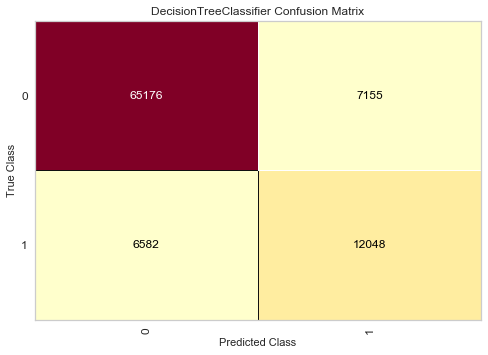

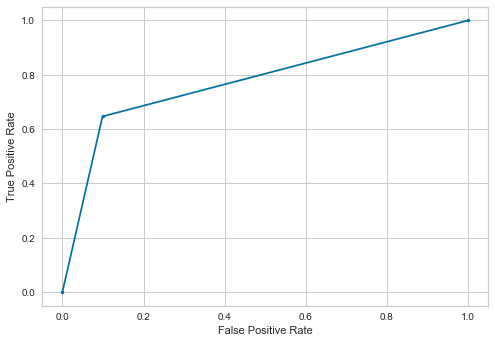

---------Naive Bayes------------
Accuracy  (%): 
 79.17019381932916
AUC  (%): 
 50.394582138579494
Precision: 
 33.01178992497321
Recall (%): 
 1.6532474503488996
f1 score (%): 
 3.1488013085927515
logistic loss :
 7.194365674330389
              precision    recall  f1-score   support

           0       0.80      0.99      0.88     72331
           1       0.33      0.02      0.03     18630

    accuracy                           0.79     90961
   macro avg       0.56      0.50      0.46     90961
weighted avg       0.70      0.79      0.71     90961



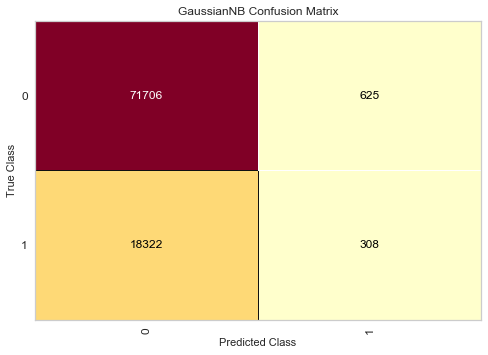

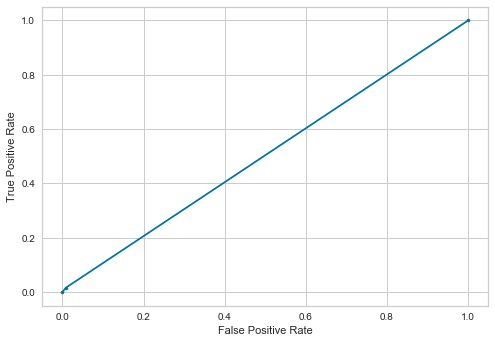

---------Random Forest------------
Accuracy  (%): 
 87.24728180209101
AUC  (%): 
 72.80674232810837
Precision: 
 82.00109249817918
Recall (%): 
 48.3467525496511
f1 score (%): 
 60.82933747551833
logistic loss :
 4.4046502015708215
              precision    recall  f1-score   support

           0       0.88      0.97      0.92     72331
           1       0.82      0.48      0.61     18630

    accuracy                           0.87     90961
   macro avg       0.85      0.73      0.77     90961
weighted avg       0.87      0.87      0.86     90961



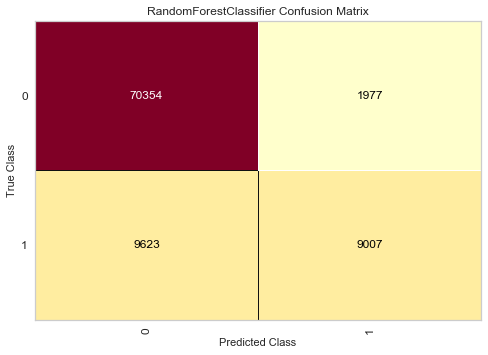

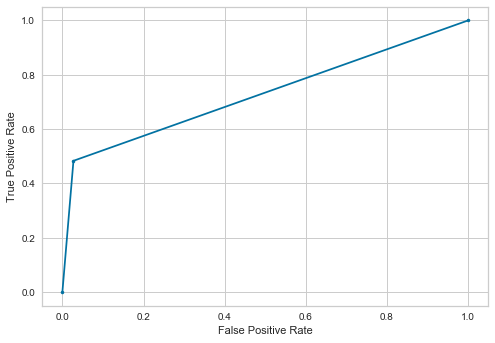

---------xgboost------------
Accuracy  (%): 
 82.52767669660624
AUC  (%): 
 59.68097893404741
Precision: 
 76.93367447352884
Recall (%): 
 20.982286634460547
f1 score (%): 
 32.972038294462486
logistic loss :
 6.03473697928237
              precision    recall  f1-score   support

           0       0.83      0.98      0.90     72331
           1       0.77      0.21      0.33     18630

    accuracy                           0.83     90961
   macro avg       0.80      0.60      0.61     90961
weighted avg       0.82      0.83      0.78     90961



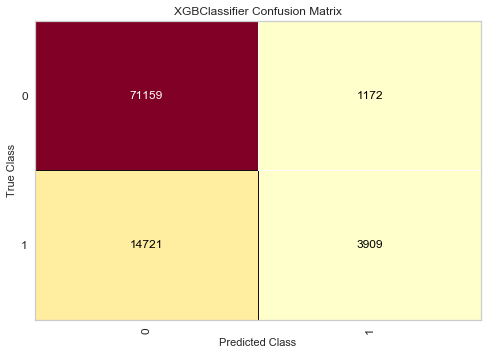

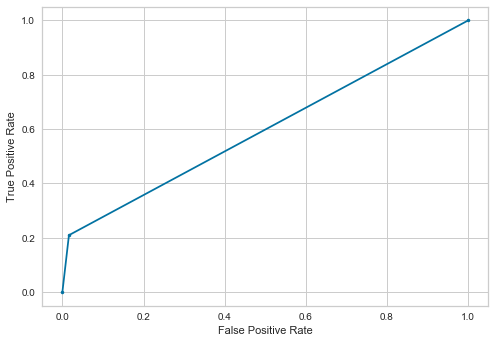

---------Ada Boost------------
Accuracy  (%): 
 79.55607348204175
AUC  (%): 
 50.74282326003631
Precision: 
 52.470930232558146
Recall (%): 
 1.9377348362855609
f1 score (%): 
 3.737446940677089
logistic loss :
 7.06108494088806
              precision    recall  f1-score   support

           0       0.80      1.00      0.89     72331
           1       0.52      0.02      0.04     18630

    accuracy                           0.80     90961
   macro avg       0.66      0.51      0.46     90961
weighted avg       0.74      0.80      0.71     90961



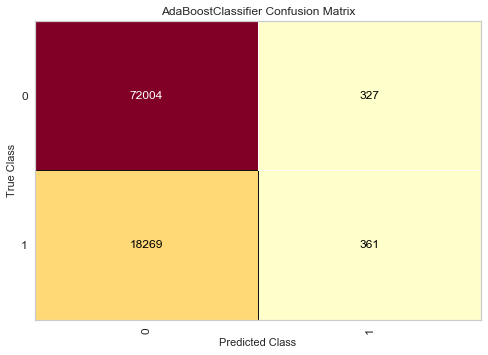

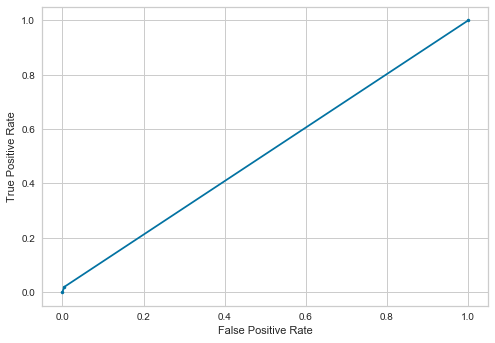

---------SVM------------
Accuracy  (%): 
 79.5109992194457
AUC  (%): 
 50.04298297563018
Precision: 
 43.63636363636363
Recall (%): 
 0.12882447665056362
f1 score (%): 
 0.2568905539202569
logistic loss :
 7.076650437654276
              precision    recall  f1-score   support

           0       0.80      1.00      0.89     72331
           1       0.44      0.00      0.00     18630

    accuracy                           0.80     90961
   macro avg       0.62      0.50      0.44     90961
weighted avg       0.72      0.80      0.70     90961



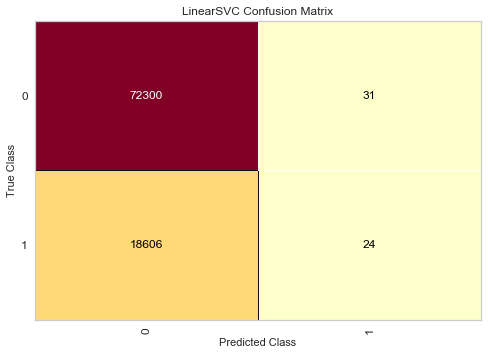

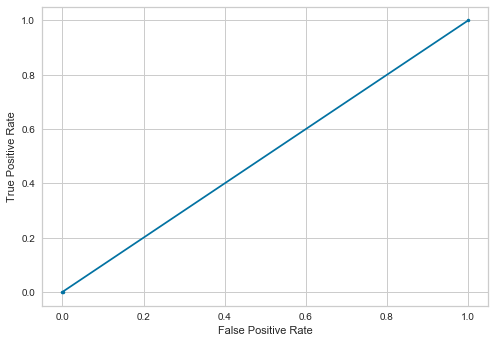

---------MLP Classifier------------
Accuracy  (%): 
 79.52639043106386
AUC  (%): 
 50.074579051144916
Precision: 
 55.55555555555556
Recall (%): 
 0.1878690284487386
f1 score (%): 
 0.3744717273845825
logistic loss :
 7.071334475117355
              precision    recall  f1-score   support

           0       0.80      1.00      0.89     72331
           1       0.56      0.00      0.00     18630

    accuracy                           0.80     90961
   macro avg       0.68      0.50      0.44     90961
weighted avg       0.75      0.80      0.71     90961



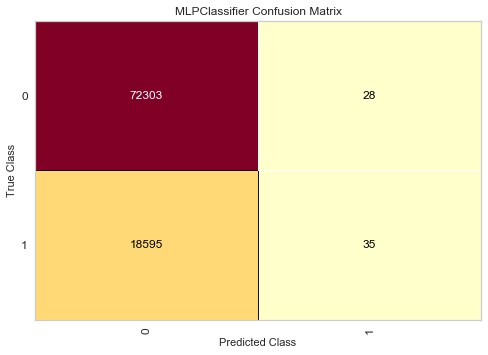

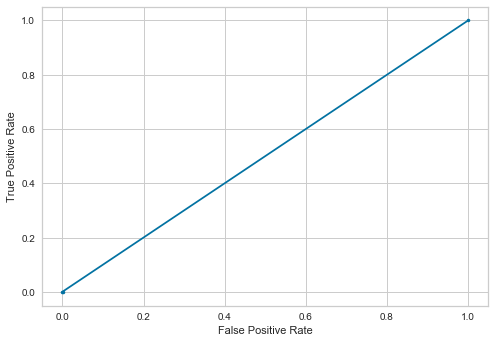

---------light Gradient Boosting------------
Accuracy  (%): 
 80.96766746187927
AUC  (%): 
 54.72488114946427
Precision: 
 76.25498007968127
Recall (%): 
 10.273752012882447
f1 score (%): 
 18.107852412488175
logistic loss :
 6.573540017246535
              precision    recall  f1-score   support

           0       0.81      0.99      0.89     72331
           1       0.76      0.10      0.18     18630

    accuracy                           0.81     90961
   macro avg       0.79      0.55      0.54     90961
weighted avg       0.80      0.81      0.75     90961



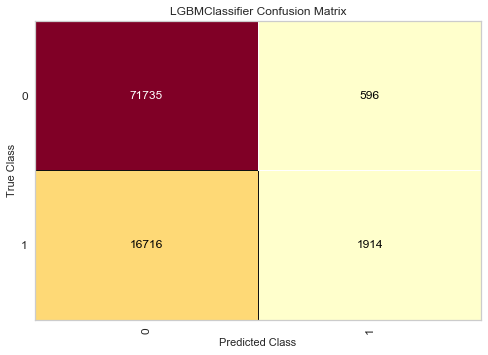

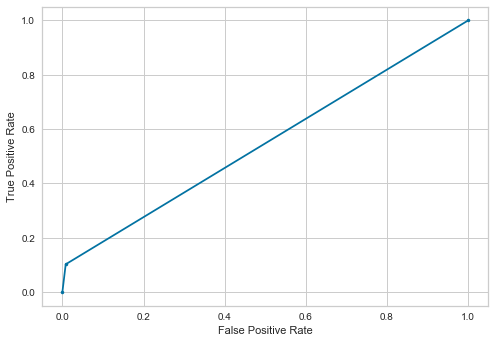

---------Gradient Boosting Classifier------------
Accuracy  (%): 
 79.8375127802025
AUC  (%): 
 51.16288185435578
Precision: 
 71.44970414201184
Recall (%): 
 2.5925925925925926
f1 score (%): 
 5.003625815808556
logistic loss :
 6.963878073074899
              precision    recall  f1-score   support

           0       0.80      1.00      0.89     72331
           1       0.71      0.03      0.05     18630

    accuracy                           0.80     90961
   macro avg       0.76      0.51      0.47     90961
weighted avg       0.78      0.80      0.72     90961



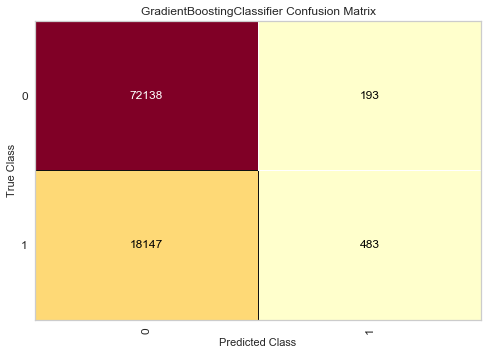

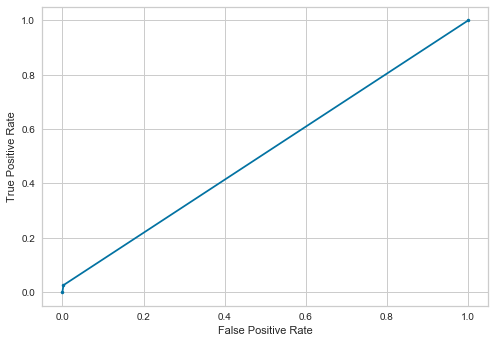

,classifier,Precision,Recall,AUC,Accuracy
0,Logistic Regression,43.548387,0.144928,50.048269,79.509900
1,Nearest Neighbors,49.447377,32.179281,61.852868,79.371379
2,Decision Tree,62.740197,64.669887,77.388932,84.897923
3,Naive Bayes,33.011790,1.653247,50.394582,79.170194
4,Random Forest,82.001092,48.346753,72.806742,87.247282
5,xgboost,76.933674,20.982287,59.680979,82.527677
6,Ada Boost,52.470930,1.937735,50.742823,79.556073
7,SVM,43.636364,0.128824,50.042983,79.510999
8,MLP Classifier,55.555556,0.187869,50.074579,79.526390
9,light Gradient Boosting,76.254980,10.273752,54.724881,80.967667


,classifier,Precision,Recall,AUC,Accuracy
0,Logistic Regression,43.548387,0.144928,50.048269,79.509900
1,Nearest Neighbors,49.447377,32.179281,61.852868,79.371379
2,Decision Tree,62.740197,64.669887,77.388932,84.897923
3,Naive Bayes,33.011790,1.653247,50.394582,79.170194
4,Random Forest,82.001092,48.346753,72.806742,87.247282
5,xgboost,76.933674,20.982287,59.680979,82.527677
6,Ada Boost,52.470930,1.937735,50.742823,79.556073
7,SVM,43.636364,0.128824,50.042983,79.510999
8,MLP Classifier,55.555556,0.187869,50.074579,79.526390
9,light Gradient Boosting,76.254980,10.273752,54.724881,80.967667


In [18]:
t3.fit_model_CV(df2,'return',min_max=True)

delivery_time_hours      28.387035
unit_price               13.989103
lat                      12.890266
lng                      12.802496
total_amount_expected     6.549231
Sub Category              6.205520
r_day                     5.100707
Category                  4.890270
order_day                 4.737453
channel                   2.368600
days_taken                2.079319
dtype: float64
Selected Features =['delivery_time_hours', 'unit_price', 'lat', 'lng', 'total_amount_expected', 'Sub Category', 'r_day']
_____Cross Validation_____
---------Logistic Regression------------
Mean accuracy  (%): 
 79.75755087838486
Mean AUC  (%): 
 55.7576010215308
Mean Precision: 
 0.0
Mean Recall (%): 
 0.0
Mean f1 score (%): 
 0.0
---------Nearest Neighbors------------
Mean accuracy  (%): 
 77.94431768020583
Mean AUC  (%): 
 67.54477518464965
Mean Precision: 
 42.23205395920351
Mean Recall (%): 
 24.37815717578636
Mean f1 score (%): 
 30.910364193618356
---------Decision Tree------------
Mean 

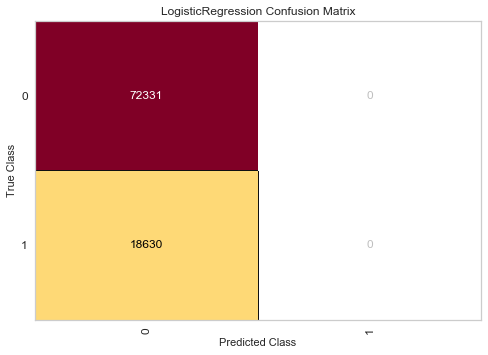

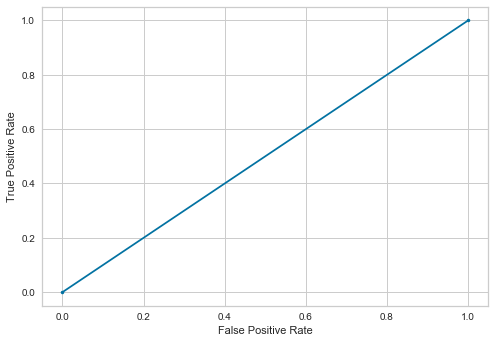

---------Nearest Neighbors------------
Accuracy  (%): 
 79.05475973219292
AUC  (%): 
 61.51629519308982
Precision: 
 48.280919015805765
Recall (%): 
 31.808910359634996
f1 score (%): 
 38.35102252135646
logistic loss :
 7.234285503900851
              precision    recall  f1-score   support

           0       0.84      0.91      0.87     72331
           1       0.48      0.32      0.38     18630

    accuracy                           0.79     90961
   macro avg       0.66      0.62      0.63     90961
weighted avg       0.77      0.79      0.77     90961



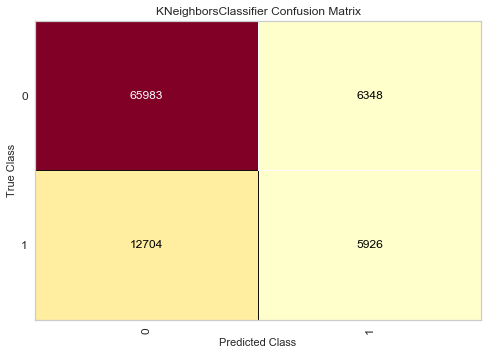

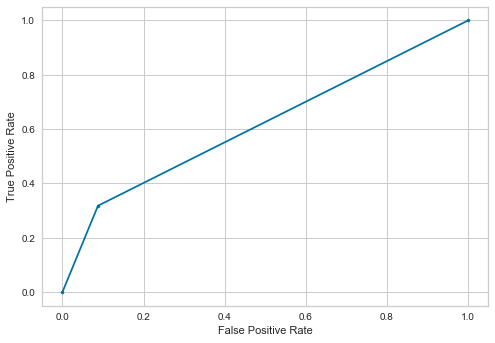

---------Decision Tree------------
Accuracy  (%): 
 83.77876232671144
AUC  (%): 
 75.54148317955564
Precision: 
 60.15833901326483
Recall (%): 
 61.58883521202362
f1 score (%): 
 60.86518314192505
logistic loss :
 5.602683807871277
              precision    recall  f1-score   support

           0       0.90      0.89      0.90     72331
           1       0.60      0.62      0.61     18630

    accuracy                           0.84     90961
   macro avg       0.75      0.76      0.75     90961
weighted avg       0.84      0.84      0.84     90961



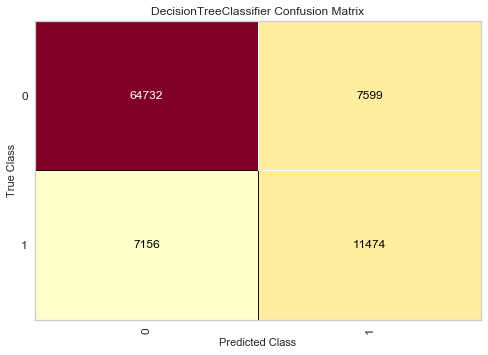

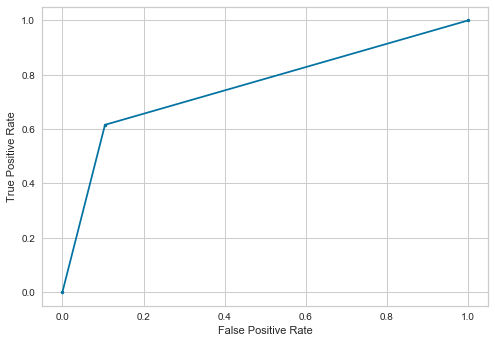

---------Naive Bayes------------
Accuracy  (%): 
 79.1877837754642
AUC  (%): 
 49.993179021121016
Precision: 
 20.07952286282306
Recall (%): 
 0.5421363392377885
f1 score (%): 
 1.0557675220822662
logistic loss :
 7.188288358419773
              precision    recall  f1-score   support

           0       0.80      0.99      0.88     72331
           1       0.20      0.01      0.01     18630

    accuracy                           0.79     90961
   macro avg       0.50      0.50      0.45     90961
weighted avg       0.67      0.79      0.70     90961



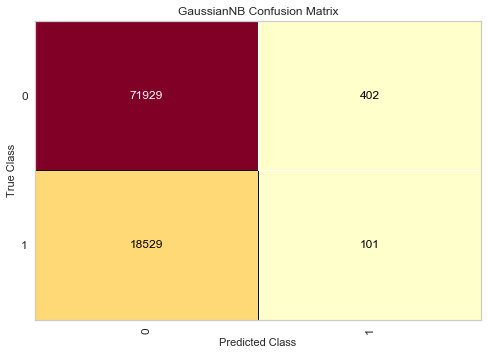

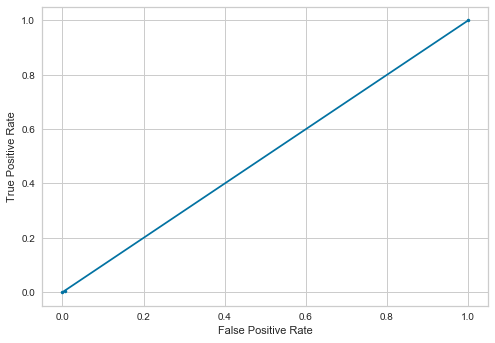

---------Random Forest------------
Accuracy  (%): 
 86.0588603907169
AUC  (%): 
 70.2522161103574
Precision: 
 79.01668129938543
Recall (%): 
 43.47826086956522
f1 score (%): 
 56.09224057338734
logistic loss :
 4.8151179450306705
              precision    recall  f1-score   support

           0       0.87      0.97      0.92     72331
           1       0.79      0.43      0.56     18630

    accuracy                           0.86     90961
   macro avg       0.83      0.70      0.74     90961
weighted avg       0.85      0.86      0.84     90961



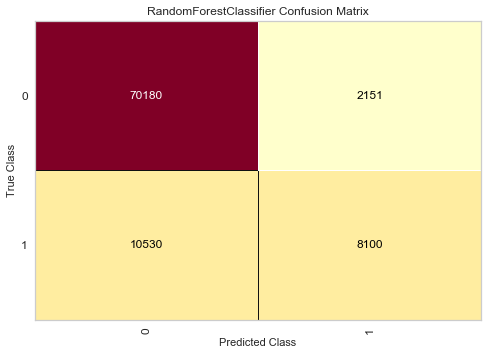

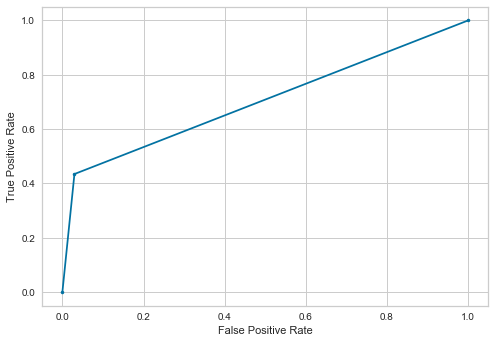

---------xgboost------------
Accuracy  (%): 
 81.95050626092501
AUC  (%): 
 57.58252967383135
Precision: 
 78.62318840579711
Recall (%): 
 16.30703166935051
f1 score (%): 
 27.011647550457894
logistic loss :
 6.2340815439487365
              precision    recall  f1-score   support

           0       0.82      0.99      0.90     72331
           1       0.79      0.16      0.27     18630

    accuracy                           0.82     90961
   macro avg       0.80      0.58      0.58     90961
weighted avg       0.81      0.82      0.77     90961



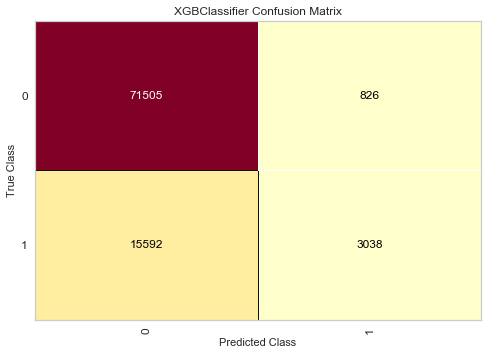

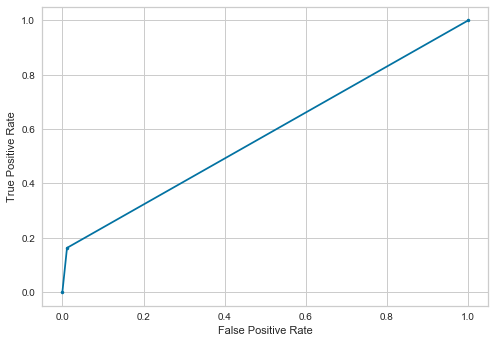

---------Ada Boost------------
Accuracy  (%): 
 79.5219929420301
AUC  (%): 
 50.02000699014067
Precision: 
 60.0
Recall (%): 
 0.04830917874396135
f1 score (%): 
 0.09654062751407884
logistic loss :
 7.072853120629564
              precision    recall  f1-score   support

           0       0.80      1.00      0.89     72331
           1       0.60      0.00      0.00     18630

    accuracy                           0.80     90961
   macro avg       0.70      0.50      0.44     90961
weighted avg       0.76      0.80      0.70     90961



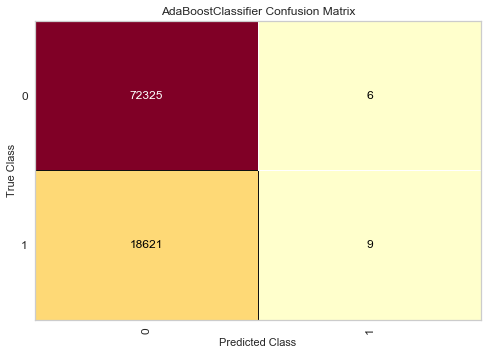

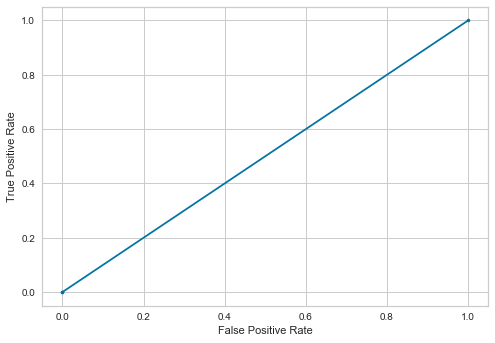

---------SVM------------
Accuracy  (%): 
 79.51869482525478
AUC  (%): 
 50.0
Precision: 
 0.0
Recall (%): 
 0.0
f1 score (%): 
 0.0
logistic loss :
 7.0739921970645225
              precision    recall  f1-score   support

           0       0.80      1.00      0.89     72331
           1       0.00      0.00      0.00     18630

    accuracy                           0.80     90961
   macro avg       0.40      0.50      0.44     90961
weighted avg       0.63      0.80      0.70     90961



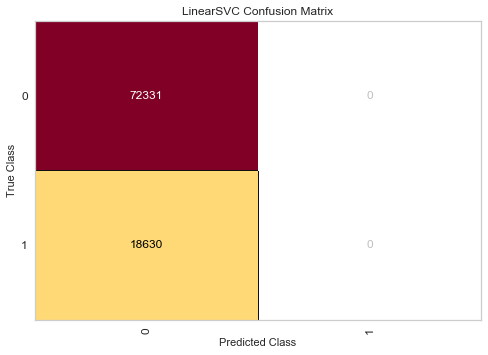

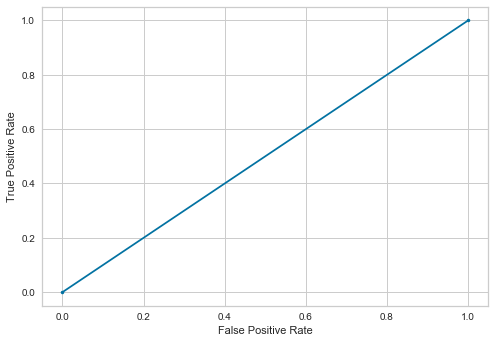

---------MLP Classifier------------
Accuracy  (%): 
 79.51869482525478
AUC  (%): 
 50.0
Precision: 
 0.0
Recall (%): 
 0.0
f1 score (%): 
 0.0
logistic loss :
 7.0739921970645225
              precision    recall  f1-score   support

           0       0.80      1.00      0.89     72331
           1       0.00      0.00      0.00     18630

    accuracy                           0.80     90961
   macro avg       0.40      0.50      0.44     90961
weighted avg       0.63      0.80      0.70     90961



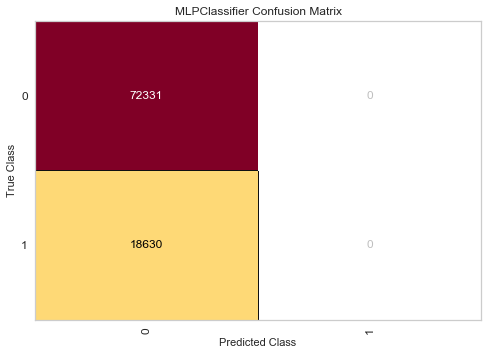

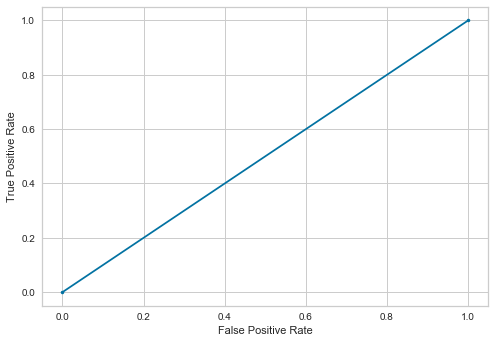

---------light Gradient Boosting------------
Accuracy  (%): 
 80.62026582821208
AUC  (%): 
 53.33480580898099
Precision: 
 80.36363636363636
Recall (%): 
 7.117552334943639
f1 score (%): 
 13.076923076923078
logistic loss :
 6.693525899660877
              precision    recall  f1-score   support

           0       0.81      1.00      0.89     72331
           1       0.80      0.07      0.13     18630

    accuracy                           0.81     90961
   macro avg       0.80      0.53      0.51     90961
weighted avg       0.81      0.81      0.74     90961



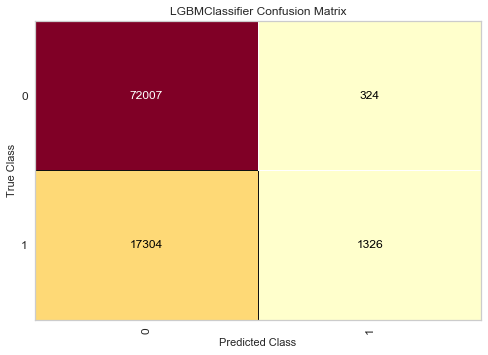

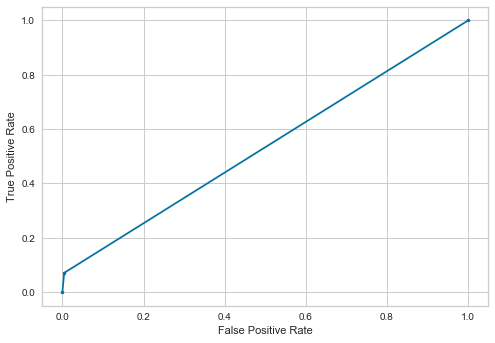

---------Gradient Boosting Classifier------------
Accuracy  (%): 
 79.81662470729214
AUC  (%): 
 50.98237134522316
Precision: 
 75.71157495256166
Recall (%): 
 2.14170692431562
f1 score (%): 
 4.1655791616641435
logistic loss :
 6.9710919864847165
              precision    recall  f1-score   support

           0       0.80      1.00      0.89     72331
           1       0.76      0.02      0.04     18630

    accuracy                           0.80     90961
   macro avg       0.78      0.51      0.46     90961
weighted avg       0.79      0.80      0.71     90961



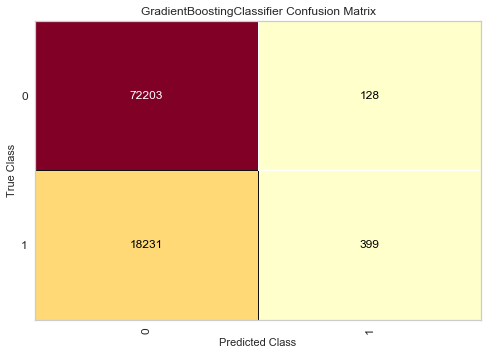

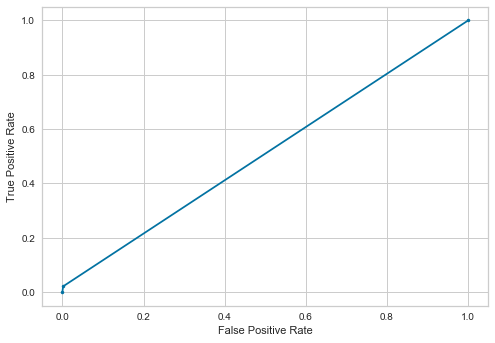

,classifier,Precision,Recall,AUC,Accuracy
0,Logistic Regression,0.000000,0.000000,50.000000,79.518695
1,Nearest Neighbors,48.280919,31.808910,61.516295,79.054760
2,Decision Tree,60.158339,61.588835,75.541483,83.778762
3,Naive Bayes,20.079523,0.542136,49.993179,79.187784
4,Random Forest,79.016681,43.478261,70.252216,86.058860
5,xgboost,78.623188,16.307032,57.582530,81.950506
6,Ada Boost,60.000000,0.048309,50.020007,79.521993
7,SVM,0.000000,0.000000,50.000000,79.518695
8,MLP Classifier,0.000000,0.000000,50.000000,79.518695
9,light Gradient Boosting,80.363636,7.117552,53.334806,80.620266


,classifier,Precision,Recall,AUC,Accuracy
0,Logistic Regression,0.000000,0.000000,50.000000,79.518695
1,Nearest Neighbors,48.280919,31.808910,61.516295,79.054760
2,Decision Tree,60.158339,61.588835,75.541483,83.778762
3,Naive Bayes,20.079523,0.542136,49.993179,79.187784
4,Random Forest,79.016681,43.478261,70.252216,86.058860
5,xgboost,78.623188,16.307032,57.582530,81.950506
6,Ada Boost,60.000000,0.048309,50.020007,79.521993
7,SVM,0.000000,0.000000,50.000000,79.518695
8,MLP Classifier,0.000000,0.000000,50.000000,79.518695
9,light Gradient Boosting,80.363636,7.117552,53.334806,80.620266


In [18]:
t3.fit_model_CV_FS(df2,'return',min_max=True)

_____Cross Validation_____
---------Logistic Regression------------
Mean accuracy  (%): 
 66.6446711407681
Mean AUC  (%): 
 56.67891371714242
Mean Precision: 
 57.50805823003965
Mean Recall (%): 
 0.5118994162550516
Mean f1 score (%): 
 1.014502505619795
---------Nearest Neighbors------------
Mean accuracy  (%): 
 67.43801292238928
Mean AUC  (%): 
 67.28309530641293
Mean Precision: 
 51.54930140096463
Mean Recall (%): 
 41.6030534351145
Mean f1 score (%): 
 46.039255095845135
---------Decision Tree------------
Mean accuracy  (%): 
 71.95369010793613
Mean AUC  (%): 
 68.97552275249936
Mean Precision: 
 57.657950921740095
Mean Recall (%): 
 60.11225864391558
Mean f1 score (%): 
 58.75820668953524
---------Naive Bayes------------
Mean accuracy  (%): 
 66.58468313836859
Mean AUC  (%): 
 63.16785762382151
Mean Precision: 
 49.47910558278046
Mean Recall (%): 
 2.810956443646161
Mean f1 score (%): 
 5.3115679198849035
---------Random Forest------------
Mean accuracy  (%): 
 77.06773771989265


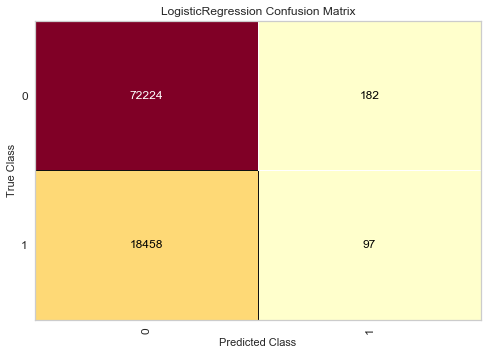

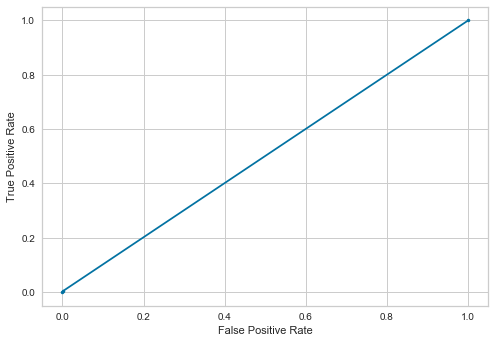

---------Nearest Neighbors------------
Accuracy  (%): 
 73.6348544980816
AUC  (%): 
 63.31163017385432
Precision: 
 37.91367867800989
Recall (%): 
 45.874427378065214
f1 score (%): 
 41.515875725503584
logistic loss :
 9.106321182609332
              precision    recall  f1-score   support

           0       0.85      0.81      0.83     72406
           1       0.38      0.46      0.42     18555

    accuracy                           0.74     90961
   macro avg       0.62      0.63      0.62     90961
weighted avg       0.76      0.74      0.75     90961



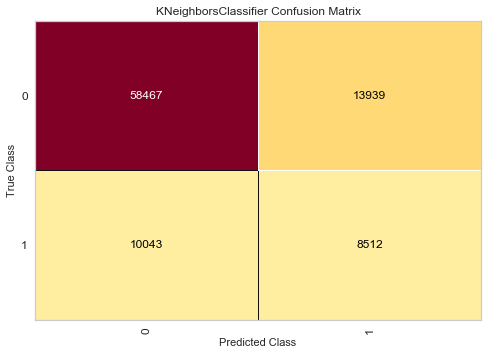

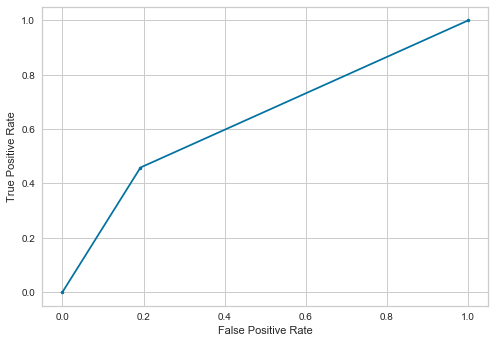

---------Decision Tree------------
Accuracy  (%): 
 78.11809456800167
AUC  (%): 
 73.54301665941281
Precision: 
 47.38292011019284
Recall (%): 
 65.81514416599299
f1 score (%): 
 55.09835769716657
logistic loss :
 7.557861596783821
              precision    recall  f1-score   support

           0       0.90      0.81      0.86     72406
           1       0.47      0.66      0.55     18555

    accuracy                           0.78     90961
   macro avg       0.69      0.74      0.70     90961
weighted avg       0.82      0.78      0.79     90961



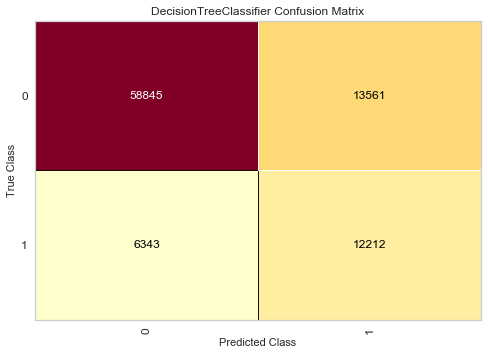

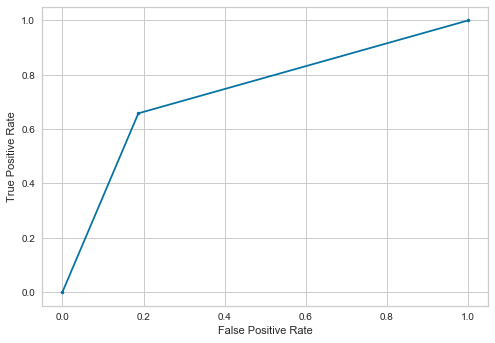

---------Naive Bayes------------
Accuracy  (%): 
 79.49670738008598
AUC  (%): 
 50.5757228061564
Precision: 
 43.53741496598639
Recall (%): 
 1.7246025330099704
f1 score (%): 
 3.3177812337998955
logistic loss :
 7.081590039665545
              precision    recall  f1-score   support

           0       0.80      0.99      0.89     72406
           1       0.44      0.02      0.03     18555

    accuracy                           0.79     90961
   macro avg       0.62      0.51      0.46     90961
weighted avg       0.72      0.79      0.71     90961



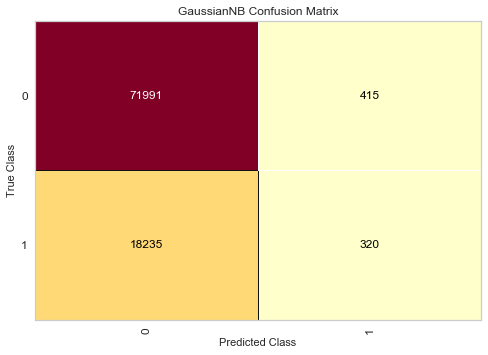

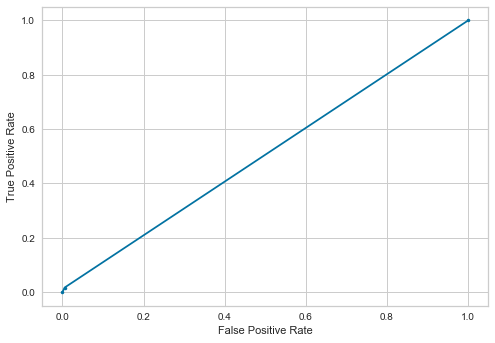

---------Random Forest------------
Accuracy  (%): 
 84.37462209078616
AUC  (%): 
 74.96776340527124
Precision: 
 62.34785576157434
Recall (%): 
 59.0784155214228
f1 score (%): 
 60.66912029222128
logistic loss :
 5.396872530379541
              precision    recall  f1-score   support

           0       0.90      0.91      0.90     72406
           1       0.62      0.59      0.61     18555

    accuracy                           0.84     90961
   macro avg       0.76      0.75      0.75     90961
weighted avg       0.84      0.84      0.84     90961



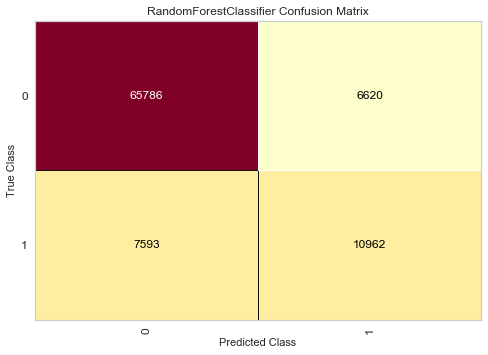

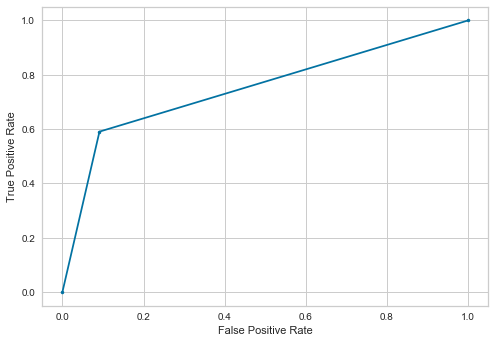

---------xgboost------------
Accuracy  (%): 
 80.55650223722255
AUC  (%): 
 67.81565915924568
Precision: 
 52.66384648396788
Recall (%): 
 46.29479924548639
f1 score (%): 
 49.274364710606314
logistic loss :
 6.715614087489681
              precision    recall  f1-score   support

           0       0.87      0.89      0.88     72406
           1       0.53      0.46      0.49     18555

    accuracy                           0.81     90961
   macro avg       0.70      0.68      0.69     90961
weighted avg       0.80      0.81      0.80     90961



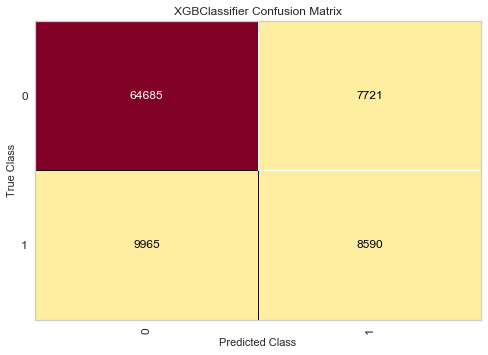

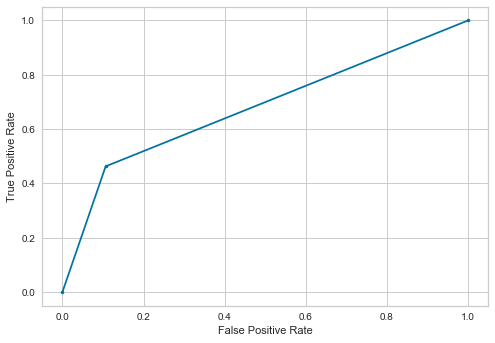

---------Ada Boost------------
Accuracy  (%): 
 76.55918470553314
AUC  (%): 
 59.50884188610003
Precision: 
 40.23158935253831
Recall (%): 
 30.708703853408785
f1 score (%): 
 34.830979888746256
logistic loss :
 8.096245191725378
              precision    recall  f1-score   support

           0       0.83      0.88      0.86     72406
           1       0.40      0.31      0.35     18555

    accuracy                           0.77     90961
   macro avg       0.62      0.60      0.60     90961
weighted avg       0.74      0.77      0.75     90961



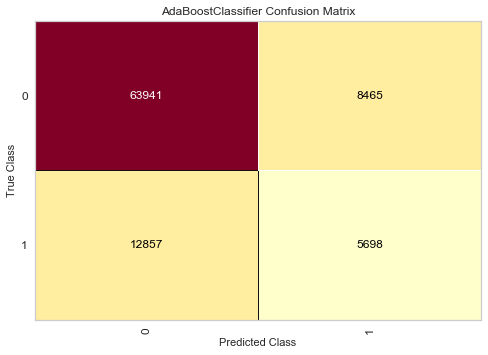

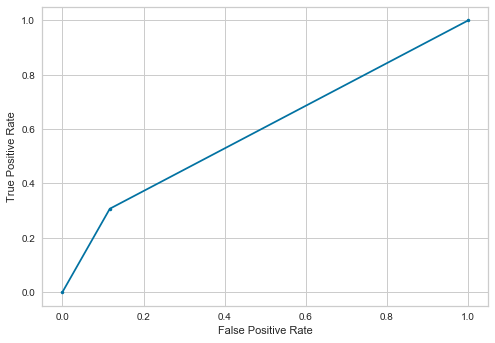

---------SVM------------
Accuracy  (%): 
 79.53518540913139
AUC  (%): 
 50.14094379612588
Precision: 
 37.60330578512397
Recall (%): 
 0.49043384532471035
f1 score (%): 
 0.9682396127041548
logistic loss :
 7.068297878546567
              precision    recall  f1-score   support

           0       0.80      1.00      0.89     72406
           1       0.38      0.00      0.01     18555

    accuracy                           0.80     90961
   macro avg       0.59      0.50      0.45     90961
weighted avg       0.71      0.80      0.71     90961



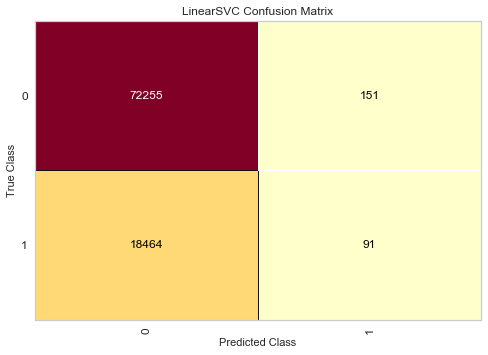

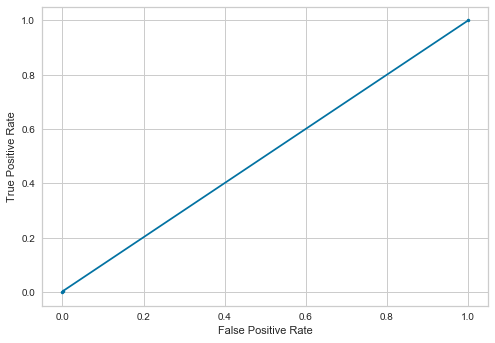

---------MLP Classifier------------
Accuracy  (%): 
 76.44594936291378
AUC  (%): 
 56.73813732294452
Precision: 
 37.599377808503284
Recall (%): 
 23.44920506601994
f1 score (%): 
 28.88438941812992
logistic loss :
 8.135344358065598
              precision    recall  f1-score   support

           0       0.82      0.90      0.86     72406
           1       0.38      0.23      0.29     18555

    accuracy                           0.76     90961
   macro avg       0.60      0.57      0.57     90961
weighted avg       0.73      0.76      0.74     90961



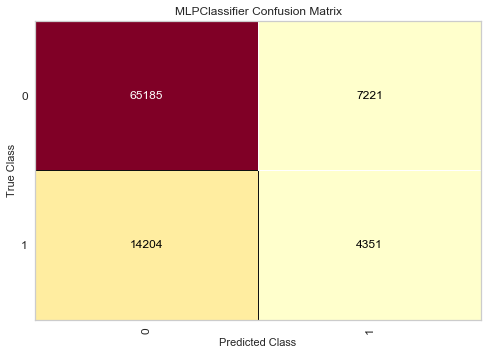

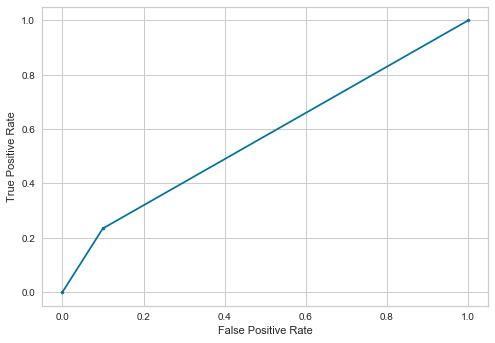

---------light Gradient Boosting------------
Accuracy  (%): 
 79.3614845922978
AUC  (%): 
 64.12295184226929
Precision: 
 49.24630064997926
Recall (%): 
 38.38318512530316
f1 score (%): 
 43.141411999878855
logistic loss :
 7.128355210549532
              precision    recall  f1-score   support

           0       0.85      0.90      0.87     72406
           1       0.49      0.38      0.43     18555

    accuracy                           0.79     90961
   macro avg       0.67      0.64      0.65     90961
weighted avg       0.78      0.79      0.78     90961



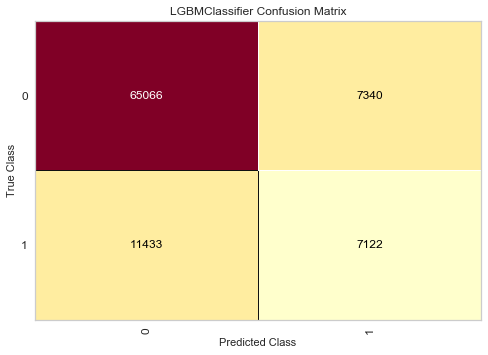

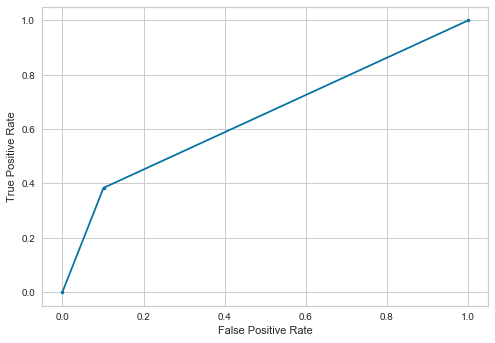

---------Gradient Boosting Classifier------------
Accuracy  (%): 
 77.81796594144743
AUC  (%): 
 60.12516195372552
Precision: 
 43.685767673621925
Recall (%): 
 30.2398275397467
f1 score (%): 
 35.73999171948151
logistic loss :
 7.661466725391384
              precision    recall  f1-score   support

           0       0.83      0.90      0.87     72406
           1       0.44      0.30      0.36     18555

    accuracy                           0.78     90961
   macro avg       0.64      0.60      0.61     90961
weighted avg       0.75      0.78      0.76     90961



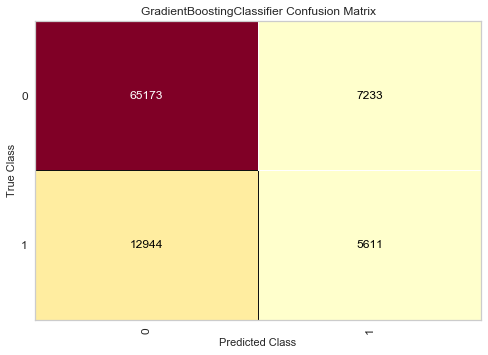

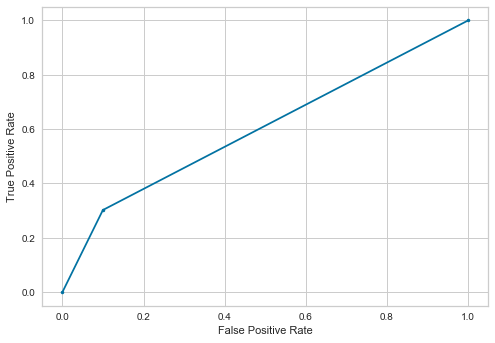

,classifier,Precision,Recall,AUC,Accuracy
0,Logistic Regression,34.767025,0.522770,50.135705,79.507701
1,Nearest Neighbors,37.913679,45.874427,63.311630,73.634854
2,Decision Tree,47.382920,65.815144,73.543017,78.118095
3,Naive Bayes,43.537415,1.724603,50.575723,79.496707
4,Random Forest,62.347856,59.078416,74.967763,84.374622
5,xgboost,52.663846,46.294799,67.815659,80.556502
6,Ada Boost,40.231589,30.708704,59.508842,76.559185
7,SVM,37.603306,0.490434,50.140944,79.535185
8,MLP Classifier,37.599378,23.449205,56.738137,76.445949
9,light Gradient Boosting,49.246301,38.383185,64.122952,79.361485


,classifier,Precision,Recall,AUC,Accuracy
0,Logistic Regression,34.767025,0.522770,50.135705,79.507701
1,Nearest Neighbors,37.913679,45.874427,63.311630,73.634854
2,Decision Tree,47.382920,65.815144,73.543017,78.118095
3,Naive Bayes,43.537415,1.724603,50.575723,79.496707
4,Random Forest,62.347856,59.078416,74.967763,84.374622
5,xgboost,52.663846,46.294799,67.815659,80.556502
6,Ada Boost,40.231589,30.708704,59.508842,76.559185
7,SVM,37.603306,0.490434,50.140944,79.535185
8,MLP Classifier,37.599378,23.449205,56.738137,76.445949
9,light Gradient Boosting,49.246301,38.383185,64.122952,79.361485


In [14]:
t3.fit_model_CV_US(df2,'return',min_max=True)

_____Cross Validation_____
---------Logistic Regression------------
Mean accuracy  (%): 
 66.79014315802753
Mean AUC  (%): 
 56.59019104313489
Mean Precision: 
 55.29749765972114
Mean Recall (%): 
 0.5605658751461713
Mean f1 score (%): 
 1.1097324809146287
---------Nearest Neighbors------------
Mean accuracy  (%): 
 70.84800356032449
Mean AUC  (%): 
 73.48274133360471
Mean Precision: 
 56.8059369814207
Mean Recall (%): 
 51.38757092999799
Mean f1 score (%): 
 53.958143457692806
---------Decision Tree------------
Mean accuracy  (%): 
 80.565079867481
Mean AUC  (%): 
 79.40240635608366
Mean Precision: 
 68.9785202396815
Mean Recall (%): 
 75.28663782894193
Mean f1 score (%): 
 72.1184436359071
---------Naive Bayes------------
Mean accuracy  (%): 
 66.77250347439045
Mean AUC  (%): 
 63.48487838997991
Mean Precision: 
 50.63935350937585
Mean Recall (%): 
 1.7808971630129833
Mean f1 score (%): 
 3.440181482680211
---------Random Forest------------
Mean accuracy  (%): 
 84.86835533377682
Mea

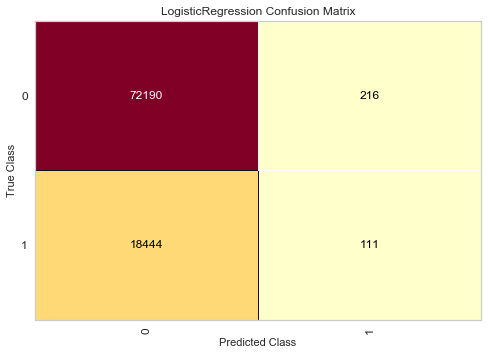

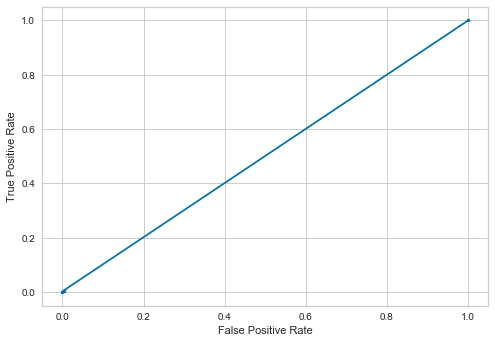

---------Nearest Neighbors------------
Accuracy  (%): 
 74.94860434691792
AUC  (%): 
 65.98866426824762
Precision: 
 40.841412742382275
Recall (%): 
 50.8542171921315
f1 score (%): 
 45.30113540891524
logistic loss :
 8.6525656776916
              precision    recall  f1-score   support

           0       0.87      0.81      0.84     72406
           1       0.41      0.51      0.45     18555

    accuracy                           0.75     90961
   macro avg       0.64      0.66      0.65     90961
weighted avg       0.77      0.75      0.76     90961



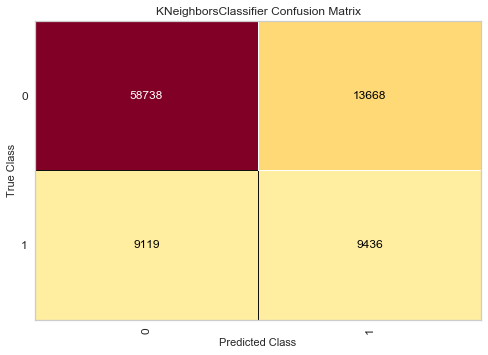

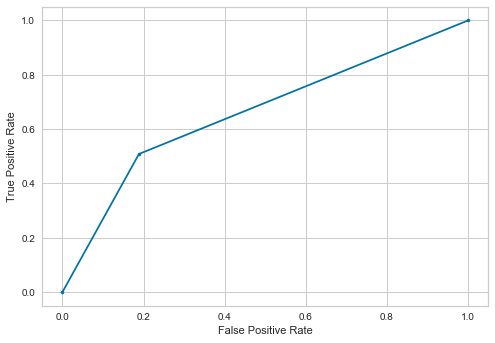

---------Decision Tree------------
Accuracy  (%): 
 83.40057826980794
AUC  (%): 
 77.50243694920314
Precision: 
 57.997038134024436
Recall (%): 
 67.53974669900296
f1 score (%): 
 62.405696785598685
logistic loss :
 5.733316937292168
              precision    recall  f1-score   support

           0       0.91      0.87      0.89     72406
           1       0.58      0.68      0.62     18555

    accuracy                           0.83     90961
   macro avg       0.75      0.78      0.76     90961
weighted avg       0.85      0.83      0.84     90961



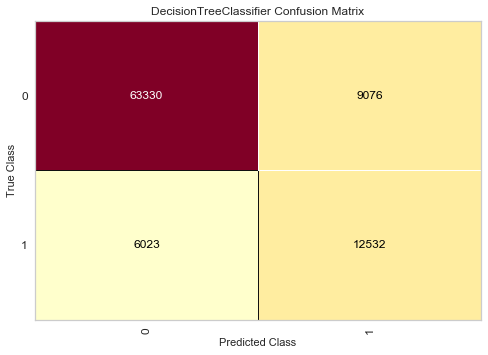

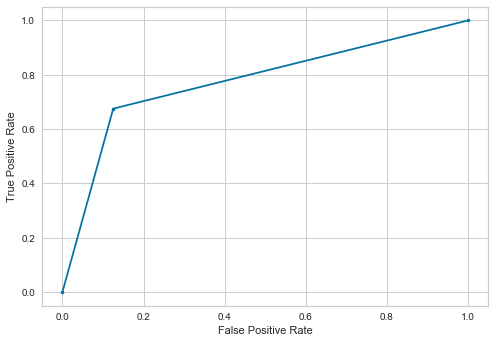

---------Naive Bayes------------
Accuracy  (%): 
 79.12292081221622
AUC  (%): 
 50.625523648859506
Precision: 
 33.99558498896248
Recall (%): 
 2.4898949070331446
f1 score (%): 
 4.639951792708646
logistic loss :
 7.210695583582511
              precision    recall  f1-score   support

           0       0.80      0.99      0.88     72406
           1       0.34      0.02      0.05     18555

    accuracy                           0.79     90961
   macro avg       0.57      0.51      0.46     90961
weighted avg       0.70      0.79      0.71     90961



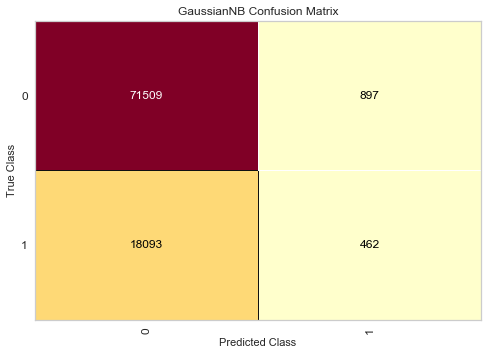

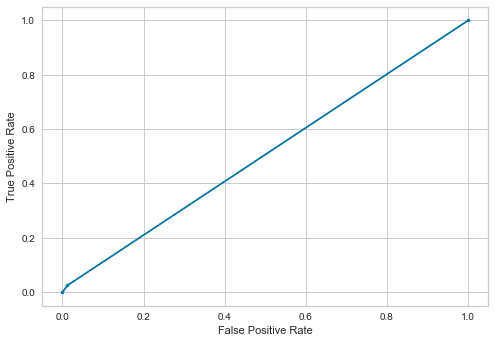

---------Random Forest------------
Accuracy  (%): 
 87.24288431305725
AUC  (%): 
 76.86160016142395
Precision: 
 73.0700298705609
Recall (%): 
 59.326327135542975
f1 score (%): 
 65.48483045806067
logistic loss :
 4.406187324824022
              precision    recall  f1-score   support

           0       0.90      0.94      0.92     72406
           1       0.73      0.59      0.65     18555

    accuracy                           0.87     90961
   macro avg       0.82      0.77      0.79     90961
weighted avg       0.87      0.87      0.87     90961



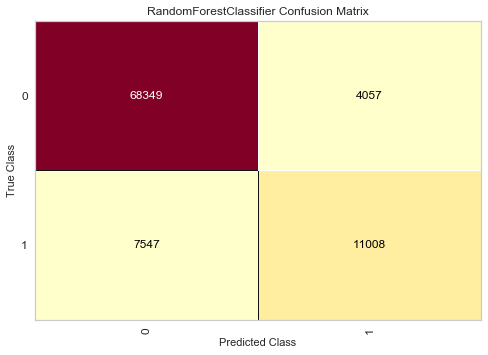

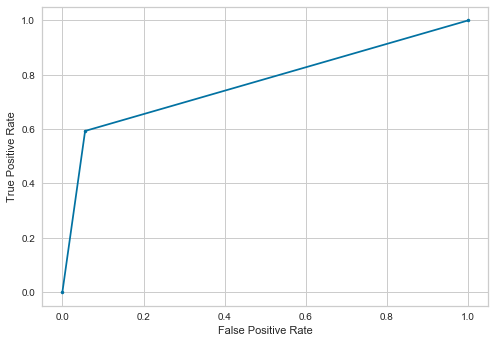

---------xgboost------------
Accuracy  (%): 
 81.14466639548817
AUC  (%): 
 68.51578693732702
Precision: 
 54.35862411523655
Recall (%): 
 47.184047426569656
f1 score (%): 
 50.51787311387439
logistic loss :
 6.512466131526946
              precision    recall  f1-score   support

           0       0.87      0.90      0.88     72406
           1       0.54      0.47      0.51     18555

    accuracy                           0.81     90961
   macro avg       0.71      0.69      0.69     90961
weighted avg       0.80      0.81      0.81     90961



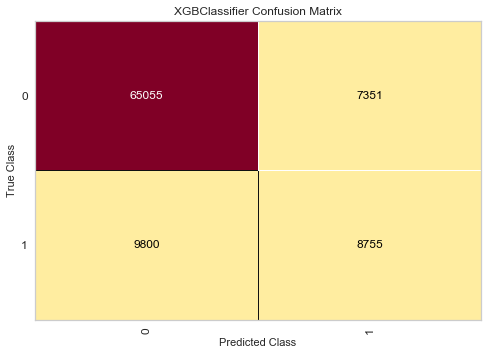

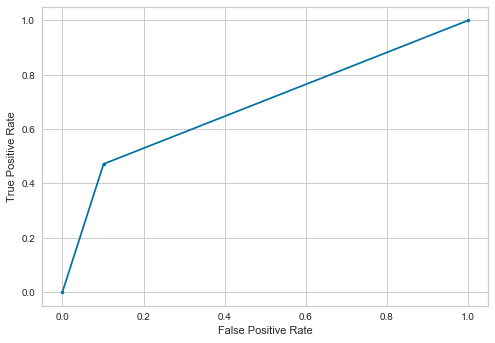

---------Ada Boost------------
Accuracy  (%): 
 76.33271402029442
AUC  (%): 
 59.64315993291906
Precision: 
 39.8497780812564
Recall (%): 
 31.452438695769334
f1 score (%): 
 35.1566265060241
logistic loss :
 8.174468419250005
              precision    recall  f1-score   support

           0       0.83      0.88      0.86     72406
           1       0.40      0.31      0.35     18555

    accuracy                           0.76     90961
   macro avg       0.62      0.60      0.60     90961
weighted avg       0.74      0.76      0.75     90961



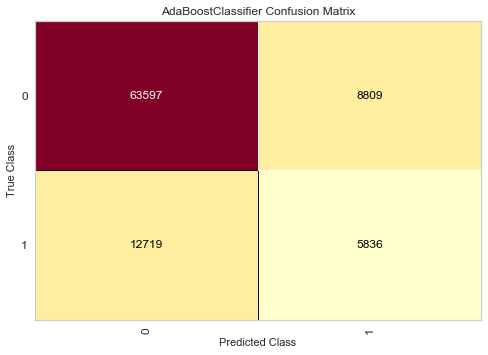

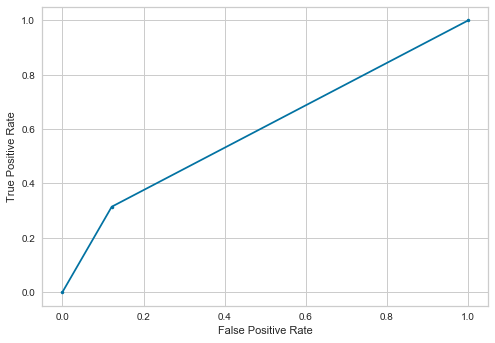

---------SVM------------
Accuracy  (%): 
 79.51209859170415
AUC  (%): 
 50.13846708118752
Precision: 
 35.27272727272727
Recall (%): 
 0.5227701428186473
f1 score (%): 
 1.0302708443972386
logistic loss :
 7.076272020139379
              precision    recall  f1-score   support

           0       0.80      1.00      0.89     72406
           1       0.35      0.01      0.01     18555

    accuracy                           0.80     90961
   macro avg       0.57      0.50      0.45     90961
weighted avg       0.71      0.80      0.71     90961



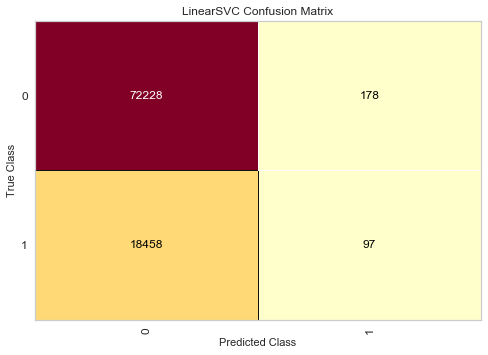

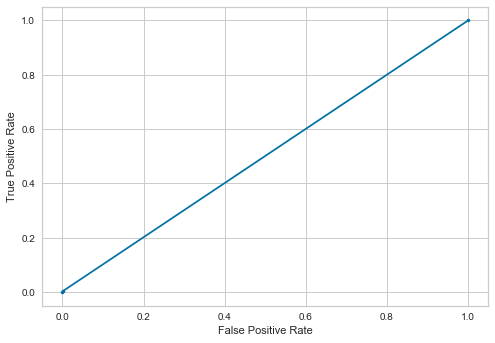

---------MLP Classifier------------
Accuracy  (%): 
 79.60114774463781
AUC  (%): 
 50.0
Precision: 
 0.0
Recall (%): 
 0.0
f1 score (%): 
 0.0
logistic loss :
 7.045513967607741
              precision    recall  f1-score   support

           0       0.80      1.00      0.89     72406
           1       0.00      0.00      0.00     18555

    accuracy                           0.80     90961
   macro avg       0.40      0.50      0.44     90961
weighted avg       0.63      0.80      0.71     90961



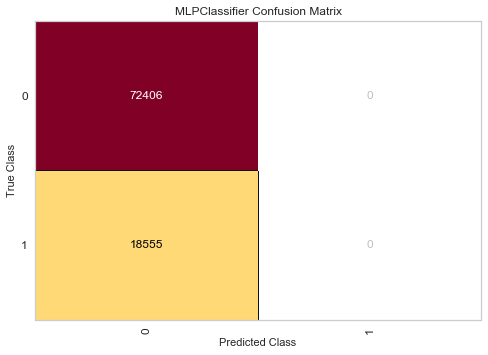

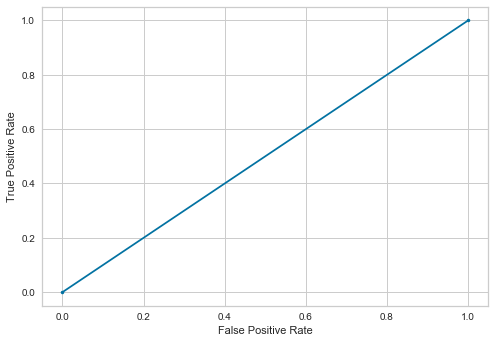

---------light Gradient Boosting------------
Accuracy  (%): 
 79.52968854783919
AUC  (%): 
 64.06025822993851
Precision: 
 49.77017184074676
Recall (%): 
 37.930476960388035
f1 score (%): 
 43.05113775385369
logistic loss :
 7.070257539096795
              precision    recall  f1-score   support

           0       0.85      0.90      0.88     72406
           1       0.50      0.38      0.43     18555

    accuracy                           0.80     90961
   macro avg       0.67      0.64      0.65     90961
weighted avg       0.78      0.80      0.78     90961



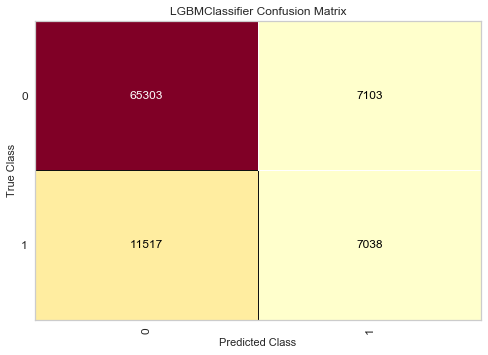

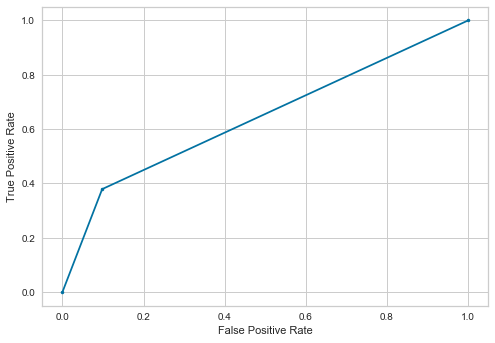

---------Gradient Boosting Classifier------------
Accuracy  (%): 
 77.64536449687228
AUC  (%): 
 60.261250720165464
Precision: 
 43.284258210645525
Recall (%): 
 30.89733225545675
f1 score (%): 
 36.05660377358491
logistic loss :
 7.721083604951677
              precision    recall  f1-score   support

           0       0.84      0.90      0.86     72406
           1       0.43      0.31      0.36     18555

    accuracy                           0.78     90961
   macro avg       0.63      0.60      0.61     90961
weighted avg       0.75      0.78      0.76     90961



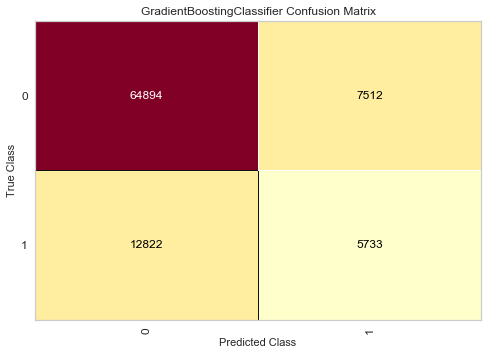

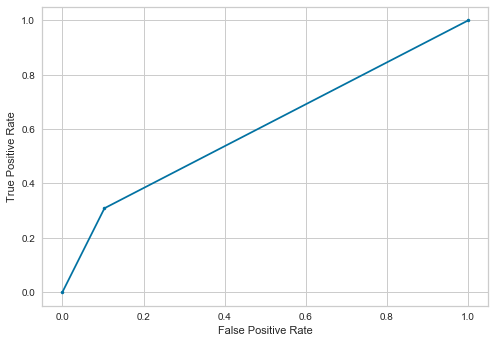

,classifier,Precision,Recall,AUC,Accuracy
0,Logistic Regression,33.944954,0.598222,50.149952,79.485714
1,Nearest Neighbors,40.841413,50.854217,65.988664,74.948604
2,Decision Tree,57.997038,67.539747,77.502437,83.400578
3,Naive Bayes,33.995585,2.489895,50.625524,79.122921
4,Random Forest,73.070030,59.326327,76.861600,87.242884
5,xgboost,54.358624,47.184047,68.515787,81.144666
6,Ada Boost,39.849778,31.452439,59.643160,76.332714
7,SVM,35.272727,0.522770,50.138467,79.512099
8,MLP Classifier,0.000000,0.000000,50.000000,79.601148
9,light Gradient Boosting,49.770172,37.930477,64.060258,79.529689


,classifier,Precision,Recall,AUC,Accuracy
0,Logistic Regression,33.944954,0.598222,50.149952,79.485714
1,Nearest Neighbors,40.841413,50.854217,65.988664,74.948604
2,Decision Tree,57.997038,67.539747,77.502437,83.400578
3,Naive Bayes,33.995585,2.489895,50.625524,79.122921
4,Random Forest,73.070030,59.326327,76.861600,87.242884
5,xgboost,54.358624,47.184047,68.515787,81.144666
6,Ada Boost,39.849778,31.452439,59.643160,76.332714
7,SVM,35.272727,0.522770,50.138467,79.512099
8,MLP Classifier,0.000000,0.000000,50.000000,79.601148
9,light Gradient Boosting,49.770172,37.930477,64.060258,79.529689


In [15]:
t3.fit_model_CV_OS(df2,'return',min_max=True)

delivery_time_hours      28.284338
unit_price               14.121773
lng                      12.915518
lat                      12.907031
total_amount_expected     6.646638
Sub Category              6.176654
r_day                     5.000279
Category                  4.937464
order_day                 4.676523
channel                   2.350246
days_taken                1.983537
dtype: float64
Selected Features =['delivery_time_hours', 'unit_price', 'lng', 'lat', 'total_amount_expected', 'Sub Category', 'r_day']
_____Cross Validation_____
---------Logistic Regression------------
Mean accuracy  (%): 
 66.75486432015741
Mean AUC  (%): 
 55.446070437355274
Mean Precision: 
 10.0
Mean Recall (%): 
 0.002306805074971165
Mean f1 score (%): 
 0.004612546125461255
---------Nearest Neighbors------------
Mean accuracy  (%): 
 70.35179551084437
Mean AUC  (%): 
 72.96265482069226
Mean Precision: 
 55.88488108891201
Mean Recall (%): 
 51.40836091759107
Mean f1 score (%): 
 53.55164226244858
----

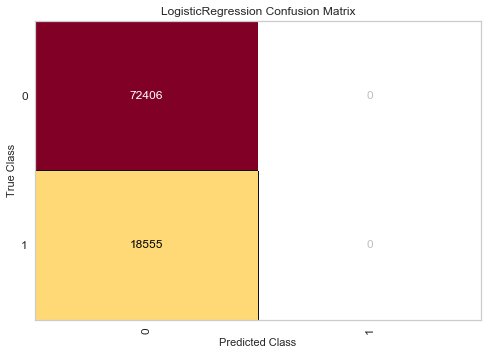

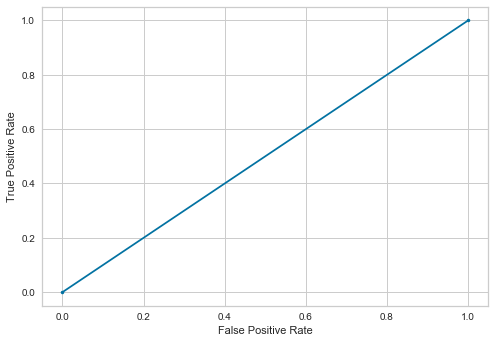

---------Nearest Neighbors------------
Accuracy  (%): 
 74.52864414419366
AUC  (%): 
 65.63669177278312
Precision: 
 40.14018292161723
Recall (%): 
 50.617084343842635
f1 score (%): 
 44.77391366529211
logistic loss :
 8.797617764264826
              precision    recall  f1-score   support

           0       0.86      0.81      0.83     72406
           1       0.40      0.51      0.45     18555

    accuracy                           0.75     90961
   macro avg       0.63      0.66      0.64     90961
weighted avg       0.77      0.75      0.76     90961



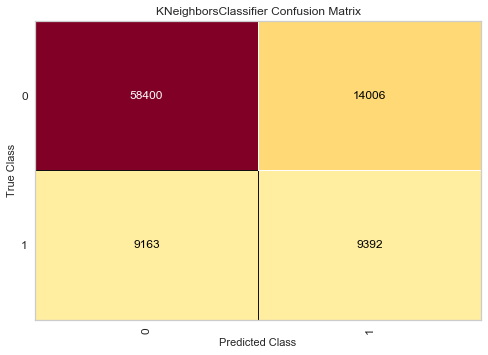

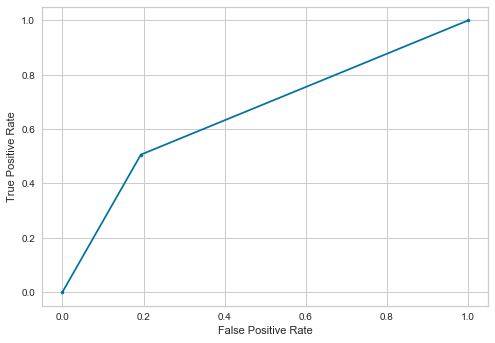

---------Decision Tree------------
Accuracy  (%): 
 82.3143984784688
AUC  (%): 
 75.99847525852623
Precision: 
 55.666789125642914
Recall (%): 
 65.33009970358394
f1 score (%): 
 60.112568495698106
logistic loss :
 6.108475227608747
              precision    recall  f1-score   support

           0       0.91      0.87      0.89     72406
           1       0.56      0.65      0.60     18555

    accuracy                           0.82     90961
   macro avg       0.73      0.76      0.74     90961
weighted avg       0.84      0.82      0.83     90961



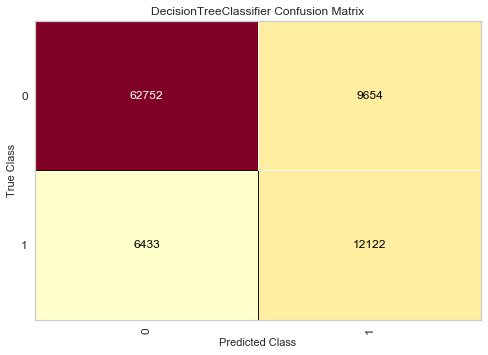

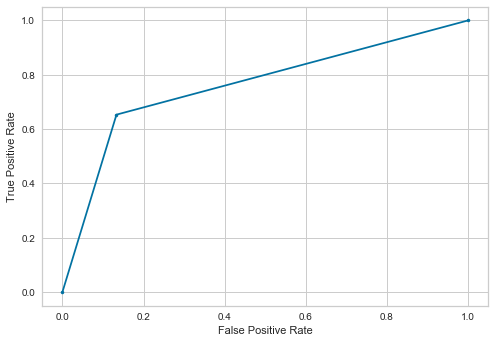

---------Naive Bayes------------
Accuracy  (%): 
 78.97890304636053
AUC  (%): 
 49.995947616650994
Precision: 
 20.27310924369748
Recall (%): 
 1.0401509027216382
f1 score (%): 
 1.978776849336136
logistic loss :
 7.260436344604136
              precision    recall  f1-score   support

           0       0.80      0.99      0.88     72406
           1       0.20      0.01      0.02     18555

    accuracy                           0.79     90961
   macro avg       0.50      0.50      0.45     90961
weighted avg       0.67      0.79      0.71     90961



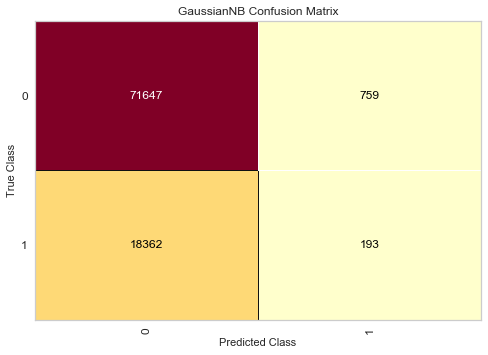

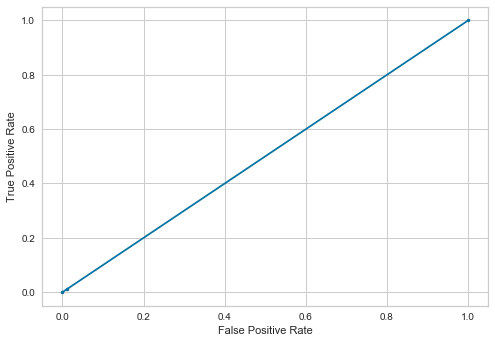

---------Random Forest------------
Accuracy  (%): 
 85.56963973571091
AUC  (%): 
 74.5660107594282
Precision: 
 67.68980123818832
Recall (%): 
 55.97952034492051
f1 score (%): 
 61.280235988200594
logistic loss :
 4.984113448221287
              precision    recall  f1-score   support

           0       0.89      0.93      0.91     72406
           1       0.68      0.56      0.61     18555

    accuracy                           0.86     90961
   macro avg       0.78      0.75      0.76     90961
weighted avg       0.85      0.86      0.85     90961



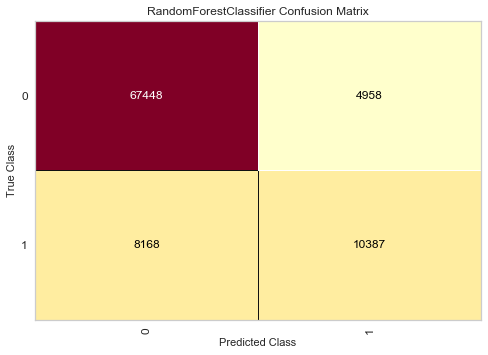

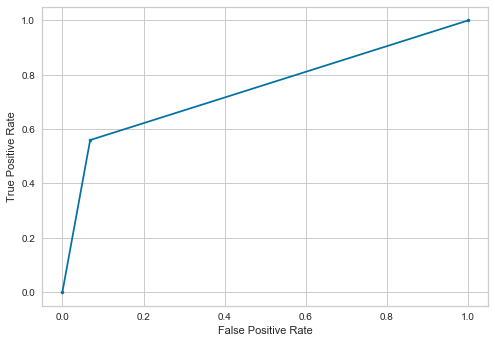

---------xgboost------------
Accuracy  (%): 
 80.49933487978365
AUC  (%): 
 67.52923291401827
Precision: 
 52.53522000868863
Recall (%): 
 45.62112638102937
f1 score (%): 
 48.834660205376714
logistic loss :
 6.735358351536064
              precision    recall  f1-score   support

           0       0.87      0.89      0.88     72406
           1       0.53      0.46      0.49     18555

    accuracy                           0.80     90961
   macro avg       0.70      0.68      0.68     90961
weighted avg       0.80      0.80      0.80     90961



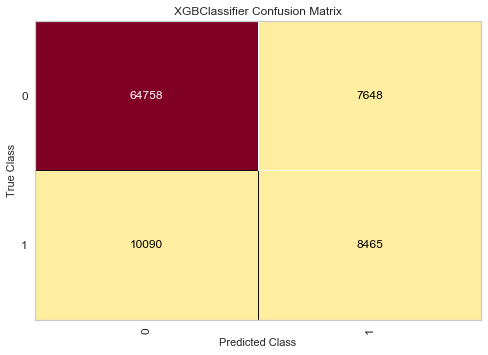

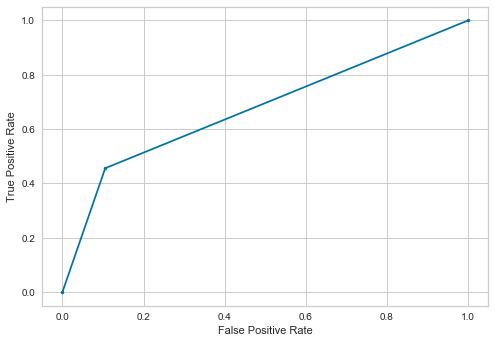

---------Ada Boost------------
Accuracy  (%): 
 75.3179934257539
AUC  (%): 
 60.180208412348414
Precision: 
 38.36320191158901
Recall (%): 
 34.61061708434384
f1 score (%): 
 36.39042357274402
logistic loss :
 8.524953761374926
              precision    recall  f1-score   support

           0       0.84      0.86      0.85     72406
           1       0.38      0.35      0.36     18555

    accuracy                           0.75     90961
   macro avg       0.61      0.60      0.61     90961
weighted avg       0.74      0.75      0.75     90961



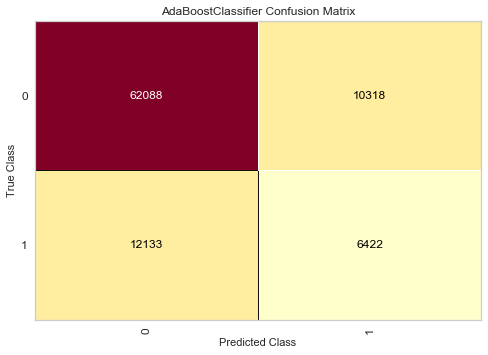

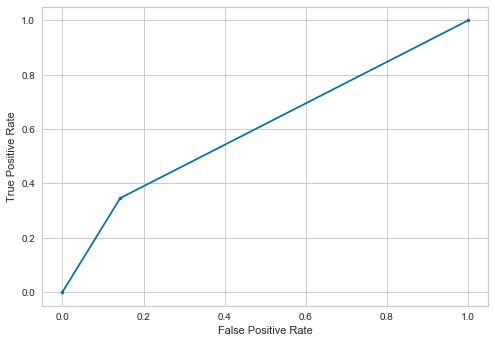

---------SVM------------
Accuracy  (%): 
 79.60114774463781
AUC  (%): 
 50.00200414095096
Precision: 
 50.0
Recall (%): 
 0.0053893829156561575
f1 score (%): 
 0.01077760413859999
logistic loss :
 7.045513976398293
              precision    recall  f1-score   support

           0       0.80      1.00      0.89     72406
           1       0.50      0.00      0.00     18555

    accuracy                           0.80     90961
   macro avg       0.65      0.50      0.44     90961
weighted avg       0.74      0.80      0.71     90961



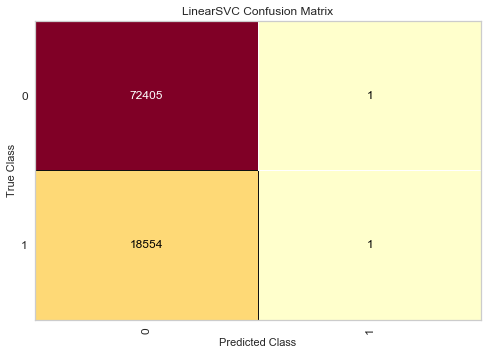

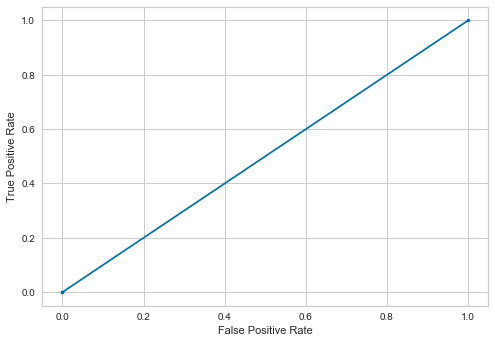

---------MLP Classifier------------
Accuracy  (%): 
 75.2091555721683
AUC  (%): 
 56.76092024215706
Precision: 
 35.198221563542056
Recall (%): 
 25.59956884936675
f1 score (%): 
 29.6411856474259
logistic loss :
 8.562531196719066
              precision    recall  f1-score   support

           0       0.82      0.88      0.85     72406
           1       0.35      0.26      0.30     18555

    accuracy                           0.75     90961
   macro avg       0.59      0.57      0.57     90961
weighted avg       0.73      0.75      0.74     90961



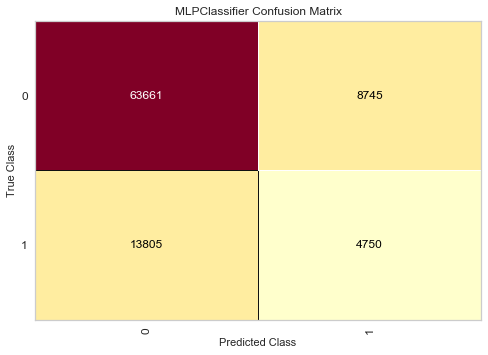

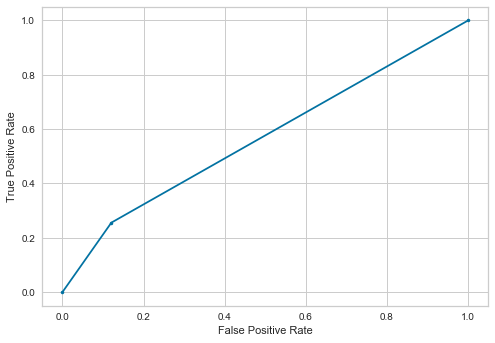

---------light Gradient Boosting------------
Accuracy  (%): 
 78.88105891535932
AUC  (%): 
 63.56865951094822
Precision: 
 47.764047245169664
Recall (%): 
 37.70412287793048
f1 score (%): 
 42.142039636166494
logistic loss :
 7.294291094712818
              precision    recall  f1-score   support

           0       0.85      0.89      0.87     72406
           1       0.48      0.38      0.42     18555

    accuracy                           0.79     90961
   macro avg       0.66      0.64      0.65     90961
weighted avg       0.77      0.79      0.78     90961



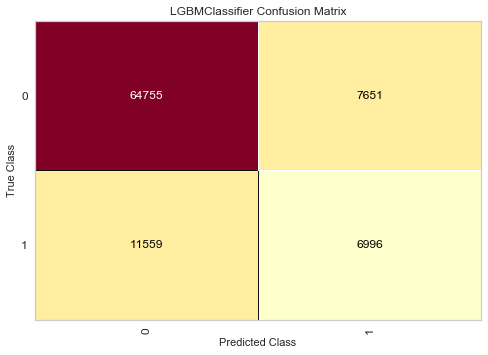

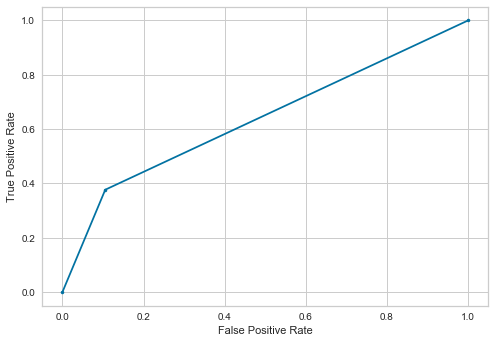

---------Gradient Boosting Classifier------------
Accuracy  (%): 
 76.87690328822242
AUC  (%): 
 60.662382075242604
Precision: 
 41.64305949008499
Recall (%): 
 33.27405012126112
f1 score (%): 
 36.99110272310597
logistic loss :
 7.986510724718534
              precision    recall  f1-score   support

           0       0.84      0.88      0.86     72406
           1       0.42      0.33      0.37     18555

    accuracy                           0.77     90961
   macro avg       0.63      0.61      0.61     90961
weighted avg       0.75      0.77      0.76     90961



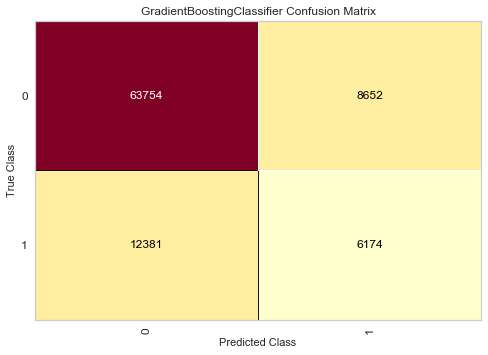

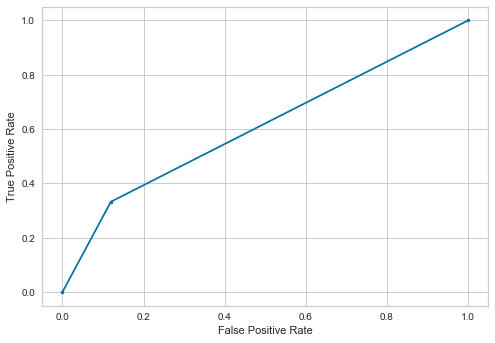

,classifier,Precision,Recall,AUC,Accuracy
0,Logistic Regression,0.000000,0.000000,50.000000,79.601148
1,Nearest Neighbors,40.140183,50.617084,65.636692,74.528644
2,Decision Tree,55.666789,65.330100,75.998475,82.314398
3,Naive Bayes,20.273109,1.040151,49.995948,78.978903
4,Random Forest,67.689801,55.979520,74.566011,85.569640
5,xgboost,52.535220,45.621126,67.529233,80.499335
6,Ada Boost,38.363202,34.610617,60.180208,75.317993
7,SVM,50.000000,0.005389,50.002004,79.601148
8,MLP Classifier,35.198222,25.599569,56.760920,75.209156
9,light Gradient Boosting,47.764047,37.704123,63.568660,78.881059


,classifier,Precision,Recall,AUC,Accuracy
0,Logistic Regression,0.000000,0.000000,50.000000,79.601148
1,Nearest Neighbors,40.140183,50.617084,65.636692,74.528644
2,Decision Tree,55.666789,65.330100,75.998475,82.314398
3,Naive Bayes,20.273109,1.040151,49.995948,78.978903
4,Random Forest,67.689801,55.979520,74.566011,85.569640
5,xgboost,52.535220,45.621126,67.529233,80.499335
6,Ada Boost,38.363202,34.610617,60.180208,75.317993
7,SVM,50.000000,0.005389,50.002004,79.601148
8,MLP Classifier,35.198222,25.599569,56.760920,75.209156
9,light Gradient Boosting,47.764047,37.704123,63.568660,78.881059


In [16]:
t3.fit_model_CV_FS_OS(df2,'return',min_max=True)

delivery_time_hours      28.258188
unit_price               13.984479
lng                      12.968733
lat                      12.964893
total_amount_expected     6.552262
Sub Category              6.225541
r_day                     4.987048
Category                  4.907077
order_day                 4.686446
channel                   2.532427
days_taken                1.932906
dtype: float64
Selected Features =['delivery_time_hours', 'unit_price', 'lng', 'lat', 'total_amount_expected', 'Sub Category']
_____Cross Validation_____
---------Logistic Regression------------
Mean accuracy  (%): 
 66.60117871430963
Mean AUC  (%): 
 55.262412506787875
Mean Precision: 
 0.0
Mean Recall (%): 
 0.0
Mean f1 score (%): 
 0.0
---------Nearest Neighbors------------
Mean accuracy  (%): 
 67.94192069040818
Mean AUC  (%): 
 68.49344883077204
Mean Precision: 
 52.28875922501183
Mean Recall (%): 
 45.864391558149975
Mean f1 score (%): 
 48.862451201502374
---------Decision Tree------------
Mean accura

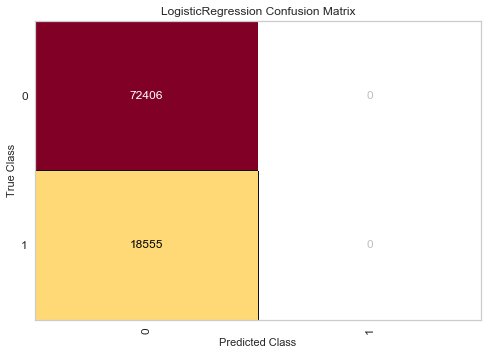

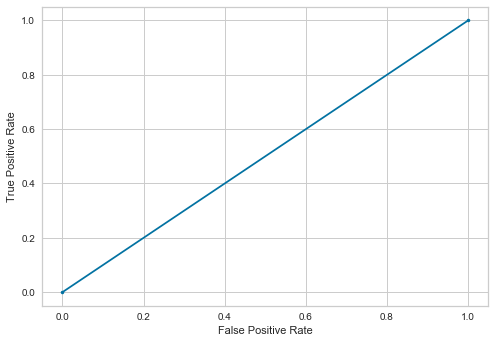

---------Nearest Neighbors------------
Accuracy  (%): 
 73.8470333439606
AUC  (%): 
 64.65941583796327
Precision: 
 38.84959522795057
Recall (%): 
 49.14039342495285
f1 score (%): 
 43.393218322427124
logistic loss :
 9.033040835971992
              precision    recall  f1-score   support

           0       0.86      0.80      0.83     72406
           1       0.39      0.49      0.43     18555

    accuracy                           0.74     90961
   macro avg       0.62      0.65      0.63     90961
weighted avg       0.76      0.74      0.75     90961



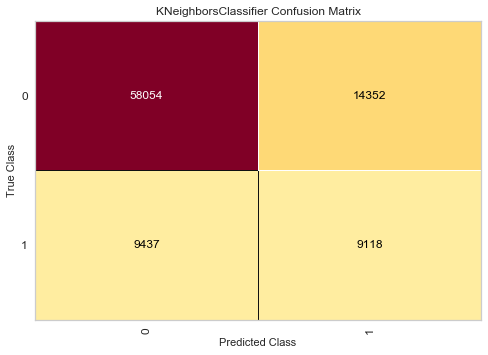

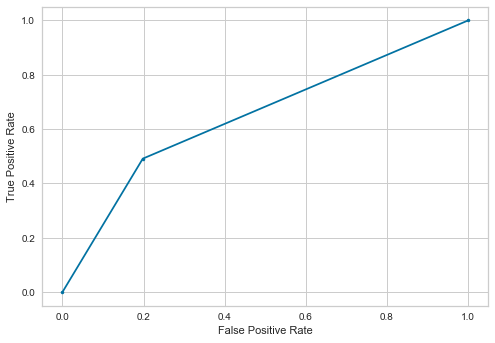

---------Decision Tree------------
Accuracy  (%): 
 76.62954453007332
AUC  (%): 
 71.77428863751784
Precision: 
 44.86023958927553
Recall (%): 
 63.573160873080035
f1 score (%): 
 52.60200668896322
logistic loss :
 8.071996811448335
              precision    recall  f1-score   support

           0       0.90      0.80      0.84     72406
           1       0.45      0.64      0.53     18555

    accuracy                           0.77     90961
   macro avg       0.67      0.72      0.69     90961
weighted avg       0.80      0.77      0.78     90961



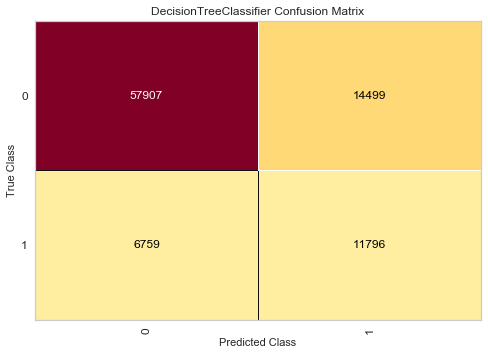

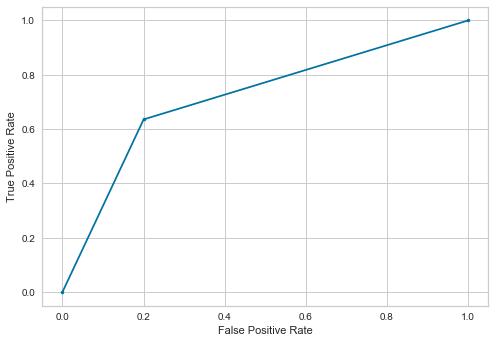

---------Naive Bayes------------
Accuracy  (%): 
 79.30321786260045
AUC  (%): 
 50.01327490773624
Precision: 
 21.231422505307858
Recall (%): 
 0.5389382915656158
f1 score (%): 
 1.0511931041732365
logistic loss :
 7.148418564673158
              precision    recall  f1-score   support

           0       0.80      0.99      0.88     72406
           1       0.21      0.01      0.01     18555

    accuracy                           0.79     90961
   macro avg       0.50      0.50      0.45     90961
weighted avg       0.68      0.79      0.71     90961



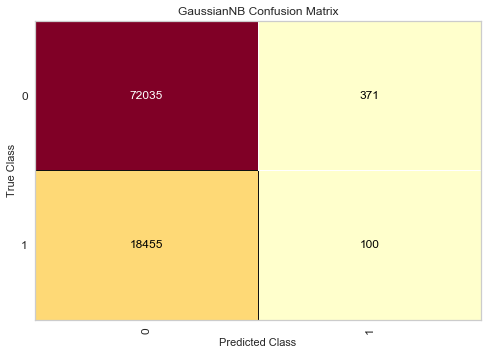

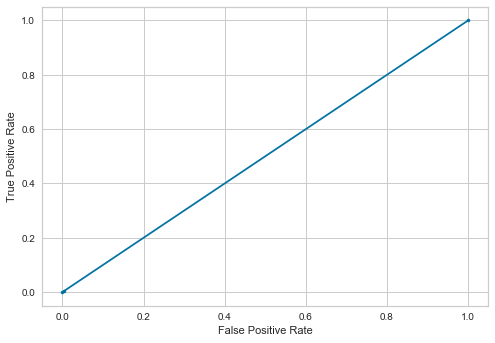

---------Random Forest------------
Accuracy  (%): 
 82.10331900484823
AUC  (%): 
 72.79554562433145
Precision: 
 56.01988997037664
Recall (%): 
 57.0735650767987
f1 score (%): 
 56.54181905550069
logistic loss :
 6.18136771567799
              precision    recall  f1-score   support

           0       0.89      0.89      0.89     72406
           1       0.56      0.57      0.57     18555

    accuracy                           0.82     90961
   macro avg       0.72      0.73      0.73     90961
weighted avg       0.82      0.82      0.82     90961



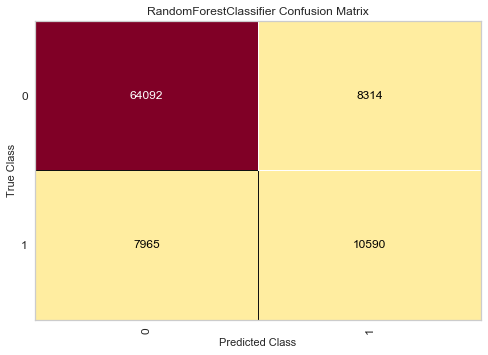

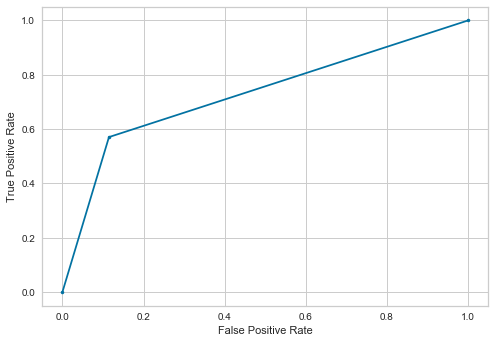

---------xgboost------------
Accuracy  (%): 
 79.81772407955057
AUC  (%): 
 66.43772094499344
Precision: 
 50.612905233028435
Recall (%): 
 43.83724063594718
f1 score (%): 
 46.982036619881015
logistic loss :
 6.9707809221817465
              precision    recall  f1-score   support

           0       0.86      0.89      0.88     72406
           1       0.51      0.44      0.47     18555

    accuracy                           0.80     90961
   macro avg       0.68      0.66      0.67     90961
weighted avg       0.79      0.80      0.79     90961



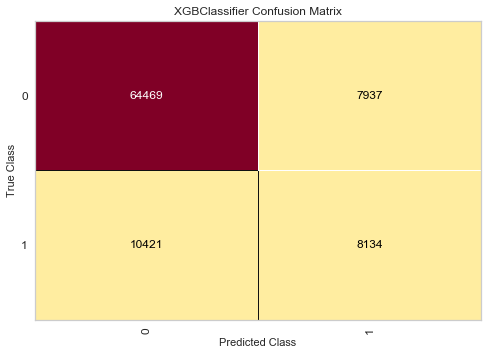

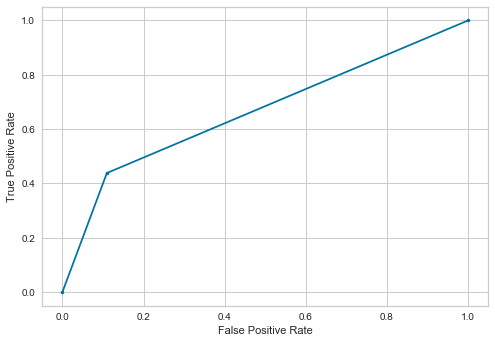

---------Ada Boost------------
Accuracy  (%): 
 75.60932707424061
AUC  (%): 
 59.72989575616279
Precision: 
 38.54068042668686
Recall (%): 
 32.907572082996495
f1 score (%): 
 35.50206407349263
logistic loss :
 8.42432557665006
              precision    recall  f1-score   support

           0       0.83      0.87      0.85     72406
           1       0.39      0.33      0.36     18555

    accuracy                           0.76     90961
   macro avg       0.61      0.60      0.60     90961
weighted avg       0.74      0.76      0.75     90961



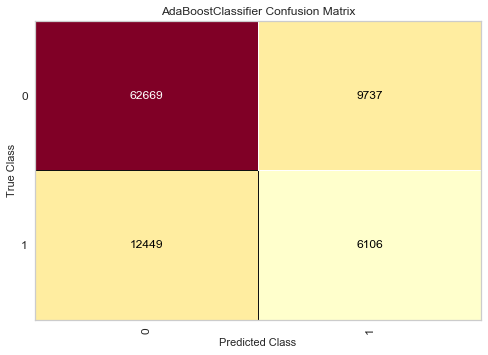

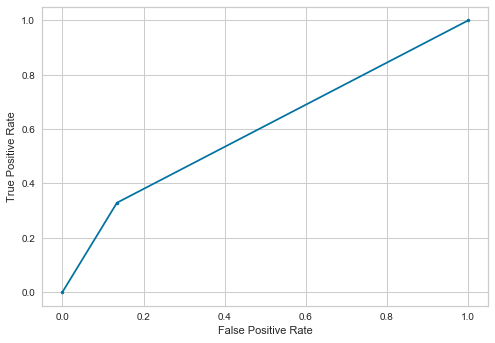

---------SVM------------
Accuracy  (%): 
 79.60114774463781
AUC  (%): 
 50.00200414095096
Precision: 
 50.0
Recall (%): 
 0.0053893829156561575
f1 score (%): 
 0.01077760413859999
logistic loss :
 7.045513976398293
              precision    recall  f1-score   support

           0       0.80      1.00      0.89     72406
           1       0.50      0.00      0.00     18555

    accuracy                           0.80     90961
   macro avg       0.65      0.50      0.44     90961
weighted avg       0.74      0.80      0.71     90961



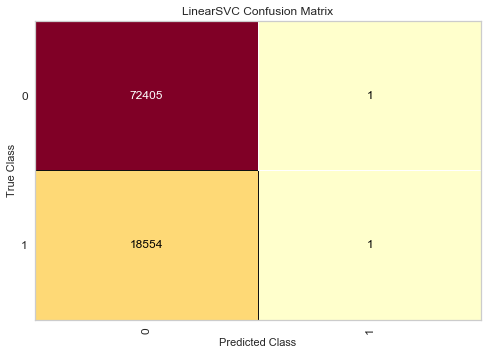

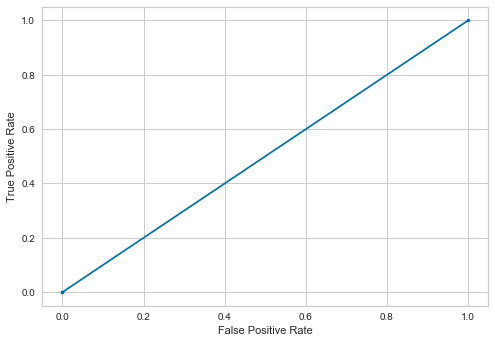

---------MLP Classifier------------
Accuracy  (%): 
 72.45632743703345
AUC  (%): 
 59.609239704971216
Precision: 
 34.200418145573
Recall (%): 
 37.90891942872541
f1 score (%): 
 35.959306783906754
logistic loss :
 9.513366440014018
              precision    recall  f1-score   support

           0       0.84      0.81      0.82     72406
           1       0.34      0.38      0.36     18555

    accuracy                           0.72     90961
   macro avg       0.59      0.60      0.59     90961
weighted avg       0.74      0.72      0.73     90961



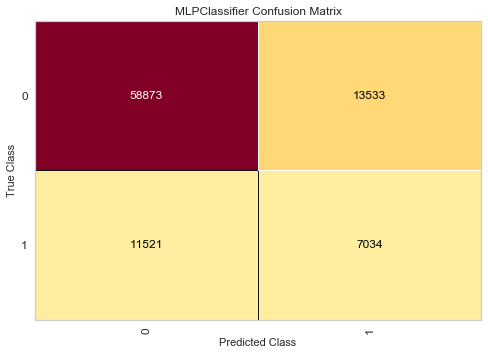

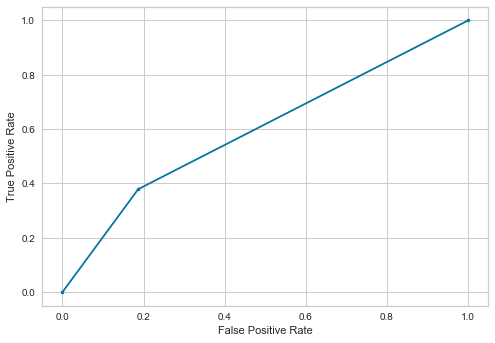

---------light Gradient Boosting------------
Accuracy  (%): 
 78.84368025857236
AUC  (%): 
 63.176418858737485
Precision: 
 47.59309718437784
Recall (%): 
 36.71247642144975
f1 score (%): 
 41.45065108920531
logistic loss :
 7.3071999068170435
              precision    recall  f1-score   support

           0       0.85      0.90      0.87     72406
           1       0.48      0.37      0.41     18555

    accuracy                           0.79     90961
   macro avg       0.66      0.63      0.64     90961
weighted avg       0.77      0.79      0.78     90961



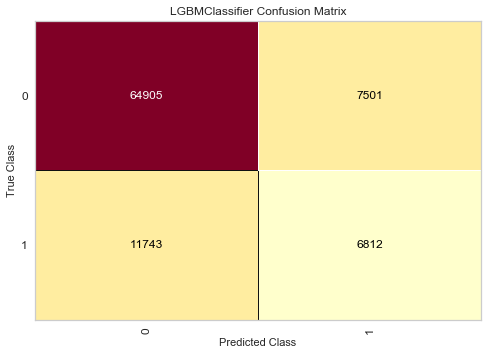

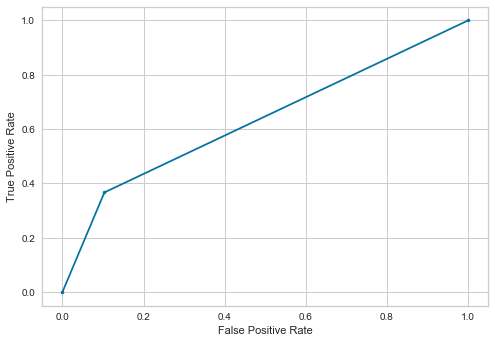

---------Gradient Boosting Classifier------------
Accuracy  (%): 
 76.72738866107453
AUC  (%): 
 59.88505514203036
Precision: 
 40.84733893557423
Recall (%): 
 31.436270547022367
f1 score (%): 
 35.529160956296636
logistic loss :
 8.038149445403604
              precision    recall  f1-score   support

           0       0.83      0.88      0.86     72406
           1       0.41      0.31      0.36     18555

    accuracy                           0.77     90961
   macro avg       0.62      0.60      0.61     90961
weighted avg       0.75      0.77      0.76     90961



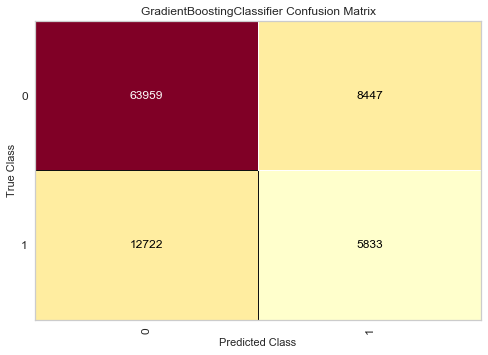

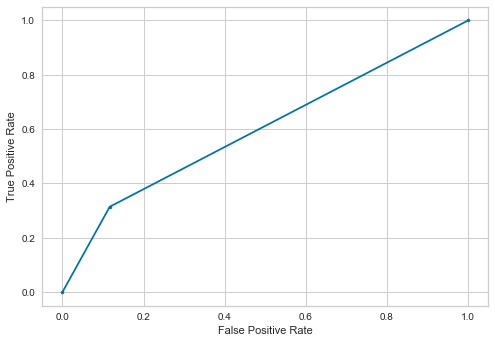

,classifier,Precision,Recall,AUC,Accuracy
0,Logistic Regression,0.000000,0.000000,50.000000,79.601148
1,Nearest Neighbors,38.849595,49.140393,64.659416,73.847033
2,Decision Tree,44.860240,63.573161,71.774289,76.629545
3,Naive Bayes,21.231423,0.538938,50.013275,79.303218
4,Random Forest,56.019890,57.073565,72.795546,82.103319
5,xgboost,50.612905,43.837241,66.437721,79.817724
6,Ada Boost,38.540680,32.907572,59.729896,75.609327
7,SVM,50.000000,0.005389,50.002004,79.601148
8,MLP Classifier,34.200418,37.908919,59.609240,72.456327
9,light Gradient Boosting,47.593097,36.712476,63.176419,78.843680


,classifier,Precision,Recall,AUC,Accuracy
0,Logistic Regression,0.000000,0.000000,50.000000,79.601148
1,Nearest Neighbors,38.849595,49.140393,64.659416,73.847033
2,Decision Tree,44.860240,63.573161,71.774289,76.629545
3,Naive Bayes,21.231423,0.538938,50.013275,79.303218
4,Random Forest,56.019890,57.073565,72.795546,82.103319
5,xgboost,50.612905,43.837241,66.437721,79.817724
6,Ada Boost,38.540680,32.907572,59.729896,75.609327
7,SVM,50.000000,0.005389,50.002004,79.601148
8,MLP Classifier,34.200418,37.908919,59.609240,72.456327
9,light Gradient Boosting,47.593097,36.712476,63.176419,78.843680


In [17]:
t3.fit_model_CV_FS_US(df2,'return',min_max=True)

Min max standardization has slightly improved performance

#### Results Summary

1. Recall score is the one which is most important to judge the performance in this case because of class imbalance. Recall score shows the true postive ratio. Aim is to correctly predict returns as compared to non-returns hence recall score would be most appropriate.
2. Cross Validation has not improved results
3. Feature Selection using random forest has resulted in decreased oerformance in terms of recall score.
4. Under Sampling has increased performance.
5. Over sampling has not increased performance as compared to under sampling

In [20]:
df3=t3.deep_copy(df2)

Revisitng encoding 

In [25]:
df=t2.load_data('csv')

Enter path of filemodel_data.csv


In [26]:
df

,channel,lat,lng,shipped_quantity,unit_price,total_amount_expected,days_taken,delivery_time_hours,return,Category,Sub Category,order_day,r_day
0,CUSTOMER_APP,0.000000,0.00000,100,117000.0,11700000.0,10.0,7.916667,0,Oil aur Ghee,Oil,Wednesday,Saturday
1,CUSTOMER_APP,0.000000,0.00000,10,24000.0,240000.0,9.0,2.533333,0,Oil aur Ghee,Ghee,Thursday,Saturday
2,CUSTOMER_APP,0.000000,0.00000,50,64000.0,3200000.0,9.0,2.233333,0,Oil aur Ghee,Ghee,Thursday,Saturday
3,CUSTOMER_APP,0.000000,0.00000,100,128000.0,12800000.0,9.0,2.233333,0,Oil aur Ghee,Oil,Thursday,Saturday
4,CUSTOMER_APP,0.000000,0.00000,25,58000.0,1450000.0,9.0,2.233333,0,Oil aur Ghee,Oil,Thursday,Saturday
...,...,...,...,...,...,...,...,...,...,...,...,...,...
454799,CUSTOMER_APP,24.915066,67.02645,36,9180.0,330480.0,1.0,2.933333,0,Beverages,Sharbat,Saturday,Sunday
454800,CUSTOMER_APP,24.915066,67.02645,3,1260.0,3780.0,1.0,2.933333,0,Dairy,Tea Whiteners,Saturday,Sunday
454801,CUSTOMER_APP,24.915066,67.02645,5,1075.0,5375.0,1.0,2.933333,0,Dairy,Powder Milk,Saturday,Sunday
454802,CUSTOMER_APP,24.915066,67.02645,40,8480.0,339200.0,1.0,2.933333,0,Dairy,Liquid Milk,Saturday,Sunday


In [27]:
df=t3.encode(df,'channel')

Enter encode typeone-hot


In [28]:
df

,lat,lng,shipped_quantity,unit_price,total_amount_expected,days_taken,delivery_time_hours,return,Category,Sub Category,order_day,r_day,channel_ADMIN_COMMANDO,channel_AGENT_APP,channel_CUSTOMER_APP,channel_TELESALES_COMMANDO
0,0.000000,0.00000,100,117000.0,11700000.0,10.0,7.916667,0,Oil aur Ghee,Oil,Wednesday,Saturday,0,0,1,0
1,0.000000,0.00000,10,24000.0,240000.0,9.0,2.533333,0,Oil aur Ghee,Ghee,Thursday,Saturday,0,0,1,0
2,0.000000,0.00000,50,64000.0,3200000.0,9.0,2.233333,0,Oil aur Ghee,Ghee,Thursday,Saturday,0,0,1,0
3,0.000000,0.00000,100,128000.0,12800000.0,9.0,2.233333,0,Oil aur Ghee,Oil,Thursday,Saturday,0,0,1,0
4,0.000000,0.00000,25,58000.0,1450000.0,9.0,2.233333,0,Oil aur Ghee,Oil,Thursday,Saturday,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
454799,24.915066,67.02645,36,9180.0,330480.0,1.0,2.933333,0,Beverages,Sharbat,Saturday,Sunday,0,0,1,0
454800,24.915066,67.02645,3,1260.0,3780.0,1.0,2.933333,0,Dairy,Tea Whiteners,Saturday,Sunday,0,0,1,0
454801,24.915066,67.02645,5,1075.0,5375.0,1.0,2.933333,0,Dairy,Powder Milk,Saturday,Sunday,0,0,1,0
454802,24.915066,67.02645,40,8480.0,339200.0,1.0,2.933333,0,Dairy,Liquid Milk,Saturday,Sunday,0,0,1,0


In [29]:
t3.encode(df,'Category','Sub Category')

Enter encode typelabel


,lat,lng,shipped_quantity,unit_price,total_amount_expected,days_taken,delivery_time_hours,return,Category,Sub Category,order_day,r_day,channel_ADMIN_COMMANDO,channel_AGENT_APP,channel_CUSTOMER_APP,channel_TELESALES_COMMANDO
0,0.000000,0.00000,100,117000.0,11700000.0,10.0,7.916667,0,18,35,Wednesday,Saturday,0,0,1,0
1,0.000000,0.00000,10,24000.0,240000.0,9.0,2.533333,0,18,22,Thursday,Saturday,0,0,1,0
2,0.000000,0.00000,50,64000.0,3200000.0,9.0,2.233333,0,18,22,Thursday,Saturday,0,0,1,0
3,0.000000,0.00000,100,128000.0,12800000.0,9.0,2.233333,0,18,35,Thursday,Saturday,0,0,1,0
4,0.000000,0.00000,25,58000.0,1450000.0,9.0,2.233333,0,18,35,Thursday,Saturday,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
454799,24.915066,67.02645,36,9180.0,330480.0,1.0,2.933333,0,3,42,Saturday,Sunday,0,0,1,0
454800,24.915066,67.02645,3,1260.0,3780.0,1.0,2.933333,0,12,49,Saturday,Sunday,0,0,1,0
454801,24.915066,67.02645,5,1075.0,5375.0,1.0,2.933333,0,12,37,Saturday,Sunday,0,0,1,0
454802,24.915066,67.02645,40,8480.0,339200.0,1.0,2.933333,0,12,28,Saturday,Sunday,0,0,1,0


In [30]:
t3.encode(df,'order_day','r_day')

Enter encode typeordinal
order_day
enter a number of unique values present in the column: 7
Unique value for the columnMonday
Enter ordinal number for the value1
Unique value for the columnTuesday
Enter ordinal number for the value2
Unique value for the columnWednesday
Enter ordinal number for the value3
Unique value for the columnThursday
Enter ordinal number for the value4
Unique value for the columnFriday
Enter ordinal number for the value5
Unique value for the columnSaturday
Enter ordinal number for the value6
Unique value for the columnSunday
Enter ordinal number for the value7
r_day
enter a number of unique values present in the column: 7
Unique value for the columnMonday
Enter ordinal number for the value1
Unique value for the columnTuesday
Enter ordinal number for the value2
Unique value for the columnWednesday
Enter ordinal number for the value3
Unique value for the columnThursday
Enter ordinal number for the value4
Unique value for the columnFriday
Enter ordinal number for th

,lat,lng,shipped_quantity,unit_price,total_amount_expected,days_taken,delivery_time_hours,return,Category,Sub Category,order_day,r_day,channel_ADMIN_COMMANDO,channel_AGENT_APP,channel_CUSTOMER_APP,channel_TELESALES_COMMANDO
0,0.000000,0.00000,100,117000.0,11700000.0,10.0,7.916667,0,18,35,3,6,0,0,1,0
1,0.000000,0.00000,10,24000.0,240000.0,9.0,2.533333,0,18,22,4,6,0,0,1,0
2,0.000000,0.00000,50,64000.0,3200000.0,9.0,2.233333,0,18,22,4,6,0,0,1,0
3,0.000000,0.00000,100,128000.0,12800000.0,9.0,2.233333,0,18,35,4,6,0,0,1,0
4,0.000000,0.00000,25,58000.0,1450000.0,9.0,2.233333,0,18,35,4,6,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
454799,24.915066,67.02645,36,9180.0,330480.0,1.0,2.933333,0,3,42,6,7,0,0,1,0
454800,24.915066,67.02645,3,1260.0,3780.0,1.0,2.933333,0,12,49,6,7,0,0,1,0
454801,24.915066,67.02645,5,1075.0,5375.0,1.0,2.933333,0,12,37,6,7,0,0,1,0
454802,24.915066,67.02645,40,8480.0,339200.0,1.0,2.933333,0,12,28,6,7,0,0,1,0


---------Logistic Regression------------
Accuracy  (%): 
 79.57696155495212
AUC  (%): 
 50.024890707868266
Precision: 
 32.25806451612903
Recall (%): 
 0.10778765831312315
f1 score (%): 
 0.2148573884084439
logistic loss :
 7.053867950784928
              precision    recall  f1-score   support

           0       0.80      1.00      0.89     72406
           1       0.32      0.00      0.00     18555

    accuracy                           0.80     90961
   macro avg       0.56      0.50      0.44     90961
weighted avg       0.70      0.80      0.71     90961



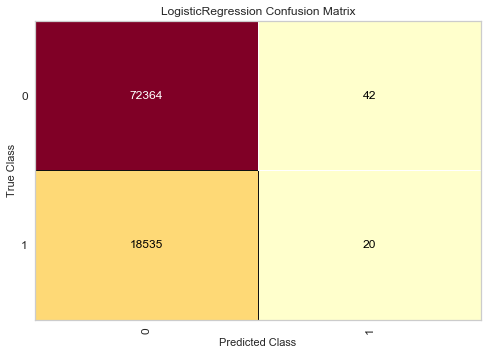

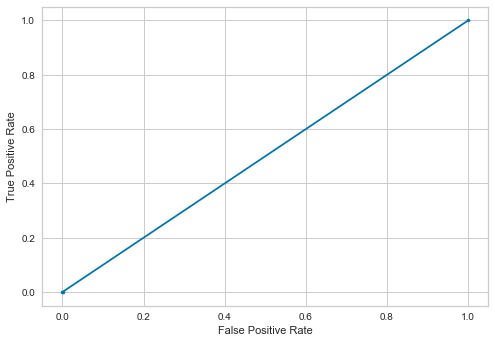

---------Nearest Neighbors------------
Accuracy  (%): 
 80.9984498851156
AUC  (%): 
 64.8946515052665
Precision: 
 54.99724777856413
Recall (%): 
 37.69334411209916
f1 score (%): 
 44.730110002558206
logistic loss :
 6.562953214077783
              precision    recall  f1-score   support

           0       0.85      0.92      0.89     72406
           1       0.55      0.38      0.45     18555

    accuracy                           0.81     90961
   macro avg       0.70      0.65      0.67     90961
weighted avg       0.79      0.81      0.80     90961



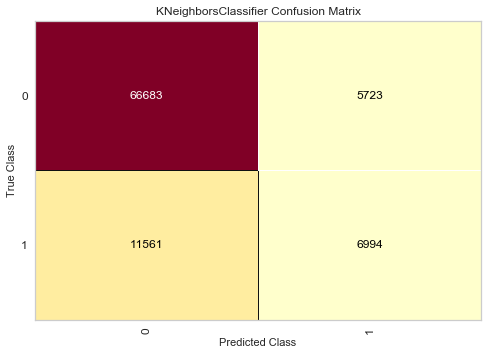

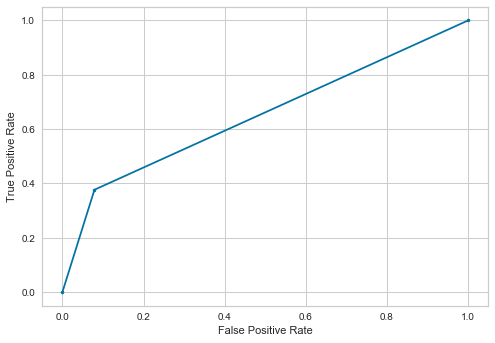

---------Decision Tree------------
Accuracy  (%): 
 86.6789063444773
AUC  (%): 
 80.02661926129548
Precision: 
 66.86223153483499
Recall (%): 
 68.7900835354352
f1 score (%): 
 67.81245849382388
logistic loss :
 4.600998360071637
              precision    recall  f1-score   support

           0       0.92      0.91      0.92     72406
           1       0.67      0.69      0.68     18555

    accuracy                           0.87     90961
   macro avg       0.79      0.80      0.80     90961
weighted avg       0.87      0.87      0.87     90961



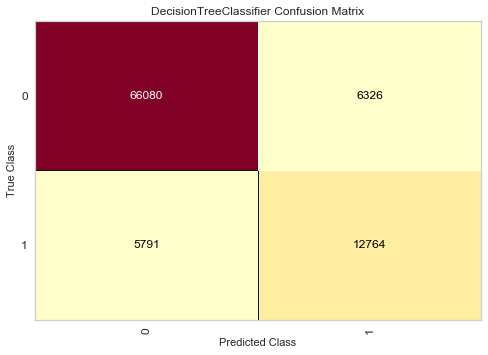

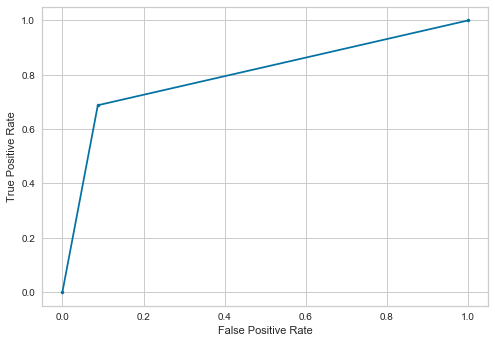

---------Naive Bayes------------
Accuracy  (%): 
 79.07344906058641
AUC  (%): 
 50.45015072758121
Precision: 
 30.952380952380953
Recall (%): 
 2.1018593371059016
f1 score (%): 
 3.936411809235428
logistic loss :
 7.227782283911668
              precision    recall  f1-score   support

           0       0.80      0.99      0.88     72406
           1       0.31      0.02      0.04     18555

    accuracy                           0.79     90961
   macro avg       0.55      0.50      0.46     90961
weighted avg       0.70      0.79      0.71     90961



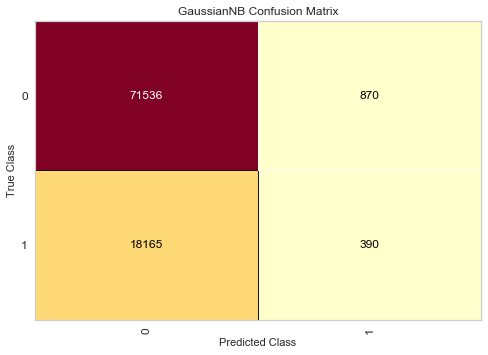

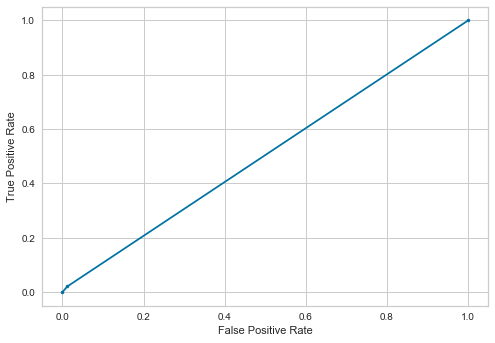

---------Random Forest------------
Accuracy  (%): 
 87.29895229823771
AUC  (%): 
 72.76227545543527
Precision: 
 82.15466568699486
Recall (%): 
 48.20803018054433
f1 score (%): 
 60.761471317460845
logistic loss :
 4.386803545565792
              precision    recall  f1-score   support

           0       0.88      0.97      0.92     72406
           1       0.82      0.48      0.61     18555

    accuracy                           0.87     90961
   macro avg       0.85      0.73      0.77     90961
weighted avg       0.87      0.87      0.86     90961



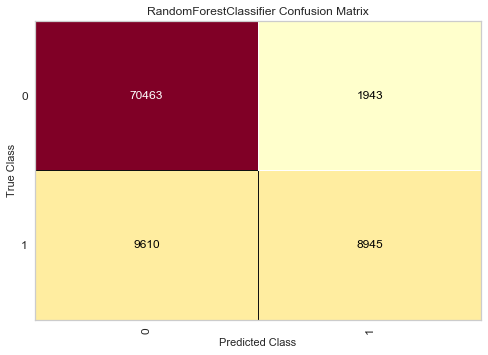

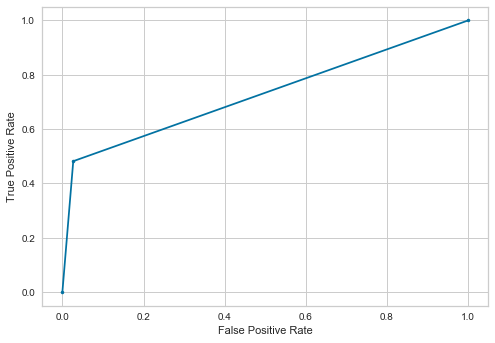

---------xgboost------------
Accuracy  (%): 
 82.97951869482525
AUC  (%): 
 60.355072734153424
Precision: 
 79.87555901224967
Recall (%): 
 22.139585017515493
f1 score (%): 
 34.66959237066419
logistic loss :
 5.87867507755354
              precision    recall  f1-score   support

           0       0.83      0.99      0.90     72406
           1       0.80      0.22      0.35     18555

    accuracy                           0.83     90961
   macro avg       0.82      0.60      0.62     90961
weighted avg       0.82      0.83      0.79     90961



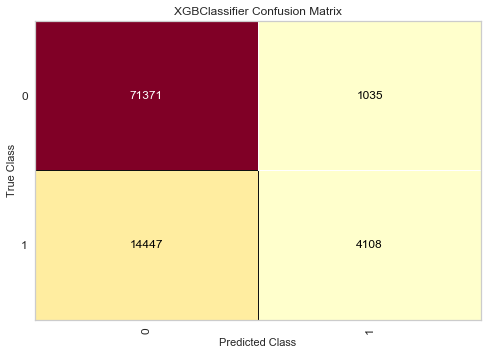

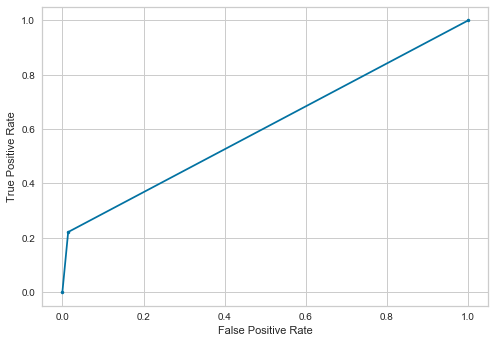

---------Ada Boost------------
Accuracy  (%): 
 79.60334648915469
AUC  (%): 
 50.63869792342028
Precision: 
 50.1577287066246
Recall (%): 
 1.7138237671786583
f1 score (%): 
 3.314398874355099
logistic loss :
 7.044757325970095
              precision    recall  f1-score   support

           0       0.80      1.00      0.89     72406
           1       0.50      0.02      0.03     18555

    accuracy                           0.80     90961
   macro avg       0.65      0.51      0.46     90961
weighted avg       0.74      0.80      0.71     90961



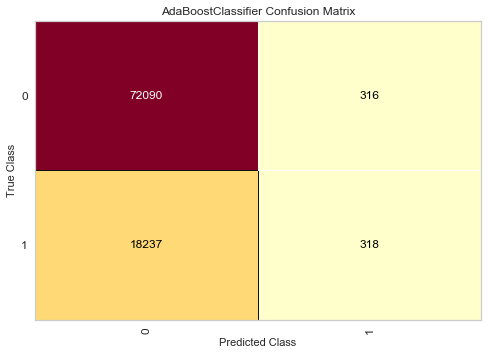

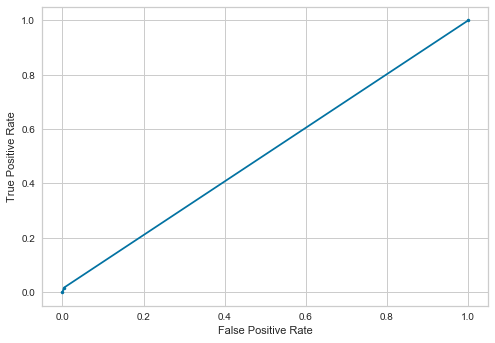

---------SVM------------
Accuracy  (%): 
 79.579160299469
AUC  (%): 
 50.024267667931035
Precision: 
 32.758620689655174
Recall (%): 
 0.10239827539746699
f1 score (%): 
 0.20415838392521357
logistic loss :
 7.05310850496109
              precision    recall  f1-score   support

           0       0.80      1.00      0.89     72406
           1       0.33      0.00      0.00     18555

    accuracy                           0.80     90961
   macro avg       0.56      0.50      0.44     90961
weighted avg       0.70      0.80      0.71     90961



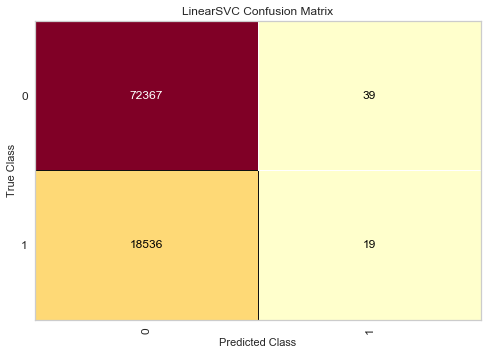

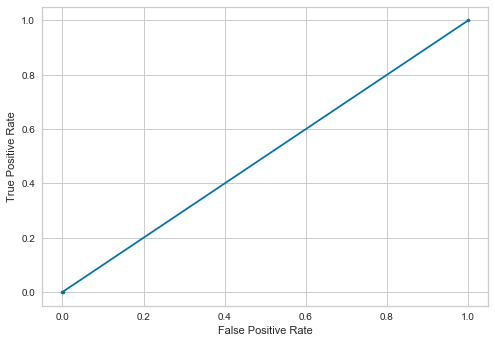

---------MLP Classifier------------
Accuracy  (%): 
 79.62863205109882
AUC  (%): 
 50.22569442157185
Precision: 
 56.830601092896174
Recall (%): 
 0.5604958232282403
f1 score (%): 
 1.1100437613405914
logistic loss :
 7.036021918909115
              precision    recall  f1-score   support

           0       0.80      1.00      0.89     72406
           1       0.57      0.01      0.01     18555

    accuracy                           0.80     90961
   macro avg       0.68      0.50      0.45     90961
weighted avg       0.75      0.80      0.71     90961



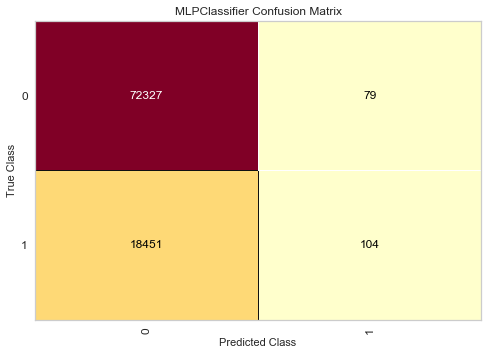

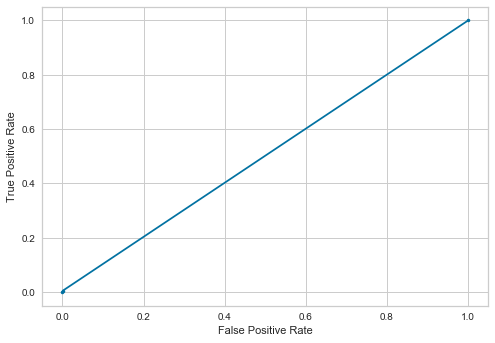

---------light Gradient Boosting------------
Accuracy  (%): 
 81.0666109651389
AUC  (%): 
 54.84862008953926
Precision: 
 75.76343254735215
Recall (%): 
 10.563190514686069
f1 score (%): 
 18.54129221454924
logistic loss :
 6.539366414405522
              precision    recall  f1-score   support

           0       0.81      0.99      0.89     72406
           1       0.76      0.11      0.19     18555

    accuracy                           0.81     90961
   macro avg       0.78      0.55      0.54     90961
weighted avg       0.80      0.81      0.75     90961



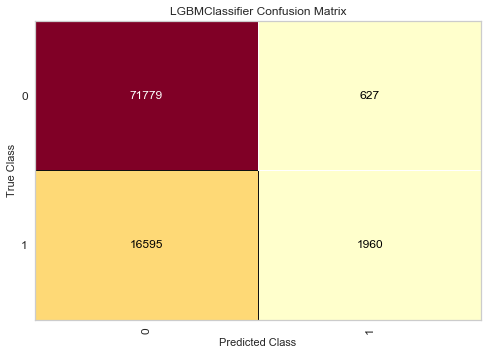

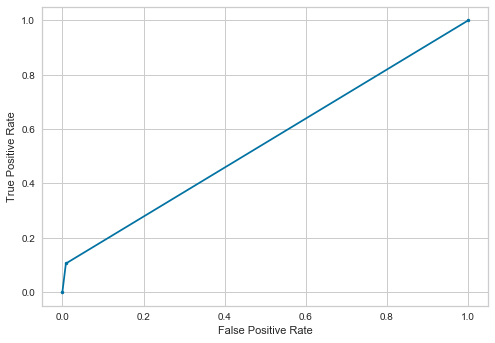

---------Gradient Boosting Classifier------------
Accuracy  (%): 
 79.84960587504534
AUC  (%): 
 51.00582017776002
Precision: 
 68.16720257234726
Recall (%): 
 2.285098356238211
f1 score (%): 
 4.421963810815038
logistic loss :
 6.959701310040669
              precision    recall  f1-score   support

           0       0.80      1.00      0.89     72406
           1       0.68      0.02      0.04     18555

    accuracy                           0.80     90961
   macro avg       0.74      0.51      0.47     90961
weighted avg       0.78      0.80      0.72     90961



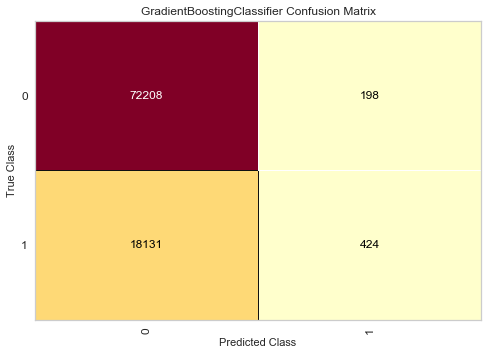

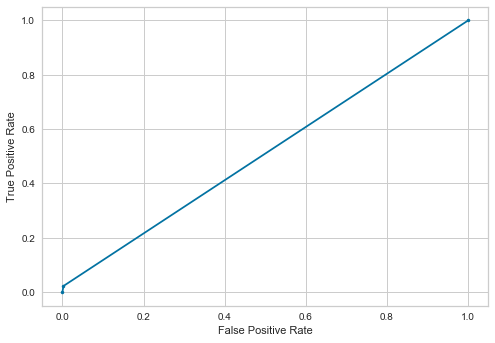

,classifier,Precision,Recall,AUC,Accuracy
0,Logistic Regression,32.258065,0.107788,50.024891,79.576962
1,Nearest Neighbors,54.997248,37.693344,64.894652,80.998450
2,Decision Tree,66.862232,68.790084,80.026619,86.678906
3,Naive Bayes,30.952381,2.101859,50.450151,79.073449
4,Random Forest,82.154666,48.208030,72.762275,87.298952
5,xgboost,79.875559,22.139585,60.355073,82.979519
6,Ada Boost,50.157729,1.713824,50.638698,79.603346
7,SVM,32.758621,0.102398,50.024268,79.579160
8,MLP Classifier,56.830601,0.560496,50.225694,79.628632
9,light Gradient Boosting,75.763433,10.563191,54.848620,81.066611


,classifier,Precision,Recall,AUC,Accuracy
0,Logistic Regression,32.258065,0.107788,50.024891,79.576962
1,Nearest Neighbors,54.997248,37.693344,64.894652,80.998450
2,Decision Tree,66.862232,68.790084,80.026619,86.678906
3,Naive Bayes,30.952381,2.101859,50.450151,79.073449
4,Random Forest,82.154666,48.208030,72.762275,87.298952
5,xgboost,79.875559,22.139585,60.355073,82.979519
6,Ada Boost,50.157729,1.713824,50.638698,79.603346
7,SVM,32.758621,0.102398,50.024268,79.579160
8,MLP Classifier,56.830601,0.560496,50.225694,79.628632
9,light Gradient Boosting,75.763433,10.563191,54.848620,81.066611


In [31]:
t3.fit_model(df,'return',min_max=True)

In [32]:
t.remove_cols(df,'shipped_quantity')

In [33]:
c=['delivery_time_hours','days_taken','total_amount_expected','unit_price']
d=t.deep_copy(df)
from scipy.stats import yeojohnson
for i in c:
    d[i],liam = yeojohnson(d[i])

In [34]:
df['delivery_time_hours']=d['delivery_time_hours']
df['days_taken']=d['days_taken']
df['total_amount_expected']=d['total_amount_expected']
df['unit_price']=d['unit_price']

---------Logistic Regression------------
Accuracy  (%): 
 79.60114774463781
AUC  (%): 
 50.0
Precision: 
 0.0
Recall (%): 
 0.0
f1 score (%): 
 0.0
logistic loss :
 7.045513967607741
              precision    recall  f1-score   support

           0       0.80      1.00      0.89     72406
           1       0.00      0.00      0.00     18555

    accuracy                           0.80     90961
   macro avg       0.40      0.50      0.44     90961
weighted avg       0.63      0.80      0.71     90961



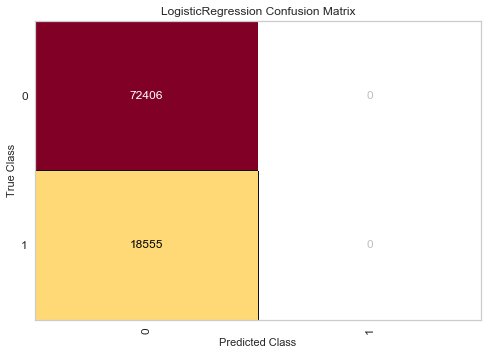

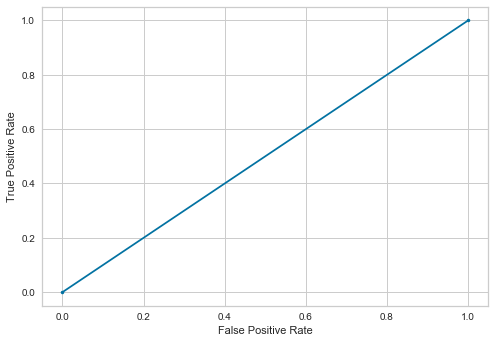

---------Nearest Neighbors------------
Accuracy  (%): 
 81.1127845999934
AUC  (%): 
 65.14483730261615
Precision: 
 55.37487295754827
Recall (%): 
 38.17299919159256
f1 score (%): 
 45.19236904230205
logistic loss :
 6.523463270706094
              precision    recall  f1-score   support

           0       0.85      0.92      0.89     72406
           1       0.55      0.38      0.45     18555

    accuracy                           0.81     90961
   macro avg       0.70      0.65      0.67     90961
weighted avg       0.79      0.81      0.80     90961



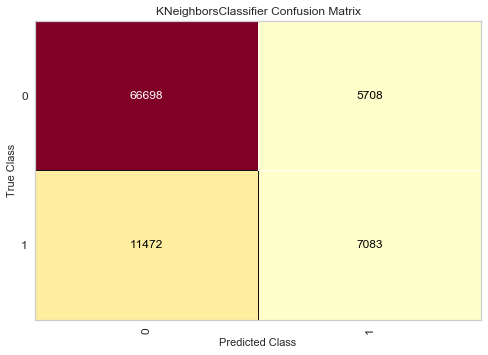

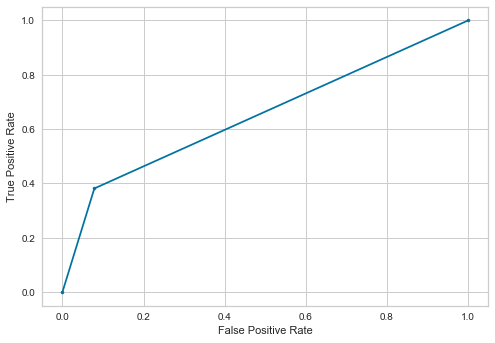

---------Decision Tree------------
Accuracy  (%): 
 86.74266993546684
AUC  (%): 
 80.1047498687619
Precision: 
 67.03198741478762
Recall (%): 
 68.89248181083266
f1 score (%): 
 67.94950166112956
logistic loss :
 4.5789748531268515
              precision    recall  f1-score   support

           0       0.92      0.91      0.92     72406
           1       0.67      0.69      0.68     18555

    accuracy                           0.87     90961
   macro avg       0.80      0.80      0.80     90961
weighted avg       0.87      0.87      0.87     90961



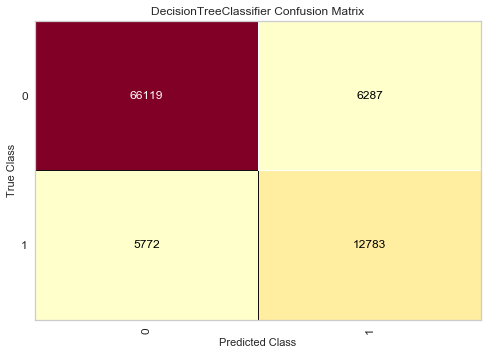

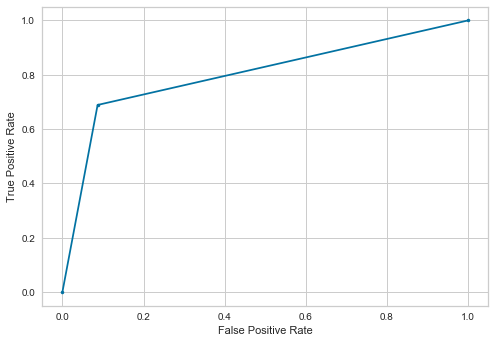

---------Naive Bayes------------
Accuracy  (%): 
 78.77991666758281
AUC  (%): 
 50.10143418426946
Precision: 
 22.597212032281732
Recall (%): 
 1.6599299380220964
f1 score (%): 
 3.0926799879505973
logistic loss :
 7.329166407029989
              precision    recall  f1-score   support

           0       0.80      0.99      0.88     72406
           1       0.23      0.02      0.03     18555

    accuracy                           0.79     90961
   macro avg       0.51      0.50      0.46     90961
weighted avg       0.68      0.79      0.71     90961



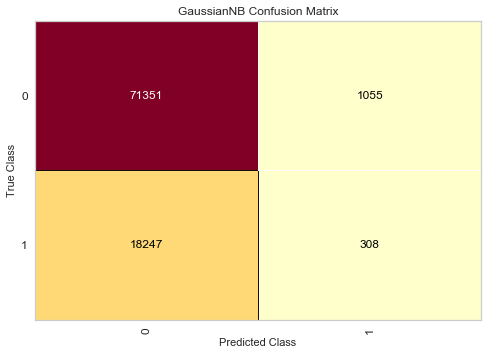

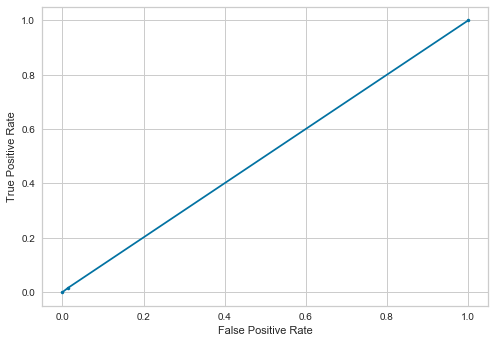

---------Random Forest------------
Accuracy  (%): 
 87.72770747902948
AUC  (%): 
 74.00760679623173
Precision: 
 82.21757322175732
Recall (%): 
 50.832659660468885
f1 score (%): 
 62.823458887001706
logistic loss :
 4.238717605074105
              precision    recall  f1-score   support

           0       0.89      0.97      0.93     72406
           1       0.82      0.51      0.63     18555

    accuracy                           0.88     90961
   macro avg       0.85      0.74      0.78     90961
weighted avg       0.87      0.88      0.87     90961



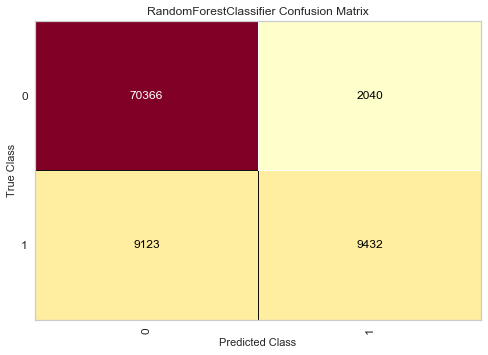

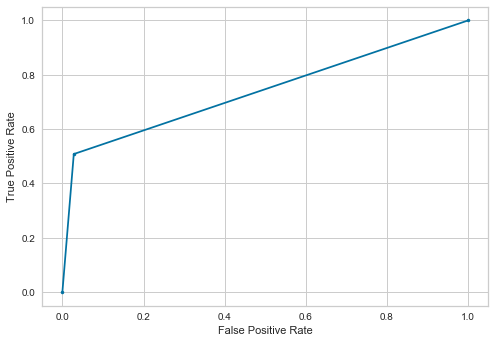

---------xgboost------------
Accuracy  (%): 
 82.89486703092534
AUC  (%): 
 60.349999727948024
Precision: 
 78.43583902809415
Recall (%): 
 22.26893020749124
f1 score (%): 
 34.68916593208244
logistic loss :
 5.9079136143082875
              precision    recall  f1-score   support

           0       0.83      0.98      0.90     72406
           1       0.78      0.22      0.35     18555

    accuracy                           0.83     90961
   macro avg       0.81      0.60      0.62     90961
weighted avg       0.82      0.83      0.79     90961



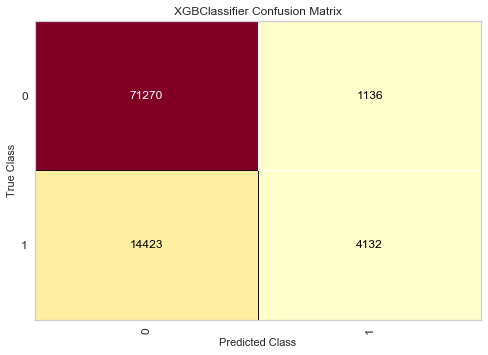

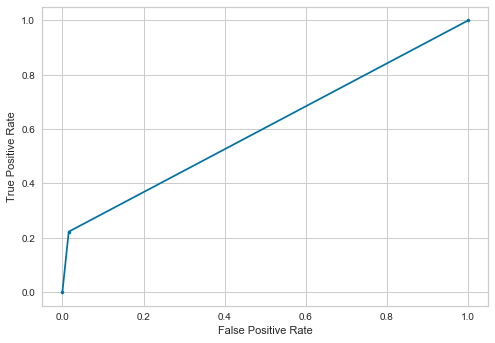

---------Ada Boost------------
Accuracy  (%): 
 79.60444586141313
AUC  (%): 
 50.75362450813209
Precision: 
 50.20080321285141
Recall (%): 
 2.021018593371059
f1 score (%): 
 3.8856077090456944
logistic loss :
 7.044378108514936
              precision    recall  f1-score   support

           0       0.80      0.99      0.89     72406
           1       0.50      0.02      0.04     18555

    accuracy                           0.80     90961
   macro avg       0.65      0.51      0.46     90961
weighted avg       0.74      0.80      0.71     90961



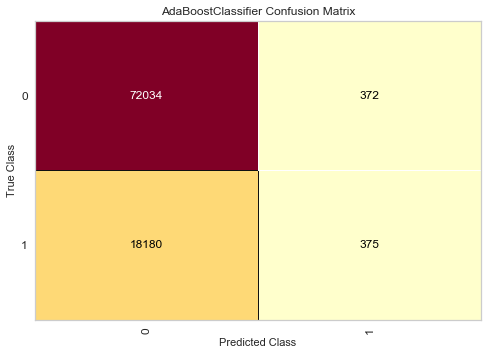

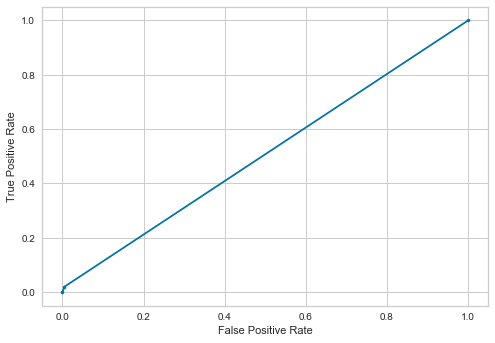

---------SVM------------
Accuracy  (%): 
 79.60114774463781
AUC  (%): 
 50.0
Precision: 
 0.0
Recall (%): 
 0.0
f1 score (%): 
 0.0
logistic loss :
 7.045513967607741
              precision    recall  f1-score   support

           0       0.80      1.00      0.89     72406
           1       0.00      0.00      0.00     18555

    accuracy                           0.80     90961
   macro avg       0.40      0.50      0.44     90961
weighted avg       0.63      0.80      0.71     90961



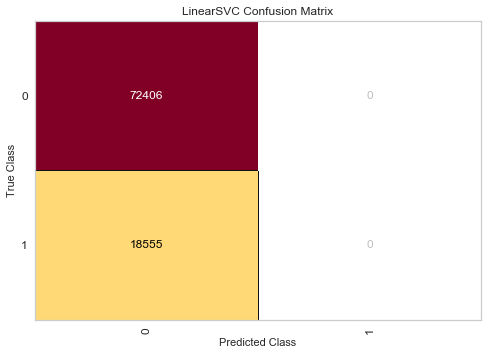

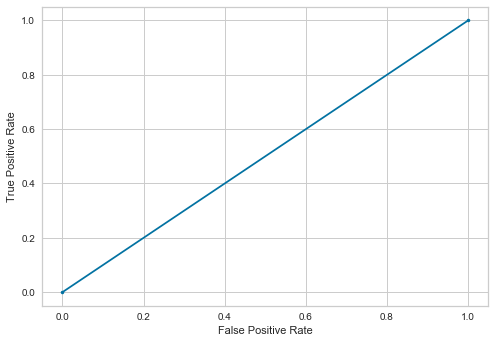

---------MLP Classifier------------
Accuracy  (%): 
 79.6363276569079
AUC  (%): 
 50.16238748278713
Precision: 
 64.81481481481481
Recall (%): 
 0.37725680409593104
f1 score (%): 
 0.7501473503723947
logistic loss :
 7.0333635904138365
              precision    recall  f1-score   support

           0       0.80      1.00      0.89     72406
           1       0.65      0.00      0.01     18555

    accuracy                           0.80     90961
   macro avg       0.72      0.50      0.45     90961
weighted avg       0.77      0.80      0.71     90961



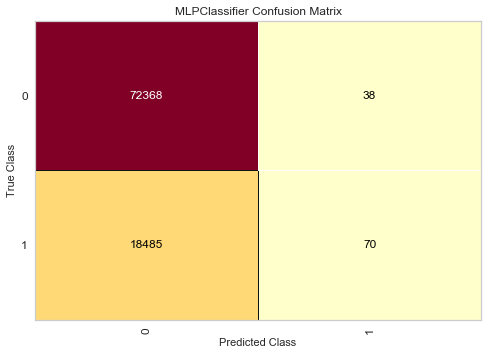

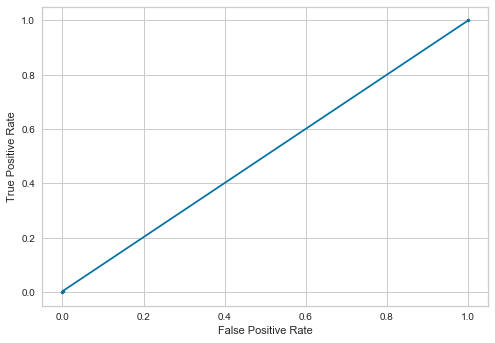

---------light Gradient Boosting------------
Accuracy  (%): 
 81.13587141742066
AUC  (%): 
 55.04243534279399
Precision: 
 76.10321615557217
Recall (%): 
 10.967394233360281
f1 score (%): 
 19.171887512365164
logistic loss :
 6.515444807148453
              precision    recall  f1-score   support

           0       0.81      0.99      0.89     72406
           1       0.76      0.11      0.19     18555

    accuracy                           0.81     90961
   macro avg       0.79      0.55      0.54     90961
weighted avg       0.80      0.81      0.75     90961



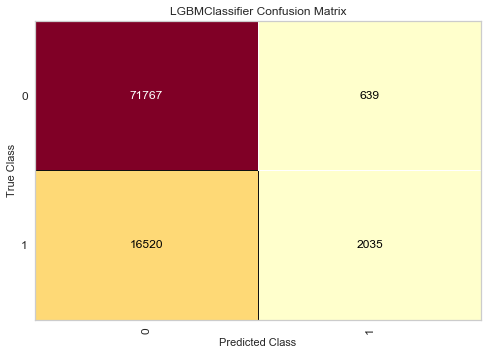

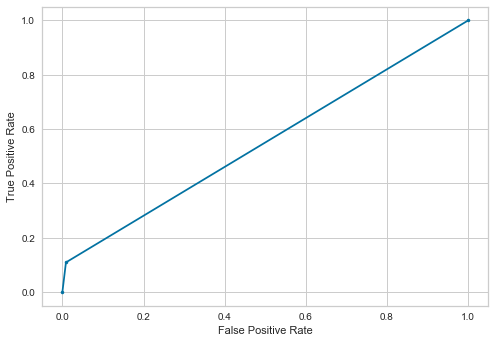

---------Gradient Boosting Classifier------------
Accuracy  (%): 
 79.883686415057
AUC  (%): 
 51.2116082109615
Precision: 
 66.58064516129032
Recall (%): 
 2.7809215844785773
f1 score (%): 
 5.338851526125193
logistic loss :
 6.9479308447555574
              precision    recall  f1-score   support

           0       0.80      1.00      0.89     72406
           1       0.67      0.03      0.05     18555

    accuracy                           0.80     90961
   macro avg       0.73      0.51      0.47     90961
weighted avg       0.77      0.80      0.72     90961



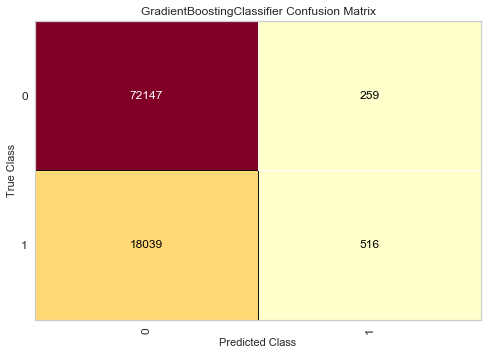

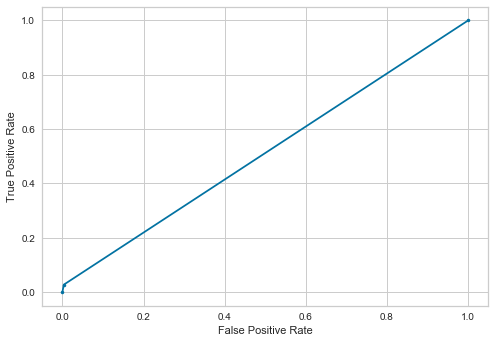

,classifier,Precision,Recall,AUC,Accuracy
0,Logistic Regression,0.000000,0.000000,50.000000,79.601148
1,Nearest Neighbors,55.374873,38.172999,65.144837,81.112785
2,Decision Tree,67.031987,68.892482,80.104750,86.742670
3,Naive Bayes,22.597212,1.659930,50.101434,78.779917
4,Random Forest,82.217573,50.832660,74.007607,87.727707
5,xgboost,78.435839,22.268930,60.350000,82.894867
6,Ada Boost,50.200803,2.021019,50.753625,79.604446
7,SVM,0.000000,0.000000,50.000000,79.601148
8,MLP Classifier,64.814815,0.377257,50.162387,79.636328
9,light Gradient Boosting,76.103216,10.967394,55.042435,81.135871


,classifier,Precision,Recall,AUC,Accuracy
0,Logistic Regression,0.000000,0.000000,50.000000,79.601148
1,Nearest Neighbors,55.374873,38.172999,65.144837,81.112785
2,Decision Tree,67.031987,68.892482,80.104750,86.742670
3,Naive Bayes,22.597212,1.659930,50.101434,78.779917
4,Random Forest,82.217573,50.832660,74.007607,87.727707
5,xgboost,78.435839,22.268930,60.350000,82.894867
6,Ada Boost,50.200803,2.021019,50.753625,79.604446
7,SVM,0.000000,0.000000,50.000000,79.601148
8,MLP Classifier,64.814815,0.377257,50.162387,79.636328
9,light Gradient Boosting,76.103216,10.967394,55.042435,81.135871


In [35]:
t3.fit_model(df,'return',min_max=True)

delivery_time_hours           28.477907
unit_price                    12.939048
lat                           12.578005
lng                           12.577011
total_amount_expected         10.224677
Sub Category                   5.933869
Category                       4.720852
r_day                          4.700494
order_day                      4.494194
days_taken                     1.824139
channel_CUSTOMER_APP           0.491020
channel_TELESALES_COMMANDO     0.479728
channel_AGENT_APP              0.452852
channel_ADMIN_COMMANDO         0.106205
dtype: float64
Selected Features =['delivery_time_hours', 'unit_price', 'lat', 'lng', 'total_amount_expected', 'Sub Category']
---------Logistic Regression------------
Accuracy  (%): 
 79.60114774463781
AUC  (%): 
 50.0
Precision: 
 0.0
Recall (%): 
 0.0
f1 score (%): 
 0.0
logistic loss :
 7.045513967607741
              precision    recall  f1-score   support

           0       0.80      1.00      0.89     72406
           1       0.

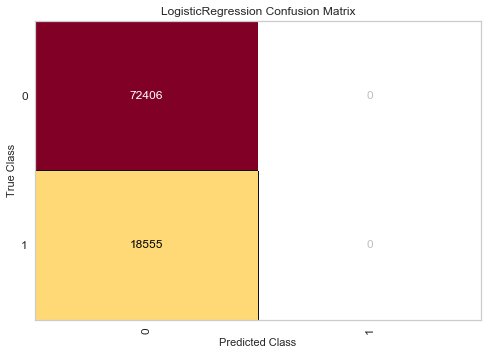

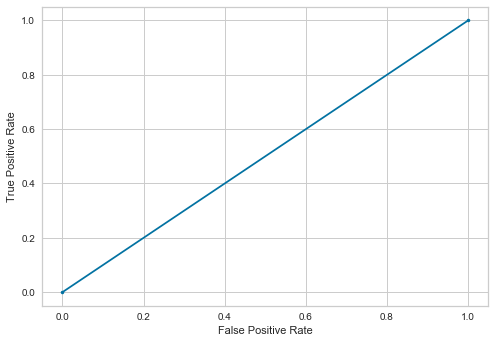

---------Nearest Neighbors------------
Accuracy  (%): 
 81.36124273040095
AUC  (%): 
 66.64568029526428
Precision: 
 55.756094053354424
Recall (%): 
 41.78927512799785
f1 score (%): 
 47.7727804817941
logistic loss :
 6.437652784405446
              precision    recall  f1-score   support

           0       0.86      0.92      0.89     72406
           1       0.56      0.42      0.48     18555

    accuracy                           0.81     90961
   macro avg       0.71      0.67      0.68     90961
weighted avg       0.80      0.81      0.80     90961



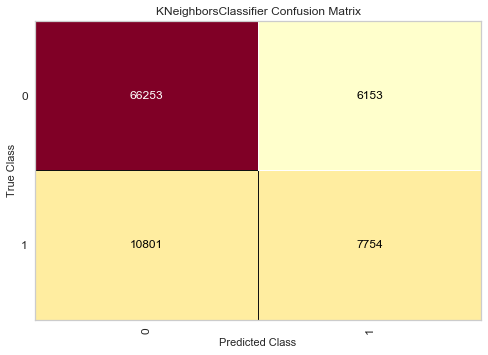

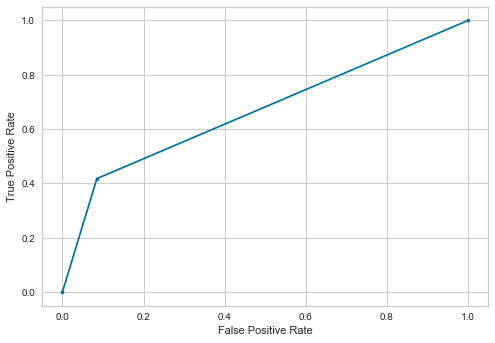

---------Decision Tree------------
Accuracy  (%): 
 83.64353953892328
AUC  (%): 
 74.90937550839945
Precision: 
 59.859494824904814
Recall (%): 
 60.15629210455403
f1 score (%): 
 60.007526477071124
logistic loss :
 5.6493871020574336
              precision    recall  f1-score   support

           0       0.90      0.90      0.90     72406
           1       0.60      0.60      0.60     18555

    accuracy                           0.84     90961
   macro avg       0.75      0.75      0.75     90961
weighted avg       0.84      0.84      0.84     90961



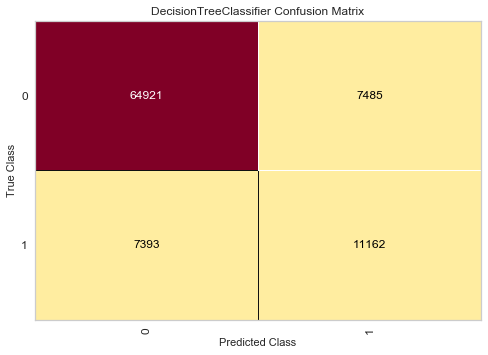

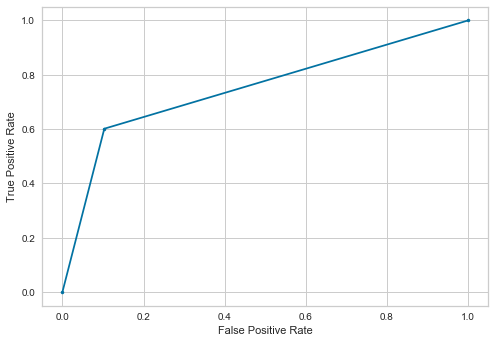

---------Naive Bayes------------
Accuracy  (%): 
 78.8447796308308
AUC  (%): 
 49.93575014622514
Precision: 
 18.670309653916213
Recall (%): 
 1.1048234977095122
f1 score (%): 
 2.0861954917824255
logistic loss :
 7.30676210912118
              precision    recall  f1-score   support

           0       0.80      0.99      0.88     72406
           1       0.19      0.01      0.02     18555

    accuracy                           0.79     90961
   macro avg       0.49      0.50      0.45     90961
weighted avg       0.67      0.79      0.71     90961



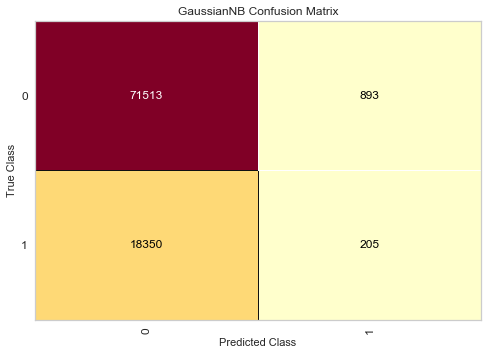

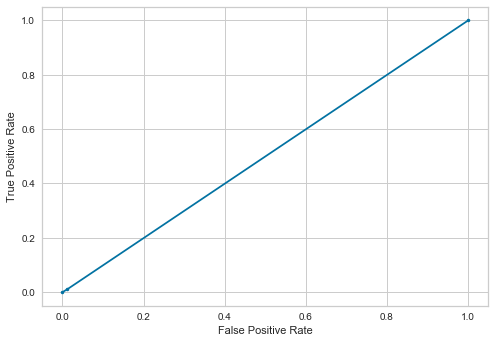

---------Random Forest------------
Accuracy  (%): 
 86.05666164620001
AUC  (%): 
 72.34670703575432
Precision: 
 73.7118397674043
Recall (%): 
 49.188897871193745
f1 score (%): 
 59.003781879303105
logistic loss :
 4.815887069252619
              precision    recall  f1-score   support

           0       0.88      0.96      0.92     72406
           1       0.74      0.49      0.59     18555

    accuracy                           0.86     90961
   macro avg       0.81      0.72      0.75     90961
weighted avg       0.85      0.86      0.85     90961



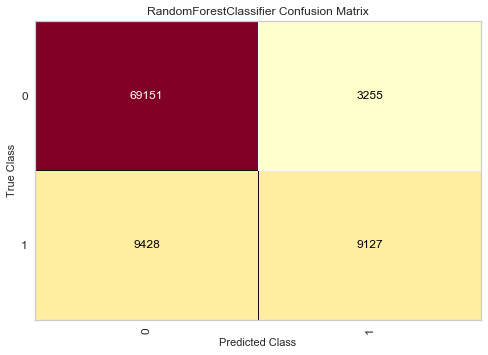

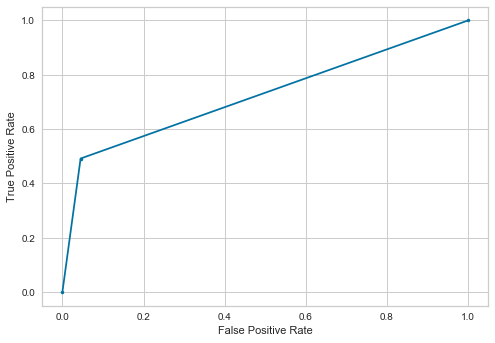

---------xgboost------------
Accuracy  (%): 
 82.20006376359099
AUC  (%): 
 57.98759235373353
Precision: 
 79.7134238310709
Recall (%): 
 17.089733225545675
f1 score (%): 
 28.145386766076424
logistic loss :
 6.147887269105717
              precision    recall  f1-score   support

           0       0.82      0.99      0.90     72406
           1       0.80      0.17      0.28     18555

    accuracy                           0.82     90961
   macro avg       0.81      0.58      0.59     90961
weighted avg       0.82      0.82      0.77     90961



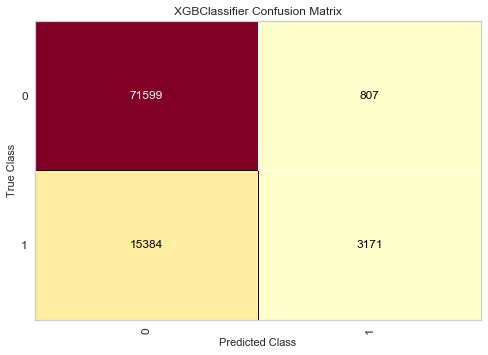

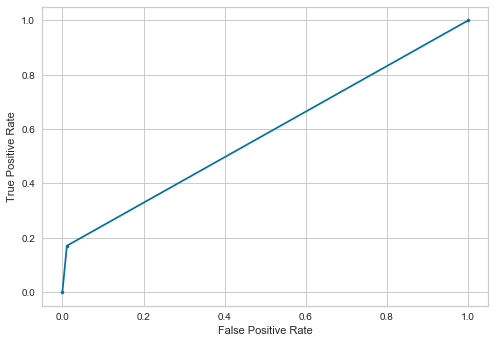

---------Ada Boost------------
Accuracy  (%): 
 79.60004837237938
AUC  (%): 
 50.01333843614988
Precision: 
 46.666666666666664
Recall (%): 
 0.0377256804095931
f1 score (%): 
 0.07539041464728057
logistic loss :
 7.04589374765825
              precision    recall  f1-score   support

           0       0.80      1.00      0.89     72406
           1       0.47      0.00      0.00     18555

    accuracy                           0.80     90961
   macro avg       0.63      0.50      0.44     90961
weighted avg       0.73      0.80      0.71     90961



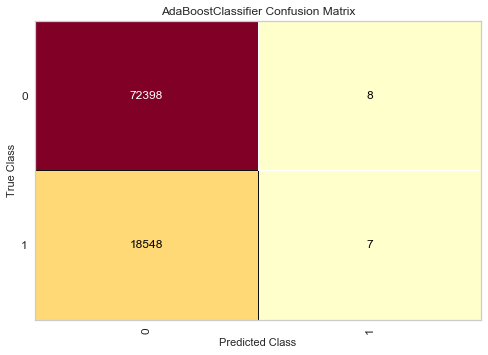

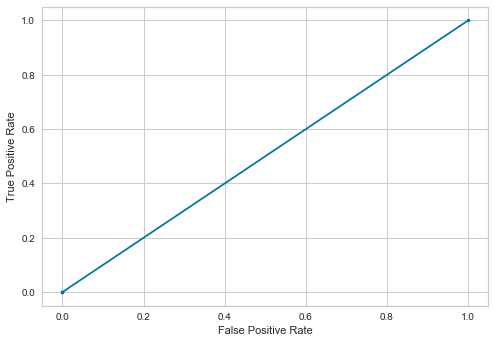

---------SVM------------
Accuracy  (%): 
 79.60114774463781
AUC  (%): 
 50.0
Precision: 
 0.0
Recall (%): 
 0.0
f1 score (%): 
 0.0
logistic loss :
 7.045513967607741
              precision    recall  f1-score   support

           0       0.80      1.00      0.89     72406
           1       0.00      0.00      0.00     18555

    accuracy                           0.80     90961
   macro avg       0.40      0.50      0.44     90961
weighted avg       0.63      0.80      0.71     90961



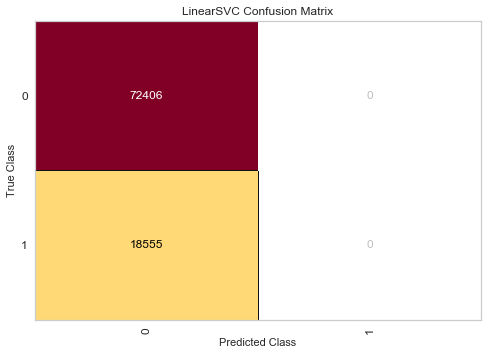

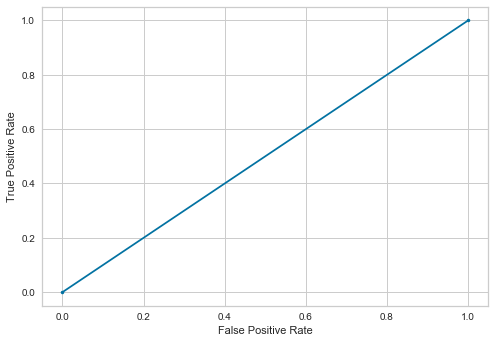

---------MLP Classifier------------
Accuracy  (%): 
 79.60114774463781
AUC  (%): 
 50.0
Precision: 
 0.0
Recall (%): 
 0.0
f1 score (%): 
 0.0
logistic loss :
 7.045513967607741
              precision    recall  f1-score   support

           0       0.80      1.00      0.89     72406
           1       0.00      0.00      0.00     18555

    accuracy                           0.80     90961
   macro avg       0.40      0.50      0.44     90961
weighted avg       0.63      0.80      0.71     90961



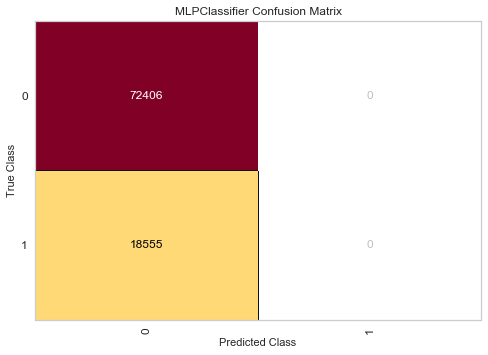

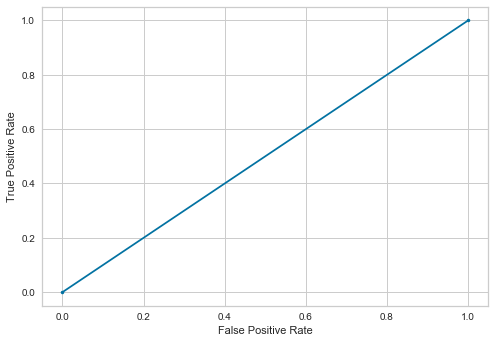

---------light Gradient Boosting------------
Accuracy  (%): 
 80.75878673277559
AUC  (%): 
 53.5870588207535
Precision: 
 79.23375902276513
Recall (%): 
 7.6906494206413365
f1 score (%): 
 14.020436235016701
logistic loss :
 6.6456829137010995
              precision    recall  f1-score   support

           0       0.81      0.99      0.89     72406
           1       0.79      0.08      0.14     18555

    accuracy                           0.81     90961
   macro avg       0.80      0.54      0.52     90961
weighted avg       0.80      0.81      0.74     90961



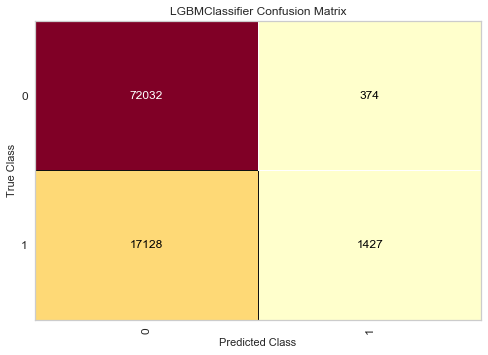

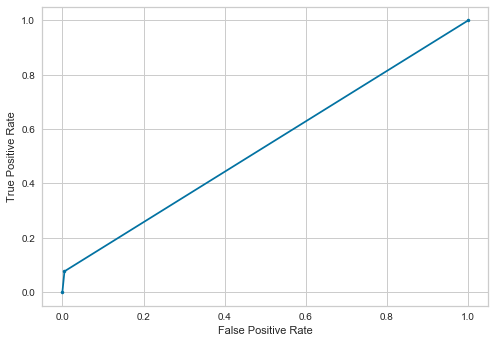

---------Gradient Boosting Classifier------------
Accuracy  (%): 
 79.82322094084277
AUC  (%): 
 50.67259269534298
Precision: 
 80.60606060606061
Recall (%): 
 1.433575855564538
f1 score (%): 
 2.817050569234843
logistic loss :
 6.968813165532824
              precision    recall  f1-score   support

           0       0.80      1.00      0.89     72406
           1       0.81      0.01      0.03     18555

    accuracy                           0.80     90961
   macro avg       0.80      0.51      0.46     90961
weighted avg       0.80      0.80      0.71     90961



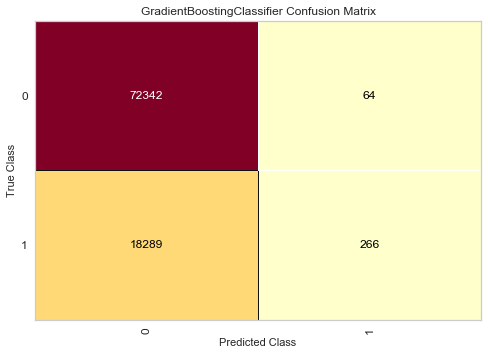

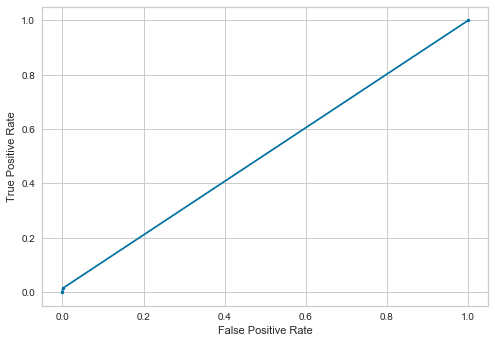

,classifier,Precision,Recall,AUC,Accuracy
0,Logistic Regression,0.000000,0.000000,50.000000,79.601148
1,Nearest Neighbors,55.756094,41.789275,66.645680,81.361243
2,Decision Tree,59.859495,60.156292,74.909376,83.643540
3,Naive Bayes,18.670310,1.104823,49.935750,78.844780
4,Random Forest,73.711840,49.188898,72.346707,86.056662
5,xgboost,79.713424,17.089733,57.987592,82.200064
6,Ada Boost,46.666667,0.037726,50.013338,79.600048
7,SVM,0.000000,0.000000,50.000000,79.601148
8,MLP Classifier,0.000000,0.000000,50.000000,79.601148
9,light Gradient Boosting,79.233759,7.690649,53.587059,80.758787


,classifier,Precision,Recall,AUC,Accuracy
0,Logistic Regression,0.000000,0.000000,50.000000,79.601148
1,Nearest Neighbors,55.756094,41.789275,66.645680,81.361243
2,Decision Tree,59.859495,60.156292,74.909376,83.643540
3,Naive Bayes,18.670310,1.104823,49.935750,78.844780
4,Random Forest,73.711840,49.188898,72.346707,86.056662
5,xgboost,79.713424,17.089733,57.987592,82.200064
6,Ada Boost,46.666667,0.037726,50.013338,79.600048
7,SVM,0.000000,0.000000,50.000000,79.601148
8,MLP Classifier,0.000000,0.000000,50.000000,79.601148
9,light Gradient Boosting,79.233759,7.690649,53.587059,80.758787


In [36]:
t3.fit_model_RFS(df,'return',min_max=True)

---------Logistic Regression------------
Accuracy  (%): 
 79.49560800782753
AUC  (%): 
 50.07199287695757
Precision: 
 29.48717948717949
Recall (%): 
 0.3718674211802748
f1 score (%): 
 0.7344722976209483
logistic loss :
 7.081967551753557
              precision    recall  f1-score   support

           0       0.80      1.00      0.89     72406
           1       0.29      0.00      0.01     18555

    accuracy                           0.79     90961
   macro avg       0.55      0.50      0.45     90961
weighted avg       0.69      0.79      0.71     90961



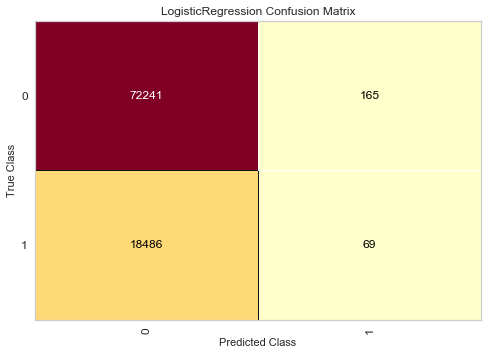

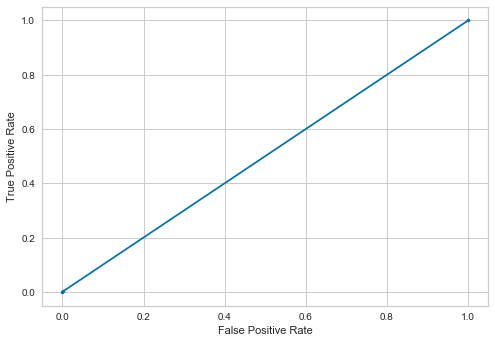

---------Nearest Neighbors------------
Accuracy  (%): 
 76.07436153956091
AUC  (%): 
 67.1988273659684
Precision: 
 42.896997608714905
Recall (%): 
 52.206952303961195
f1 score (%): 
 47.096288013224104
logistic loss :
 8.263736123078058
              precision    recall  f1-score   support

           0       0.87      0.82      0.85     72406
           1       0.43      0.52      0.47     18555

    accuracy                           0.76     90961
   macro avg       0.65      0.67      0.66     90961
weighted avg       0.78      0.76      0.77     90961



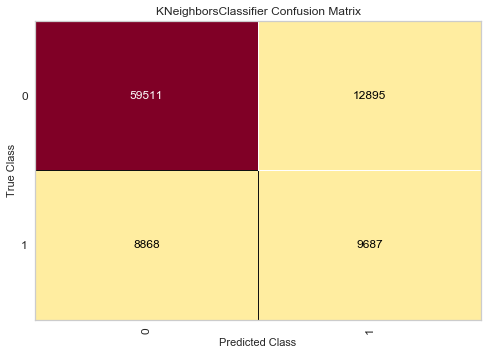

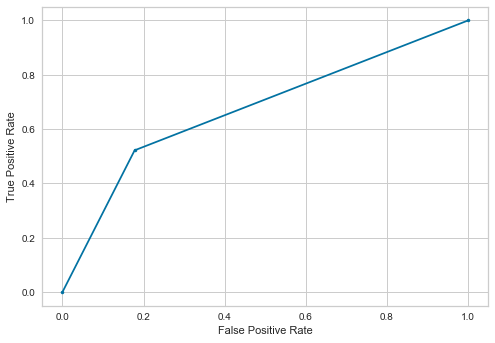

---------Decision Tree------------
Accuracy  (%): 
 82.33638592363761
AUC  (%): 
 78.70785584771009
Precision: 
 55.088767078458645
Recall (%): 
 72.57881972514147
f1 score (%): 
 62.635752656914946
logistic loss :
 6.100892680568771
              precision    recall  f1-score   support

           0       0.92      0.85      0.88     72406
           1       0.55      0.73      0.63     18555

    accuracy                           0.82     90961
   macro avg       0.74      0.79      0.76     90961
weighted avg       0.85      0.82      0.83     90961



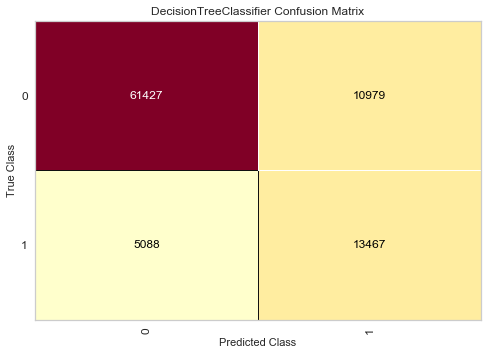

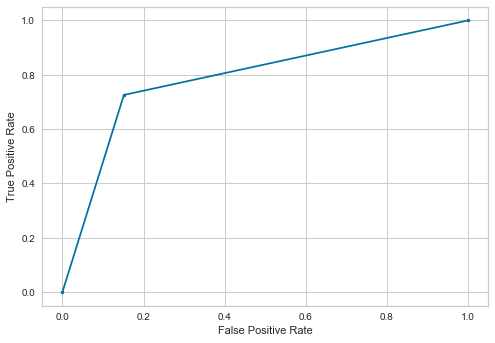

---------Naive Bayes------------
Accuracy  (%): 
 78.67437693077252
AUC  (%): 
 50.13935666506063
Precision: 
 23.032629558541267
Recall (%): 
 1.9401778496362168
f1 score (%): 
 3.5788845809722645
logistic loss :
 7.365619841736414
              precision    recall  f1-score   support

           0       0.80      0.98      0.88     72406
           1       0.23      0.02      0.04     18555

    accuracy                           0.79     90961
   macro avg       0.51      0.50      0.46     90961
weighted avg       0.68      0.79      0.71     90961



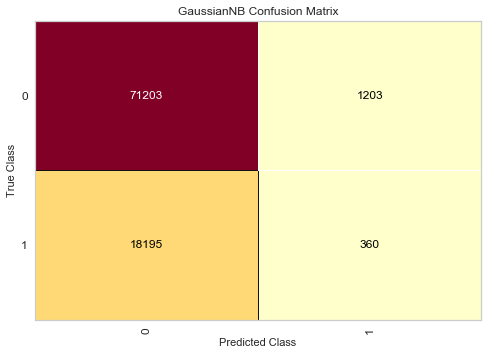

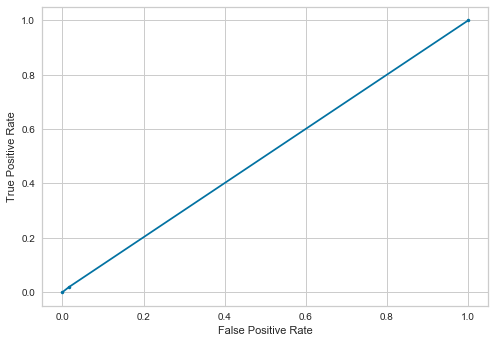

---------Random Forest------------
Accuracy  (%): 
 86.23585932432582
AUC  (%): 
 77.93858812830877
Precision: 
 67.06055294849324
Recall (%): 
 63.92347076259768
f1 score (%): 
 65.4544451189228
logistic loss :
 4.754016984409914
              precision    recall  f1-score   support

           0       0.91      0.92      0.91     72406
           1       0.67      0.64      0.65     18555

    accuracy                           0.86     90961
   macro avg       0.79      0.78      0.78     90961
weighted avg       0.86      0.86      0.86     90961



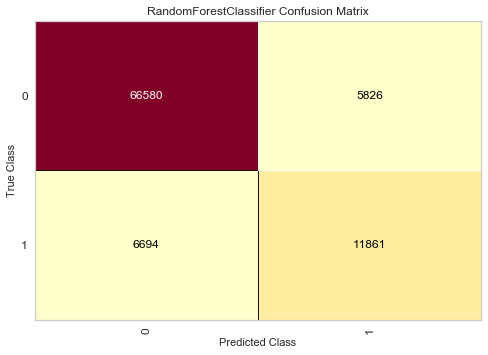

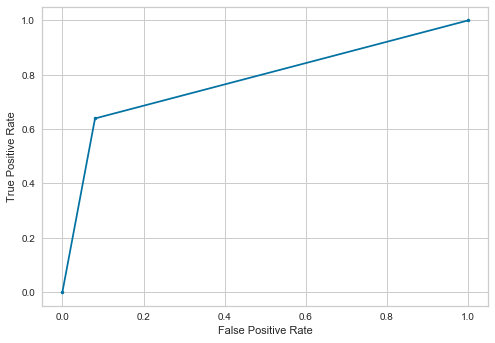

---------xgboost------------
Accuracy  (%): 
 81.34585151878278
AUC  (%): 
 68.80248895616027
Precision: 
 54.93378101100541
Recall (%): 
 47.61519805982215
f1 score (%): 
 51.013337952537675
logistic loss :
 6.442978346225509
              precision    recall  f1-score   support

           0       0.87      0.90      0.88     72406
           1       0.55      0.48      0.51     18555

    accuracy                           0.81     90961
   macro avg       0.71      0.69      0.70     90961
weighted avg       0.80      0.81      0.81     90961



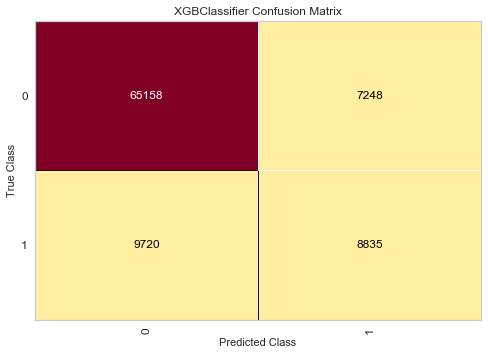

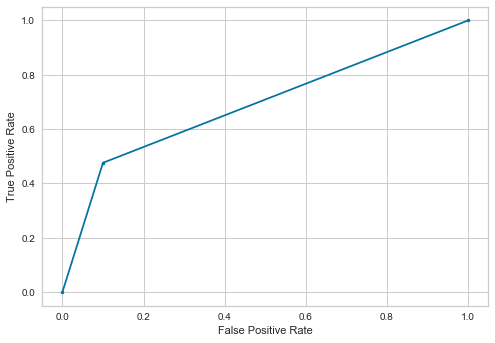

---------Ada Boost------------
Accuracy  (%): 
 76.71639493849011
AUC  (%): 
 59.27690735167253
Precision: 
 40.4163623082542
Recall (%): 
 29.819455672325518
f1 score (%): 
 34.3184989920918
logistic loss :
 8.041943993404333
              precision    recall  f1-score   support

           0       0.83      0.89      0.86     72406
           1       0.40      0.30      0.34     18555

    accuracy                           0.77     90961
   macro avg       0.62      0.59      0.60     90961
weighted avg       0.74      0.77      0.75     90961



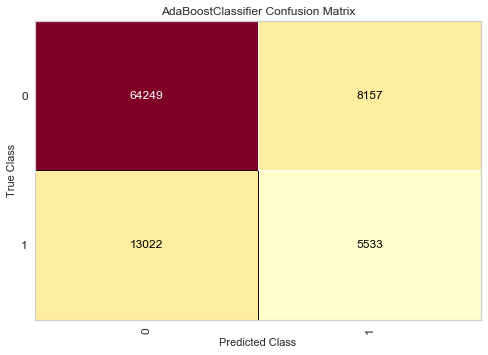

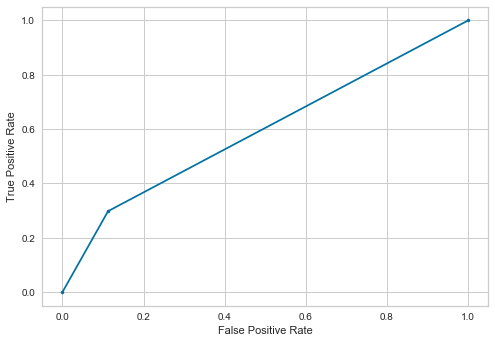

---------SVM------------
Accuracy  (%): 
 79.52858917558075
AUC  (%): 
 50.076676264555786
Precision: 
 32.4468085106383
Recall (%): 
 0.3287523578550256
f1 score (%): 
 0.6509096729445659
logistic loss :
 7.070575925929855
              precision    recall  f1-score   support

           0       0.80      1.00      0.89     72406
           1       0.32      0.00      0.01     18555

    accuracy                           0.80     90961
   macro avg       0.56      0.50      0.45     90961
weighted avg       0.70      0.80      0.71     90961



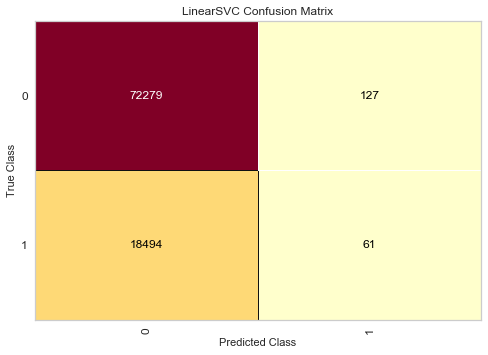

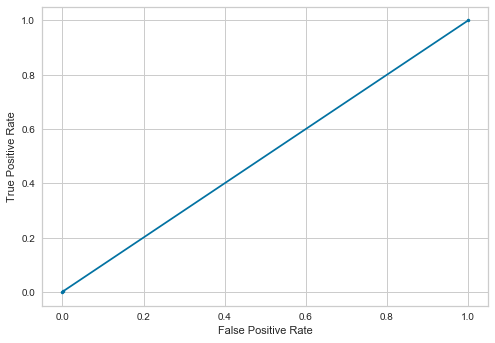

---------MLP Classifier------------
Accuracy  (%): 
 76.23486988929321
AUC  (%): 
 57.50140263070751
Precision: 
 37.90488228788118
Recall (%): 
 25.858259229318243
f1 score (%): 
 30.74360042290072
logistic loss :
 8.208254242637894
              precision    recall  f1-score   support

           0       0.82      0.89      0.86     72406
           1       0.38      0.26      0.31     18555

    accuracy                           0.76     90961
   macro avg       0.60      0.58      0.58     90961
weighted avg       0.73      0.76      0.74     90961



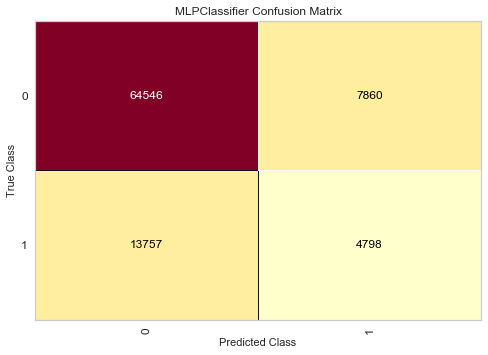

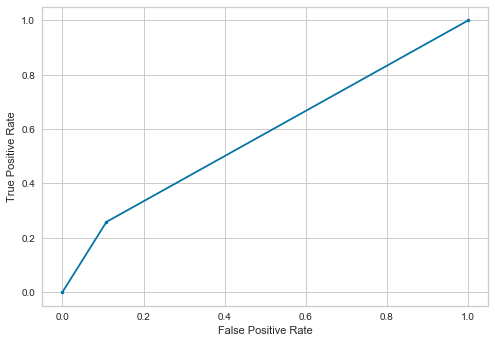

---------light Gradient Boosting------------
Accuracy  (%): 
 79.27353481162255
AUC  (%): 
 64.08975335218076
Precision: 
 48.97692941499588
Recall (%): 
 38.44246833737537
f1 score (%): 
 43.07497207041276
logistic loss :
 7.1587327885770256
              precision    recall  f1-score   support

           0       0.85      0.90      0.87     72406
           1       0.49      0.38      0.43     18555

    accuracy                           0.79     90961
   macro avg       0.67      0.64      0.65     90961
weighted avg       0.78      0.79      0.78     90961



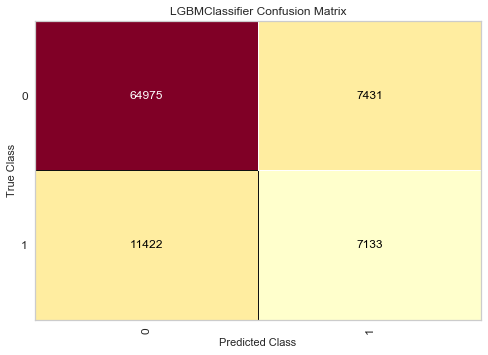

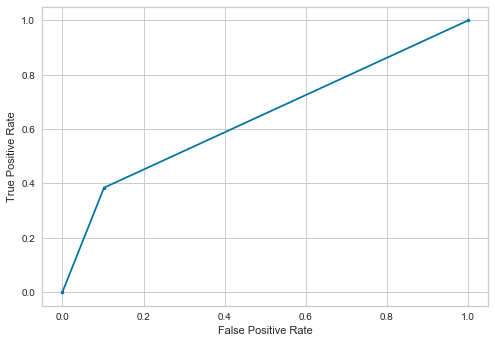

---------Gradient Boosting Classifier------------
Accuracy  (%): 
 77.73661239432285
AUC  (%): 
 59.82955602019997
Precision: 
 43.30913681552786
Recall (%): 
 29.58232282403665
f1 score (%): 
 35.153222965833045
logistic loss :
 7.6895648231755604
              precision    recall  f1-score   support

           0       0.83      0.90      0.87     72406
           1       0.43      0.30      0.35     18555

    accuracy                           0.78     90961
   macro avg       0.63      0.60      0.61     90961
weighted avg       0.75      0.78      0.76     90961



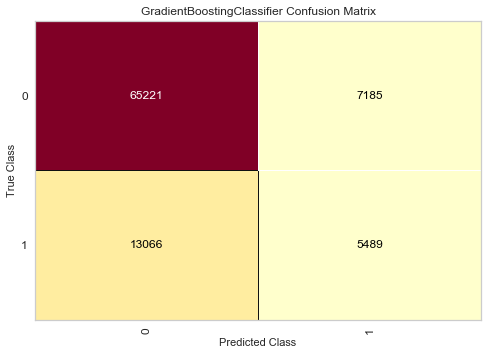

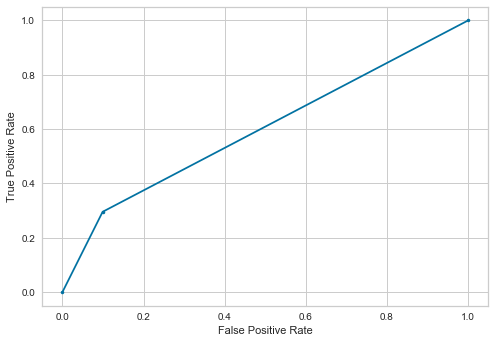

,classifier,Precision,Recall,AUC,Accuracy
0,Logistic Regression,29.487179,0.371867,50.071993,79.495608
1,Nearest Neighbors,42.896998,52.206952,67.198827,76.074362
2,Decision Tree,55.088767,72.578820,78.707856,82.336386
3,Naive Bayes,23.032630,1.940178,50.139357,78.674377
4,Random Forest,67.060553,63.923471,77.938588,86.235859
5,xgboost,54.933781,47.615198,68.802489,81.345852
6,Ada Boost,40.416362,29.819456,59.276907,76.716395
7,SVM,32.446809,0.328752,50.076676,79.528589
8,MLP Classifier,37.904882,25.858259,57.501403,76.234870
9,light Gradient Boosting,48.976929,38.442468,64.089753,79.273535


,classifier,Precision,Recall,AUC,Accuracy
0,Logistic Regression,29.487179,0.371867,50.071993,79.495608
1,Nearest Neighbors,42.896998,52.206952,67.198827,76.074362
2,Decision Tree,55.088767,72.578820,78.707856,82.336386
3,Naive Bayes,23.032630,1.940178,50.139357,78.674377
4,Random Forest,67.060553,63.923471,77.938588,86.235859
5,xgboost,54.933781,47.615198,68.802489,81.345852
6,Ada Boost,40.416362,29.819456,59.276907,76.716395
7,SVM,32.446809,0.328752,50.076676,79.528589
8,MLP Classifier,37.904882,25.858259,57.501403,76.234870
9,light Gradient Boosting,48.976929,38.442468,64.089753,79.273535


In [37]:
t3.fit_model_us(df,'return',min_max=True)

delivery_time_hours           28.756199
unit_price                    12.942441
lng                           12.661005
lat                           12.428433
total_amount_expected         10.284779
Sub Category                   5.926504
r_day                          4.740924
Category                       4.682868
order_day                      4.528039
days_taken                     1.750866
channel_TELESALES_COMMANDO     0.423530
channel_CUSTOMER_APP           0.407779
channel_AGENT_APP              0.351493
channel_ADMIN_COMMANDO         0.115141
dtype: float64
Selected Features =['delivery_time_hours', 'unit_price', 'lng', 'lat', 'total_amount_expected', 'Sub Category']
---------Logistic Regression------------
Accuracy  (%): 
 79.60114774463781
AUC  (%): 
 50.0
Precision: 
 0.0
Recall (%): 
 0.0
f1 score (%): 
 0.0
logistic loss :
 7.045513967607741
              precision    recall  f1-score   support

           0       0.80      1.00      0.89     72406
           1       0.

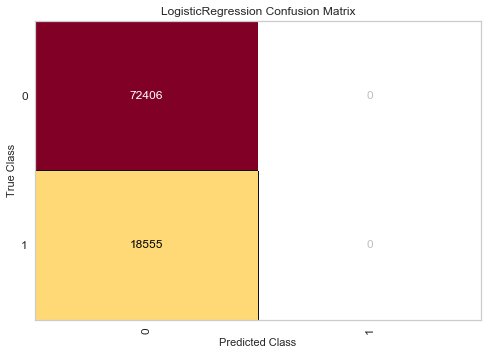

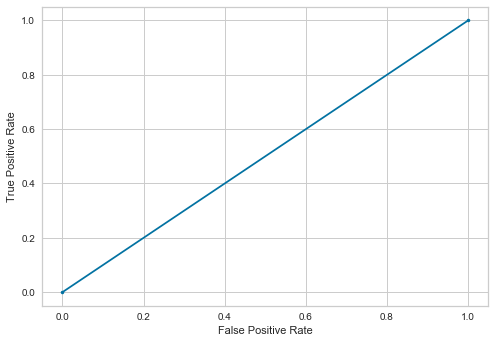

---------Nearest Neighbors------------
Accuracy  (%): 
 76.15461571442707
AUC  (%): 
 68.21122520943219
Precision: 
 43.3209766074396
Recall (%): 
 54.79385610347616
f1 score (%): 
 48.38663620788121
logistic loss :
 8.236020890828256
              precision    recall  f1-score   support

           0       0.88      0.82      0.84     72406
           1       0.43      0.55      0.48     18555

    accuracy                           0.76     90961
   macro avg       0.65      0.68      0.66     90961
weighted avg       0.79      0.76      0.77     90961



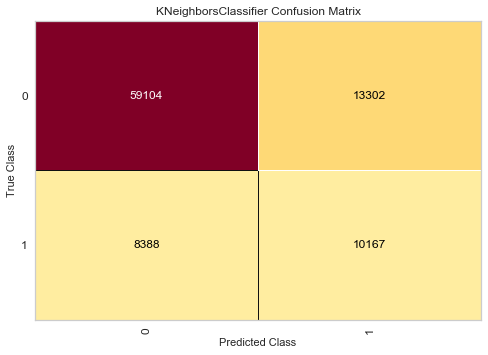

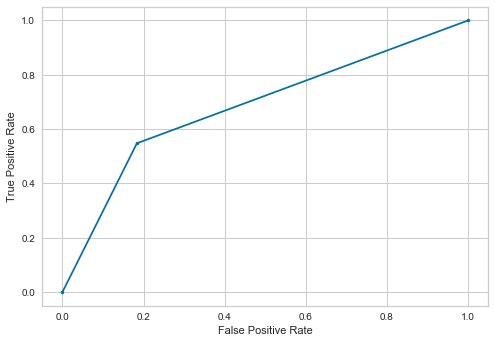

---------Decision Tree------------
Accuracy  (%): 
 79.27793230065633
AUC  (%): 
 74.7906199504541
Precision: 
 49.41749881122207
Recall (%): 
 67.21099434114794
f1 score (%): 
 56.95690895389463
logistic loss :
 7.157260838478776
              precision    recall  f1-score   support

           0       0.91      0.82      0.86     72406
           1       0.49      0.67      0.57     18555

    accuracy                           0.79     90961
   macro avg       0.70      0.75      0.72     90961
weighted avg       0.82      0.79      0.80     90961



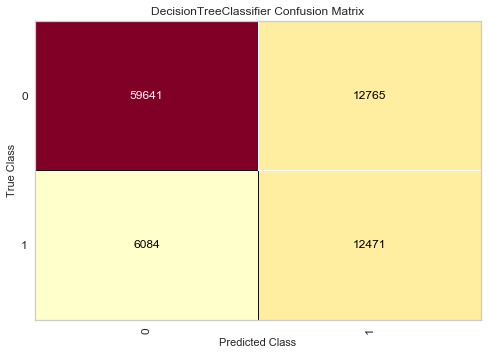

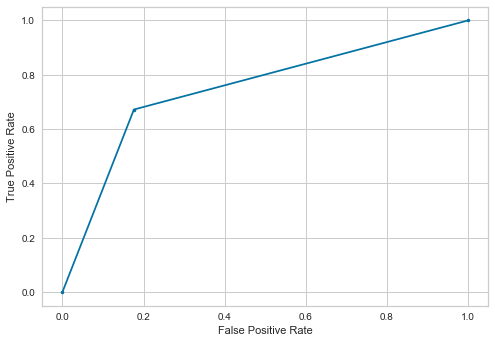

---------Naive Bayes------------
Accuracy  (%): 
 78.757929222414
AUC  (%): 
 49.95935815327048
Precision: 
 19.44223107569721
Recall (%): 
 1.3150094314201024
f1 score (%): 
 2.463402322059566
logistic loss :
 7.336760214767495
              precision    recall  f1-score   support

           0       0.80      0.99      0.88     72406
           1       0.19      0.01      0.02     18555

    accuracy                           0.79     90961
   macro avg       0.50      0.50      0.45     90961
weighted avg       0.67      0.79      0.71     90961



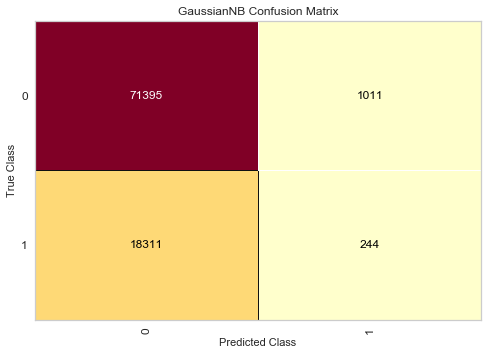

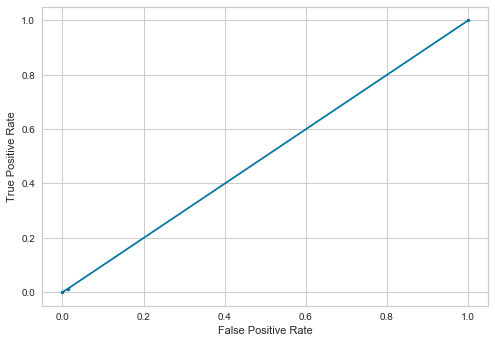

---------Random Forest------------
Accuracy  (%): 
 83.52810545178703
AUC  (%): 
 75.54833774277093
Precision: 
 59.17685746583084
Recall (%): 
 62.069523039611965
f1 score (%): 
 60.58868400978509
logistic loss :
 5.689260666950998
              precision    recall  f1-score   support

           0       0.90      0.89      0.90     72406
           1       0.59      0.62      0.61     18555

    accuracy                           0.84     90961
   macro avg       0.75      0.76      0.75     90961
weighted avg       0.84      0.84      0.84     90961



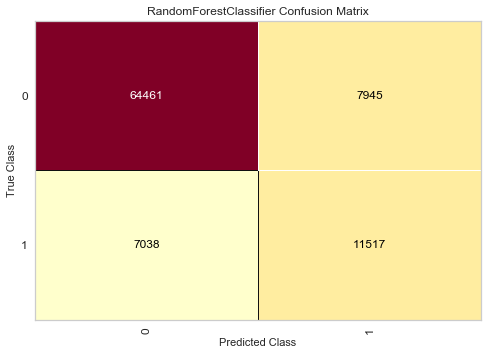

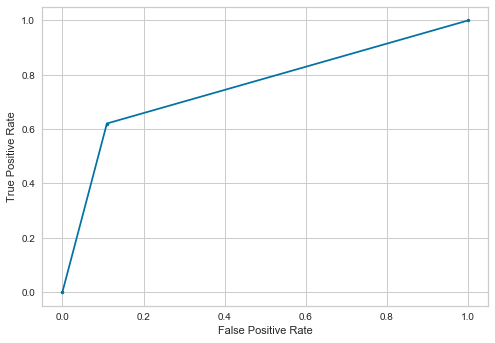

---------xgboost------------
Accuracy  (%): 
 80.20360374226317
AUC  (%): 
 67.12903174591868
Precision: 
 51.69470559129144
Recall (%): 
 45.04446240905416
f1 score (%): 
 48.14100164156323
logistic loss :
 6.837501691923864
              precision    recall  f1-score   support

           0       0.86      0.89      0.88     72406
           1       0.52      0.45      0.48     18555

    accuracy                           0.80     90961
   macro avg       0.69      0.67      0.68     90961
weighted avg       0.79      0.80      0.80     90961



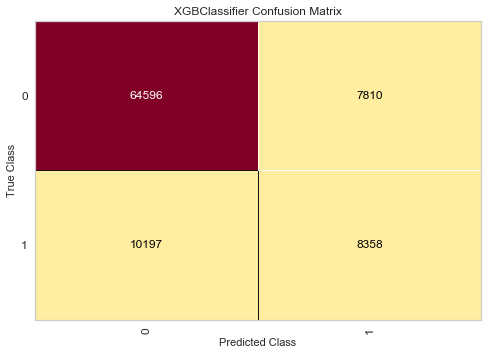

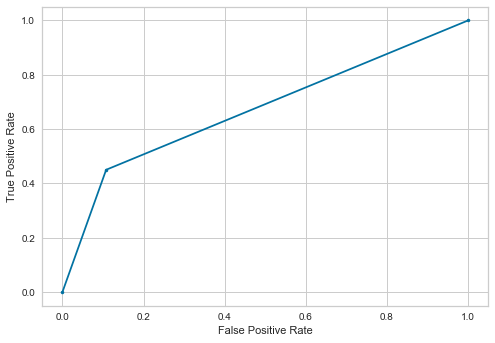

---------Ada Boost------------
Accuracy  (%): 
 75.40154571739536
AUC  (%): 
 59.982172631999596
Precision: 
 38.36359205556232
Recall (%): 
 33.936944219886826
f1 score (%): 
 36.014755926677914
logistic loss :
 8.496094055291035
              precision    recall  f1-score   support

           0       0.84      0.86      0.85     72406
           1       0.38      0.34      0.36     18555

    accuracy                           0.75     90961
   macro avg       0.61      0.60      0.60     90961
weighted avg       0.74      0.75      0.75     90961



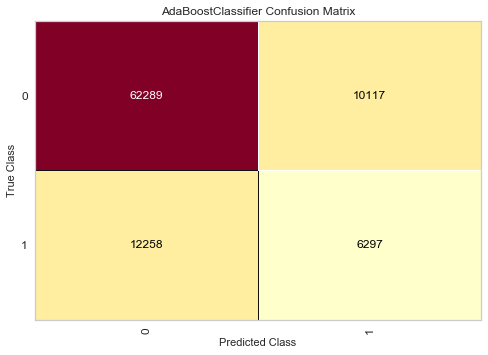

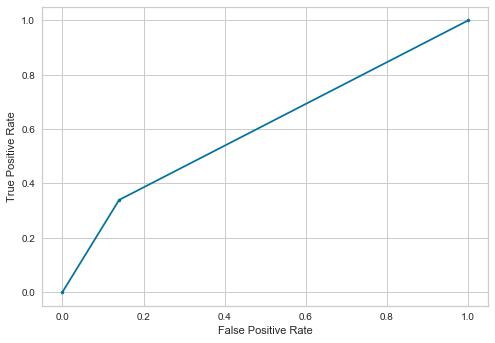

---------SVM------------
Accuracy  (%): 
 79.60004837237938
AUC  (%): 
 49.99930944949313
Precision: 
 0.0
Recall (%): 
 0.0
f1 score (%): 
 0.0
logistic loss :
 7.045893686124383
              precision    recall  f1-score   support

           0       0.80      1.00      0.89     72406
           1       0.00      0.00      0.00     18555

    accuracy                           0.80     90961
   macro avg       0.40      0.50      0.44     90961
weighted avg       0.63      0.80      0.71     90961



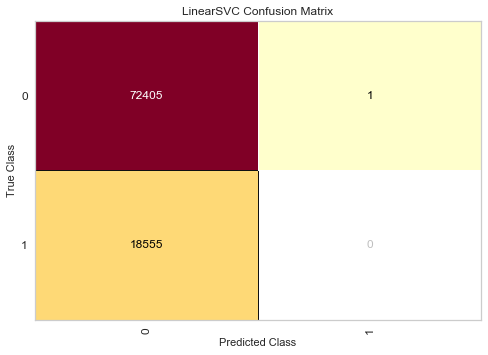

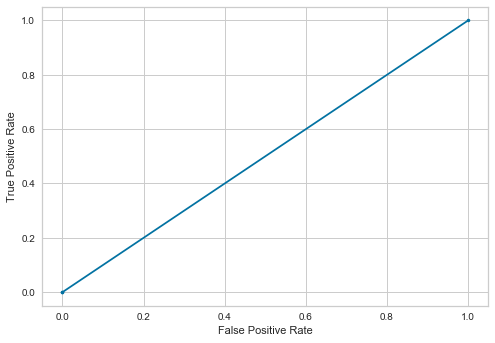

---------MLP Classifier------------
Accuracy  (%): 
 75.41473818449666
AUC  (%): 
 57.491295472229844
Precision: 
 36.310037388553354
Recall (%): 
 27.216383724063594
f1 score (%): 
 31.112343283122325
logistic loss :
 8.49152647127257
              precision    recall  f1-score   support

           0       0.82      0.88      0.85     72406
           1       0.36      0.27      0.31     18555

    accuracy                           0.75     90961
   macro avg       0.59      0.57      0.58     90961
weighted avg       0.73      0.75      0.74     90961



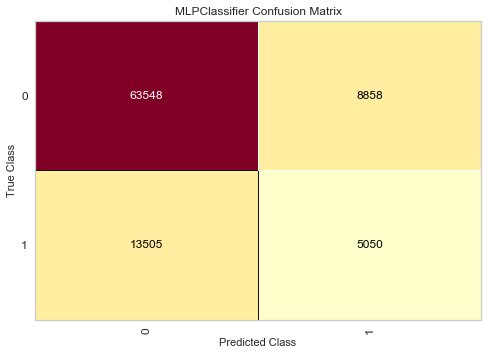

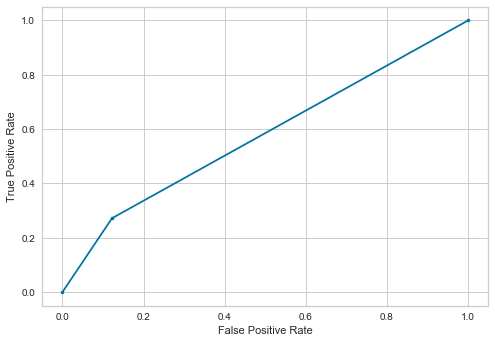

---------light Gradient Boosting------------
Accuracy  (%): 
 78.81619595211134
AUC  (%): 
 63.830542314638805
Precision: 
 47.62126865671642
Recall (%): 
 38.51791969819456
f1 score (%): 
 42.588564788606504
logistic loss :
 7.316695814568142
              precision    recall  f1-score   support

           0       0.85      0.89      0.87     72406
           1       0.48      0.39      0.43     18555

    accuracy                           0.79     90961
   macro avg       0.66      0.64      0.65     90961
weighted avg       0.77      0.79      0.78     90961



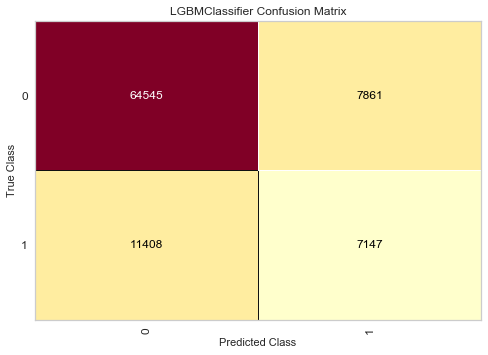

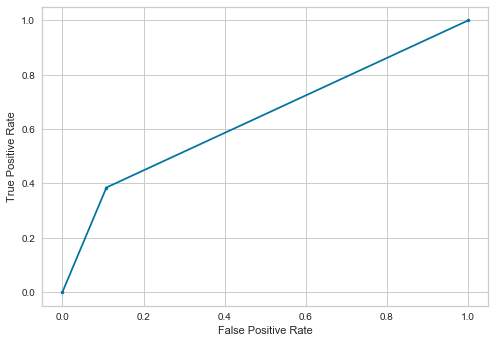

---------Gradient Boosting Classifier------------
Accuracy  (%): 
 76.64823385846682
AUC  (%): 
 60.37444942134547
Precision: 
 40.980523841504365
Recall (%): 
 32.88601455133387
f1 score (%): 
 36.48975930632381
logistic loss :
 8.065491543260457
              precision    recall  f1-score   support

           0       0.84      0.88      0.86     72406
           1       0.41      0.33      0.36     18555

    accuracy                           0.77     90961
   macro avg       0.62      0.60      0.61     90961
weighted avg       0.75      0.77      0.76     90961



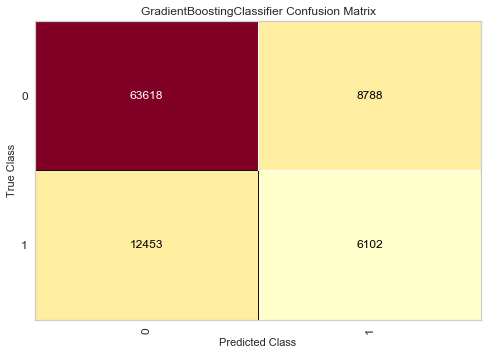

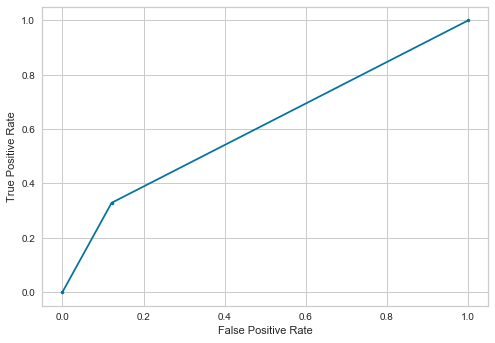

,classifier,Precision,Recall,AUC,Accuracy
0,Logistic Regression,0.000000,0.000000,50.000000,79.601148
1,Nearest Neighbors,43.320977,54.793856,68.211225,76.154616
2,Decision Tree,49.417499,67.210994,74.790620,79.277932
3,Naive Bayes,19.442231,1.315009,49.959358,78.757929
4,Random Forest,59.176857,62.069523,75.548338,83.528105
5,xgboost,51.694706,45.044462,67.129032,80.203604
6,Ada Boost,38.363592,33.936944,59.982173,75.401546
7,SVM,0.000000,0.000000,49.999309,79.600048
8,MLP Classifier,36.310037,27.216384,57.491295,75.414738
9,light Gradient Boosting,47.621269,38.517920,63.830542,78.816196


,classifier,Precision,Recall,AUC,Accuracy
0,Logistic Regression,0.000000,0.000000,50.000000,79.601148
1,Nearest Neighbors,43.320977,54.793856,68.211225,76.154616
2,Decision Tree,49.417499,67.210994,74.790620,79.277932
3,Naive Bayes,19.442231,1.315009,49.959358,78.757929
4,Random Forest,59.176857,62.069523,75.548338,83.528105
5,xgboost,51.694706,45.044462,67.129032,80.203604
6,Ada Boost,38.363592,33.936944,59.982173,75.401546
7,SVM,0.000000,0.000000,49.999309,79.600048
8,MLP Classifier,36.310037,27.216384,57.491295,75.414738
9,light Gradient Boosting,47.621269,38.517920,63.830542,78.816196


In [38]:
t3.fit_model_RFS_us(df,'return',min_max=True)

_____Cross Validation_____
---------Logistic Regression------------
Mean accuracy  (%): 
 79.75901672417788
Mean AUC  (%): 
 57.10811030358034
Mean Precision: 
 20.0
Mean Recall (%): 
 0.007242440939946356
Mean f1 score (%): 
 0.014479638483393495
---------Nearest Neighbors------------
Mean accuracy  (%): 
 78.39139441629311
Mean AUC  (%): 
 68.46613614613123
Mean Precision: 
 44.005933904326184
Mean Recall (%): 
 24.78002806757303
Mean f1 score (%): 
 31.70326928022221
---------Decision Tree------------
Mean accuracy  (%): 
 80.9500106299334
Mean AUC  (%): 
 71.24354639238528
Mean Precision: 
 52.83410720554469
Mean Recall (%): 
 55.01285621781192
Mean f1 score (%): 
 53.980417340593064
---------Naive Bayes------------
Mean accuracy  (%): 
 79.44606025877738
Mean AUC  (%): 
 63.307201989690874
Mean Precision: 
 29.966555766208536
Mean Recall (%): 
 1.2056861094887124
Mean f1 score (%): 
 2.302756088976784
---------Random Forest------------
Mean accuracy  (%): 
 83.88021595899457
Mean 

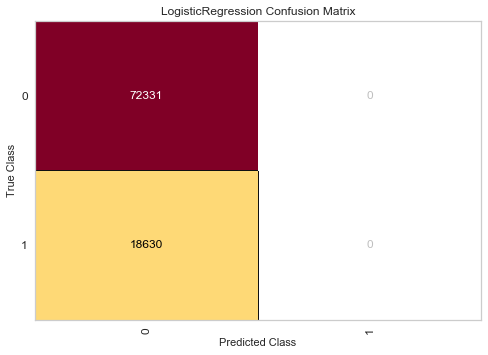

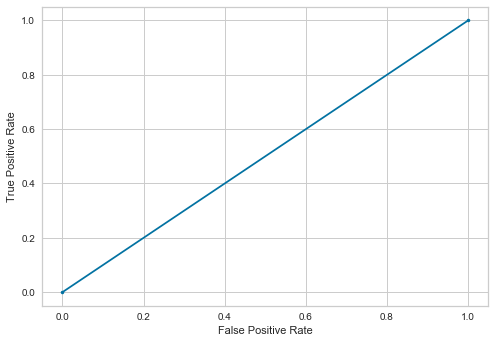

---------Nearest Neighbors------------
Accuracy  (%): 
 79.38457140972504
AUC  (%): 
 61.847214911605484
Precision: 
 49.495784427178044
Recall (%): 
 32.14170692431562
f1 score (%): 
 38.974225462119236
logistic loss :
 7.1203704939222705
              precision    recall  f1-score   support

           0       0.84      0.92      0.88     72331
           1       0.49      0.32      0.39     18630

    accuracy                           0.79     90961
   macro avg       0.67      0.62      0.63     90961
weighted avg       0.77      0.79      0.78     90961



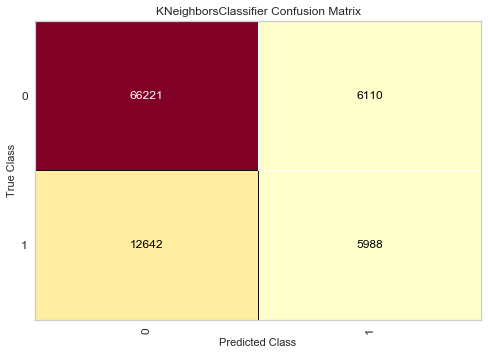

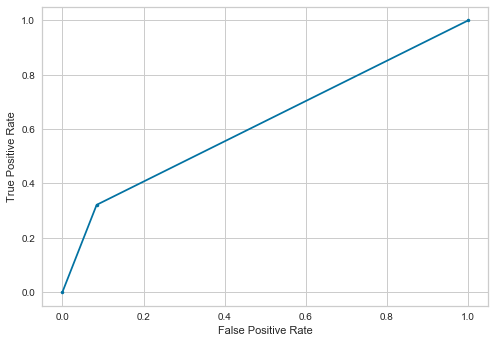

---------Decision Tree------------
Accuracy  (%): 
 84.39880828047185
AUC  (%): 
 76.75229911799954
Precision: 
 61.480370351212954
Recall (%): 
 63.80032206119163
f1 score (%): 
 62.61886573769196
logistic loss :
 5.388526186192327
              precision    recall  f1-score   support

           0       0.91      0.90      0.90     72331
           1       0.61      0.64      0.63     18630

    accuracy                           0.84     90961
   macro avg       0.76      0.77      0.76     90961
weighted avg       0.85      0.84      0.85     90961



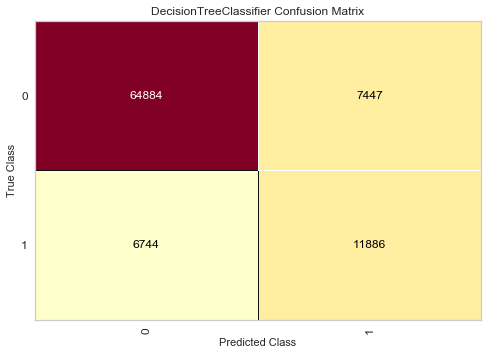

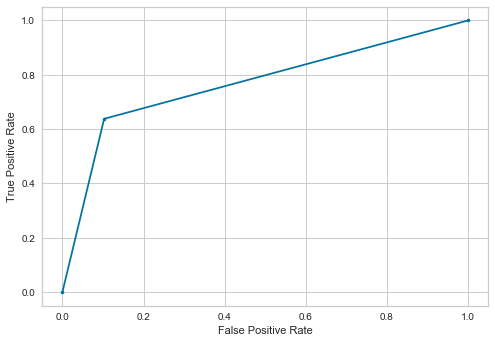

---------Naive Bayes------------
Accuracy  (%): 
 78.65898571915436
AUC  (%): 
 50.08709123522785
Precision: 
 22.308781869688385
Recall (%): 
 1.6908212560386473
f1 score (%): 
 3.1433988623889833
logistic loss :
 7.3709348461031325
              precision    recall  f1-score   support

           0       0.80      0.98      0.88     72331
           1       0.22      0.02      0.03     18630

    accuracy                           0.79     90961
   macro avg       0.51      0.50      0.46     90961
weighted avg       0.68      0.79      0.71     90961



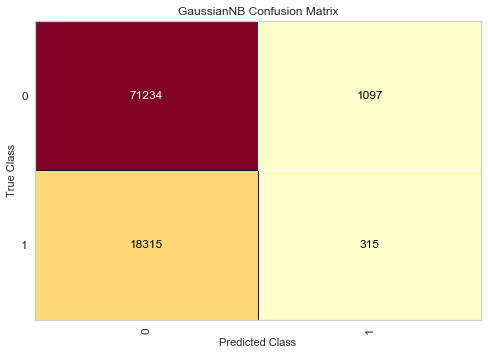

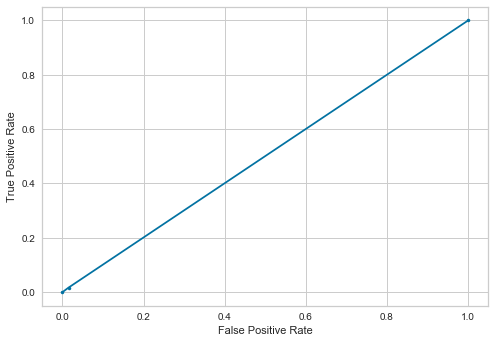

---------Random Forest------------
Accuracy  (%): 
 86.23805806884269
AUC  (%): 
 70.34895194234136
Precision: 
 80.34154090548054
Recall (%): 
 43.435319377348364
f1 score (%): 
 56.38631454254058
logistic loss :
 4.753223756493483
              precision    recall  f1-score   support

           0       0.87      0.97      0.92     72331
           1       0.80      0.43      0.56     18630

    accuracy                           0.86     90961
   macro avg       0.84      0.70      0.74     90961
weighted avg       0.86      0.86      0.85     90961



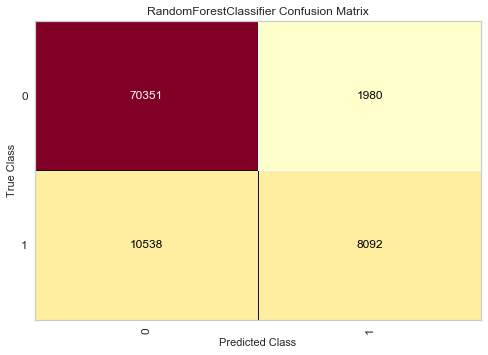

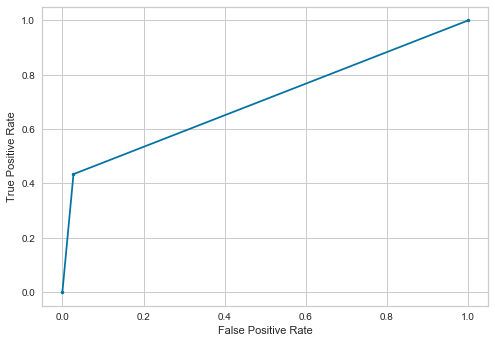

---------xgboost------------
Accuracy  (%): 
 82.68598630182166
AUC  (%): 
 59.96782352774902
Precision: 
 78.10731707317073
Recall (%): 
 21.486849168008586
f1 score (%): 
 33.70237844664281
logistic loss :
 5.980058339197735
              precision    recall  f1-score   support

           0       0.83      0.98      0.90     72331
           1       0.78      0.21      0.34     18630

    accuracy                           0.83     90961
   macro avg       0.81      0.60      0.62     90961
weighted avg       0.82      0.83      0.79     90961



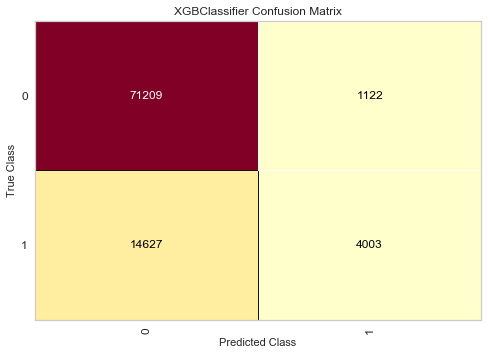

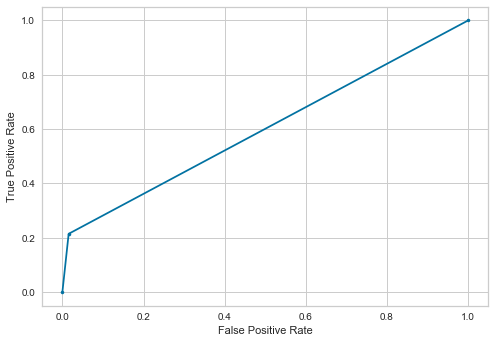

---------Ada Boost------------
Accuracy  (%): 
 79.56266971559239
AUC  (%): 
 50.80077043084265
Precision: 
 52.71739130434783
Recall (%): 
 2.082662372517445
f1 score (%): 
 4.0070226169575545
logistic loss :
 7.058806867133116
              precision    recall  f1-score   support

           0       0.80      1.00      0.89     72331
           1       0.53      0.02      0.04     18630

    accuracy                           0.80     90961
   macro avg       0.66      0.51      0.46     90961
weighted avg       0.74      0.80      0.71     90961



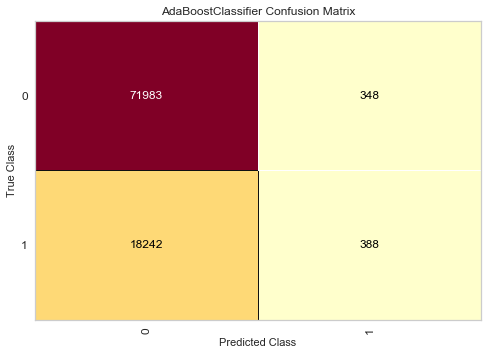

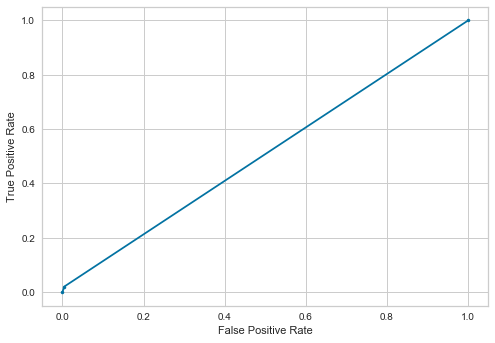

---------SVM------------
Accuracy  (%): 
 79.51869482525478
AUC  (%): 
 50.0
Precision: 
 0.0
Recall (%): 
 0.0
f1 score (%): 
 0.0
logistic loss :
 7.0739921970645225
              precision    recall  f1-score   support

           0       0.80      1.00      0.89     72331
           1       0.00      0.00      0.00     18630

    accuracy                           0.80     90961
   macro avg       0.40      0.50      0.44     90961
weighted avg       0.63      0.80      0.70     90961



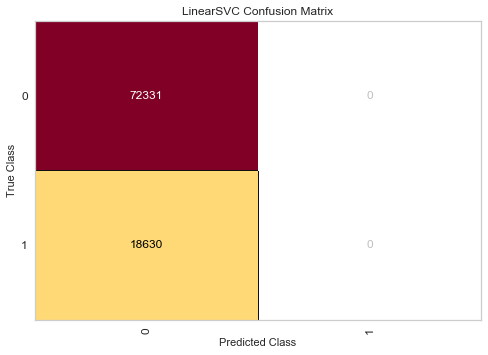

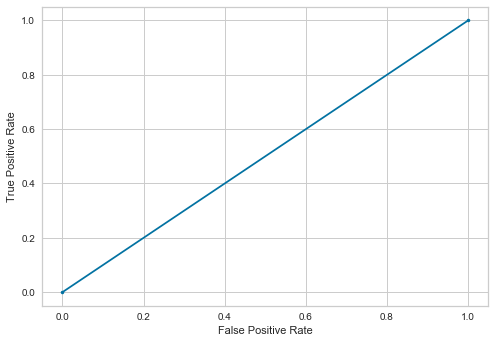

---------MLP Classifier------------
Accuracy  (%): 
 79.53408603687294
AUC  (%): 
 50.073440186739774
Precision: 
 64.0
Recall (%): 
 0.17176596886741813
f1 score (%): 
 0.3426124197002141
logistic loss :
 7.068676419129199
              precision    recall  f1-score   support

           0       0.80      1.00      0.89     72331
           1       0.64      0.00      0.00     18630

    accuracy                           0.80     90961
   macro avg       0.72      0.50      0.44     90961
weighted avg       0.76      0.80      0.71     90961



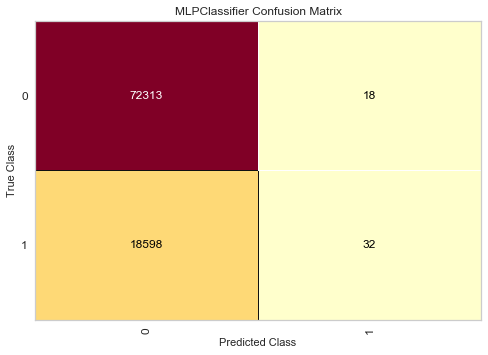

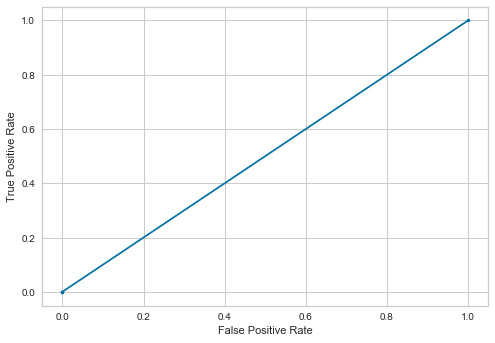

---------light Gradient Boosting------------
Accuracy  (%): 
 80.97096557865459
AUC  (%): 
 54.756843599954955
Precision: 
 76.03468663776114
Recall (%): 
 10.35426731078905
f1 score (%): 
 18.226484622289412
logistic loss :
 6.572400993554893
              precision    recall  f1-score   support

           0       0.81      0.99      0.89     72331
           1       0.76      0.10      0.18     18630

    accuracy                           0.81     90961
   macro avg       0.79      0.55      0.54     90961
weighted avg       0.80      0.81      0.75     90961



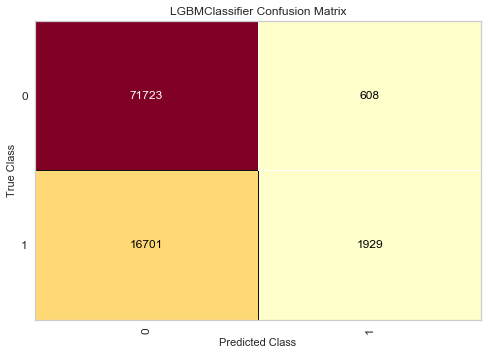

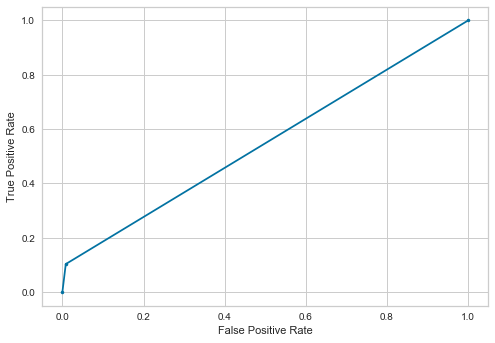

---------Gradient Boosting Classifier------------
Accuracy  (%): 
 79.82322094084277
AUC  (%): 
 51.207694960929636
Precision: 
 68.64064602960968
Recall (%): 
 2.737520128824477
f1 score (%): 
 5.2650596190574515
logistic loss :
 6.968814651136168
              precision    recall  f1-score   support

           0       0.80      1.00      0.89     72331
           1       0.69      0.03      0.05     18630

    accuracy                           0.80     90961
   macro avg       0.74      0.51      0.47     90961
weighted avg       0.78      0.80      0.72     90961



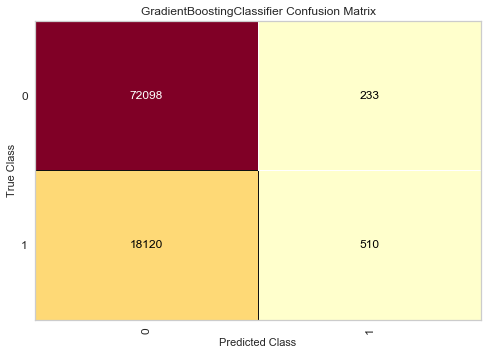

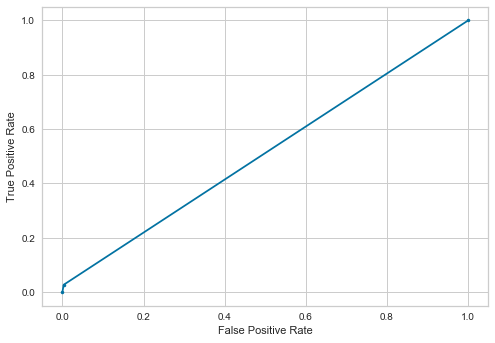

,classifier,Precision,Recall,AUC,Accuracy
0,Logistic Regression,0.000000,0.000000,50.000000,79.518695
1,Nearest Neighbors,49.495784,32.141707,61.847215,79.384571
2,Decision Tree,61.480370,63.800322,76.752299,84.398808
3,Naive Bayes,22.308782,1.690821,50.087091,78.658986
4,Random Forest,80.341541,43.435319,70.348952,86.238058
5,xgboost,78.107317,21.486849,59.967824,82.685986
6,Ada Boost,52.717391,2.082662,50.800770,79.562670
7,SVM,0.000000,0.000000,50.000000,79.518695
8,MLP Classifier,64.000000,0.171766,50.073440,79.534086
9,light Gradient Boosting,76.034687,10.354267,54.756844,80.970966


,classifier,Precision,Recall,AUC,Accuracy
0,Logistic Regression,0.000000,0.000000,50.000000,79.518695
1,Nearest Neighbors,49.495784,32.141707,61.847215,79.384571
2,Decision Tree,61.480370,63.800322,76.752299,84.398808
3,Naive Bayes,22.308782,1.690821,50.087091,78.658986
4,Random Forest,80.341541,43.435319,70.348952,86.238058
5,xgboost,78.107317,21.486849,59.967824,82.685986
6,Ada Boost,52.717391,2.082662,50.800770,79.562670
7,SVM,0.000000,0.000000,50.000000,79.518695
8,MLP Classifier,64.000000,0.171766,50.073440,79.534086
9,light Gradient Boosting,76.034687,10.354267,54.756844,80.970966


In [39]:
t3.fit_model_CV(df,'return',min_max=True)

This approach of encoding and distribution correction is ineffective

Performing PCA reduction to visualize if the dataset is overlapping

In [21]:
df3

,channel,lat,lng,unit_price,total_amount_expected,days_taken,delivery_time_hours,return,Category,Sub Category,order_day,r_day
0,2,0.000000,0.00000,117000.0,11700000.0,10.0,3.152177,0,18,35,3,6
1,2,0.000000,0.00000,24000.0,240000.0,9.0,1.550735,0,18,22,4,6
2,2,0.000000,0.00000,64000.0,3200000.0,9.0,1.420405,0,18,22,4,6
3,2,0.000000,0.00000,128000.0,12800000.0,9.0,1.420405,0,18,35,4,6
4,2,0.000000,0.00000,58000.0,1450000.0,9.0,1.420405,0,18,35,4,6
...,...,...,...,...,...,...,...,...,...,...,...,...
454799,2,24.915066,67.02645,9180.0,330480.0,1.0,1.713216,0,3,42,6,7
454800,2,24.915066,67.02645,1260.0,3780.0,1.0,1.713216,0,12,49,6,7
454801,2,24.915066,67.02645,1075.0,5375.0,1.0,1.713216,0,12,37,6,7
454802,2,24.915066,67.02645,8480.0,339200.0,1.0,1.713216,0,12,28,6,7


In [22]:
df3.to_csv('df3.csv',index=False)

In [2]:
df3=pd.read_csv('df3.csv')

In [23]:
x=np.asarray(df3.drop(['return'],axis=1))
y=np.asarray(df3['return'])

In [24]:
from sklearn.preprocessing import MinMaxScaler
mm = MinMaxScaler()
x = mm.fit_transform(x)
from imblearn.under_sampling import RandomUnderSampler
ros = RandomUnderSampler(random_state=0)
x,y = ros.fit_resample(x,y)

x.shape, y.shape

((185286, 11), (185286,))

In [25]:
from sklearn.decomposition import PCA
pca=PCA(n_components=2)

In [26]:
x = pca.fit_transform(x)

In [27]:
sc= pd.DataFrame({'var1':x[:,0],'var2':x[:,1], 'target':y})

In [28]:
sc

,var1,var2,target
0,1.034393,0.602739,0
1,1.078696,-0.379897,0
2,-0.406799,-0.023876,0
3,-0.318564,0.300208,0
4,-0.399934,0.252132,0
...,...,...,...
185281,-0.398316,0.348729,1
185282,-0.383104,-0.087092,1
185283,-0.375846,-0.246956,1
185284,-0.375025,-0.295369,1


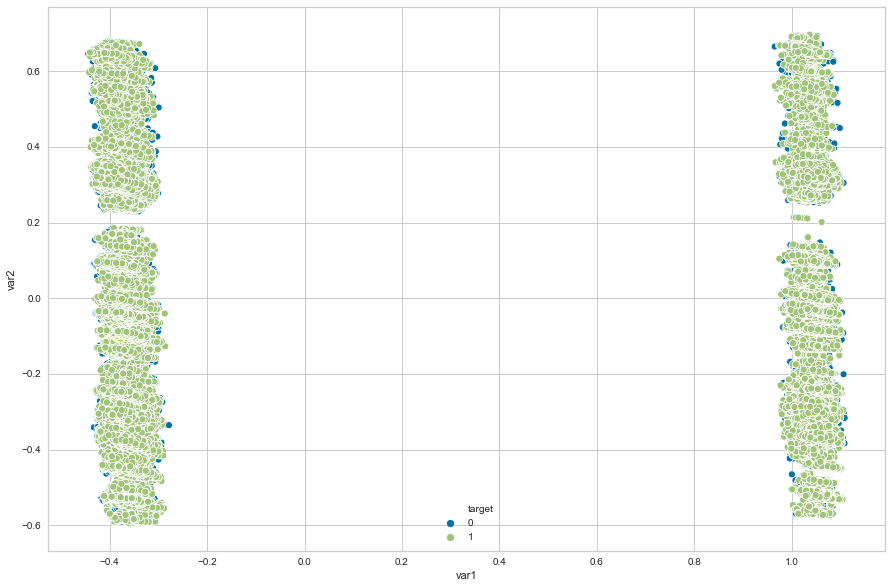

In [29]:
plt.figure(figsize=(15,10))
sns.scatterplot(sc.var1,sc.var2, hue= sc.target)

PCA results show that data is very much overlapped

In [30]:
x=np.asarray(df3.drop(['return'],axis=1))
y=np.asarray(df3['return'])
from sklearn.decomposition import PCA
pca=PCA(n_components=3)
x = pca.fit_transform(x)
sc= pd.DataFrame({'var1':x[:,0],'var2':x[:,1],'var3':x[:,2], 'target':y})
sc

,var1,var2,var3,target
0,1.163111e+07,109974.734099,53.390621,0
1,1.710656e+05,22168.573448,53.951029,0
2,3.131083e+06,60827.056828,53.638822,0
3,1.273111e+07,120476.198082,53.287887,0
4,1.381081e+06,55620.176989,53.795039,0
...,...,...,...,...
454799,2.615389e+05,7307.563878,-17.293769,0
454800,-6.516469e+04,-464.373028,-17.140516,0
454801,-6.356977e+04,-650.092515,-17.247378,0
454802,2.702586e+05,6603.615060,-17.387542,0


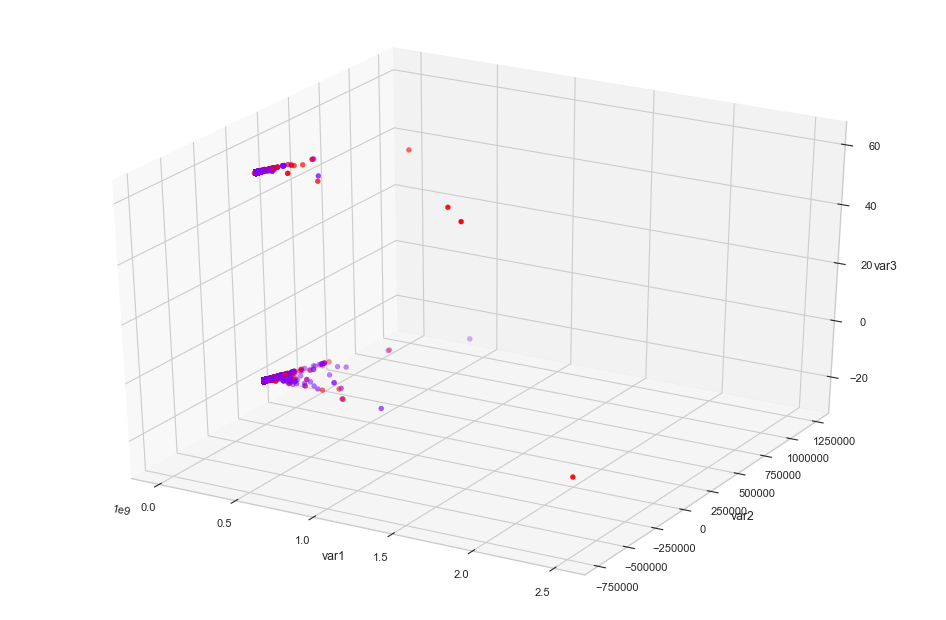

In [31]:
from mpl_toolkits.mplot3d import Axes3D
fig = plt.figure(num=None, figsize=(15, 10), dpi=80, facecolor='w', edgecolor='k')
ax = plt.axes(projection="3d")

ax.scatter3D(sc['var1'],sc['var2'],sc['var3'],c=sc['target'], cmap='rainbow')

xLabel = ax.set_xlabel('var1', linespacing=3.2)
yLabel = ax.set_ylabel('var2', linespacing=3.1)
zLabel = ax.set_zlabel('var3', linespacing=3.4)

changing scaling to standard scalar

(185286, 11)
(185286,)


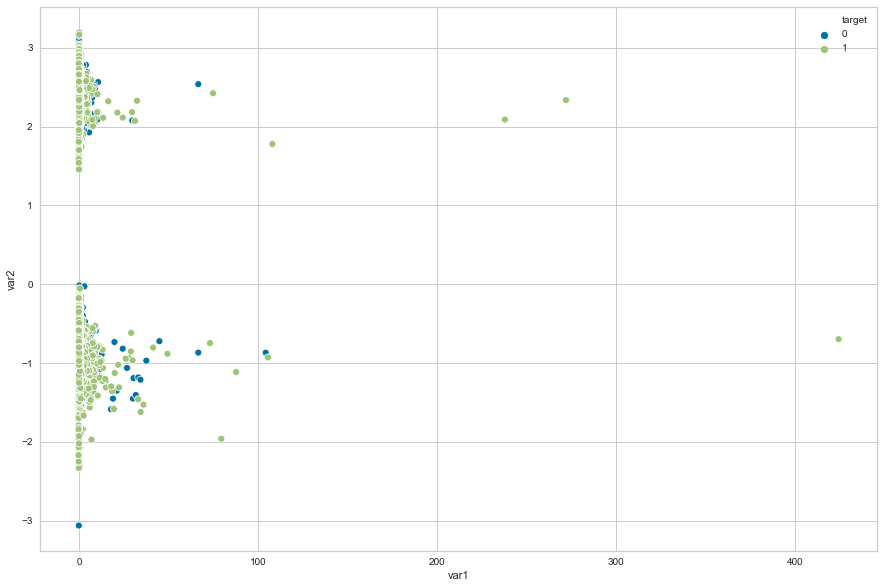

In [32]:
x=np.asarray(df3.drop(['return'],axis=1))
y=np.asarray(df3['return'])
from sklearn.preprocessing import StandardScaler
ss=StandardScaler()
x = ss.fit_transform(x)
from imblearn.under_sampling import RandomUnderSampler
ros = RandomUnderSampler(random_state=0)
x,y = ros.fit_resample(x,y)
print(x.shape)
print(y.shape)
from sklearn.decomposition import PCA
pca=PCA(n_components=2)
x = pca.fit_transform(x)
sc= pd.DataFrame({'var1':x[:,0],'var2':x[:,1], 'target':y})
plt.figure(figsize=(15,10))
sns.scatterplot(sc.var1,sc.var2, hue= sc.target)

(185286, 11)
(185286,)


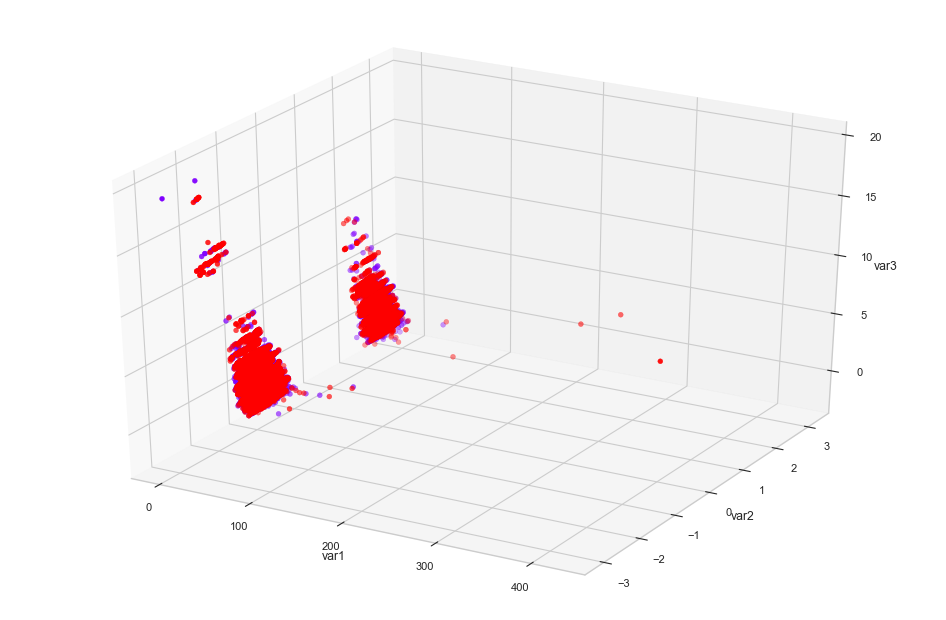

In [33]:
x=np.asarray(df3.drop(['return'],axis=1))
y=np.asarray(df3['return'])
from sklearn.preprocessing import StandardScaler
ss=StandardScaler()
x = ss.fit_transform(x)
from imblearn.under_sampling import RandomUnderSampler
ros = RandomUnderSampler(random_state=0)
x,y = ros.fit_resample(x,y)
print(x.shape)
print(y.shape)
from sklearn.decomposition import PCA
pca=PCA(n_components=3)
x = pca.fit_transform(x)
sc= pd.DataFrame({'var1':x[:,0],'var2':x[:,1],'var3':x[:,2], 'target':y})
from mpl_toolkits.mplot3d import Axes3D
fig = plt.figure(num=None, figsize=(15, 10), dpi=80, facecolor='w', edgecolor='k')
ax = plt.axes(projection="3d")

ax.scatter3D(sc['var1'],sc['var2'],sc['var3'],c=sc['target'], cmap='rainbow')

xLabel = ax.set_xlabel('var1', linespacing=3.2)
yLabel = ax.set_ylabel('var2', linespacing=3.1)
zLabel = ax.set_zlabel('var3', linespacing=3.4)

Using standard scalar with pca produces better results for both 2 and 3 components respectively. Uptil now decsion tree, random forest are performing better with decision tree reaching highest recall of 71

SVM with kernel other than linear outweighs computational capabilities available therefore it was a forced decision to to apply svm on pca results

Since the data is overlapped therefore using SVM would be most appropriate as through kernel functions it is possible to separate data points which otherwise is not possible. http://www.eric-kim.net/eric-kim-net/posts/1/kernel_trick.html

In [3]:
def SVM_classifier(df,label, svmtype="SVC",kernel='poly',over_sample=False,under_sample=False,clf=None,min_max=False):
    import pandas as pd
    import numpy as np
    from sklearn import metrics
    from sklearn.metrics import classification_report
    from sklearn.metrics import f1_score
    from sklearn.metrics import accuracy_score
    from sklearn.metrics import precision_score
    from sklearn.metrics import recall_score
    from sklearn.metrics import roc_curve
    from sklearn.metrics import roc_auc_score
    from sklearn import svm
    from sklearn.metrics import auc 
    from sklearn.metrics import log_loss
    from matplotlib import pyplot
    from yellowbrick.classifier import ConfusionMatrix
    if not clf:
        if svmtype == "Linear":
            clf = svm.LinearSVC()
        else:
            clf = svm.SVC(kernel=kernel)
    from sklearn.preprocessing import StandardScaler
    x=df.drop([label], axis=1)
    y=df[label]
    if min_max==True:
        from sklearn.preprocessing import MinMaxScaler
        mm = MinMaxScaler()
        for i in x.columns:
            x[i] = mm.fit_transform(x[[i]])
    else:
        from sklearn.preprocessing import StandardScaler
        ss=StandardScaler()
        for i in x.columns:
            x[i] = ss.fit_transform(x[[i]])
    if over_sample==True:
        from imblearn.over_sampling import RandomOverSampler
        oversample = RandomOverSampler(sampling_strategy=0.5)
        from sklearn.model_selection import train_test_split
        xtrain , xtest , ytrain, ytest =train_test_split(x,y,test_size=0.20,random_state=42 )
        x_res, y_res = oversample.fit_resample(xtrain, ytrain)
        x_train=x_res
        y_train=y_res
    elif under_sample==True:
        from imblearn.under_sampling import RandomUnderSampler
        undersample = RandomUnderSampler(sampling_strategy=0.5)
        from sklearn.model_selection import train_test_split
        xtrain , xtest , ytrain, ytest =train_test_split(x,y,test_size=0.20,random_state=42 )
        x_res, y_res = undersample.fit_resample(xtrain, ytrain)
        x_train=x_res
        y_train=y_res
    else:
        from sklearn.model_selection import train_test_split
        xtrain , xtest , ytrain, ytest =train_test_split(x,y,test_size=0.20,random_state=42 )

    clf.fit(xtrain,ytrain)
    y_pred=clf.predict(xtest)
    print("Accuracy  (%): \n", accuracy_score(ytest, y_pred)*100)
    accuracy=accuracy_score(ytest, y_pred)*100
    fpr , tpr, _ = roc_curve(ytest, y_pred)
    print("AUC  (%): \n",auc(fpr, tpr)*100)
    AUC=auc(fpr, tpr)*100
    print("Precision: \n",precision_score(ytest, y_pred)*100)
    precision=precision_score(ytest, y_pred)*100
    print("Recall (%): \n",recall_score(ytest, y_pred)*100)
    recall=recall_score(ytest,y_pred)*100
    print("f1 score (%): \n",f1_score(ytest, y_pred)*100)
    f1=f1_score(ytest,y_pred)*100
    print('logistic loss :\n',log_loss(ytest,y_pred))
    log=log_loss(ytest,y_pred)
    print(classification_report(ytest,y_pred))
    #print(confusion_matrix(ytest, y_pred))
    visualizer = ConfusionMatrix(clf)
    visualizer.fit(xtrain, ytrain)  
    visualizer.score(xtest,ytest)
    g = visualizer.poof()
    pyplot.plot(fpr, tpr, marker='.')
    pyplot.xlabel('False Positive Rate')
    pyplot.ylabel('True Positive Rate')
    pyplot.show()
    '''import pickle
    filename = name
    pickle.dump(model, open(filename, 'wb'))'''
    return accuracy,AUC,precision,recall,f1,log

(185286, 11)
(185286,)
Accuracy  (%): 
 52.48750580184147
AUC  (%): 
 52.50980964241241
Precision: 
 55.04299226139295
Recall (%): 
 27.61469275068481
f1 score (%): 
 36.77807621044769
logistic loss :
 16.41032438462821
              precision    recall  f1-score   support

           0       0.52      0.77      0.62     46280
           1       0.55      0.28      0.37     46363

    accuracy                           0.52     92643
   macro avg       0.53      0.53      0.49     92643
weighted avg       0.53      0.52      0.49     92643



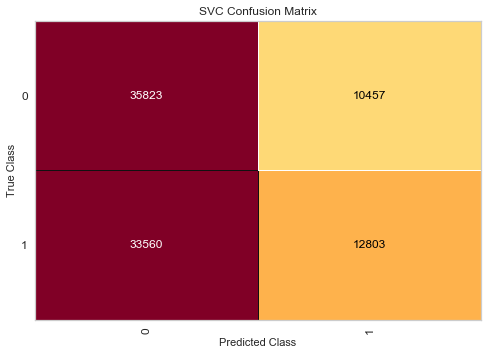

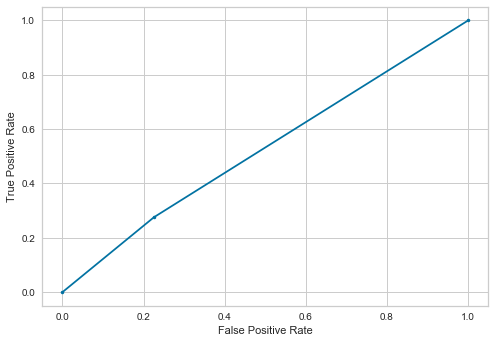

(52.48750580184147,
 52.50980964241241,
 55.04299226139295,
 27.61469275068481,
 36.77807621044769,
 16.41032438462821)

In [35]:
x=np.asarray(df3.drop(['return'],axis=1))
y=np.asarray(df3['return'])
from sklearn.preprocessing import StandardScaler
ss=StandardScaler()
x = ss.fit_transform(x)
from imblearn.under_sampling import RandomUnderSampler
ros = RandomUnderSampler(random_state=0)
x,y = ros.fit_resample(x,y)
print(x.shape)
print(y.shape)
from sklearn.decomposition import PCA
pca=PCA(n_components=2)
x = pca.fit_transform(x)
sc= pd.DataFrame({'var1':x[:,0],'var2':x[:,1], 'target':y})
SVM_classifier(sc,'target')

(185286, 11)
(185286,)


E:\ProgramData\Anaconda3\lib\site-packages\sklearn\utils\deprecation.py:143: FutureWarning: The sklearn.metrics.classification module is  deprecated in version 0.22 and will be removed in version 0.24. The corresponding classes / functions should instead be imported from sklearn.metrics. Anything that cannot be imported from sklearn.metrics is now part of the private API.
  warnings.warn(message, FutureWarning)


Accuracy  (%): 
 56.640941227265365
AUC  (%): 
 56.596394180370254
Precision: 
 54.3353405966097
Recall (%): 
 84.11013524435585
f1 score (%): 
 66.02097783792928
logistic loss :
 14.975971424041004
              precision    recall  f1-score   support

           0       0.65      0.29      0.40     18499
           1       0.54      0.84      0.66     18559

    accuracy                           0.57     37058
   macro avg       0.59      0.57      0.53     37058
weighted avg       0.59      0.57      0.53     37058



E:\ProgramData\Anaconda3\lib\site-packages\sklearn\base.py:213: FutureWarning: From version 0.24, get_params will raise an AttributeError if a parameter cannot be retrieved as an instance attribute. Previously it would return None.
  FutureWarning)


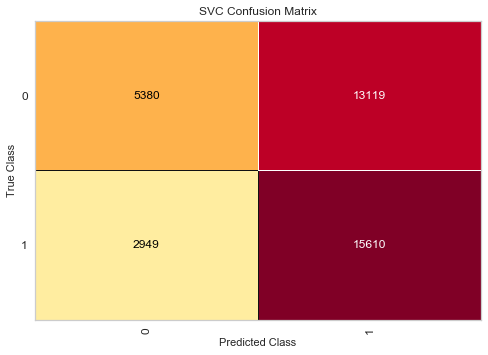

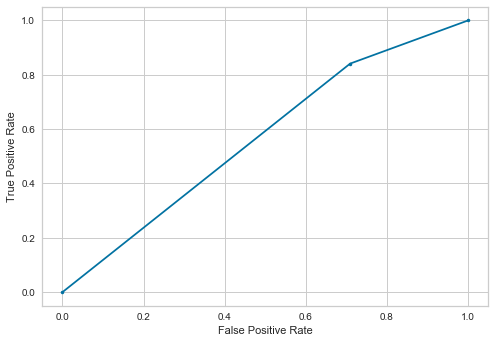

(56.640941227265365,
 56.596394180370254,
 54.3353405966097,
 84.11013524435585,
 66.02097783792928,
 14.975971424041004)

In [4]:
x=np.asarray(df3.drop(['return'],axis=1))
y=np.asarray(df3['return'])
from sklearn.preprocessing import StandardScaler
ss=StandardScaler()
x = ss.fit_transform(x)
from imblearn.under_sampling import RandomUnderSampler
ros = RandomUnderSampler(random_state=0)
x,y = ros.fit_resample(x,y)
print(x.shape)
print(y.shape)
from sklearn.decomposition import PCA
pca=PCA(n_components=2)
x = pca.fit_transform(x)
sc= pd.DataFrame({'var1':x[:,0],'var2':x[:,1], 'target':y})
SVM_classifier(sc,'target',kernel='rbf')

(185286, 11)
(185286,)
Accuracy  (%): 
 48.46993296849195
AUC  (%): 
 48.469790066144256
Precision: 
 48.519411207712835
Recall (%): 
 48.629294911890945
f1 score (%): 
 48.574290915750126
logistic loss :
 17.7980610978311
              precision    recall  f1-score   support

           0       0.48      0.48      0.48     46280
           1       0.49      0.49      0.49     46363

    accuracy                           0.48     92643
   macro avg       0.48      0.48      0.48     92643
weighted avg       0.48      0.48      0.48     92643



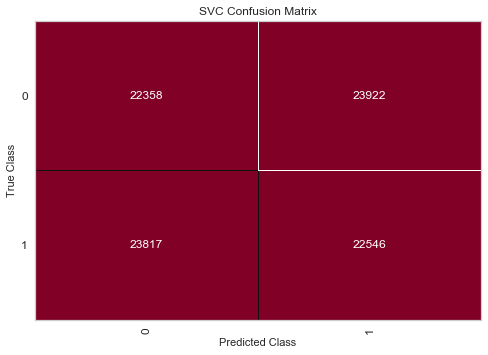

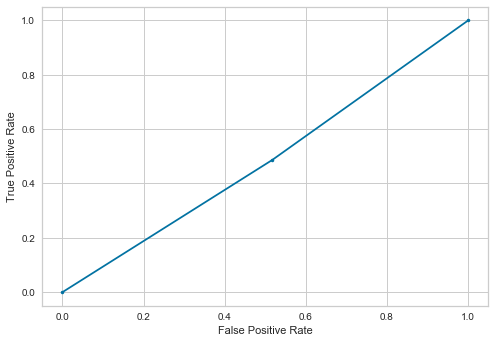

(48.46993296849195,
 48.469790066144256,
 48.519411207712835,
 48.629294911890945,
 48.574290915750126,
 17.7980610978311)

In [37]:
x=np.asarray(df3.drop(['return'],axis=1))
y=np.asarray(df3['return'])
from sklearn.preprocessing import StandardScaler
ss=StandardScaler()
x = ss.fit_transform(x)
from imblearn.under_sampling import RandomUnderSampler
ros = RandomUnderSampler(random_state=0)
x,y = ros.fit_resample(x,y)
print(x.shape)
print(y.shape)
from sklearn.decomposition import PCA
pca=PCA(n_components=2)
x = pca.fit_transform(x)
sc= pd.DataFrame({'var1':x[:,0],'var2':x[:,1], 'target':y})
SVM_classifier(sc,'target',kernel='sigmoid')

(185286, 11)
(185286,)


E:\ProgramData\Anaconda3\lib\site-packages\sklearn\utils\deprecation.py:143: FutureWarning: The sklearn.metrics.classification module is  deprecated in version 0.22 and will be removed in version 0.24. The corresponding classes / functions should instead be imported from sklearn.metrics. Anything that cannot be imported from sklearn.metrics is now part of the private API.
  warnings.warn(message, FutureWarning)


Accuracy  (%): 
 52.7098647496303
AUC  (%): 
 52.73164849063862
Precision: 
 55.36179510883268
Recall (%): 
 28.417056704699867
f1 score (%): 
 37.55647724519319
logistic loss :
 16.333525757595638
              precision    recall  f1-score   support

           0       0.52      0.77      0.62     46280
           1       0.55      0.28      0.38     46363

    accuracy                           0.53     92643
   macro avg       0.54      0.53      0.50     92643
weighted avg       0.54      0.53      0.50     92643



E:\ProgramData\Anaconda3\lib\site-packages\sklearn\base.py:213: FutureWarning: From version 0.24, get_params will raise an AttributeError if a parameter cannot be retrieved as an instance attribute. Previously it would return None.
  FutureWarning)


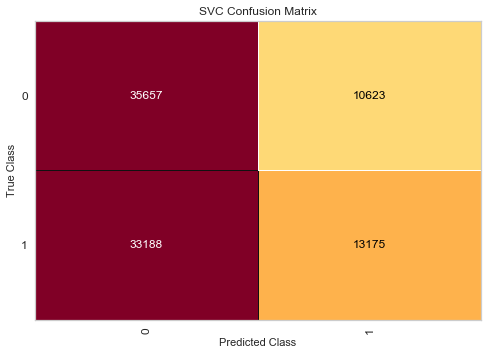

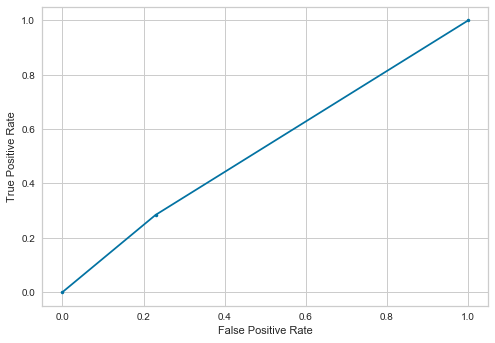

(52.7098647496303,
 52.73164849063862,
 55.36179510883268,
 28.417056704699867,
 37.55647724519319,
 16.333525757595638)

In [4]:
x=np.asarray(df3.drop(['return'],axis=1))
y=np.asarray(df3['return'])
from sklearn.preprocessing import StandardScaler
ss=StandardScaler()
x = ss.fit_transform(x)
from imblearn.under_sampling import RandomUnderSampler
ros = RandomUnderSampler(random_state=0)
x,y = ros.fit_resample(x,y)
print(x.shape)
print(y.shape)
from sklearn.decomposition import PCA
pca=PCA(n_components=3)
x = pca.fit_transform(x)
sc= pd.DataFrame({'var1':x[:,0],'var2':x[:,1],'var3':x[:,2], 'target':y})
SVM_classifier(sc,'target')

(185286, 11)
(185286,)
Accuracy  (%): 
 59.20988720384263
AUC  (%): 
 59.167994544238745
Precision: 
 56.12132418305301
Recall (%): 
 85.04229753758284
f1 score (%): 
 67.61921083072706
logistic loss :
 14.088672109065747
              precision    recall  f1-score   support

           0       0.69      0.33      0.45     18499
           1       0.56      0.85      0.68     18559

    accuracy                           0.59     37058
   macro avg       0.63      0.59      0.56     37058
weighted avg       0.63      0.59      0.56     37058



E:\ProgramData\Anaconda3\lib\site-packages\sklearn\base.py:213: FutureWarning: From version 0.24, get_params will raise an AttributeError if a parameter cannot be retrieved as an instance attribute. Previously it would return None.
  FutureWarning)


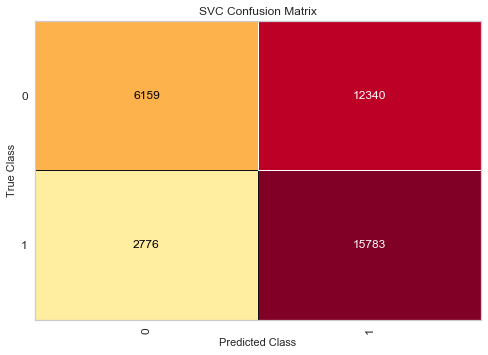

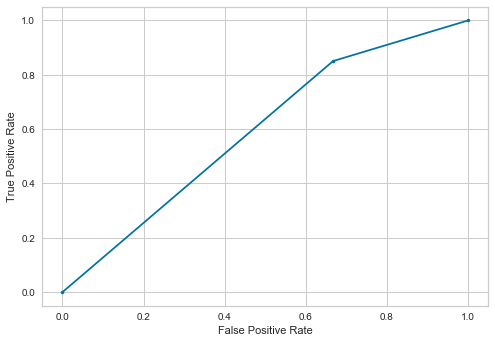

(59.20988720384263,
 59.167994544238745,
 56.12132418305301,
 85.04229753758284,
 67.61921083072706,
 14.088672109065747)

In [5]:
x=np.asarray(df3.drop(['return'],axis=1))
y=np.asarray(df3['return'])
from sklearn.preprocessing import StandardScaler
ss=StandardScaler()
x = ss.fit_transform(x)
from imblearn.under_sampling import RandomUnderSampler
ros = RandomUnderSampler(random_state=0)
x,y = ros.fit_resample(x,y)
print(x.shape)
print(y.shape)
from sklearn.decomposition import PCA
pca=PCA(n_components=3)
x = pca.fit_transform(x)
sc= pd.DataFrame({'var1':x[:,0],'var2':x[:,1],'var3':x[:,2], 'target':y})
SVM_classifier(sc,'target',kernel='rbf')

This is the best recall score that has been achieved uptil now.

Accuracy  (%): 
 52.08812322571592
AUC  (%): 
 52.08808573585571
Precision: 
 52.13105560588412
Recall (%): 
 52.12993119513405
f1 score (%): 
 52.13049339444594
logistic loss :
 16.54836753242737
              precision    recall  f1-score   support

           0       0.52      0.52      0.52     46280
           1       0.52      0.52      0.52     46363

    accuracy                           0.52     92643
   macro avg       0.52      0.52      0.52     92643
weighted avg       0.52      0.52      0.52     92643



E:\ProgramData\Anaconda3\lib\site-packages\sklearn\base.py:213: FutureWarning: From version 0.24, get_params will raise an AttributeError if a parameter cannot be retrieved as an instance attribute. Previously it would return None.
  FutureWarning)


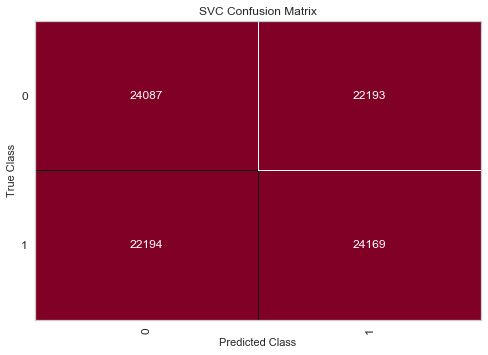

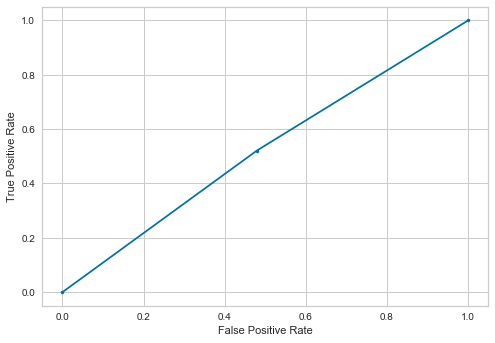

(52.08812322571592,
 52.08808573585571,
 52.13105560588412,
 52.12993119513405,
 52.13049339444594,
 16.54836753242737)

In [6]:
SVM_classifier(sc,'target',kernel='sigmoid')

(185286, 11)
(185286,)
Accuracy  (%): 
 52.74980300724286
AUC  (%): 
 52.77178696163609
Precision: 
 55.487262091475564
Recall (%): 
 28.23372085499213
f1 score (%): 
 37.42459330417132
logistic loss :
 16.31973051912648
              precision    recall  f1-score   support

           0       0.52      0.77      0.62     46280
           1       0.55      0.28      0.37     46363

    accuracy                           0.53     92643
   macro avg       0.54      0.53      0.50     92643
weighted avg       0.54      0.53      0.50     92643



E:\ProgramData\Anaconda3\lib\site-packages\sklearn\base.py:213: FutureWarning: From version 0.24, get_params will raise an AttributeError if a parameter cannot be retrieved as an instance attribute. Previously it would return None.
  FutureWarning)


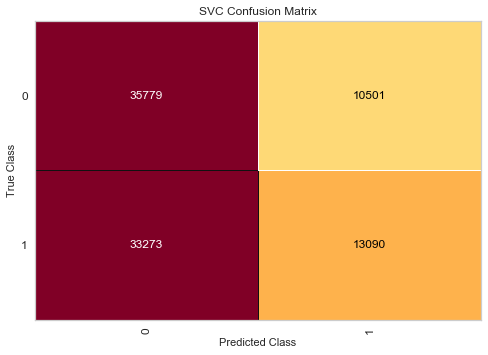

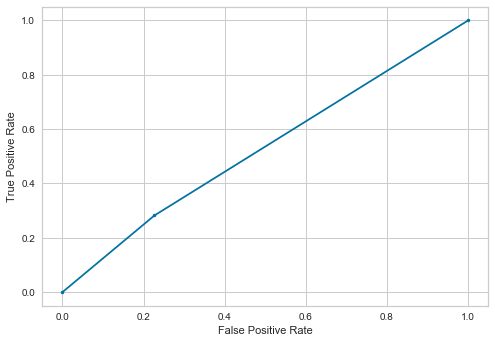

(52.74980300724286,
 52.77178696163609,
 55.487262091475564,
 28.23372085499213,
 37.42459330417132,
 16.31973051912648)

In [7]:

x=np.asarray(df3.drop(['return'],axis=1))
y=np.asarray(df3['return'])
from sklearn.preprocessing import StandardScaler
ss=StandardScaler()
x = ss.fit_transform(x)
from imblearn.under_sampling import RandomUnderSampler
ros = RandomUnderSampler(random_state=0)
x,y = ros.fit_resample(x,y)
print(x.shape)
print(y.shape)
from sklearn.decomposition import PCA
pca=PCA(n_components=4)
x = pca.fit_transform(x)
sc= pd.DataFrame({'var1':x[:,0],'var2':x[:,1],'var3':x[:,2],'var4':x[:,3], 'target':y})
SVM_classifier(sc,'target')

(185286, 11)
(185286,)
Accuracy  (%): 
 58.67793573178761
AUC  (%): 
 58.6650638815774
Precision: 
 56.77492915709519
Recall (%): 
 73.03237495416603
f1 score (%): 
 63.88558706439501
logistic loss :
 14.272357876710858
              precision    recall  f1-score   support

           0       0.62      0.44      0.52     46280
           1       0.57      0.73      0.64     46363

    accuracy                           0.59     92643
   macro avg       0.59      0.59      0.58     92643
weighted avg       0.59      0.59      0.58     92643



E:\ProgramData\Anaconda3\lib\site-packages\sklearn\base.py:213: FutureWarning: From version 0.24, get_params will raise an AttributeError if a parameter cannot be retrieved as an instance attribute. Previously it would return None.
  FutureWarning)


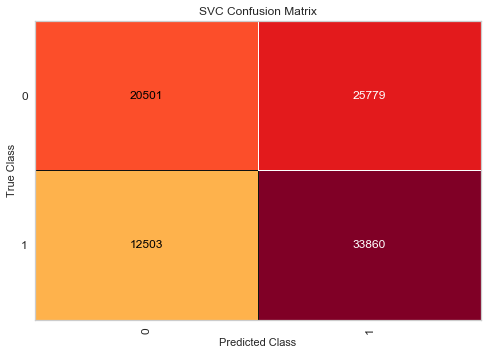

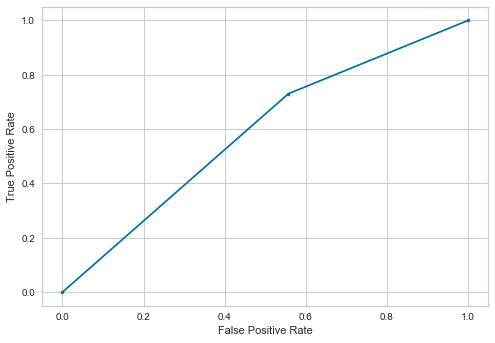

(58.67793573178761,
 58.6650638815774,
 56.77492915709519,
 73.03237495416603,
 63.88558706439501,
 14.272357876710858)

In [8]:

x=np.asarray(df3.drop(['return'],axis=1))
y=np.asarray(df3['return'])
from sklearn.preprocessing import StandardScaler
ss=StandardScaler()
x = ss.fit_transform(x)
from imblearn.under_sampling import RandomUnderSampler
ros = RandomUnderSampler(random_state=0)
x,y = ros.fit_resample(x,y)
print(x.shape)
print(y.shape)
from sklearn.decomposition import PCA
pca=PCA(n_components=4)
x = pca.fit_transform(x)
sc= pd.DataFrame({'var1':x[:,0],'var2':x[:,1],'var3':x[:,2],'var4':x[:,3], 'target':y})
SVM_classifier(sc,'target',kernel='rbf')

Using 4 components has decreased recall score

(454804, 11)
(454804,)


E:\ProgramData\Anaconda3\lib\site-packages\sklearn\utils\deprecation.py:143: FutureWarning: The sklearn.metrics.classification module is  deprecated in version 0.22 and will be removed in version 0.24. The corresponding classes / functions should instead be imported from sklearn.metrics. Anything that cannot be imported from sklearn.metrics is now part of the private API.
  warnings.warn(message, FutureWarning)


Accuracy  (%): 
 79.65277350243181
AUC  (%): 
 50.05619608452098
Precision: 
 44.0
Recall (%): 
 0.1664900862721356
f1 score (%): 
 0.33172496984318456
logistic loss :
 7.027683407151501
              precision    recall  f1-score   support

           0       0.80      1.00      0.89    181153
           1       0.44      0.00      0.00     46249

    accuracy                           0.80    227402
   macro avg       0.62      0.50      0.45    227402
weighted avg       0.72      0.80      0.71    227402



E:\ProgramData\Anaconda3\lib\site-packages\sklearn\base.py:213: FutureWarning: From version 0.24, get_params will raise an AttributeError if a parameter cannot be retrieved as an instance attribute. Previously it would return None.
  FutureWarning)


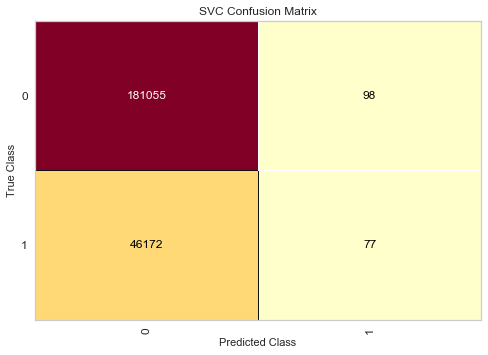

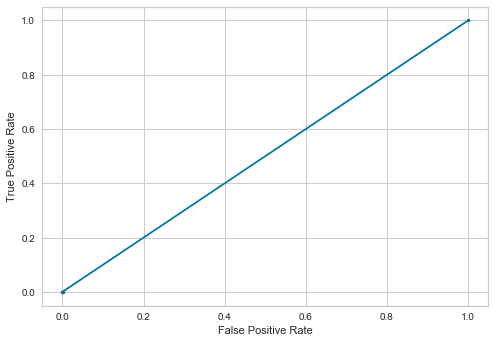

(79.65277350243181,
 50.05619608452098,
 44.0,
 0.1664900862721356,
 0.33172496984318456,
 7.027683407151501)

In [4]:
x=np.asarray(df3.drop(['return'],axis=1))
y=np.asarray(df3['return'])
from sklearn.preprocessing import StandardScaler
ss=StandardScaler()
x = ss.fit_transform(x)
from imblearn.under_sampling import RandomUnderSampler
#ros = RandomUnderSampler(random_state=0)
#x,y = ros.fit_resample(x,y)
print(x.shape)
print(y.shape)
from sklearn.decomposition import PCA
pca=PCA(n_components=3)
x = pca.fit_transform(x)
sc= pd.DataFrame({'var1':x[:,0],'var2':x[:,1],'var3':x[:,2], 'target':y})
SVM_classifier(sc,'target',kernel='rbf')

Without undersampling SVM fails to detect any pattern.

SVM is the performing best when components are 3 and data is undersampled. 

### Regularization of SVM/hyperparamter tuning

For SVM classifier with rbf kernel, C acts as a regularization parameter. https://scikit-learn.org/stable/auto_examples/svm/plot_rbf_parameters.html

In [4]:
import time
from sklearn.model_selection import GridSearchCV as gs
from sklearn.metrics import accuracy_score, confusion_matrix,precision_score, recall_score, roc_auc_score,roc_curve, auc, f1_score 

In [6]:
#C_range = np.linspace(0.1, 100, 10)

x=np.asarray(df3.drop(['return'],axis=1))
y=np.asarray(df3['return'])
from sklearn.preprocessing import StandardScaler
from sklearn import svm

ss=StandardScaler()
x = ss.fit_transform(x)
from imblearn.under_sampling import RandomUnderSampler
ros = RandomUnderSampler(random_state=0)
x,y = ros.fit_resample(x,y)
print(x.shape)
print(y.shape)
from sklearn.decomposition import PCA
pca=PCA(n_components=3)
x = pca.fit_transform(x)
sc= pd.DataFrame({'var1':x[:,0],'var2':x[:,1],'var3':x[:,2], 'target':y})
X=sc.drop(['target'],axis=1)
Y=sc['target']
from sklearn.preprocessing import StandardScaler
ss=StandardScaler()
for i in X.columns:
    X[i] = ss.fit_transform(X[[i]])
from sklearn.model_selection import train_test_split
xtrain , xtest , ytrain, ytest =train_test_split(X,Y,test_size=0.20,random_state=42 )
parameters = {'C': [0.1,1,100] }
clf_svm=svm.SVC(kernel='rbf')
clf=gs(clf_svm,parameters,cv=3)
t_start = time.clock()
clf.fit(xtrain, ytrain)
predictions = clf.predict(xtest)
t_end = time.clock()
t_diff = t_end - t_start
print(t_diff,'seconds')

(185286, 11)
(185286,)


E:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:30: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


5782.9730145 seconds


E:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:33: DeprecationWarning: time.clock has been deprecated in Python 3.3 and will be removed from Python 3.8: use time.perf_counter or time.process_time instead


In [7]:
print("Accuracy  (%): \n", accuracy_score(ytest, predictions)*100)
fpr2 , tpr2, _ = roc_curve(ytest, predictions)
print("AUC  (%): \n",auc(fpr2, tpr2)*100)
print("Precision: \n",precision_score(ytest, predictions)*100)
print("Recall (%): \n",recall_score(ytest, predictions)*100)
print("f1 score (%): \n",f1_score(ytest, predictions)*100)
print("Best Score (%): \n",clf.best_score_*100)
print("Best Parametres : \n", clf.best_params_)
print("Best Estimator : \n", clf.best_estimator_)

Accuracy  (%): 
 60.28118085163797
AUC  (%): 
 60.24449455592891
Precision: 
 57.129065795336395
Recall (%): 
 82.90317366237406
f1 score (%): 
 67.64414939218747
Best Score (%): 
 59.97449576042387
Best Parametres : 
 {'C': 100}
Best Estimator : 
 SVC(C=100)


Value of hundred for regularization parameter has produced a recall value of 83. Although the value is few points less than when SVM under default conditions is used but since CV is also done automatically in grid search therefore SVM with rbf kernel and C=100 can be finalized. The trained model will be stored in the form a .pkl file which can then be instaneously used to produce predictions

In [44]:
def SVM_classifier(df,label, svmtype="SVC",kernel='poly',name=None,over_sample=False,under_sample=False,clf=None,min_max=False):
    import pandas as pd
    import numpy as np
    from sklearn import metrics
    from sklearn.metrics import classification_report
    from sklearn.metrics import f1_score
    from sklearn.metrics import accuracy_score
    from sklearn.metrics import precision_score
    from sklearn.metrics import recall_score
    from sklearn.metrics import roc_curve
    from sklearn.metrics import roc_auc_score
    from sklearn import svm
    from sklearn.metrics import auc 
    from sklearn.metrics import log_loss
    from matplotlib import pyplot
    from yellowbrick.classifier import ConfusionMatrix
    if not clf:
        if svmtype == "Linear":
            clf = svm.LinearSVC()
        else:
            clf = svm.SVC(kernel=kernel,C=100)# The value of C has been updated after regularization
    from sklearn.preprocessing import StandardScaler
    x=df.drop([label], axis=1)
    y=df[label]
    if min_max==True:
        from sklearn.preprocessing import MinMaxScaler
        mm = MinMaxScaler()
        for i in x.columns:
            x[i] = mm.fit_transform(x[[i]])
    else:
        from sklearn.preprocessing import StandardScaler
        ss=StandardScaler()
        for i in x.columns:
            x[i] = ss.fit_transform(x[[i]])
    if over_sample==True:
        from imblearn.over_sampling import RandomOverSampler
        oversample = RandomOverSampler(sampling_strategy=0.5)
        from sklearn.model_selection import train_test_split
        xtrain , xtest , ytrain, ytest =train_test_split(x,y,test_size=0.20,random_state=42 )
        x_res, y_res = oversample.fit_resample(xtrain, ytrain)
        x_train=x_res
        y_train=y_res
    elif under_sample==True:
        from imblearn.under_sampling import RandomUnderSampler
        undersample = RandomUnderSampler(sampling_strategy=0.5)
        from sklearn.model_selection import train_test_split
        xtrain , xtest , ytrain, ytest =train_test_split(x,y,test_size=0.20,random_state=42 )
        x_res, y_res = undersample.fit_resample(xtrain, ytrain)
        x_train=x_res
        y_train=y_res
    else:
        from sklearn.model_selection import train_test_split
        xtrain , xtest , ytrain, ytest =train_test_split(x,y,test_size=0.20,random_state=42 )

    clf.fit(xtrain,ytrain)
    y_pred=clf.predict(xtest)
    print("Accuracy  (%): \n", accuracy_score(ytest, y_pred)*100)
    accuracy=accuracy_score(ytest, y_pred)*100
    fpr , tpr, _ = roc_curve(ytest, y_pred)
    print("AUC  (%): \n",auc(fpr, tpr)*100)
    AUC=auc(fpr, tpr)*100
    print("Precision: \n",precision_score(ytest, y_pred)*100)
    precision=precision_score(ytest, y_pred)*100
    print("Recall (%): \n",recall_score(ytest, y_pred)*100)
    recall=recall_score(ytest,y_pred)*100
    print("f1 score (%): \n",f1_score(ytest, y_pred)*100)
    f1=f1_score(ytest,y_pred)*100
    print('logistic loss :\n',log_loss(ytest,y_pred))
    log=log_loss(ytest,y_pred)
    print(classification_report(ytest,y_pred))
    #print(confusion_matrix(ytest, y_pred))
    visualizer = ConfusionMatrix(clf)
    visualizer.fit(xtrain, ytrain)  
    visualizer.score(xtest,ytest)
    g = visualizer.poof()
    pyplot.plot(fpr, tpr, marker='.')
    pyplot.xlabel('False Positive Rate')
    pyplot.ylabel('True Positive Rate')
    pyplot.show()
    import pickle
    filename = name
    pickle.dump(clf, open(filename, 'wb'))
    return accuracy,AUC,precision,recall,f1,log

(185286, 11)
(185286,)
Accuracy  (%): 
 60.28118085163797
AUC  (%): 
 60.24449455592891
Precision: 
 57.129065795336395
Recall (%): 
 82.90317366237406
f1 score (%): 
 67.64414939218747
logistic loss :
 13.718643259447873
              precision    recall  f1-score   support

           0       0.69      0.38      0.49     18499
           1       0.57      0.83      0.68     18559

    accuracy                           0.60     37058
   macro avg       0.63      0.60      0.58     37058
weighted avg       0.63      0.60      0.58     37058



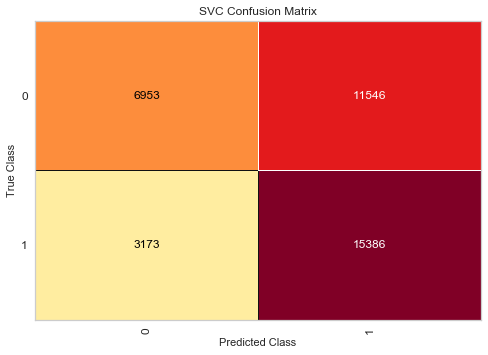

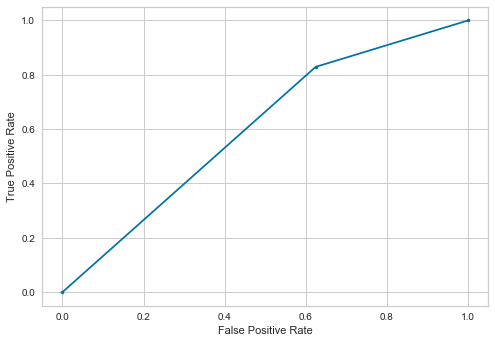

(60.28118085163797,
 60.24449455592891,
 57.129065795336395,
 82.90317366237406,
 67.64414939218747,
 13.718643259447873)

In [45]:
x=np.asarray(df3.drop(['return'],axis=1))
y=np.asarray(df3['return'])
from sklearn.preprocessing import StandardScaler
ss=StandardScaler()
x = ss.fit_transform(x)
from imblearn.under_sampling import RandomUnderSampler
ros = RandomUnderSampler(random_state=0)
x,y = ros.fit_resample(x,y)
print(x.shape)
print(y.shape)
from sklearn.decomposition import PCA
pca=PCA(n_components=3)
x = pca.fit_transform(x)
sc= pd.DataFrame({'var1':x[:,0],'var2':x[:,1],'var3':x[:,2], 'target':y})
SVM_classifier(sc,'target',kernel='rbf',name='SVM_model.pkl')

#### Solution achieved through this model

The model which has been trained can now solve the problem of return of items for the b2b ecommerce start up. The startup can now predict which item is going to be returned before hand as a result they can prioritize deliveries and efficiently channel resources available for delivery of orders.

No model can last forever. Similarly this model will have to be re-trained periodically to best captrue changing customer patterns. The ground work has been done through the notebooks and now it is just a matter of re-running the entire code for re-training.